# 116

## Plot básico

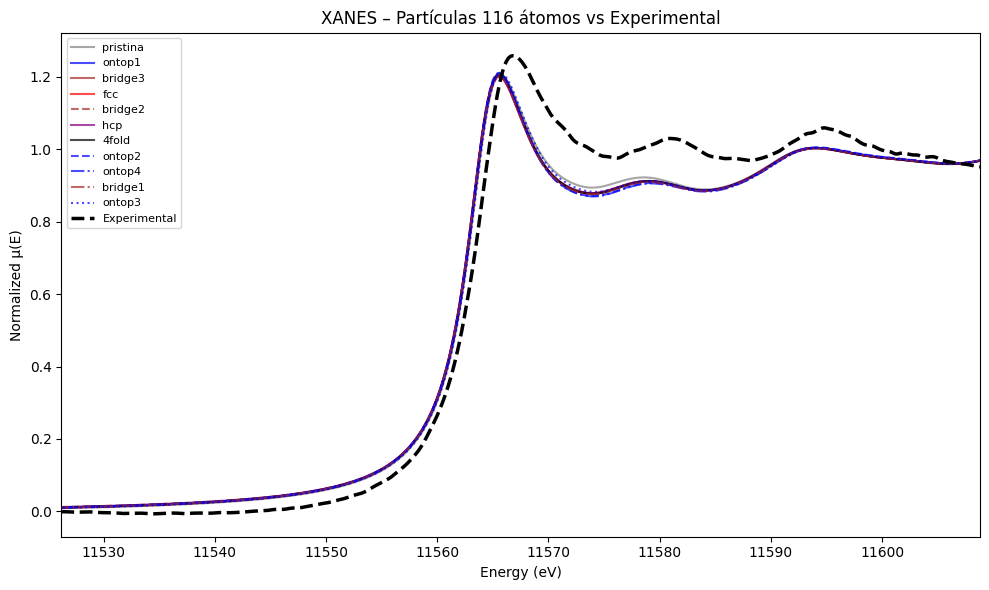


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.066753
ontop1     : RMSE = 0.074184
bridge3    : RMSE = 0.074315
fcc        : RMSE = 0.074328
bridge2    : RMSE = 0.073173
hcp        : RMSE = 0.073967
4fold      : RMSE = 0.073099
ontop2     : RMSE = 0.075448
ontop4     : RMSE = 0.075217
bridge1    : RMSE = 0.074513
ontop3     : RMSE = 0.069077

Top 3 μ(E):
1. pristina   (RMSE = 0.066753)
2. ontop3     (RMSE = 0.069077)
3. 4fold      (RMSE = 0.073099)


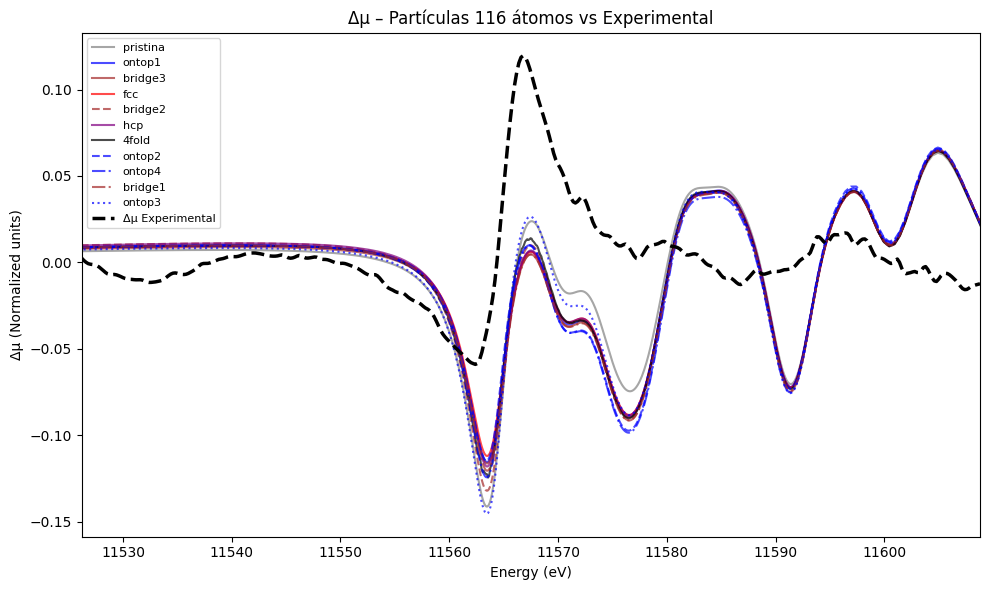


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.044116
ontop1     : RMSE = 0.047412
bridge3    : RMSE = 0.047611
fcc        : RMSE = 0.047001
bridge2    : RMSE = 0.048366
hcp        : RMSE = 0.047417
4fold      : RMSE = 0.046896
ontop2     : RMSE = 0.048259
ontop4     : RMSE = 0.048920
bridge1    : RMSE = 0.048265
ontop3     : RMSE = 0.046356

Top 3 Δμ:
1. pristina   (RMSE = 0.044116)
2. ontop3     (RMSE = 0.046356)
3. 4fold      (RMSE = 0.046896)


In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Caminhos
THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário
site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

# Lista de cores personalizável (mesma cor para tipos iguais)
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}

# Lista de estilos de linha para variantes
linestyles = ['-', '--', '-.', ':']

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

exp_x = exp_particle[:, 0]
exp_y_particle = exp_particle[:, 1]
exp_y_bulk = exp_bulk[:, 1]
delta_exp = exp_y_bulk - exp_y_particle  # Δμ experimental

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]  # coluna Final_normalized

# Lê o que simulei
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

# Figura 1: plots μ(E)
plt.figure(figsize=(10, 6))
rmse_mu = {}  # Armazena RMSE das curvas μ(E)

# Contador de variantes para estilo de linha
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Interpola para o eixo experimental
    y_interp = np.interp(exp_x, x, y)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_mu[label] = rmse

    # Define cor e estilo de linha
    base_label = ''.join([c for c in label if not c.isdigit()])  # Remove números para agrupar variantes
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(x, y, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 116 átomos vs Experimental")
plt.xlim(min(exp_x), max(exp_x))
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_mu = sorted(rmse_mu.items(), key=lambda x: x[1])[:3]
print("\nTop 3 μ(E):")
for i, (label, rmse) in enumerate(top3_mu, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")

# Figura 2: Δμ
plt.figure(figsize=(10, 6))
rmse_delta = {}  # Armazena RMSE das curvas Δμ
variant_count = {}  # Reinicia contador para estilos

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Interpola bulk_y
    bulk_interp = np.interp(x, bulk_x, bulk_y)
    delta_mu = y - bulk_interp
    delta_interp = np.interp(exp_x, x, delta_mu)
    rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_delta[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(x, delta_mu, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 116 átomos vs Experimental")
plt.xlim(min(exp_x), max(exp_x))
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
print("\nTop 3 Δμ:")
for i, (label, rmse) in enumerate(top3_delta, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


## Novos dados experimentais

### MoS2 

In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt


def new_experimental_116(EXP_PARTICLE, EXP_BULK, energy_min=None, energy_max=None):
    """
    Compara espectros teóricos (116 átomos) com dados experimentais.
    Agora inclui:
      - interpolação correta entre espectros experimentais
      - corte opcional de energia (energy_min, energy_max)
    """

    THEORY_DIR = "normalized/116"
    BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"

    # Dicionário
    site_labels_116 = {
        '00': 'pristina',
        '01': 'ontop1',
        '02': 'bridge3',
        '03': 'fcc',
        '04': 'bridge2',
        '05': 'hcp',
        '06': '4fold',
        '07': 'ontop2',
        '08': 'ontop4',
        '09': 'bridge1',
        '10': 'ontop3',
    }

    # Cores
    color_dict = {
        'pristina': 'gray',
        'ontop': 'b',
        'bridge': 'brown',
        'fcc': 'r',
        'hcp': 'purple',
        '4fold': 'pink',
    }

    linestyles = ['-', '--', '-.', ':']

    # === Lê experimental ===
    exp_particle = np.loadtxt(EXP_PARTICLE)
    exp_bulk = np.loadtxt(EXP_BULK)

    # Interpola o bulk para o eixo da partícula
    exp_x = exp_particle[:, 0]
    exp_y_particle = exp_particle[:, 1]
    exp_y_bulk_interp = np.interp(exp_x, exp_bulk[:, 0], exp_bulk[:, 1])
    delta_exp = exp_y_bulk_interp - exp_y_particle  # Δμ experimental

    # === Aplica corte de energia se solicitado ===
    if energy_min is not None or energy_max is not None:
        mask = np.ones_like(exp_x, dtype=bool)
        if energy_min is not None:
            mask &= exp_x >= energy_min
        if energy_max is not None:
            mask &= exp_x <= energy_max

        exp_x = exp_x[mask]
        exp_y_particle = exp_y_particle[mask]
        delta_exp = delta_exp[mask]

    # === Lê Pt_bulk ===
    bulk_data = np.loadtxt(BULK_FILE, comments="#")
    bulk_x = bulk_data[:, 0]
    bulk_y = bulk_data[:, 4]

    # === Arquivos teóricos ===
    theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

    # === Figura 1: μ(E) ===
    plt.figure(figsize=(10, 6))
    rmse_mu = {}
    variant_count = {}

    for f in theory_files:
        data = np.loadtxt(f, comments="#")
        x = data[:, 0]
        y = data[:, 4]

        # Interpola e corta para faixa de energia
        y_interp = np.interp(exp_x, x, y)
        rmse = np.sqrt(np.mean((y_interp - exp_y_particle) ** 2))

        site_code = os.path.basename(f).split("_")[1]
        label = site_labels_116.get(site_code, site_code)
        rmse_mu[label] = rmse

        base_label = ''.join([c for c in label if not c.isdigit()])
        color = color_dict.get(base_label, 'black')
        variant_count.setdefault(base_label, 0)
        linestyle = linestyles[variant_count[base_label] % len(linestyles)]
        variant_count[base_label] += 1

        plt.plot(x, y, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

    plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")

    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized μ(E)")
    plt.title("XANES – Partículas 116 átomos vs Experimental")
    plt.xlim(min(exp_x), max(exp_x))
    plt.legend(fontsize=8, loc="best")
    plt.tight_layout()
    plt.show()

    print("\n=== RMSE das curvas μ(E) ===")
    for label, rmse in rmse_mu.items():
        print(f"{label:10s} : RMSE = {rmse:.6f}")
    top3_mu = sorted(rmse_mu.items(), key=lambda x: x[1])[:3]
    print("\nTop 3 μ(E):")
    for i, (label, rmse) in enumerate(top3_mu, 1):
        print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")

    # === Figura 2: Δμ ===
    plt.figure(figsize=(10, 6))
    rmse_delta = {}
    variant_count = {}

    for f in theory_files:
        data = np.loadtxt(f, comments="#")
        x = data[:, 0]
        y = data[:, 4]

        # Calcula Δμ teórico
        bulk_interp = np.interp(x, bulk_x, bulk_y)
        delta_mu = y - bulk_interp
        delta_interp = np.interp(exp_x, x, delta_mu)

        rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))
        site_code = os.path.basename(f).split("_")[1]
        label = site_labels_116.get(site_code, site_code)
        rmse_delta[label] = rmse

        base_label = ''.join([c for c in label if not c.isdigit()])
        color = color_dict.get(base_label, 'black')
        variant_count.setdefault(base_label, 0)
        linestyle = linestyles[variant_count[base_label] % len(linestyles)]
        variant_count[base_label] += 1

        plt.plot(x, delta_mu, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

    plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

    plt.xlabel("Energy (eV)")
    plt.ylabel("Δμ (Normalized units)")
    plt.title("Δμ – Partículas 116 átomos vs Experimental")
    plt.xlim(min(exp_x), max(exp_x))
    plt.legend(fontsize=8, loc="best")
    plt.tight_layout()
    plt.show()

    print("\n=== RMSE das curvas Δμ ===")
    for label, rmse in rmse_delta.items():
        print(f"{label:10s} : RMSE = {rmse:.6f}")
    top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
    print("\nTop 3 Δμ:")
    for i, (label, rmse) in enumerate(top3_delta, 1):
        print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


Arquivo: normalized/new_experimental/interp_Pt_MoS_Iso_330mV_norm.txt


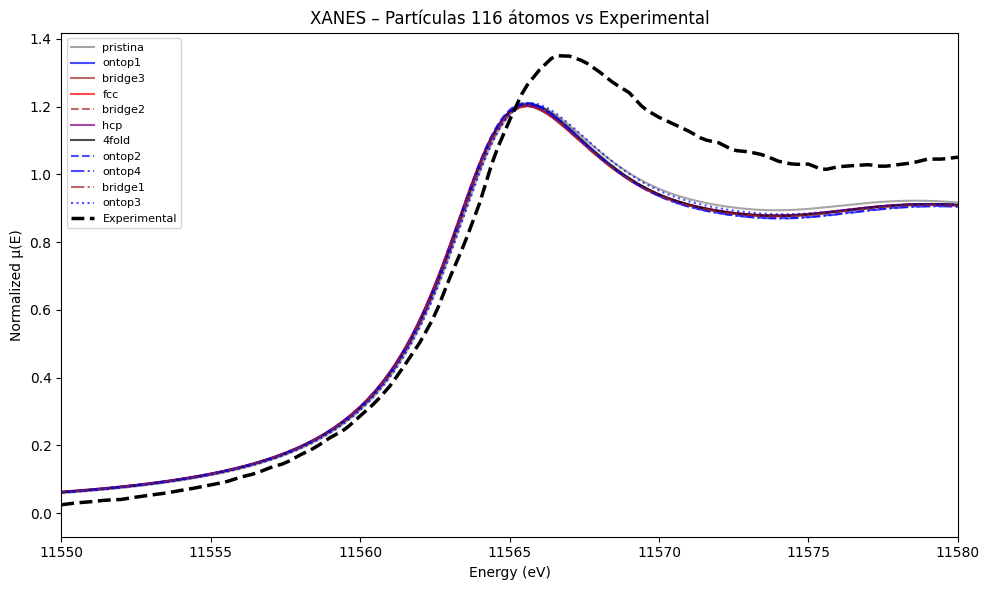


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.119372
ontop1     : RMSE = 0.131541
bridge3    : RMSE = 0.132048
fcc        : RMSE = 0.131345
bridge2    : RMSE = 0.130097
hcp        : RMSE = 0.130878
4fold      : RMSE = 0.129556
ontop2     : RMSE = 0.133634
ontop4     : RMSE = 0.133298
bridge1    : RMSE = 0.132275
ontop3     : RMSE = 0.123160

Top 3 μ(E):
1. pristina   (RMSE = 0.119372)
2. ontop3     (RMSE = 0.123160)
3. 4fold      (RMSE = 0.129556)


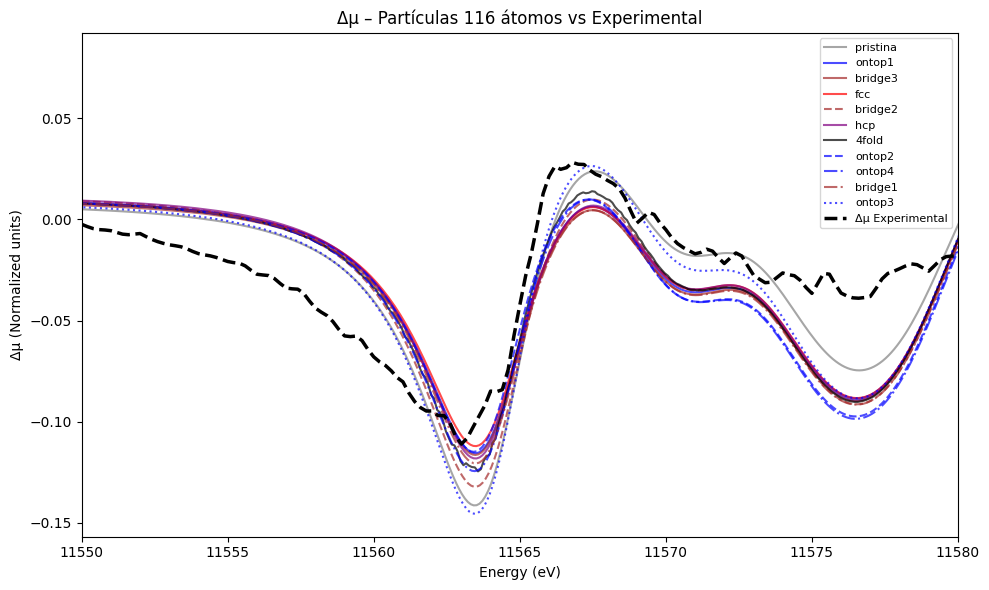


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.021662
ontop1     : RMSE = 0.027866
bridge3    : RMSE = 0.027895
fcc        : RMSE = 0.027587
bridge2    : RMSE = 0.028231
hcp        : RMSE = 0.027799
4fold      : RMSE = 0.026861
ontop2     : RMSE = 0.029826
ontop4     : RMSE = 0.030153
bridge1    : RMSE = 0.028671
ontop3     : RMSE = 0.025433

Top 3 Δμ:
1. pristina   (RMSE = 0.021662)
2. ontop3     (RMSE = 0.025433)
3. 4fold      (RMSE = 0.026861)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_160mV_norm.txt


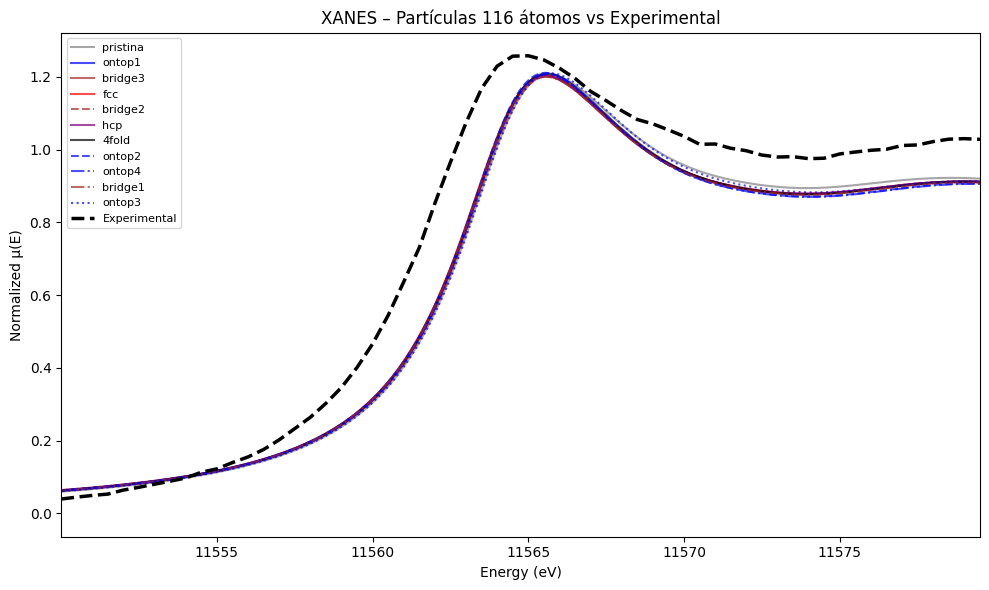


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.119871
ontop1     : RMSE = 0.118027
bridge3    : RMSE = 0.118736
fcc        : RMSE = 0.116888
bridge2    : RMSE = 0.122092
hcp        : RMSE = 0.118185
4fold      : RMSE = 0.119859
ontop2     : RMSE = 0.119688
ontop4     : RMSE = 0.122289
bridge1    : RMSE = 0.119957
ontop3     : RMSE = 0.123424

Top 3 μ(E):
1. fcc        (RMSE = 0.116888)
2. ontop1     (RMSE = 0.118027)
3. hcp        (RMSE = 0.118185)


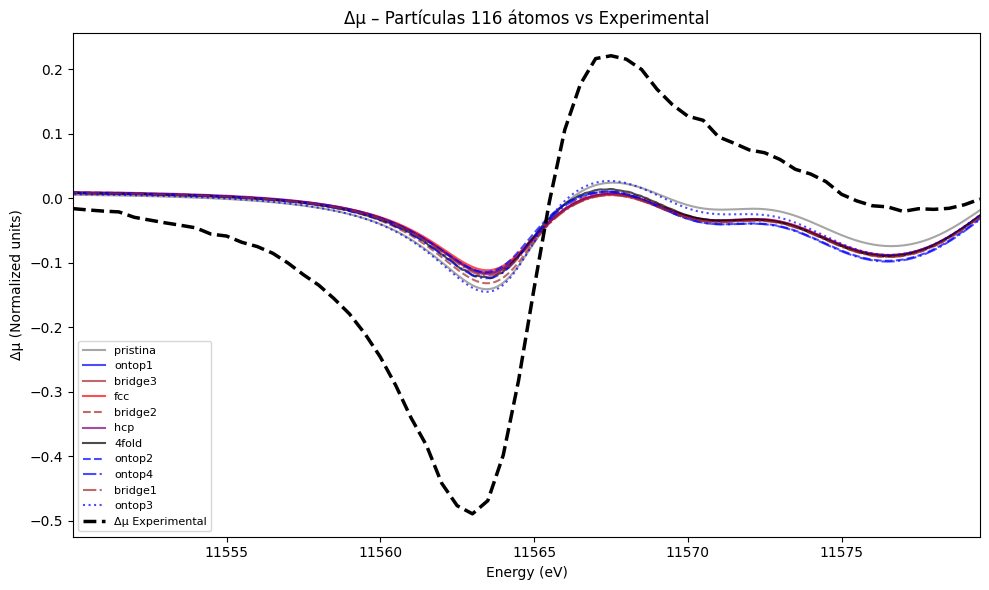


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.150455
ontop1     : RMSE = 0.162597
bridge3    : RMSE = 0.162492
fcc        : RMSE = 0.163207
bridge2    : RMSE = 0.158425
hcp        : RMSE = 0.161934
4fold      : RMSE = 0.159373
ontop2     : RMSE = 0.163413
ontop4     : RMSE = 0.161243
bridge1    : RMSE = 0.161903
ontop3     : RMSE = 0.151188

Top 3 Δμ:
1. pristina   (RMSE = 0.150455)
2. ontop3     (RMSE = 0.151188)
3. bridge2    (RMSE = 0.158425)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_261mV_norm.txt


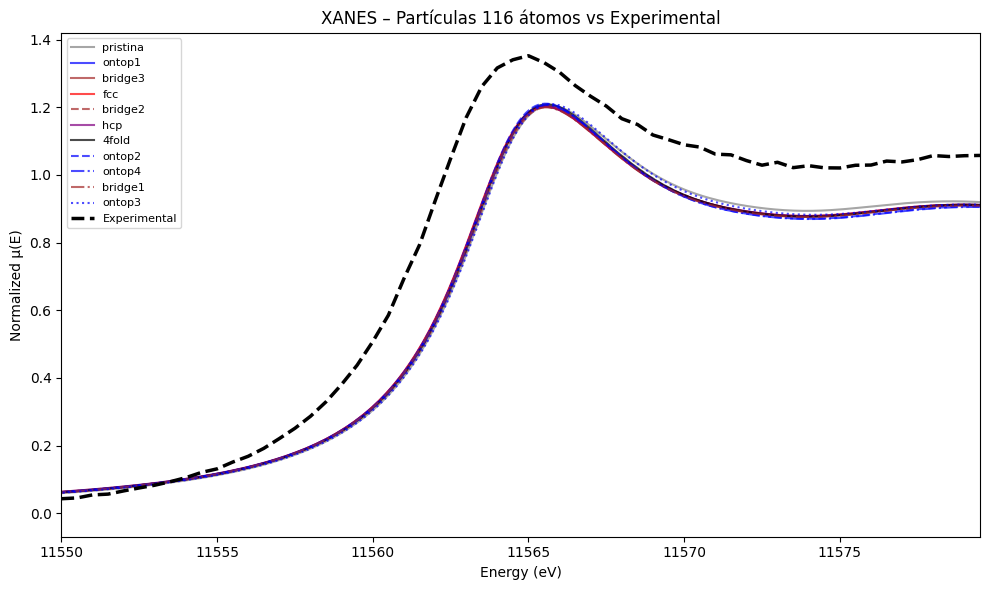


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.163572
ontop1     : RMSE = 0.162714
bridge3    : RMSE = 0.163506
fcc        : RMSE = 0.161587
bridge2    : RMSE = 0.166590
hcp        : RMSE = 0.162850
4fold      : RMSE = 0.164129
ontop2     : RMSE = 0.164092
ontop4     : RMSE = 0.166732
bridge1    : RMSE = 0.164731
ontop3     : RMSE = 0.167061

Top 3 μ(E):
1. fcc        (RMSE = 0.161587)
2. ontop1     (RMSE = 0.162714)
3. hcp        (RMSE = 0.162850)


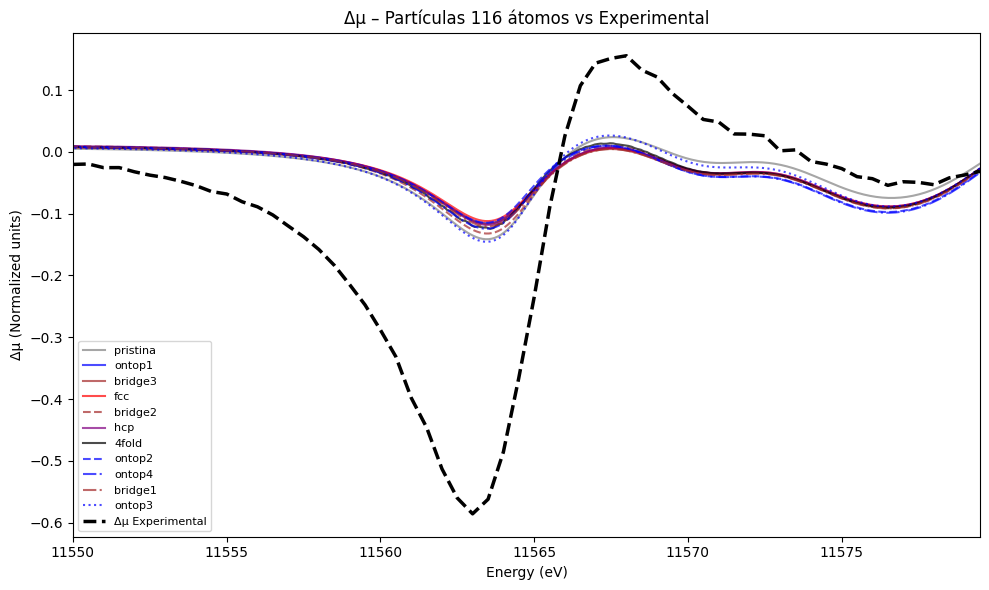


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.167387
ontop1     : RMSE = 0.177934
bridge3    : RMSE = 0.177584
fcc        : RMSE = 0.178763
bridge2    : RMSE = 0.173267
hcp        : RMSE = 0.177308
4fold      : RMSE = 0.174918
ontop2     : RMSE = 0.178524
ontop4     : RMSE = 0.175849
bridge1    : RMSE = 0.176732
ontop3     : RMSE = 0.167186

Top 3 Δμ:
1. ontop3     (RMSE = 0.167186)
2. pristina   (RMSE = 0.167387)
3. bridge2    (RMSE = 0.173267)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_330mV_norm.txt


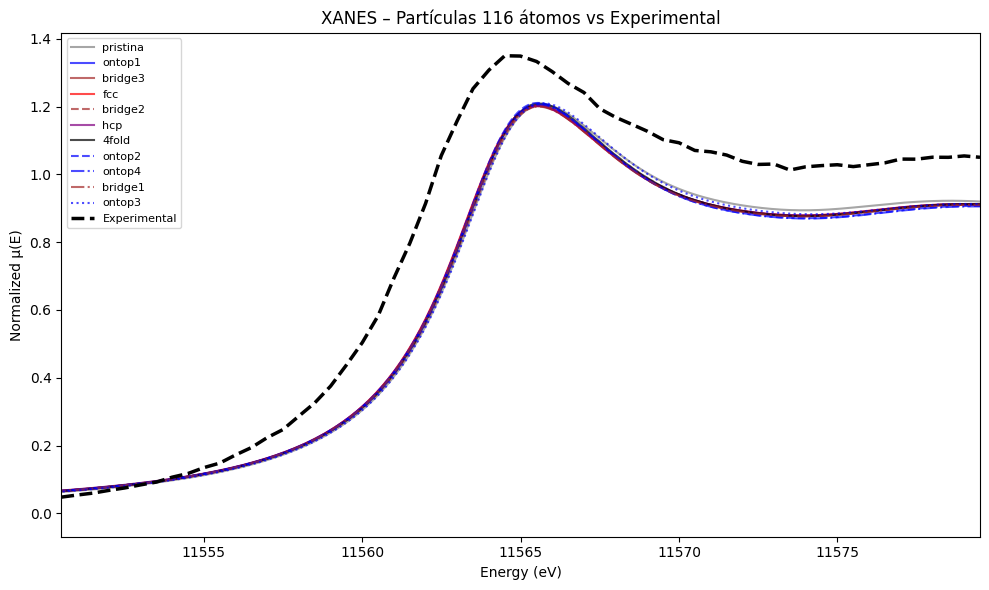


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.163449
ontop1     : RMSE = 0.162577
bridge3    : RMSE = 0.163382
fcc        : RMSE = 0.161443
bridge2    : RMSE = 0.166477
hcp        : RMSE = 0.162713
4fold      : RMSE = 0.163984
ontop2     : RMSE = 0.163948
ontop4     : RMSE = 0.166611
bridge1    : RMSE = 0.164613
ontop3     : RMSE = 0.166941

Top 3 μ(E):
1. fcc        (RMSE = 0.161443)
2. ontop1     (RMSE = 0.162577)
3. hcp        (RMSE = 0.162713)


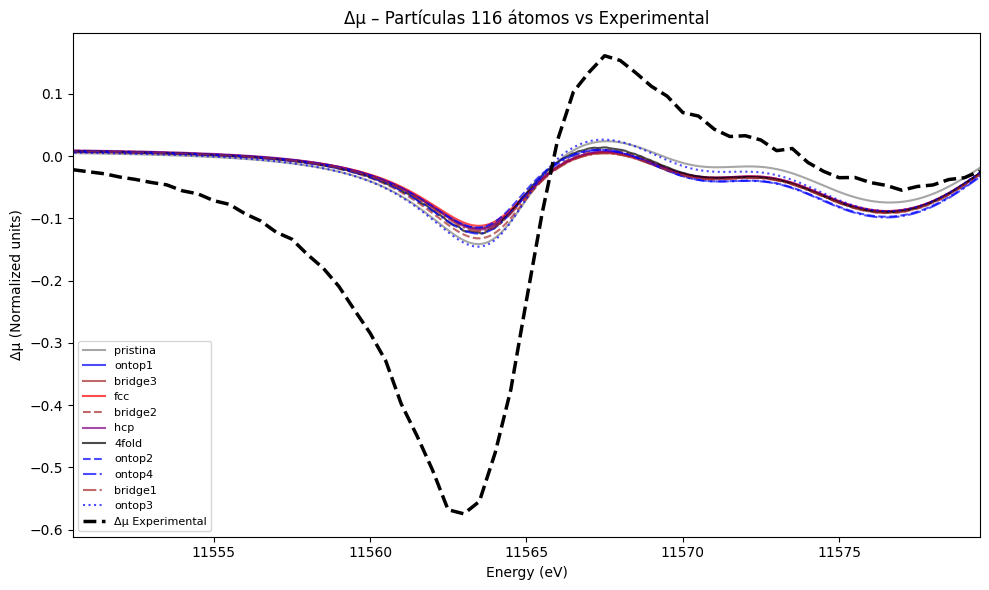


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.167701
ontop1     : RMSE = 0.178385
bridge3    : RMSE = 0.178036
fcc        : RMSE = 0.179216
bridge2    : RMSE = 0.173689
hcp        : RMSE = 0.177748
4fold      : RMSE = 0.175359
ontop2     : RMSE = 0.179014
ontop4     : RMSE = 0.176323
bridge1    : RMSE = 0.177182
ontop3     : RMSE = 0.167549

Top 3 Δμ:
1. ontop3     (RMSE = 0.167549)
2. pristina   (RMSE = 0.167701)
3. bridge2    (RMSE = 0.173689)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_OCP_norm.txt


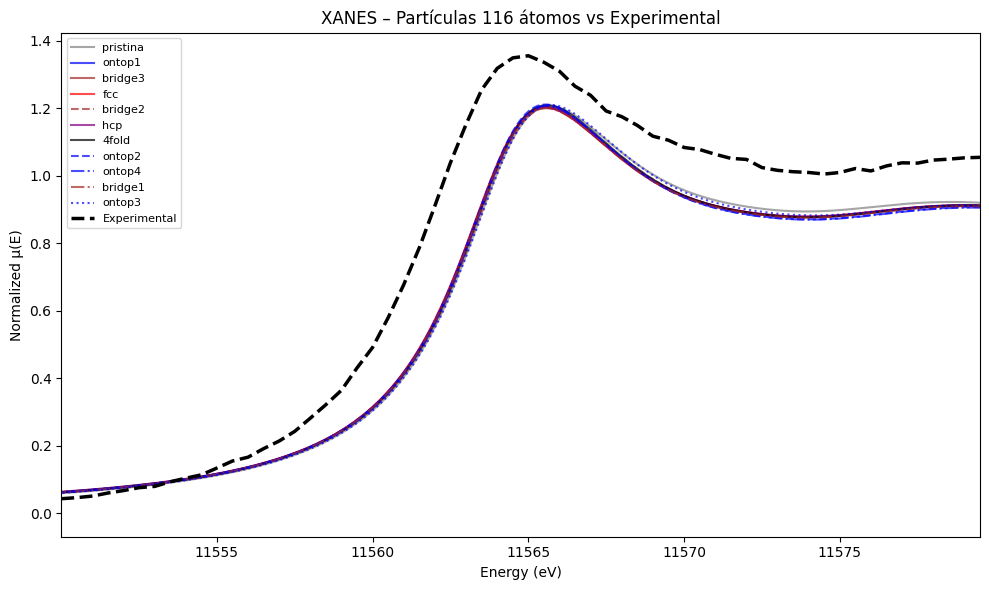


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.158387
ontop1     : RMSE = 0.157430
bridge3    : RMSE = 0.158224
fcc        : RMSE = 0.156304
bridge2    : RMSE = 0.161324
hcp        : RMSE = 0.157583
4fold      : RMSE = 0.158804
ontop2     : RMSE = 0.158718
ontop4     : RMSE = 0.161382
bridge1    : RMSE = 0.159456
ontop3     : RMSE = 0.161776

Top 3 μ(E):
1. fcc        (RMSE = 0.156304)
2. ontop1     (RMSE = 0.157430)
3. hcp        (RMSE = 0.157583)


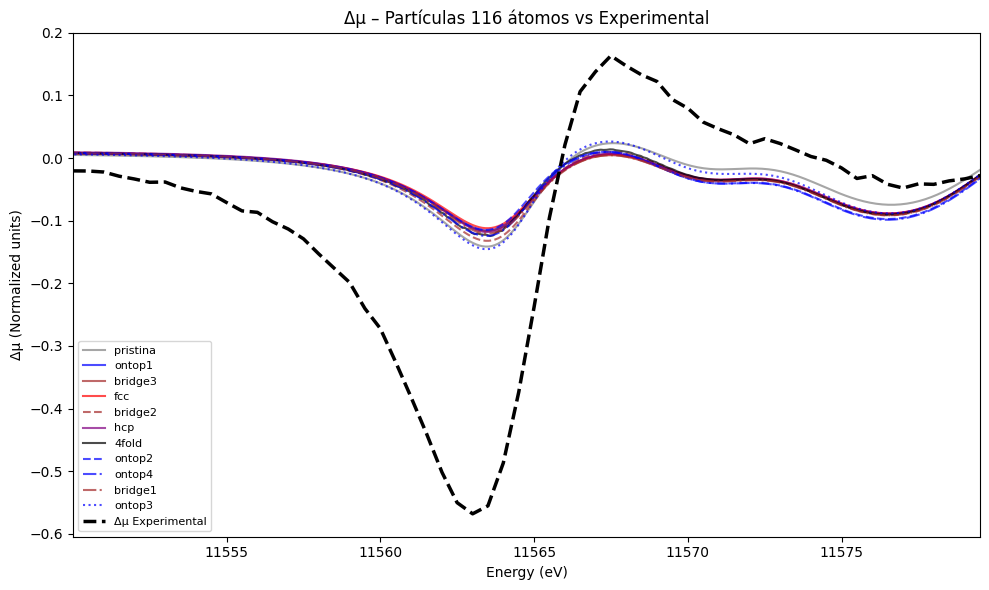


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.164145
ontop1     : RMSE = 0.174948
bridge3    : RMSE = 0.174615
fcc        : RMSE = 0.175756
bridge2    : RMSE = 0.170305
hcp        : RMSE = 0.174301
4fold      : RMSE = 0.171963
ontop2     : RMSE = 0.175671
ontop4     : RMSE = 0.173014
bridge1    : RMSE = 0.173778
ontop3     : RMSE = 0.164149

Top 3 Δμ:
1. pristina   (RMSE = 0.164145)
2. ontop3     (RMSE = 0.164149)
3. bridge2    (RMSE = 0.170305)


In [3]:
EXP_PARTICLEs = ["normalized/new_experimental/interp_Pt_MoS_Iso_330mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_160mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_261mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_330mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_OCP_norm.txt"
                ]
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"
for EXP_PARTICLE in EXP_PARTICLEs:
    print(f'Arquivo: {EXP_PARTICLE}')
    new_experimental_116(EXP_PARTICLE, EXP_BULK, energy_min=11550, energy_max=11580)

#### Suavizando experimental

In [4]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

def new_experimental_116(EXP_PARTICLE, EXP_BULK, energy_min=None, energy_max=None,
                         smooth=True, window_length=11, polyorder=3):
    """
    Compara espectros teóricos (116 átomos) com dados experimentais.
    Identifica automaticamente a coluna 'Final_normalized' em cada arquivo.
    """

    THEORY_DIR = "normalized/116"
    BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"

    site_labels_116 = {
        '00': 'pristina', '01': 'ontop1', '02': 'bridge3', '03': 'fcc',
        '04': 'bridge2', '05': 'hcp', '06': '4fold', '07': 'ontop2',
        '08': 'ontop4', '09': 'bridge1', '10': 'ontop3',
    }

    color_dict = {
        'pristina': 'gray', 'ontop': 'b', 'bridge': 'brown',
        'fcc': 'r', 'hcp': 'purple', '4fold': 'pink',
    }
    linestyles = ['-', '--', '-.', ':']

    def load_with_final_normalized(path):
        with open(path, 'r') as f:
            header = None
            for line in f:
                if line.strip().startswith('#'):
                    header = line.strip('#').strip().split()
                    break
        data = np.loadtxt(path, comments="#")
        if header and 'Final_normalized' in header:
            idx = header.index('Final_normalized')
        else:
            idx = 4  # fallback para a 4ª coluna se o cabeçalho não existir
        return data[:, 0], data[:, idx]

    exp_particle = np.loadtxt(EXP_PARTICLE)
    exp_bulk = np.loadtxt(EXP_BULK)
    exp_x = exp_particle[:, 0]
    exp_y_particle = exp_particle[:, 1]
    exp_y_bulk_interp = np.interp(exp_x, exp_bulk[:, 0], exp_bulk[:, 1])
    delta_exp = exp_y_bulk_interp - exp_y_particle

    if energy_min is not None or energy_max is not None:
        mask = np.ones_like(exp_x, dtype=bool)
        if energy_min is not None:
            mask &= exp_x >= energy_min
        if energy_max is not None:
            mask &= exp_x <= energy_max
        exp_x = exp_x[mask]
        exp_y_particle = exp_y_particle[mask]
        delta_exp = delta_exp[mask]

    if smooth:
        if window_length >= len(delta_exp):
            window_length = len(delta_exp) - 1 if len(delta_exp) % 2 == 0 else len(delta_exp)
        delta_exp_smooth = savgol_filter(delta_exp, window_length, polyorder)
    else:
        delta_exp_smooth = delta_exp

    bulk_x, bulk_y = load_with_final_normalized(BULK_FILE)
    theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

    plt.figure(figsize=(10, 6))
    rmse_mu = {}
    variant_count = {}

    for f in theory_files:
        x, y = load_with_final_normalized(f)
        y_interp = np.interp(exp_x, x, y)
        rmse = np.sqrt(np.mean((y_interp - exp_y_particle) ** 2))

        site_code = os.path.basename(f).split("_")[1]
        label = site_labels_116.get(site_code, site_code)
        rmse_mu[label] = rmse

        base_label = ''.join([c for c in label if not c.isdigit()])
        color = color_dict.get(base_label, 'black')
        variant_count.setdefault(base_label, 0)
        linestyle = linestyles[variant_count[base_label] % len(linestyles)]
        variant_count[base_label] += 1

        plt.plot(x, y, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

    plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Normalized μ(E)")
    plt.title("XANES – Partículas 116 átomos vs Experimental")
    plt.xlim(min(exp_x), max(exp_x))
    plt.legend(fontsize=8, loc="best")
    plt.tight_layout()
    plt.show()

    print("\n=== RMSE das curvas μ(E) ===")
    for label, rmse in rmse_mu.items():
        print(f"{label:10s} : RMSE = {rmse:.6f}")
    top3_mu = sorted(rmse_mu.items(), key=lambda x: x[1])[:3]
    print("\nTop 3 μ(E):")
    for i, (label, rmse) in enumerate(top3_mu, 1):
        print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")

    plt.figure(figsize=(10, 6))
    rmse_delta = {}
    variant_count = {}

    for f in theory_files:
        x, y = load_with_final_normalized(f)
        bulk_interp = np.interp(x, bulk_x, bulk_y)
        delta_mu = y - bulk_interp
        delta_interp = np.interp(exp_x, x, delta_mu)

        rmse = np.sqrt(np.mean((delta_interp - delta_exp_smooth) ** 2))
        site_code = os.path.basename(f).split("_")[1]
        label = site_labels_116.get(site_code, site_code)
        rmse_delta[label] = rmse

        base_label = ''.join([c for c in label if not c.isdigit()])
        color = color_dict.get(base_label, 'black')
        variant_count.setdefault(base_label, 0)
        linestyle = linestyles[variant_count[base_label] % len(linestyles)]
        variant_count[base_label] += 1

        plt.plot(x, delta_mu, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

    plt.plot(exp_x, delta_exp_smooth, color='black', linestyle='--', linewidth=2.5,
             label="Δμ Experimental (suavizado)" if smooth else "Δμ Experimental")
    plt.xlabel("Energy (eV)")
    plt.ylabel("Δμ (Normalized units)")
    plt.title("Δμ – Partículas 116 átomos vs Experimental")
    plt.xlim(min(exp_x), max(exp_x))
    plt.legend(fontsize=8, loc="best")
    plt.tight_layout()
    plt.show()

    print("\n=== RMSE das curvas Δμ ===")
    for label, rmse in rmse_delta.items():
        print(f"{label:10s} : RMSE = {rmse:.6f}")
    top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
    print("\nTop 3 Δμ:")
    for i, (label, rmse) in enumerate(top3_delta, 1):
        print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


##### Somente MoS2

Arquivo: normalized/new_experimental/interp_Pt_MoS_Iso_330mV_norm.txt


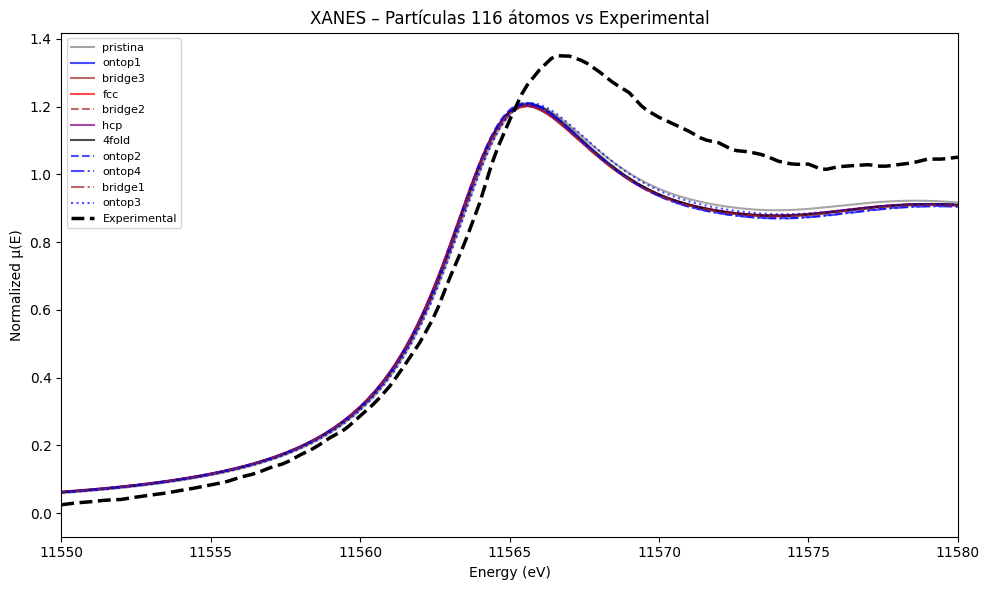


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.119372
ontop1     : RMSE = 0.131541
bridge3    : RMSE = 0.132048
fcc        : RMSE = 0.131345
bridge2    : RMSE = 0.130097
hcp        : RMSE = 0.130878
4fold      : RMSE = 0.129556
ontop2     : RMSE = 0.133634
ontop4     : RMSE = 0.133298
bridge1    : RMSE = 0.132275
ontop3     : RMSE = 0.123160

Top 3 μ(E):
1. pristina   (RMSE = 0.119372)
2. ontop3     (RMSE = 0.123160)
3. 4fold      (RMSE = 0.129556)


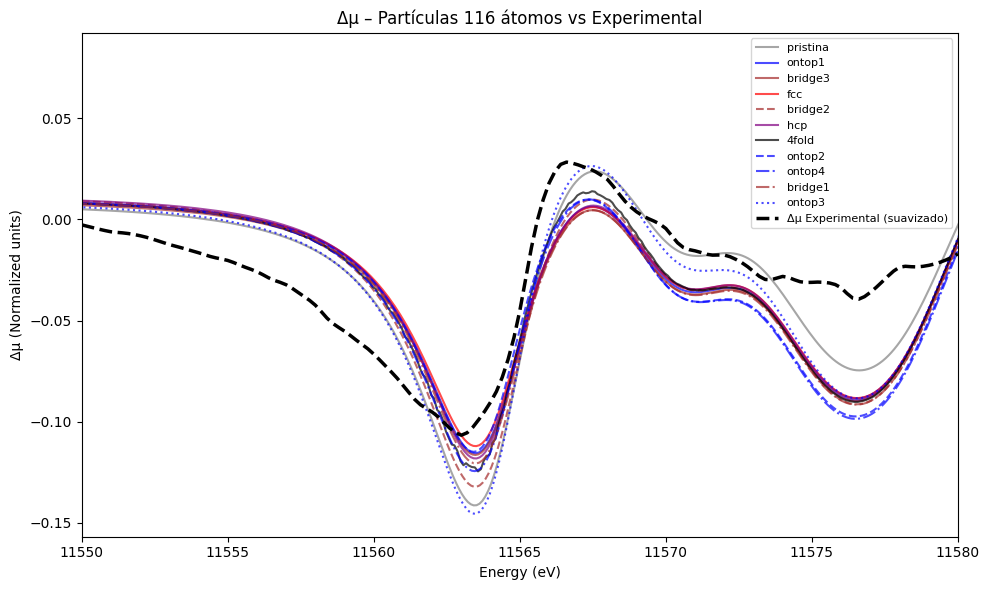


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.021550
ontop1     : RMSE = 0.027771
bridge3    : RMSE = 0.027799
fcc        : RMSE = 0.027489
bridge2    : RMSE = 0.028141
hcp        : RMSE = 0.027703
4fold      : RMSE = 0.026765
ontop2     : RMSE = 0.029738
ontop4     : RMSE = 0.030068
bridge1    : RMSE = 0.028579
ontop3     : RMSE = 0.025341

Top 3 Δμ:
1. pristina   (RMSE = 0.021550)
2. ontop3     (RMSE = 0.025341)
3. 4fold      (RMSE = 0.026765)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_160mV_norm.txt


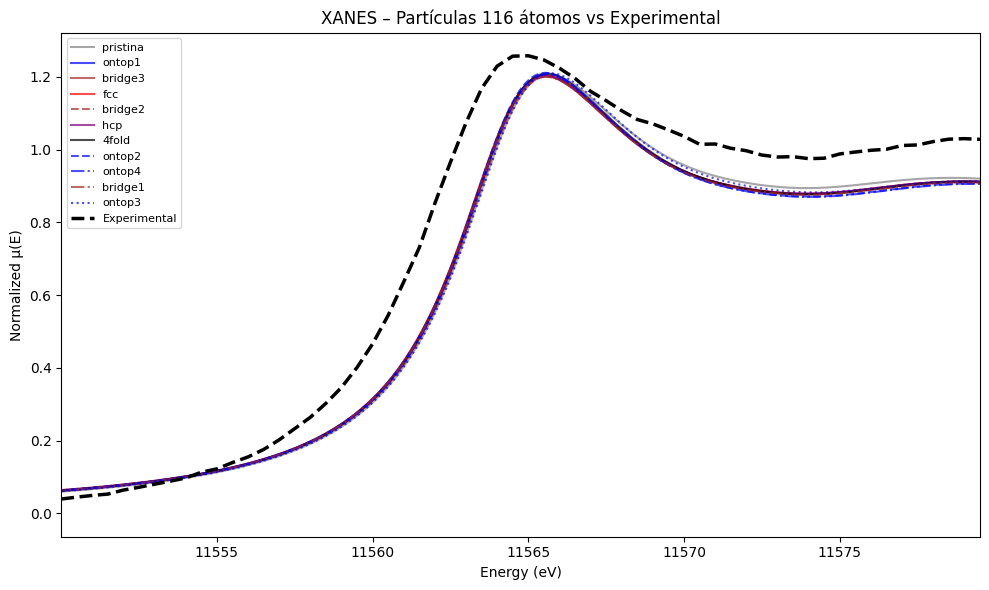


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.119871
ontop1     : RMSE = 0.118027
bridge3    : RMSE = 0.118736
fcc        : RMSE = 0.116888
bridge2    : RMSE = 0.122092
hcp        : RMSE = 0.118185
4fold      : RMSE = 0.119859
ontop2     : RMSE = 0.119688
ontop4     : RMSE = 0.122289
bridge1    : RMSE = 0.119957
ontop3     : RMSE = 0.123424

Top 3 μ(E):
1. fcc        (RMSE = 0.116888)
2. ontop1     (RMSE = 0.118027)
3. hcp        (RMSE = 0.118185)


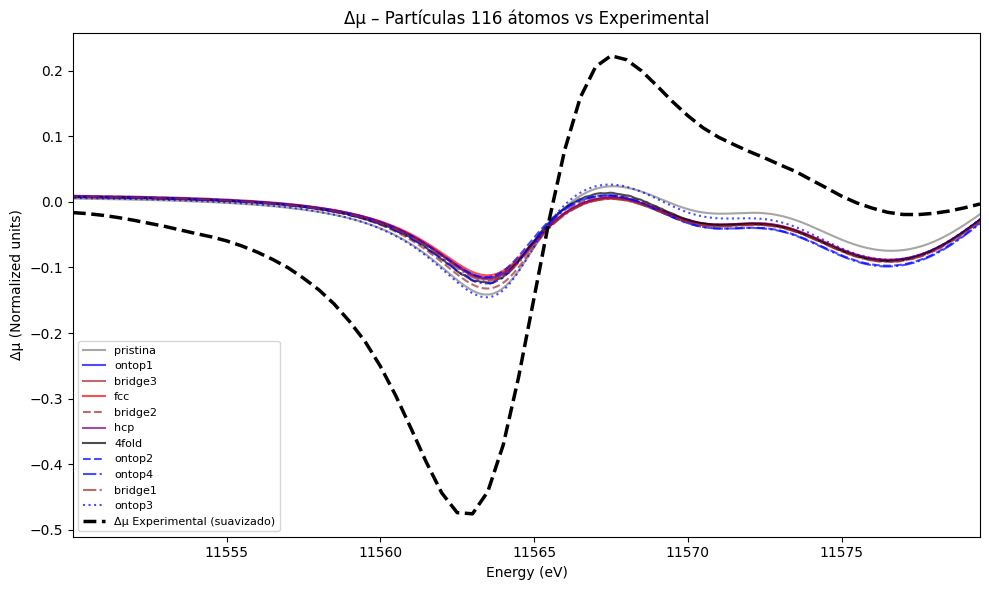


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.148306
ontop1     : RMSE = 0.160430
bridge3    : RMSE = 0.160318
fcc        : RMSE = 0.161023
bridge2    : RMSE = 0.156311
hcp        : RMSE = 0.159769
4fold      : RMSE = 0.157255
ontop2     : RMSE = 0.161296
ontop4     : RMSE = 0.159143
bridge1    : RMSE = 0.159745
ontop3     : RMSE = 0.149120

Top 3 Δμ:
1. pristina   (RMSE = 0.148306)
2. ontop3     (RMSE = 0.149120)
3. bridge2    (RMSE = 0.156311)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_261mV_norm.txt


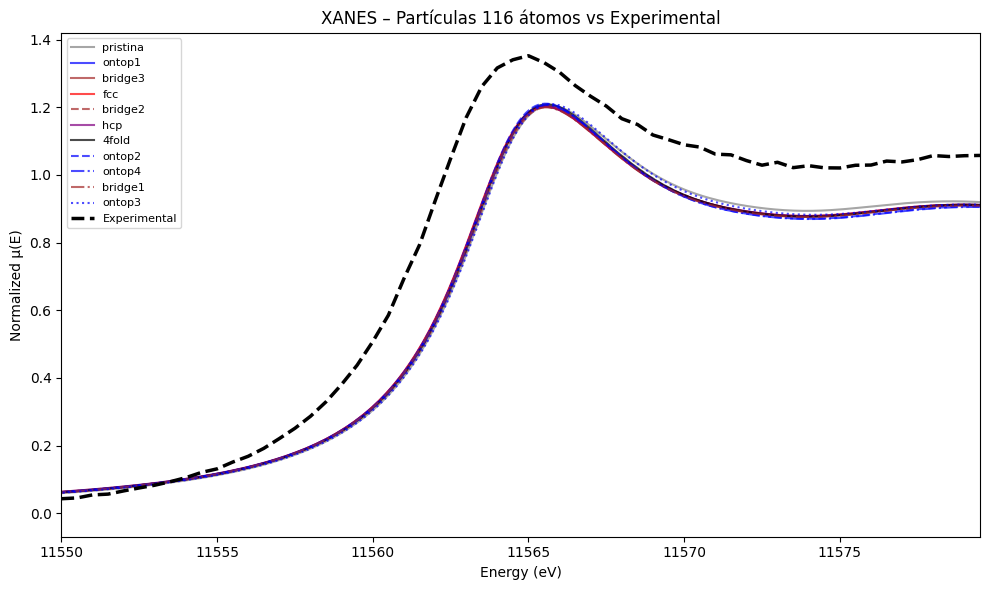


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.163572
ontop1     : RMSE = 0.162714
bridge3    : RMSE = 0.163506
fcc        : RMSE = 0.161587
bridge2    : RMSE = 0.166590
hcp        : RMSE = 0.162850
4fold      : RMSE = 0.164129
ontop2     : RMSE = 0.164092
ontop4     : RMSE = 0.166732
bridge1    : RMSE = 0.164731
ontop3     : RMSE = 0.167061

Top 3 μ(E):
1. fcc        (RMSE = 0.161587)
2. ontop1     (RMSE = 0.162714)
3. hcp        (RMSE = 0.162850)


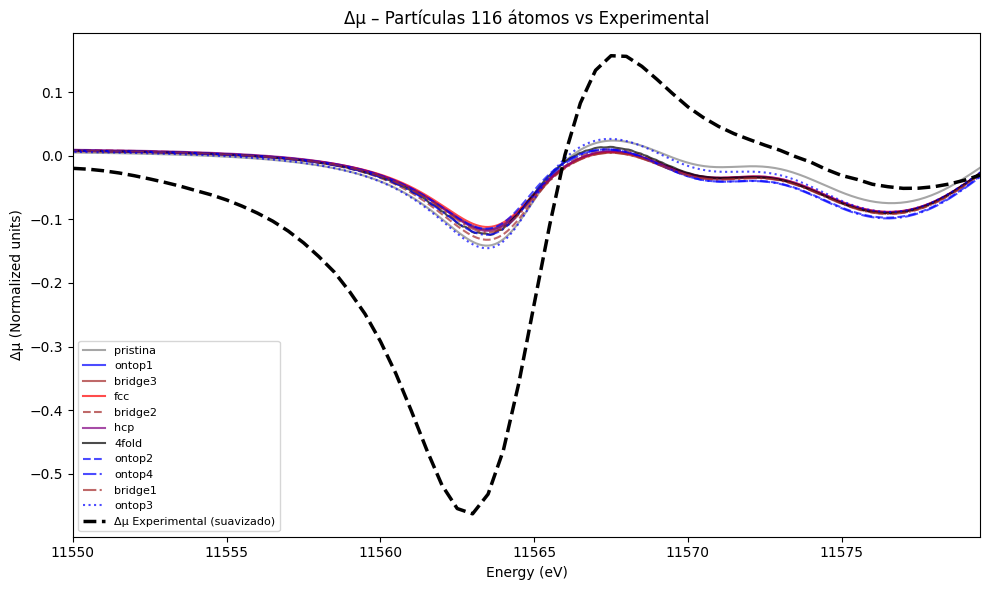


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.165229
ontop1     : RMSE = 0.175733
bridge3    : RMSE = 0.175373
fcc        : RMSE = 0.176549
bridge2    : RMSE = 0.171110
hcp        : RMSE = 0.175111
4fold      : RMSE = 0.172767
ontop2     : RMSE = 0.176366
ontop4     : RMSE = 0.173701
bridge1    : RMSE = 0.174533
ontop3     : RMSE = 0.165088

Top 3 Δμ:
1. ontop3     (RMSE = 0.165088)
2. pristina   (RMSE = 0.165229)
3. bridge2    (RMSE = 0.171110)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_330mV_norm.txt


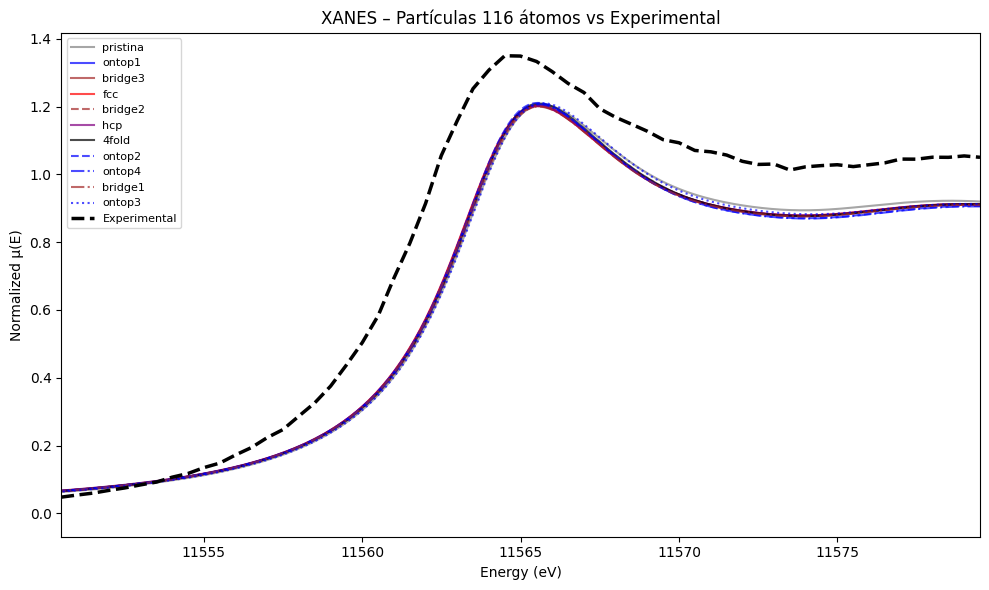


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.163449
ontop1     : RMSE = 0.162577
bridge3    : RMSE = 0.163382
fcc        : RMSE = 0.161443
bridge2    : RMSE = 0.166477
hcp        : RMSE = 0.162713
4fold      : RMSE = 0.163984
ontop2     : RMSE = 0.163948
ontop4     : RMSE = 0.166611
bridge1    : RMSE = 0.164613
ontop3     : RMSE = 0.166941

Top 3 μ(E):
1. fcc        (RMSE = 0.161443)
2. ontop1     (RMSE = 0.162577)
3. hcp        (RMSE = 0.162713)


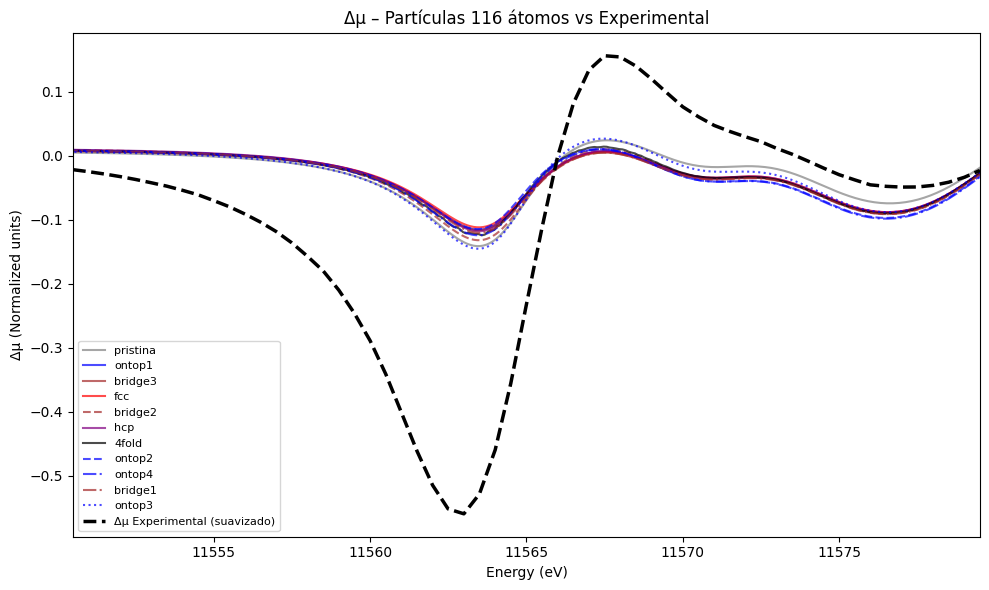


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.165578
ontop1     : RMSE = 0.176219
bridge3    : RMSE = 0.175860
fcc        : RMSE = 0.177037
bridge2    : RMSE = 0.171567
hcp        : RMSE = 0.175586
4fold      : RMSE = 0.173243
ontop2     : RMSE = 0.176889
ontop4     : RMSE = 0.174210
bridge1    : RMSE = 0.175018
ontop3     : RMSE = 0.165486

Top 3 Δμ:
1. ontop3     (RMSE = 0.165486)
2. pristina   (RMSE = 0.165578)
3. bridge2    (RMSE = 0.171567)
Arquivo: normalized/new_experimental/norm_Pt_MoS_Iso_OCP_norm.txt


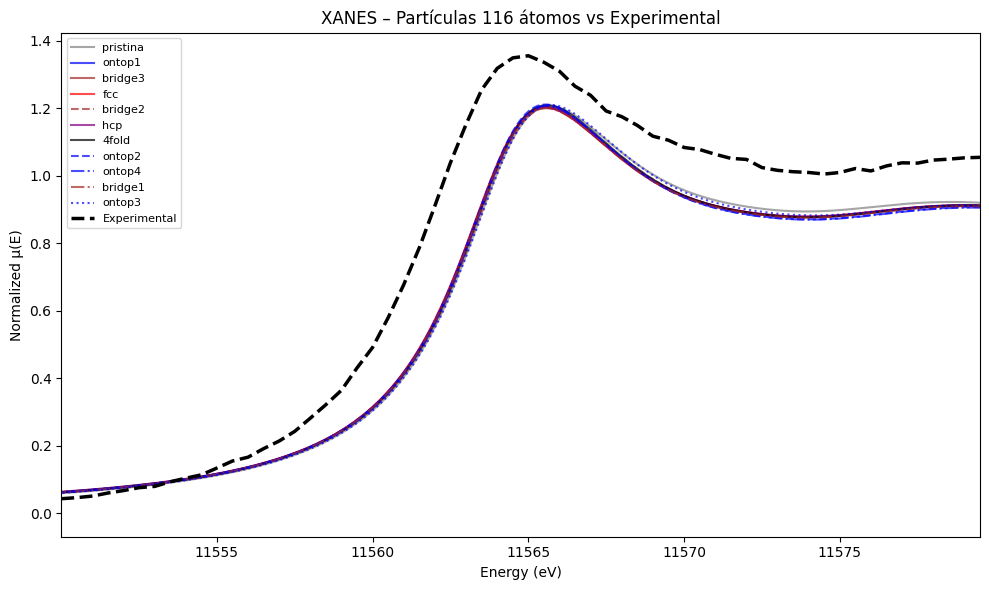


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.158387
ontop1     : RMSE = 0.157430
bridge3    : RMSE = 0.158224
fcc        : RMSE = 0.156304
bridge2    : RMSE = 0.161324
hcp        : RMSE = 0.157583
4fold      : RMSE = 0.158804
ontop2     : RMSE = 0.158718
ontop4     : RMSE = 0.161382
bridge1    : RMSE = 0.159456
ontop3     : RMSE = 0.161776

Top 3 μ(E):
1. fcc        (RMSE = 0.156304)
2. ontop1     (RMSE = 0.157430)
3. hcp        (RMSE = 0.157583)


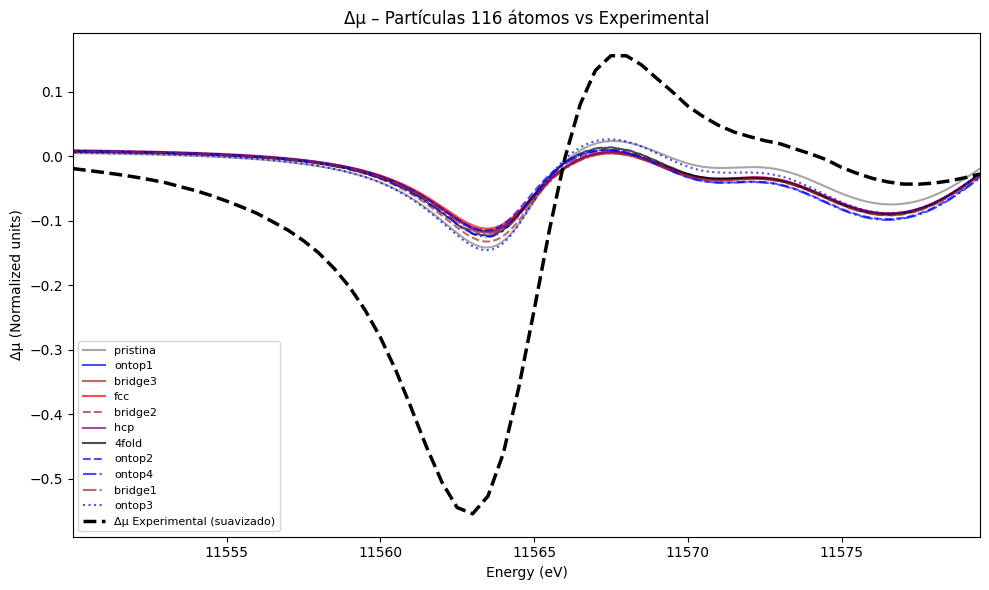


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.161997
ontop1     : RMSE = 0.172762
bridge3    : RMSE = 0.172418
fcc        : RMSE = 0.173556
bridge2    : RMSE = 0.168163
hcp        : RMSE = 0.172118
4fold      : RMSE = 0.169826
ontop2     : RMSE = 0.173528
ontop4     : RMSE = 0.170883
bridge1    : RMSE = 0.171594
ontop3     : RMSE = 0.162067

Top 3 Δμ:
1. pristina   (RMSE = 0.161997)
2. ontop3     (RMSE = 0.162067)
3. bridge2    (RMSE = 0.168163)


In [5]:
EXP_PARTICLEs = ["normalized/new_experimental/interp_Pt_MoS_Iso_330mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_160mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_261mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_330mV_norm.txt", 
                 "normalized/new_experimental/norm_Pt_MoS_Iso_OCP_norm.txt"
                ]

EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"
for EXP_PARTICLE in EXP_PARTICLEs:
    print('==================================================================================================')
    print(f'Arquivo: {EXP_PARTICLE}')
    print('==================================================================================================')
    new_experimental_116(EXP_PARTICLE, EXP_BULK, energy_min=11550, energy_max=11580, smooth=True, window_length=11, polyorder=3)

## Todos os dados experimentais

### Todos

Arquivo: normalized/new_experimental\Pt_GO_func_330mV_norm.txt


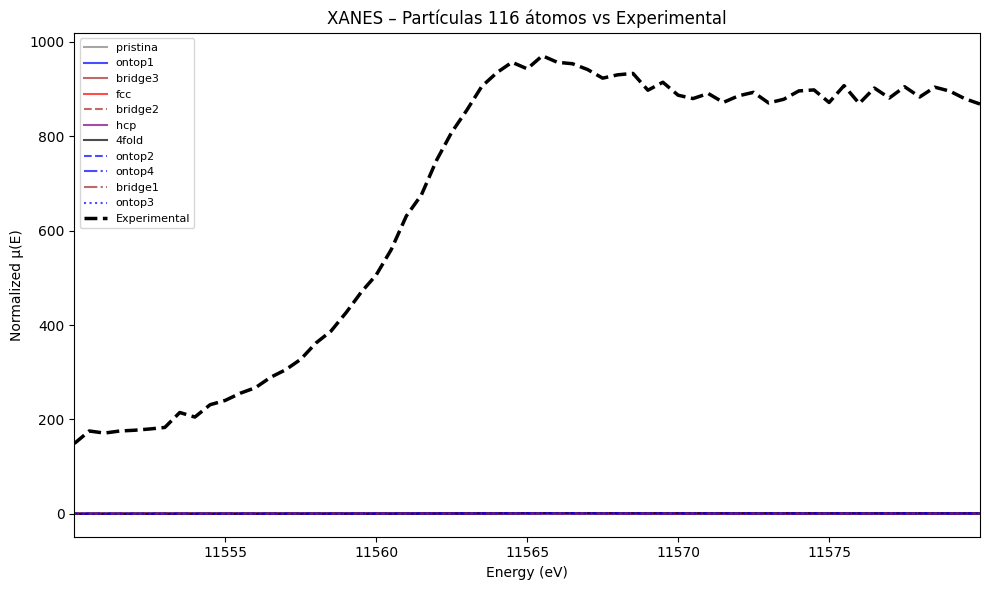


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 732.182987
ontop1     : RMSE = 732.187776
bridge3    : RMSE = 732.188691
fcc        : RMSE = 732.186907
bridge2    : RMSE = 732.189978
hcp        : RMSE = 732.187547
4fold      : RMSE = 732.187732
ontop2     : RMSE = 732.189454
ontop4     : RMSE = 732.191422
bridge1    : RMSE = 732.189714
ontop3     : RMSE = 732.187233

Top 3 μ(E):
1. pristina   (RMSE = 732.182987)
2. fcc        (RMSE = 732.186907)
3. ontop3     (RMSE = 732.187233)


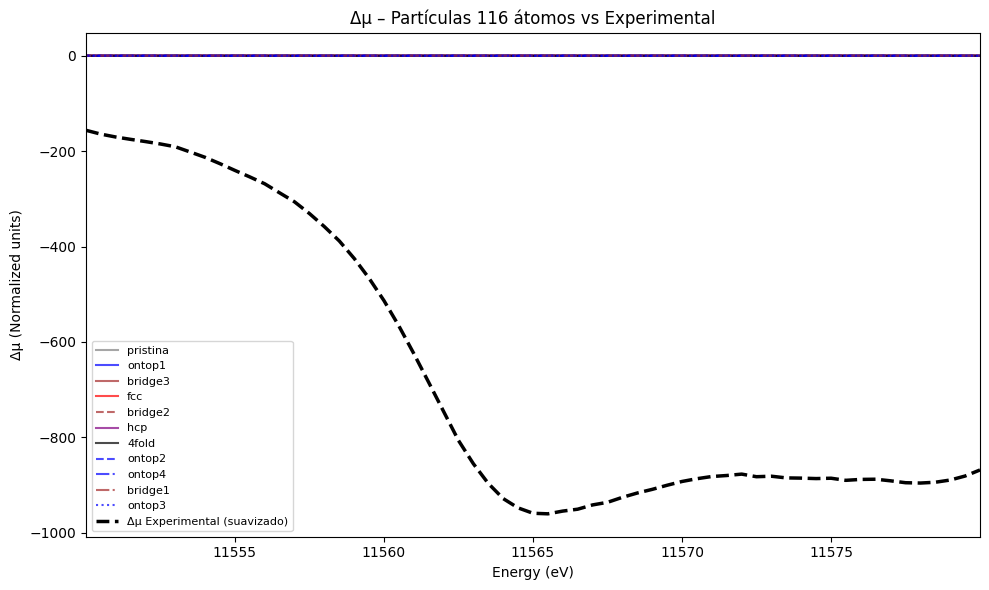


=== RMSE das curvas Δμ ===
pristina   : RMSE = 732.037063
ontop1     : RMSE = 732.032266
bridge3    : RMSE = 732.031351
fcc        : RMSE = 732.033131
bridge2    : RMSE = 732.030071
hcp        : RMSE = 732.032497
4fold      : RMSE = 732.032319
ontop2     : RMSE = 732.030589
ontop4     : RMSE = 732.028626
bridge1    : RMSE = 732.030328
ontop3     : RMSE = 732.032819

Top 3 Δμ:
1. ontop4     (RMSE = 732.028626)
2. bridge2    (RMSE = 732.030071)
3. bridge1    (RMSE = 732.030328)
Arquivo: normalized/new_experimental\Pt_bulk_Gm2_conv_norm.txt


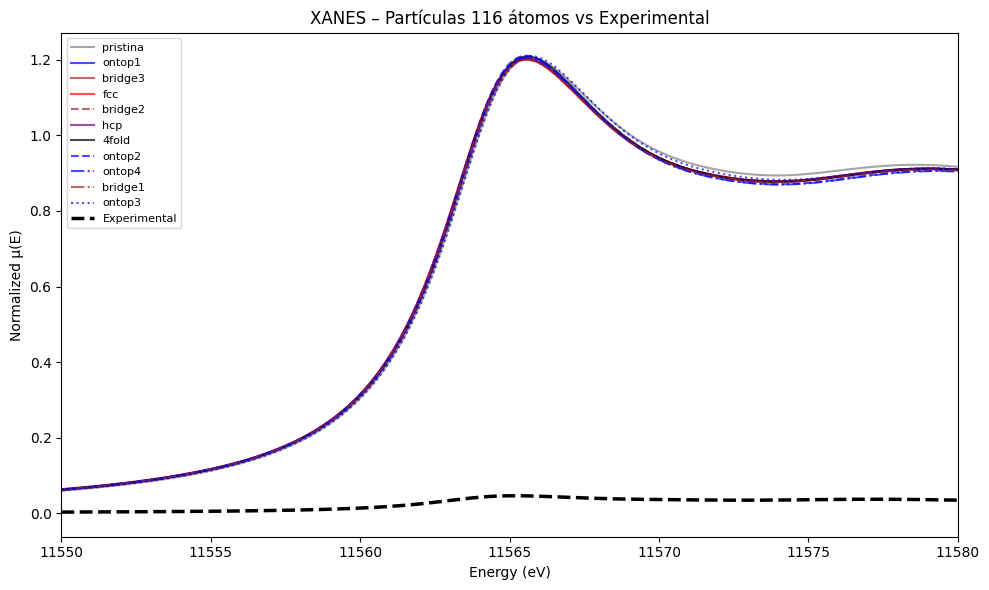


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.773559
ontop1     : RMSE = 0.767455
bridge3    : RMSE = 0.766557
fcc        : RMSE = 0.768336
bridge2    : RMSE = 0.765391
hcp        : RMSE = 0.767634
4fold      : RMSE = 0.767989
ontop2     : RMSE = 0.765972
ontop4     : RMSE = 0.763990
bridge1    : RMSE = 0.765441
ontop3     : RMSE = 0.769227

Top 3 μ(E):
1. ontop4     (RMSE = 0.763990)
2. bridge2    (RMSE = 0.765391)
3. bridge1    (RMSE = 0.765441)


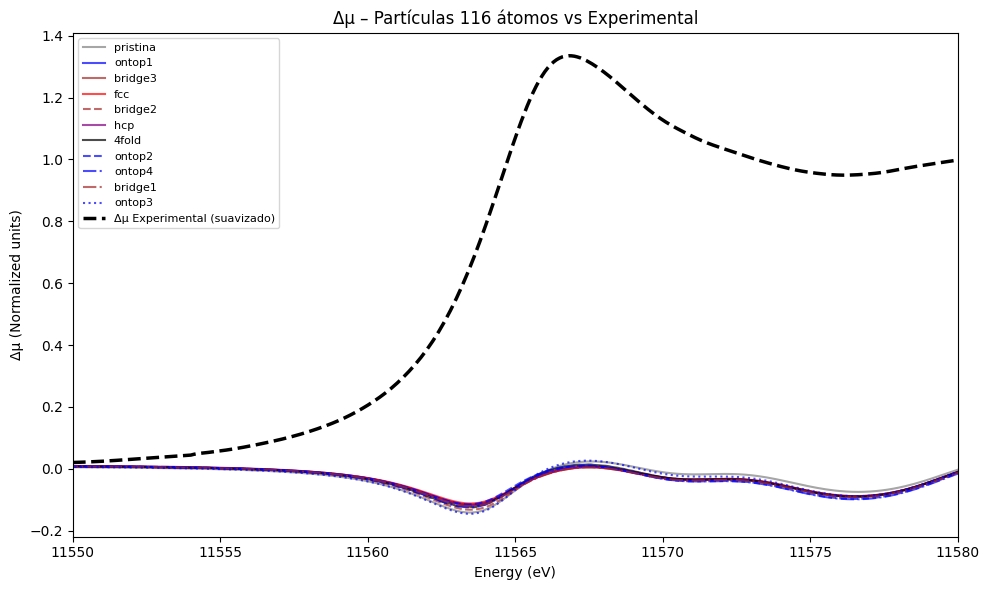


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.883041
ontop1     : RMSE = 0.890449
bridge3    : RMSE = 0.891315
fcc        : RMSE = 0.889653
bridge2    : RMSE = 0.891989
hcp        : RMSE = 0.890174
4fold      : RMSE = 0.889624
ontop2     : RMSE = 0.892145
ontop4     : RMSE = 0.893793
bridge1    : RMSE = 0.892332
ontop3     : RMSE = 0.887500

Top 3 Δμ:
1. pristina   (RMSE = 0.883041)
2. ontop3     (RMSE = 0.887500)
3. 4fold      (RMSE = 0.889624)
Arquivo: normalized/new_experimental\Pt_foil_1_norm.txt


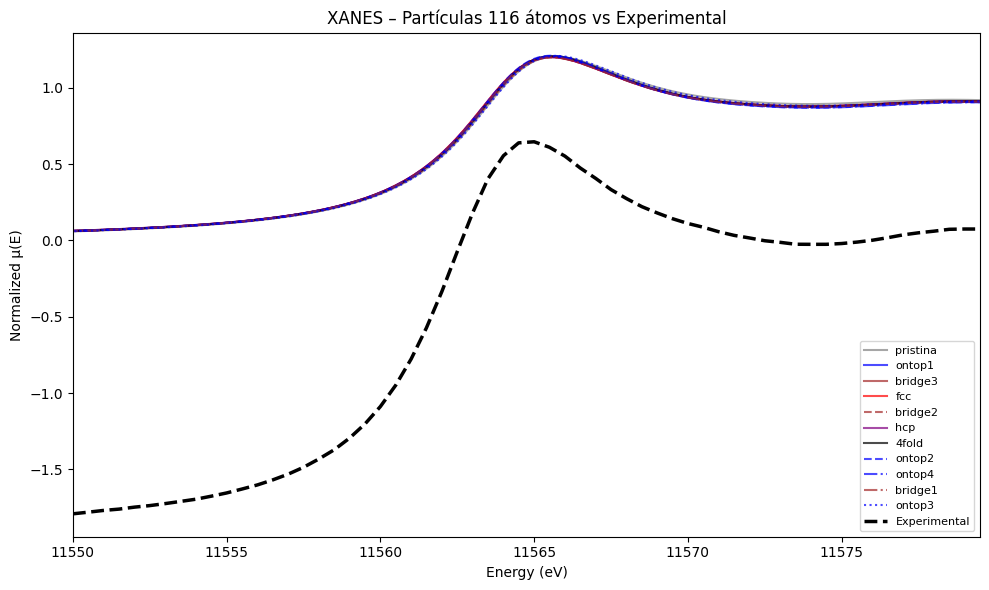


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 1.223717
ontop1     : RMSE = 1.222852
bridge3    : RMSE = 1.221845
fcc        : RMSE = 1.223342
bridge2    : RMSE = 1.221570
hcp        : RMSE = 1.223404
4fold      : RMSE = 1.222344
ontop2     : RMSE = 1.221593
ontop4     : RMSE = 1.220304
bridge1    : RMSE = 1.221592
ontop3     : RMSE = 1.221477

Top 3 μ(E):
1. ontop4     (RMSE = 1.220304)
2. ontop3     (RMSE = 1.221477)
3. bridge2    (RMSE = 1.221570)


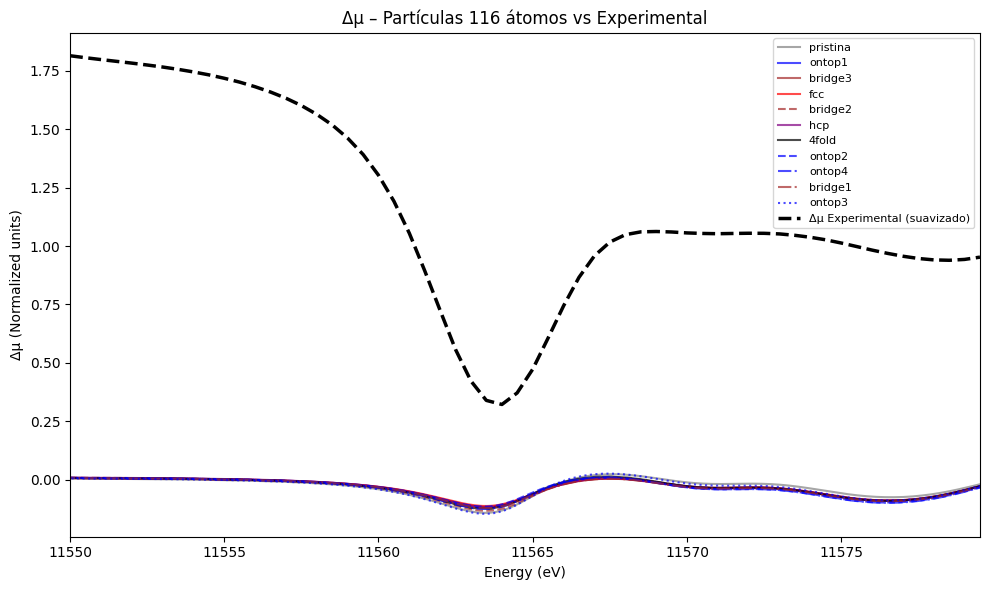


=== RMSE das curvas Δμ ===
pristina   : RMSE = 1.259640
ontop1     : RMSE = 1.261784
bridge3    : RMSE = 1.262814
fcc        : RMSE = 1.261266
bridge2    : RMSE = 1.262903
hcp        : RMSE = 1.261172
4fold      : RMSE = 1.262040
ontop2     : RMSE = 1.263261
ontop4     : RMSE = 1.264502
bridge1    : RMSE = 1.263106
ontop3     : RMSE = 1.262266

Top 3 Δμ:
1. pristina   (RMSE = 1.259640)
2. hcp        (RMSE = 1.261172)
3. fcc        (RMSE = 1.261266)
Arquivo: normalized/new_experimental\Pt_foil_5_norm.txt


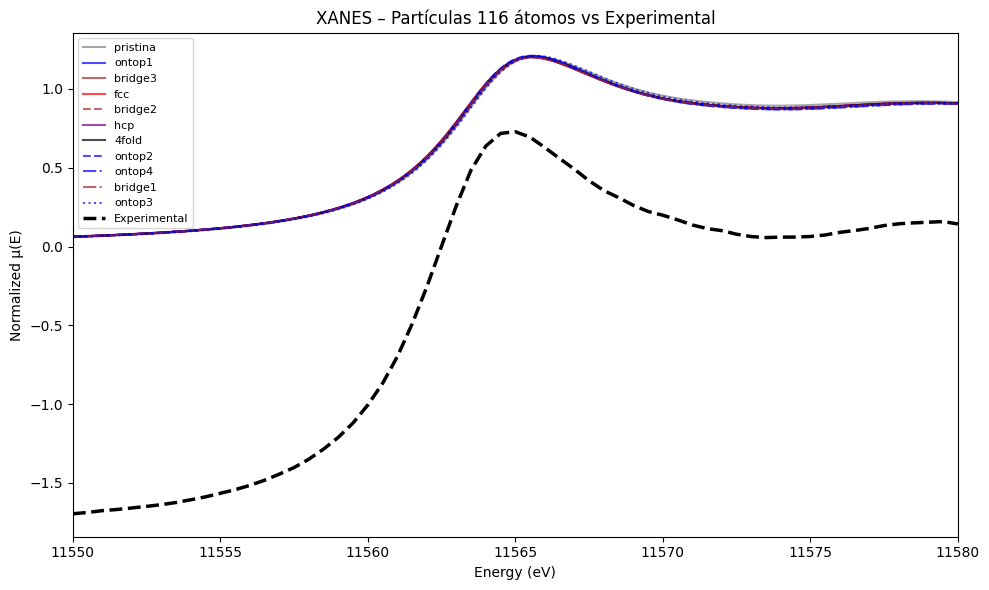


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 1.140333
ontop1     : RMSE = 1.139513
bridge3    : RMSE = 1.138520
fcc        : RMSE = 1.139973
bridge2    : RMSE = 1.138284
hcp        : RMSE = 1.140065
4fold      : RMSE = 1.139005
ontop2     : RMSE = 1.138248
ontop4     : RMSE = 1.137000
bridge1    : RMSE = 1.138283
ontop3     : RMSE = 1.138136

Top 3 μ(E):
1. ontop4     (RMSE = 1.137000)
2. ontop3     (RMSE = 1.138136)
3. ontop2     (RMSE = 1.138248)


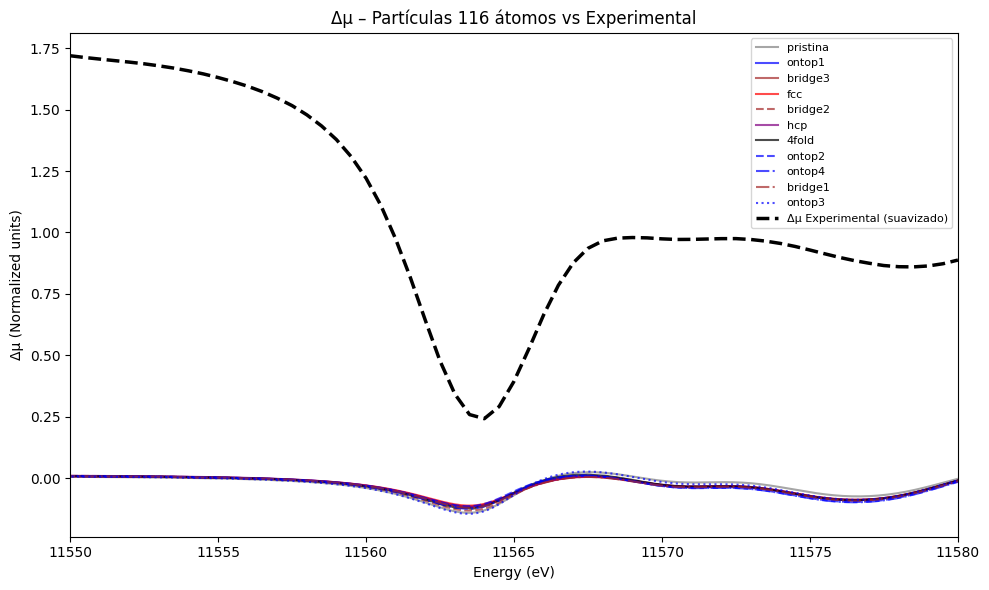


=== RMSE das curvas Δμ ===
pristina   : RMSE = 1.175437
ontop1     : RMSE = 1.177620
bridge3    : RMSE = 1.178640
fcc        : RMSE = 1.177131
bridge2    : RMSE = 1.178682
hcp        : RMSE = 1.177005
4fold      : RMSE = 1.177864
ontop2     : RMSE = 1.179122
ontop4     : RMSE = 1.180324
bridge1    : RMSE = 1.178921
ontop3     : RMSE = 1.178055

Top 3 Δμ:
1. pristina   (RMSE = 1.175437)
2. hcp        (RMSE = 1.177005)
3. fcc        (RMSE = 1.177131)
Arquivo: normalized/new_experimental\Pt_foil_6_norm.txt


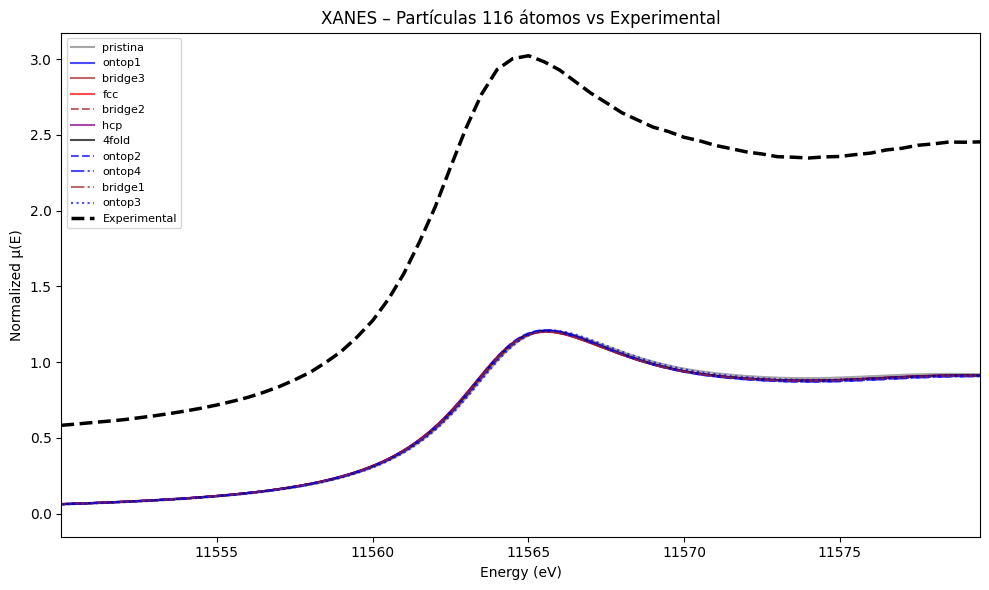


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 1.317643
ontop1     : RMSE = 1.321328
bridge3    : RMSE = 1.322290
fcc        : RMSE = 1.320421
bridge2    : RMSE = 1.323764
hcp        : RMSE = 1.321121
4fold      : RMSE = 1.321455
ontop2     : RMSE = 1.322798
ontop4     : RMSE = 1.324908
bridge1    : RMSE = 1.323302
ontop3     : RMSE = 1.321581

Top 3 μ(E):
1. pristina   (RMSE = 1.317643)
2. fcc        (RMSE = 1.320421)
3. hcp        (RMSE = 1.321121)


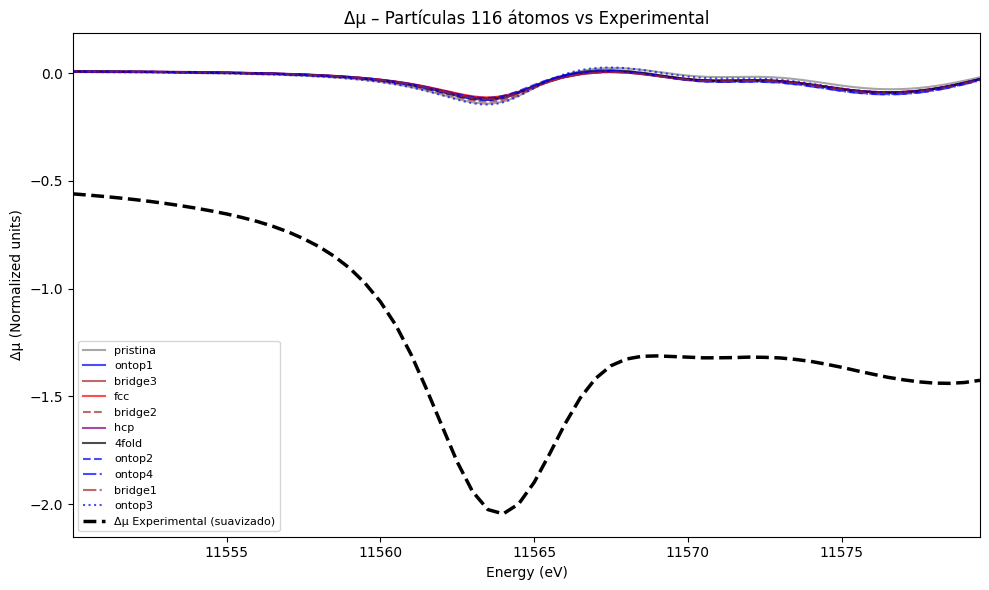


=== RMSE das curvas Δμ ===
pristina   : RMSE = 1.239211
ontop1     : RMSE = 1.236601
bridge3    : RMSE = 1.235625
fcc        : RMSE = 1.237534
bridge2    : RMSE = 1.233872
hcp        : RMSE = 1.236756
4fold      : RMSE = 1.236248
ontop2     : RMSE = 1.235302
ontop4     : RMSE = 1.233021
bridge1    : RMSE = 1.234586
ontop3     : RMSE = 1.235462

Top 3 Δμ:
1. ontop4     (RMSE = 1.233021)
2. bridge2    (RMSE = 1.233872)
3. bridge1    (RMSE = 1.234586)
Arquivo: normalized/new_experimental\interp_Pt_MoS_Iso_330mV_norm.txt


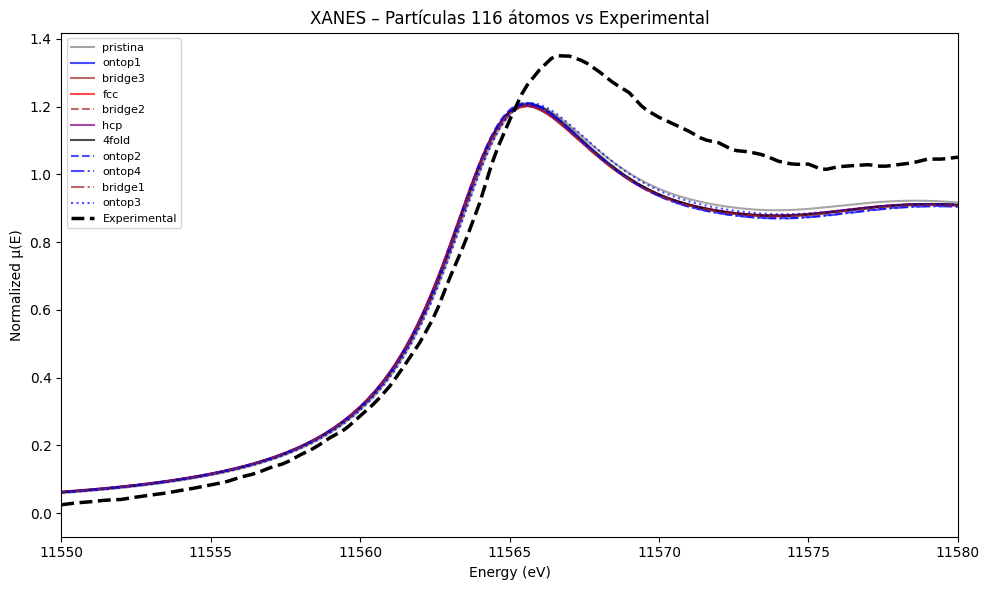


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.119372
ontop1     : RMSE = 0.131541
bridge3    : RMSE = 0.132048
fcc        : RMSE = 0.131345
bridge2    : RMSE = 0.130097
hcp        : RMSE = 0.130878
4fold      : RMSE = 0.129556
ontop2     : RMSE = 0.133634
ontop4     : RMSE = 0.133298
bridge1    : RMSE = 0.132275
ontop3     : RMSE = 0.123160

Top 3 μ(E):
1. pristina   (RMSE = 0.119372)
2. ontop3     (RMSE = 0.123160)
3. 4fold      (RMSE = 0.129556)


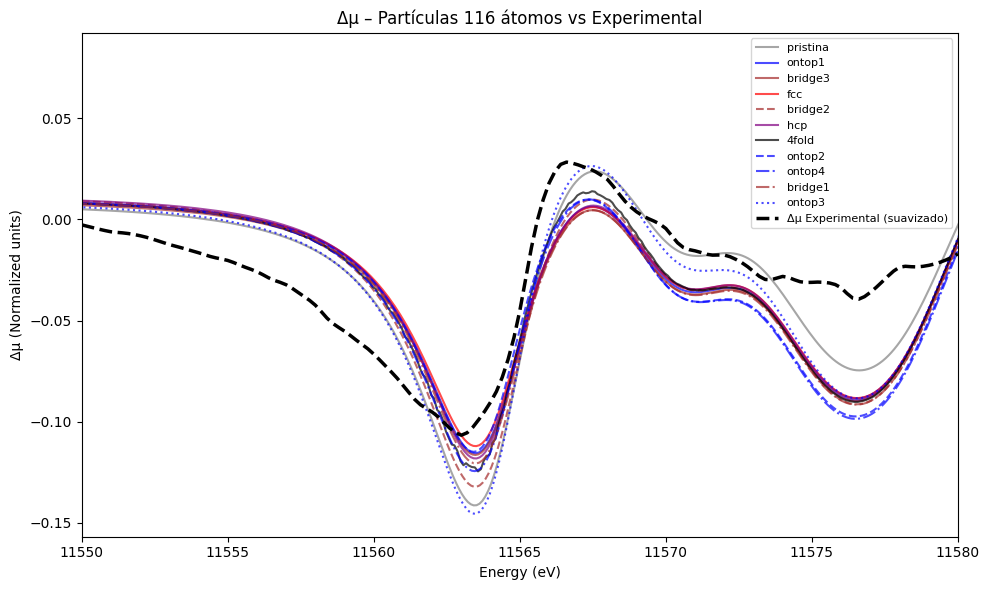


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.021550
ontop1     : RMSE = 0.027771
bridge3    : RMSE = 0.027799
fcc        : RMSE = 0.027489
bridge2    : RMSE = 0.028141
hcp        : RMSE = 0.027703
4fold      : RMSE = 0.026765
ontop2     : RMSE = 0.029738
ontop4     : RMSE = 0.030068
bridge1    : RMSE = 0.028579
ontop3     : RMSE = 0.025341

Top 3 Δμ:
1. pristina   (RMSE = 0.021550)
2. ontop3     (RMSE = 0.025341)
3. 4fold      (RMSE = 0.026765)
Arquivo: normalized/new_experimental\interp_Pt_PVP_330mV_norm.txt


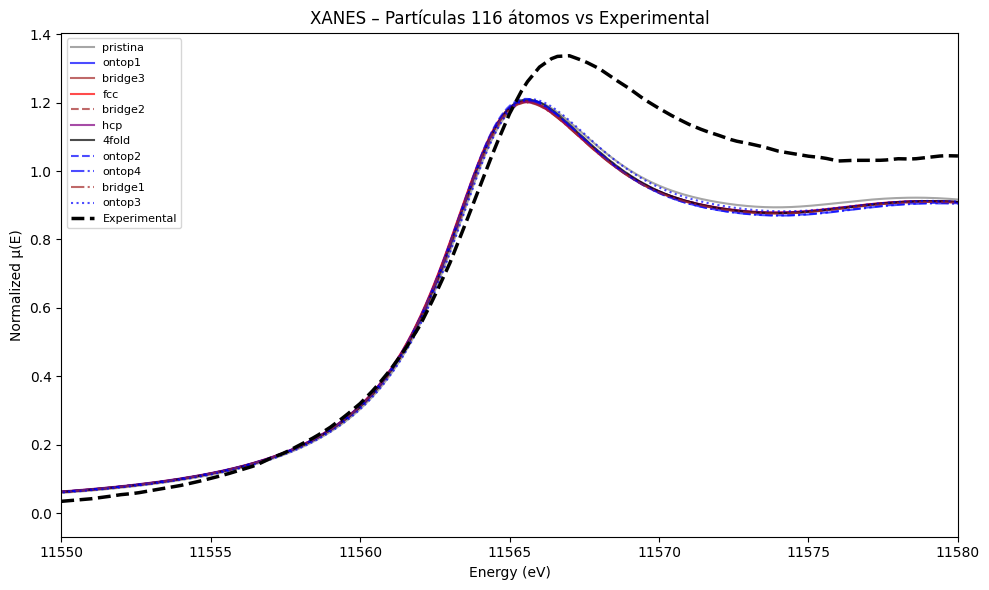


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.121085
ontop1     : RMSE = 0.132365
bridge3    : RMSE = 0.132987
fcc        : RMSE = 0.132016
bridge2    : RMSE = 0.131529
hcp        : RMSE = 0.131706
4fold      : RMSE = 0.130765
ontop2     : RMSE = 0.134646
ontop4     : RMSE = 0.134676
bridge1    : RMSE = 0.133328
ontop3     : RMSE = 0.125240

Top 3 μ(E):
1. pristina   (RMSE = 0.121085)
2. ontop3     (RMSE = 0.125240)
3. 4fold      (RMSE = 0.130765)


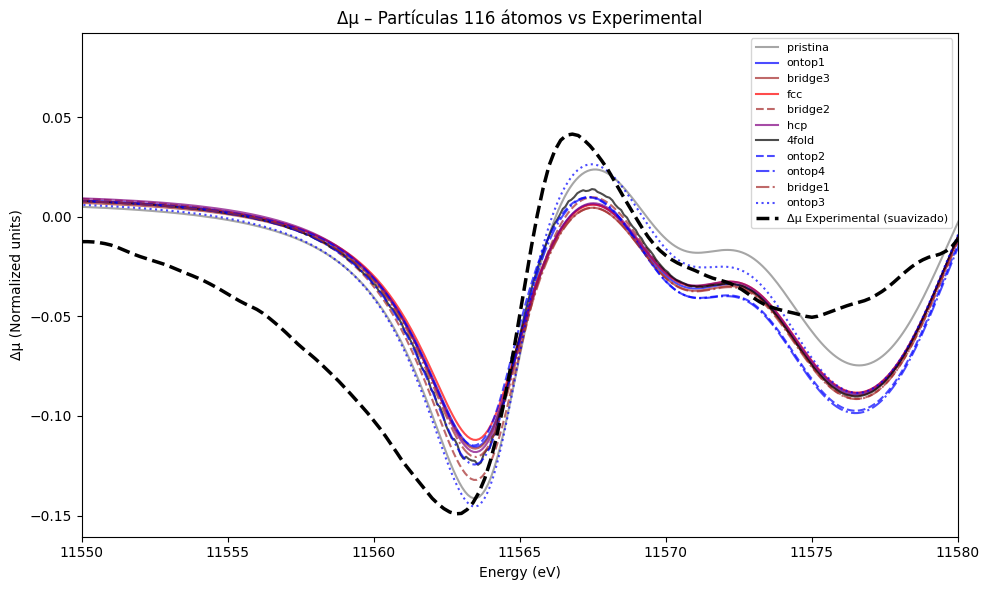


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.031750
ontop1     : RMSE = 0.038846
bridge3    : RMSE = 0.038460
fcc        : RMSE = 0.039176
bridge2    : RMSE = 0.037046
hcp        : RMSE = 0.038800
4fold      : RMSE = 0.036839
ontop2     : RMSE = 0.039600
ontop4     : RMSE = 0.038595
bridge1    : RMSE = 0.038628
ontop3     : RMSE = 0.032875

Top 3 Δμ:
1. pristina   (RMSE = 0.031750)
2. ontop3     (RMSE = 0.032875)
3. 4fold      (RMSE = 0.036839)
Arquivo: normalized/new_experimental\interp_Pt_PVP_OCP_norm.txt


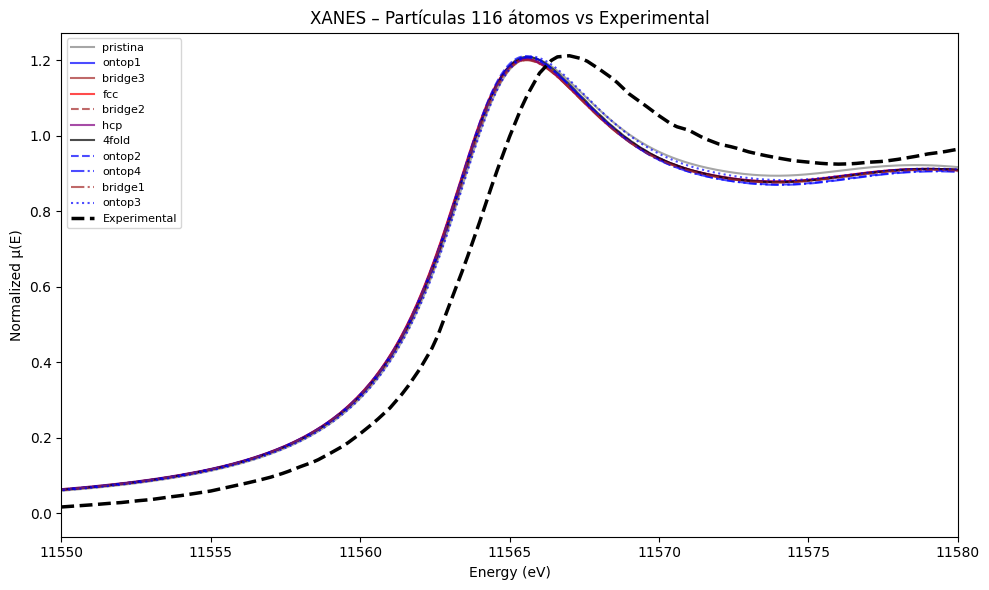


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.095505
ontop1     : RMSE = 0.107279
bridge3    : RMSE = 0.107056
fcc        : RMSE = 0.107885
bridge2    : RMSE = 0.103067
hcp        : RMSE = 0.106542
4fold      : RMSE = 0.104872
ontop2     : RMSE = 0.108847
ontop4     : RMSE = 0.106403
bridge1    : RMSE = 0.106343
ontop3     : RMSE = 0.096608

Top 3 μ(E):
1. pristina   (RMSE = 0.095505)
2. ontop3     (RMSE = 0.096608)
3. bridge2    (RMSE = 0.103067)


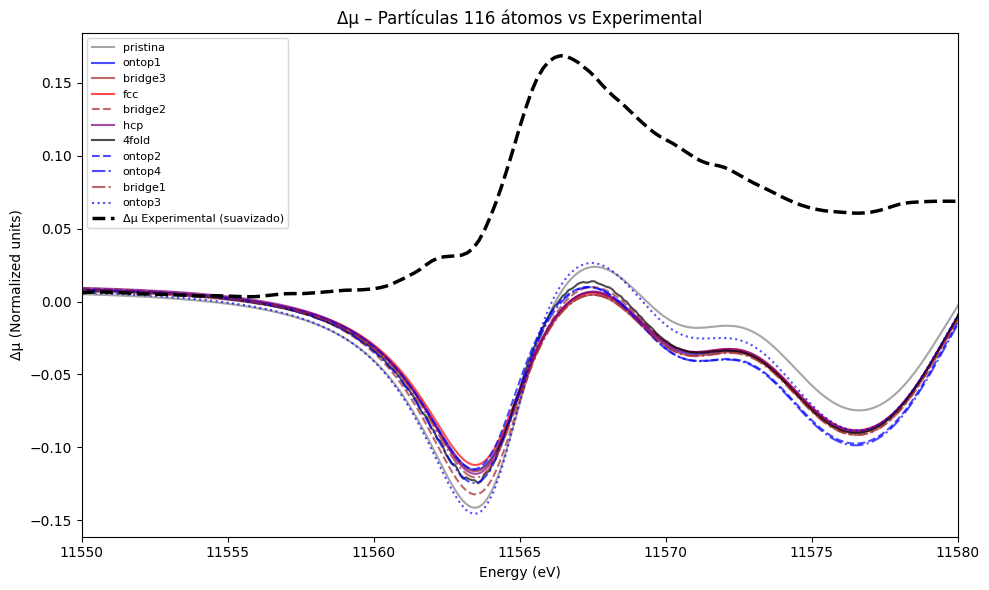


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.107701
ontop1     : RMSE = 0.112126
bridge3    : RMSE = 0.112939
fcc        : RMSE = 0.111247
bridge2    : RMSE = 0.114456
hcp        : RMSE = 0.112036
4fold      : RMSE = 0.111842
ontop2     : RMSE = 0.113585
ontop4     : RMSE = 0.115569
bridge1    : RMSE = 0.114067
ontop3     : RMSE = 0.111730

Top 3 Δμ:
1. pristina   (RMSE = 0.107701)
2. fcc        (RMSE = 0.111247)
3. ontop3     (RMSE = 0.111730)
Arquivo: normalized/new_experimental\interp_sim_XANES4fold_norm.txt


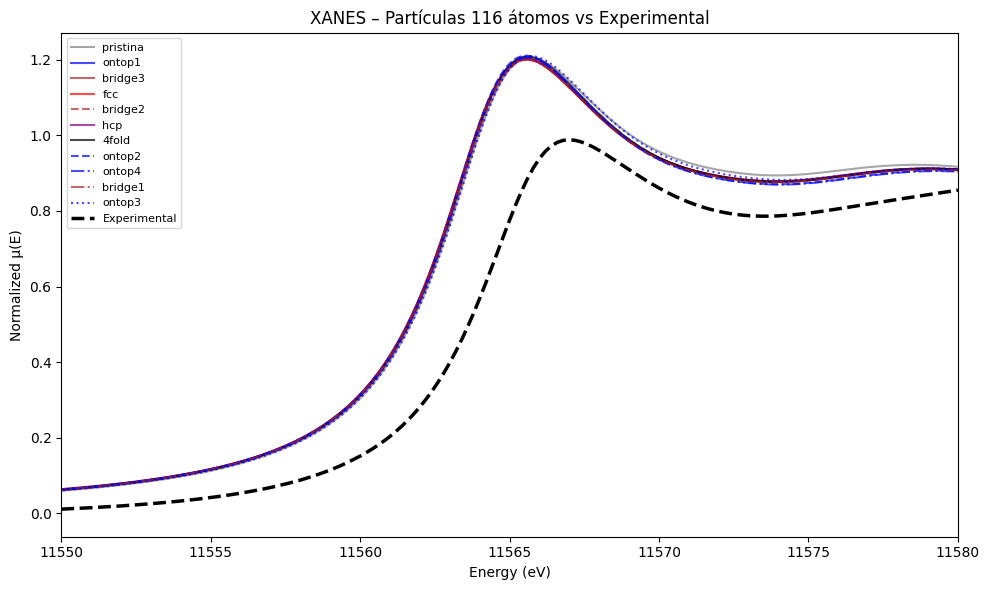


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.172493
ontop1     : RMSE = 0.175201
bridge3    : RMSE = 0.174370
fcc        : RMSE = 0.176221
bridge2    : RMSE = 0.171147
hcp        : RMSE = 0.174866
4fold      : RMSE = 0.174215
ontop2     : RMSE = 0.175385
ontop4     : RMSE = 0.172403
bridge1    : RMSE = 0.173162
ontop3     : RMSE = 0.170341

Top 3 μ(E):
1. ontop3     (RMSE = 0.170341)
2. bridge2    (RMSE = 0.171147)
3. ontop4     (RMSE = 0.172403)


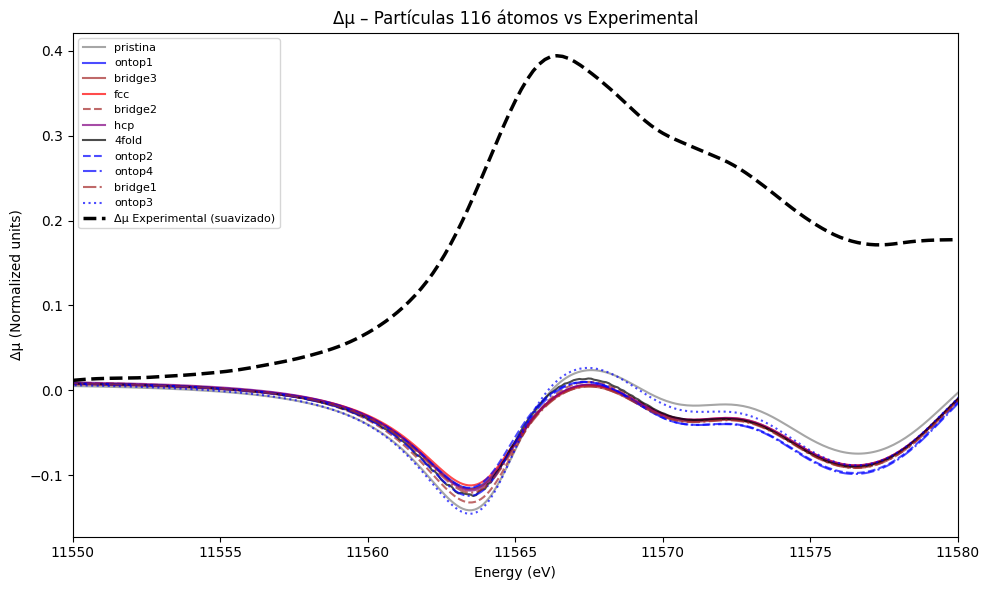


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.242117
ontop1     : RMSE = 0.247062
bridge3    : RMSE = 0.247923
fcc        : RMSE = 0.246206
bridge2    : RMSE = 0.249167
hcp        : RMSE = 0.246939
4fold      : RMSE = 0.246593
ontop2     : RMSE = 0.248281
ontop4     : RMSE = 0.250214
bridge1    : RMSE = 0.248977
ontop3     : RMSE = 0.245872

Top 3 Δμ:
1. pristina   (RMSE = 0.242117)
2. ontop3     (RMSE = 0.245872)
3. fcc        (RMSE = 0.246206)
Arquivo: normalized/new_experimental\interp_sim_XANESAds14_norm.txt


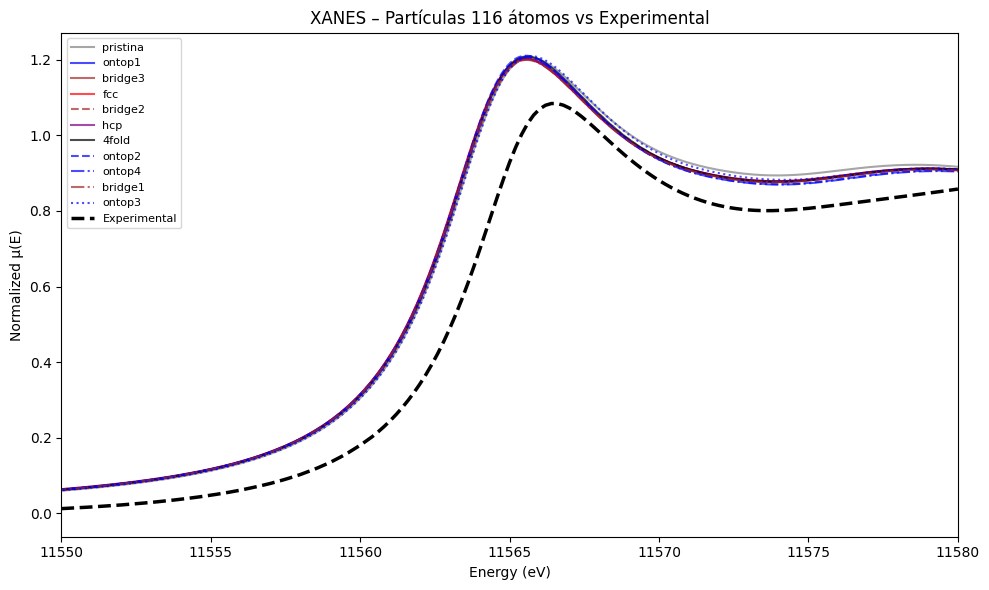


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.125250
ontop1     : RMSE = 0.128149
bridge3    : RMSE = 0.127318
fcc        : RMSE = 0.129217
bridge2    : RMSE = 0.123919
hcp        : RMSE = 0.127878
4fold      : RMSE = 0.126766
ontop2     : RMSE = 0.127884
ontop4     : RMSE = 0.124877
bridge1    : RMSE = 0.126117
ontop3     : RMSE = 0.122553

Top 3 μ(E):
1. ontop3     (RMSE = 0.122553)
2. bridge2    (RMSE = 0.123919)
3. ontop4     (RMSE = 0.124877)


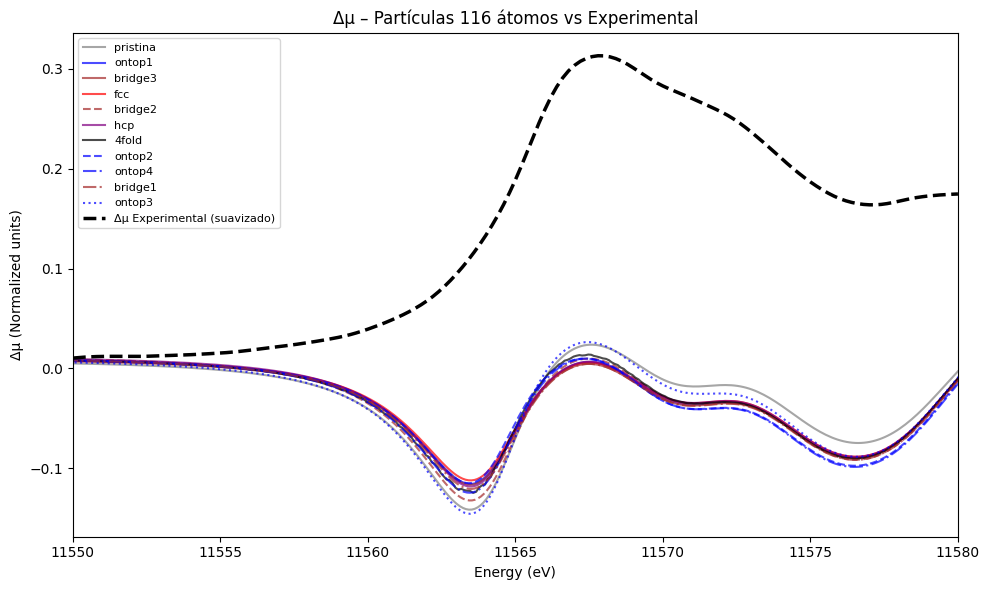


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.201775
ontop1     : RMSE = 0.208181
bridge3    : RMSE = 0.209013
fcc        : RMSE = 0.207362
bridge2    : RMSE = 0.209874
hcp        : RMSE = 0.207920
4fold      : RMSE = 0.207646
ontop2     : RMSE = 0.209940
ontop4     : RMSE = 0.211574
bridge1    : RMSE = 0.209988
ontop3     : RMSE = 0.206100

Top 3 Δμ:
1. pristina   (RMSE = 0.201775)
2. ontop3     (RMSE = 0.206100)
3. fcc        (RMSE = 0.207362)
Arquivo: normalized/new_experimental\interp_sim_XANESBridge2_norm.txt


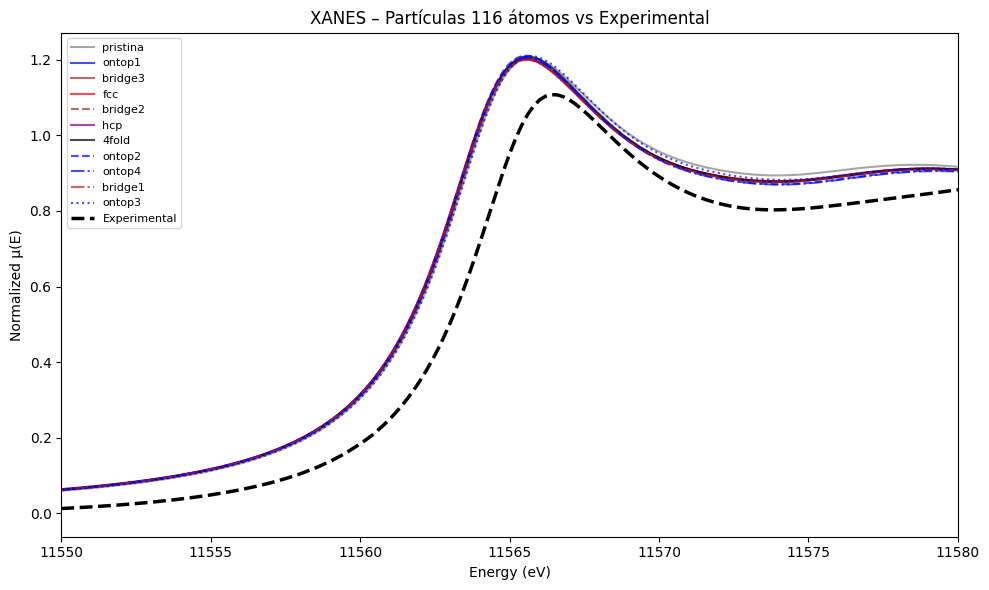


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.118381
ontop1     : RMSE = 0.121533
bridge3    : RMSE = 0.120723
fcc        : RMSE = 0.122609
bridge2    : RMSE = 0.117222
hcp        : RMSE = 0.121265
4fold      : RMSE = 0.119994
ontop2     : RMSE = 0.121146
ontop4     : RMSE = 0.118127
bridge1    : RMSE = 0.119518
ontop3     : RMSE = 0.115540

Top 3 μ(E):
1. ontop3     (RMSE = 0.115540)
2. bridge2    (RMSE = 0.117222)
3. ontop4     (RMSE = 0.118127)


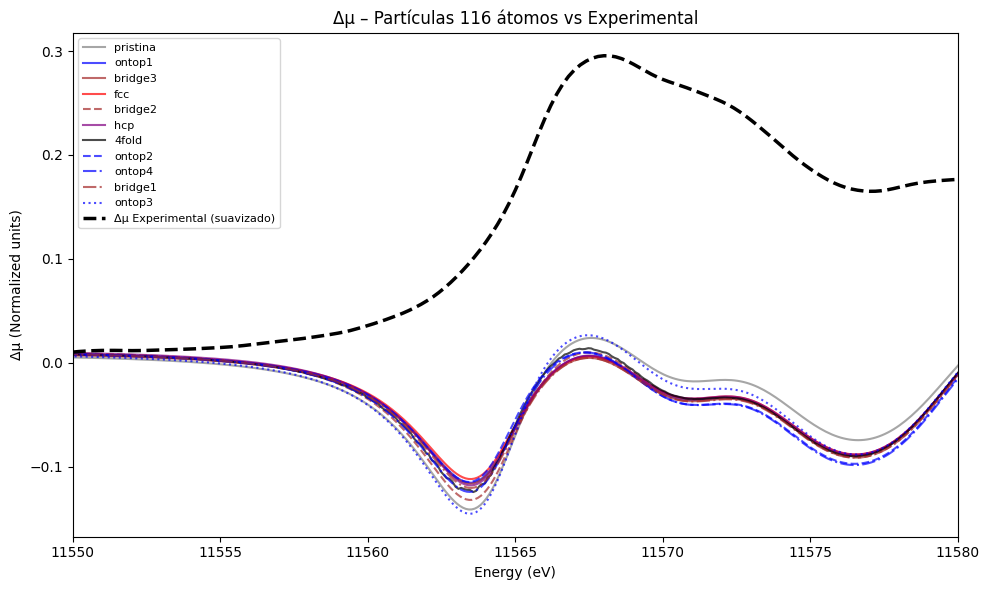


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.194632
ontop1     : RMSE = 0.201211
bridge3    : RMSE = 0.202034
fcc        : RMSE = 0.200393
bridge2    : RMSE = 0.202872
hcp        : RMSE = 0.200931
4fold      : RMSE = 0.200706
ontop2     : RMSE = 0.203096
ontop4     : RMSE = 0.204692
bridge1    : RMSE = 0.203004
ontop3     : RMSE = 0.199103

Top 3 Δμ:
1. pristina   (RMSE = 0.194632)
2. ontop3     (RMSE = 0.199103)
3. fcc        (RMSE = 0.200393)
Arquivo: normalized/new_experimental\interp_sim_XANESFoil_norm.txt


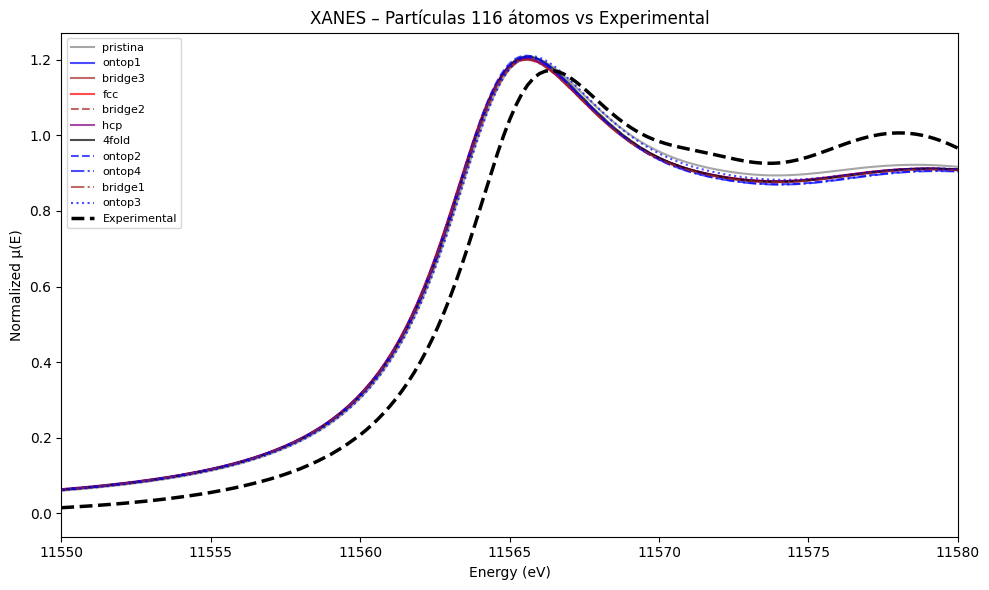


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.084305
ontop1     : RMSE = 0.095370
bridge3    : RMSE = 0.094961
fcc        : RMSE = 0.095985
bridge2    : RMSE = 0.091546
hcp        : RMSE = 0.094724
4fold      : RMSE = 0.093383
ontop2     : RMSE = 0.097409
ontop4     : RMSE = 0.095070
bridge1    : RMSE = 0.094424
ontop3     : RMSE = 0.086286

Top 3 μ(E):
1. pristina   (RMSE = 0.084305)
2. ontop3     (RMSE = 0.086286)
3. bridge2    (RMSE = 0.091546)


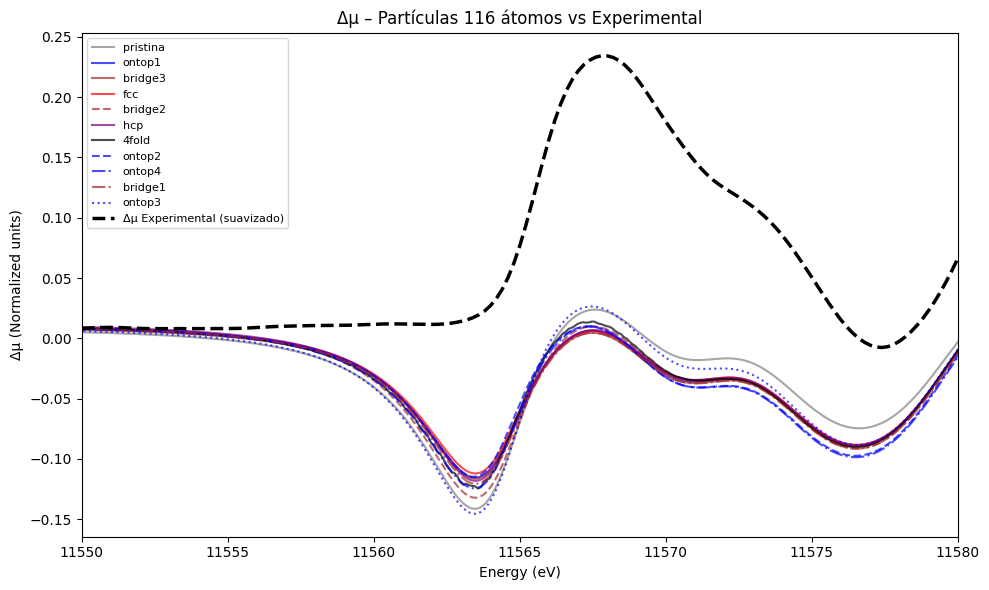


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.115197
ontop1     : RMSE = 0.121007
bridge3    : RMSE = 0.121884
fcc        : RMSE = 0.120243
bridge2    : RMSE = 0.122476
hcp        : RMSE = 0.120779
4fold      : RMSE = 0.120185
ontop2     : RMSE = 0.122138
ontop4     : RMSE = 0.123684
bridge1    : RMSE = 0.122726
ontop3     : RMSE = 0.118445

Top 3 Δμ:
1. pristina   (RMSE = 0.115197)
2. ontop3     (RMSE = 0.118445)
3. 4fold      (RMSE = 0.120185)
Arquivo: normalized/new_experimental\interp_sim_XANESNP_PristineCub_norm.txt


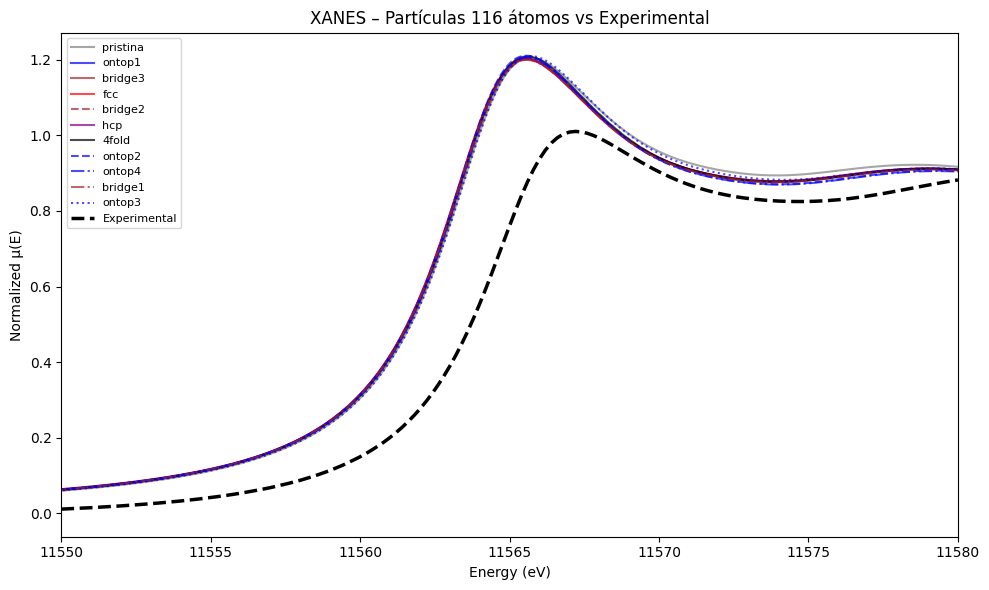


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.168690
ontop1     : RMSE = 0.173021
bridge3    : RMSE = 0.172252
fcc        : RMSE = 0.174002
bridge2    : RMSE = 0.168779
hcp        : RMSE = 0.172575
4fold      : RMSE = 0.171870
ontop2     : RMSE = 0.173613
ontop4     : RMSE = 0.170572
bridge1    : RMSE = 0.171063
ontop3     : RMSE = 0.167153

Top 3 μ(E):
1. ontop3     (RMSE = 0.167153)
2. pristina   (RMSE = 0.168690)
3. bridge2    (RMSE = 0.168779)


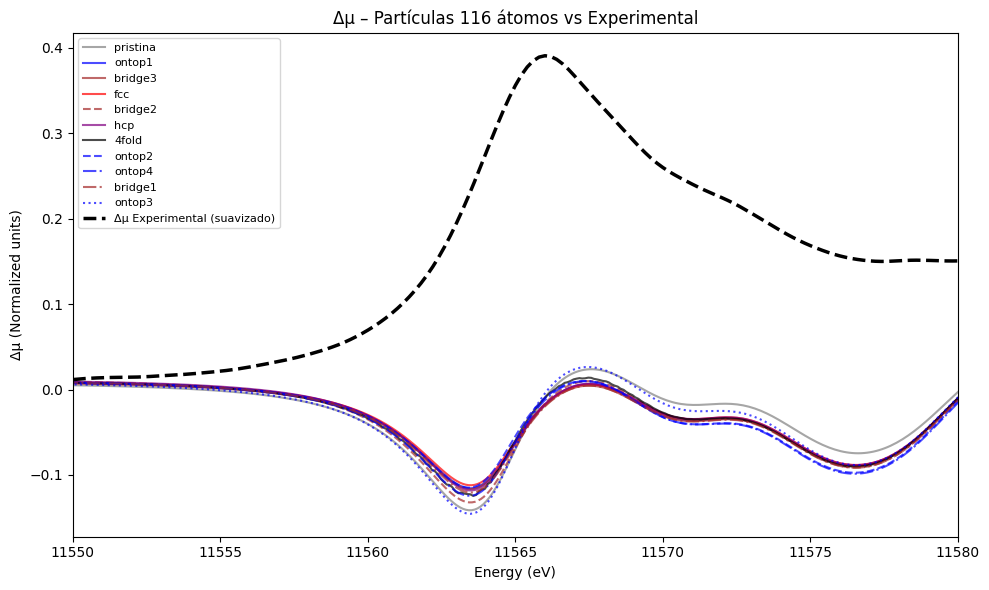


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.227720
ontop1     : RMSE = 0.231813
bridge3    : RMSE = 0.232675
fcc        : RMSE = 0.230939
bridge2    : RMSE = 0.234152
hcp        : RMSE = 0.231761
4fold      : RMSE = 0.231424
ontop2     : RMSE = 0.232809
ontop4     : RMSE = 0.234889
bridge1    : RMSE = 0.233773
ontop3     : RMSE = 0.231229

Top 3 Δμ:
1. pristina   (RMSE = 0.227720)
2. fcc        (RMSE = 0.230939)
3. ontop3     (RMSE = 0.231229)
Arquivo: normalized/new_experimental\interp_sim_XANESNP_PristineOct_norm.txt


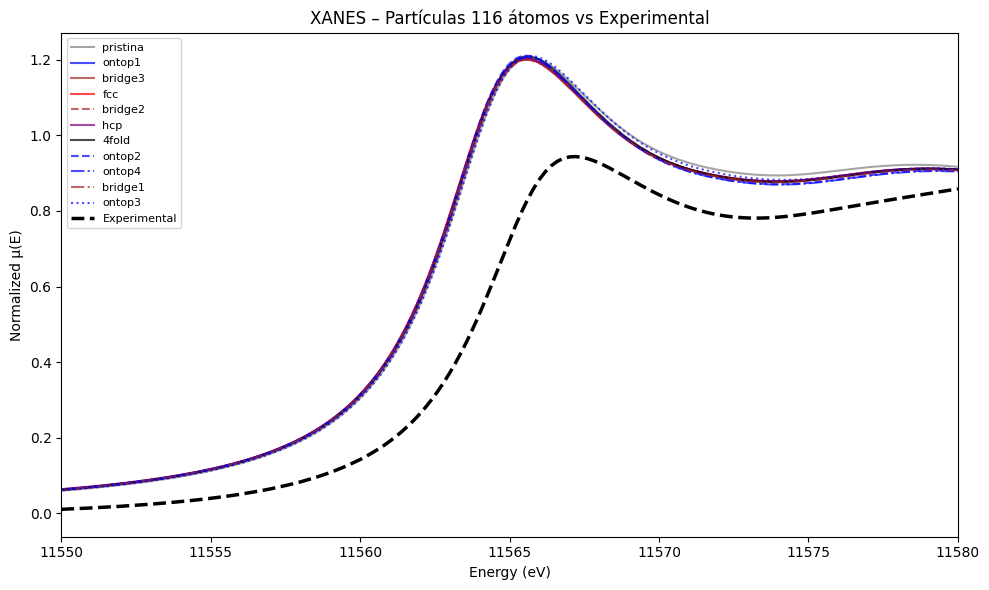


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.190307
ontop1     : RMSE = 0.192722
bridge3    : RMSE = 0.191880
fcc        : RMSE = 0.193719
bridge2    : RMSE = 0.188809
hcp        : RMSE = 0.192387
4fold      : RMSE = 0.191920
ontop2     : RMSE = 0.193046
ontop4     : RMSE = 0.190112
bridge1    : RMSE = 0.190690
ontop3     : RMSE = 0.188344

Top 3 μ(E):
1. ontop3     (RMSE = 0.188344)
2. bridge2    (RMSE = 0.188809)
3. ontop4     (RMSE = 0.190112)


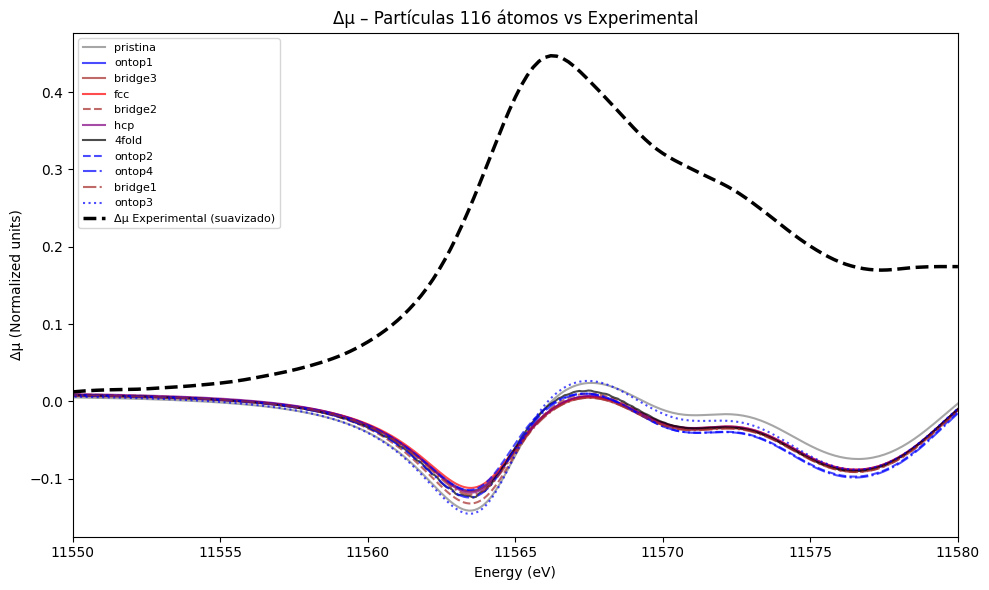


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.259483
ontop1     : RMSE = 0.264135
bridge3    : RMSE = 0.265003
fcc        : RMSE = 0.263284
bridge2    : RMSE = 0.266271
hcp        : RMSE = 0.264042
4fold      : RMSE = 0.263626
ontop2     : RMSE = 0.265161
ontop4     : RMSE = 0.267134
bridge1    : RMSE = 0.266055
ontop3     : RMSE = 0.263001

Top 3 Δμ:
1. pristina   (RMSE = 0.259483)
2. ontop3     (RMSE = 0.263001)
3. fcc        (RMSE = 0.263284)
Arquivo: normalized/new_experimental\norm_Pt_GO_func_160mV_norm.txt


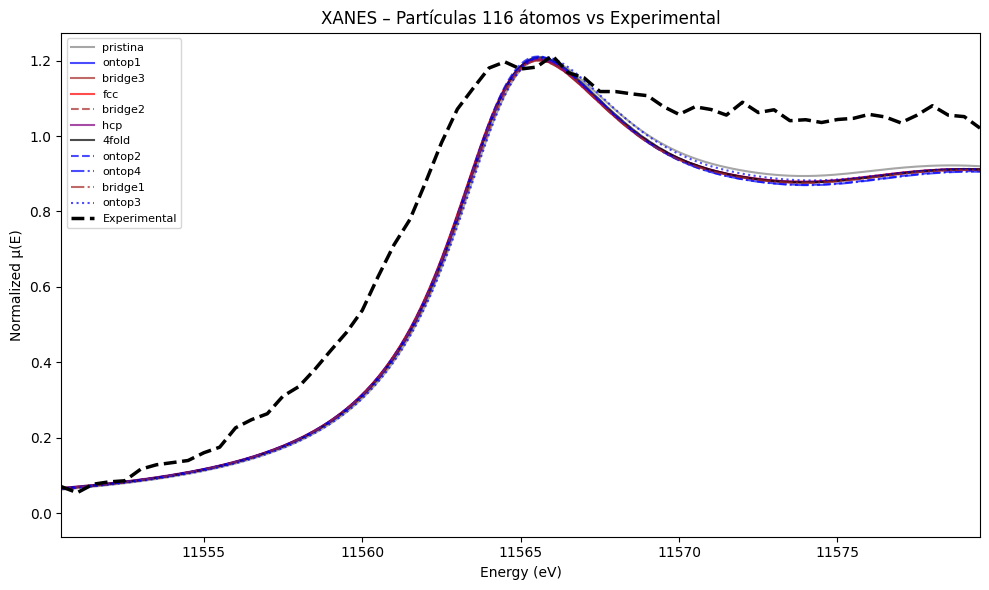


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.151590
ontop1     : RMSE = 0.151490
bridge3    : RMSE = 0.152273
fcc        : RMSE = 0.150448
bridge2    : RMSE = 0.154807
hcp        : RMSE = 0.151351
4fold      : RMSE = 0.153201
ontop2     : RMSE = 0.153789
ontop4     : RMSE = 0.155932
bridge1    : RMSE = 0.153239
ontop3     : RMSE = 0.155666

Top 3 μ(E):
1. fcc        (RMSE = 0.150448)
2. hcp        (RMSE = 0.151351)
3. ontop1     (RMSE = 0.151490)


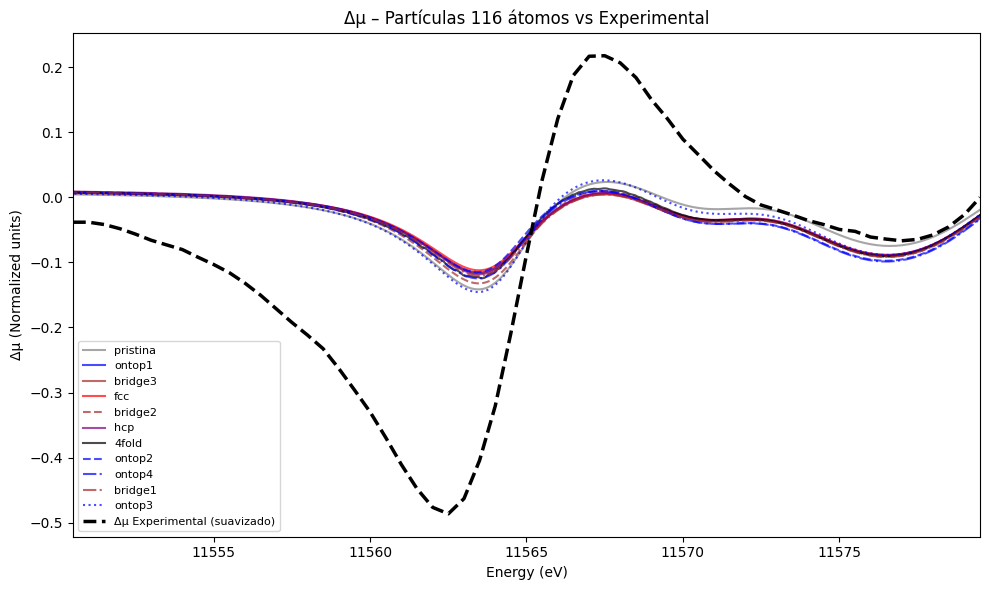


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.162536
ontop1     : RMSE = 0.172650
bridge3    : RMSE = 0.172355
fcc        : RMSE = 0.173341
bridge2    : RMSE = 0.168675
hcp        : RMSE = 0.172252
4fold      : RMSE = 0.169422
ontop2     : RMSE = 0.172605
ontop4     : RMSE = 0.170476
bridge1    : RMSE = 0.171807
ontop3     : RMSE = 0.162125

Top 3 Δμ:
1. ontop3     (RMSE = 0.162125)
2. pristina   (RMSE = 0.162536)
3. bridge2    (RMSE = 0.168675)
Arquivo: normalized/new_experimental\norm_Pt_GO_func_261mV_norm.txt


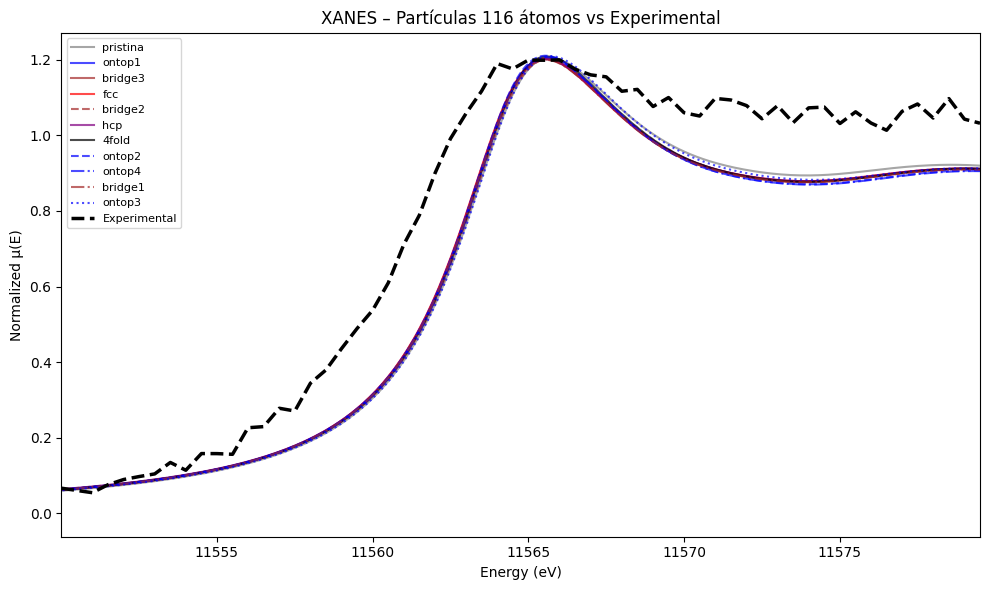


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.152557
ontop1     : RMSE = 0.152686
bridge3    : RMSE = 0.153464
fcc        : RMSE = 0.151659
bridge2    : RMSE = 0.155932
hcp        : RMSE = 0.152548
4fold      : RMSE = 0.154313
ontop2     : RMSE = 0.154960
ontop4     : RMSE = 0.157072
bridge1    : RMSE = 0.154425
ontop3     : RMSE = 0.156624

Top 3 μ(E):
1. fcc        (RMSE = 0.151659)
2. hcp        (RMSE = 0.152548)
3. pristina   (RMSE = 0.152557)


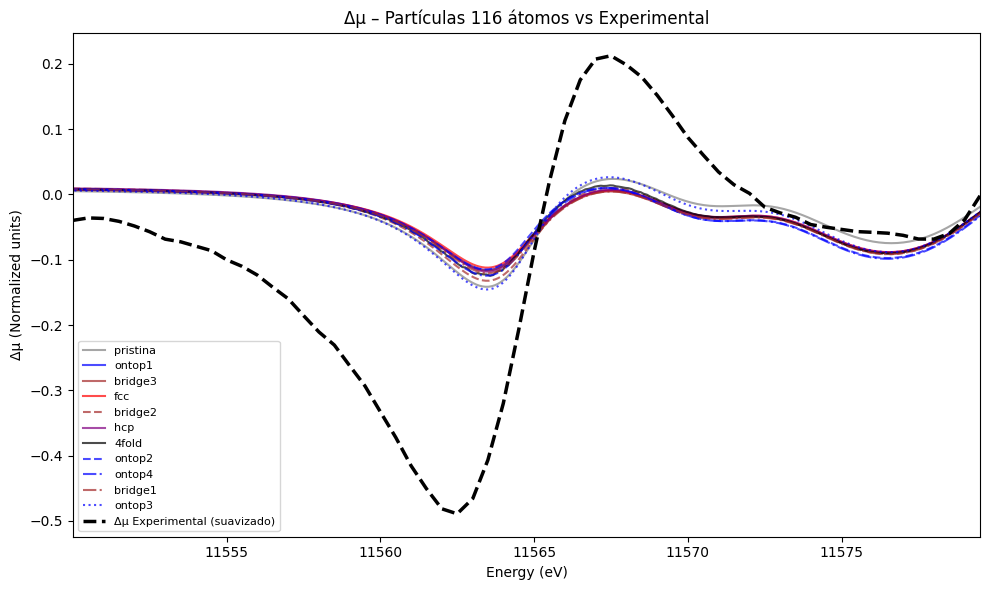


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.160258
ontop1     : RMSE = 0.170149
bridge3    : RMSE = 0.169837
fcc        : RMSE = 0.170850
bridge2    : RMSE = 0.166172
hcp        : RMSE = 0.169760
4fold      : RMSE = 0.166957
ontop2     : RMSE = 0.170067
ontop4     : RMSE = 0.167920
bridge1    : RMSE = 0.169275
ontop3     : RMSE = 0.159757

Top 3 Δμ:
1. ontop3     (RMSE = 0.159757)
2. pristina   (RMSE = 0.160258)
3. bridge2    (RMSE = 0.166172)
Arquivo: normalized/new_experimental\norm_Pt_GO_func_330mV_norm.txt


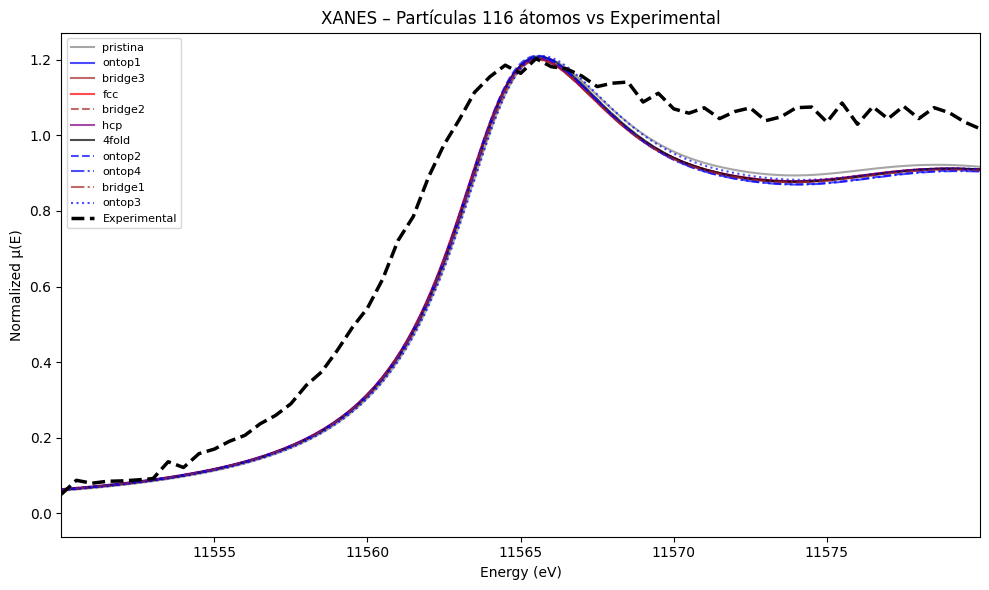


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.150375
ontop1     : RMSE = 0.150787
bridge3    : RMSE = 0.151564
fcc        : RMSE = 0.149795
bridge2    : RMSE = 0.153908
hcp        : RMSE = 0.150617
4fold      : RMSE = 0.152362
ontop2     : RMSE = 0.153153
ontop4     : RMSE = 0.155191
bridge1    : RMSE = 0.152501
ontop3     : RMSE = 0.154518

Top 3 μ(E):
1. fcc        (RMSE = 0.149795)
2. pristina   (RMSE = 0.150375)
3. hcp        (RMSE = 0.150617)


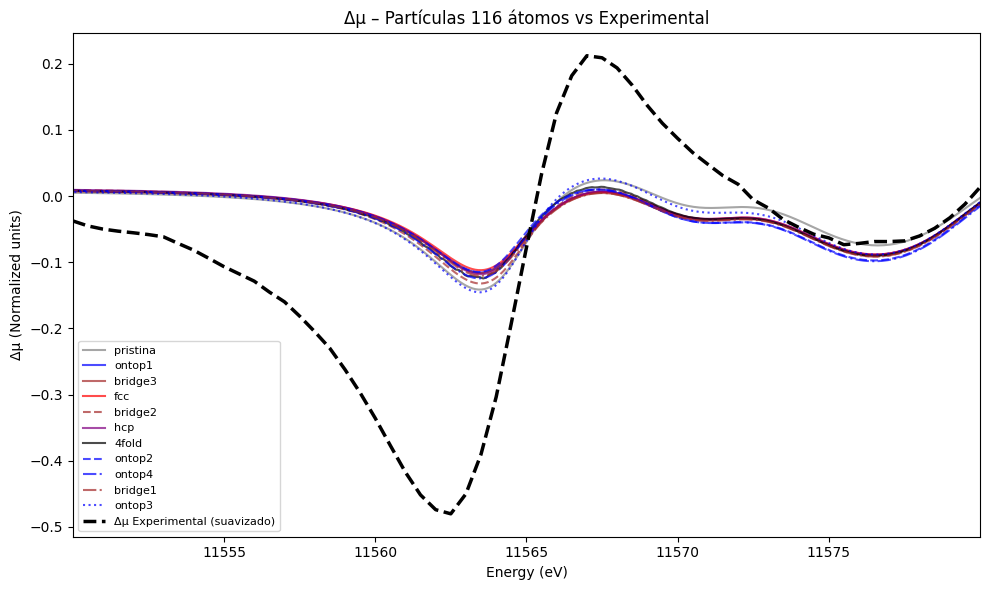


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.157664
ontop1     : RMSE = 0.167401
bridge3    : RMSE = 0.167094
fcc        : RMSE = 0.168078
bridge2    : RMSE = 0.163549
hcp        : RMSE = 0.167040
4fold      : RMSE = 0.164246
ontop2     : RMSE = 0.167280
ontop4     : RMSE = 0.165216
bridge1    : RMSE = 0.166573
ontop3     : RMSE = 0.157173

Top 3 Δμ:
1. ontop3     (RMSE = 0.157173)
2. pristina   (RMSE = 0.157664)
3. bridge2    (RMSE = 0.163549)
Arquivo: normalized/new_experimental\norm_Pt_GO_func_OCP_norm.txt


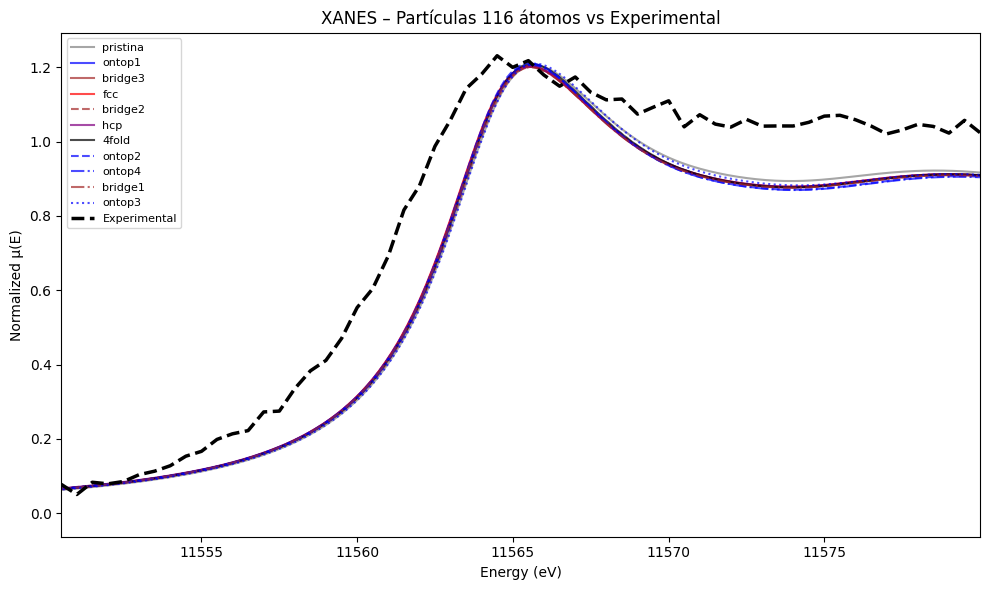


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.149860
ontop1     : RMSE = 0.149567
bridge3    : RMSE = 0.150348
fcc        : RMSE = 0.148524
bridge2    : RMSE = 0.152979
hcp        : RMSE = 0.149467
4fold      : RMSE = 0.151280
ontop2     : RMSE = 0.151793
ontop4     : RMSE = 0.154008
bridge1    : RMSE = 0.151353
ontop3     : RMSE = 0.153899

Top 3 μ(E):
1. fcc        (RMSE = 0.148524)
2. hcp        (RMSE = 0.149467)
3. ontop1     (RMSE = 0.149567)


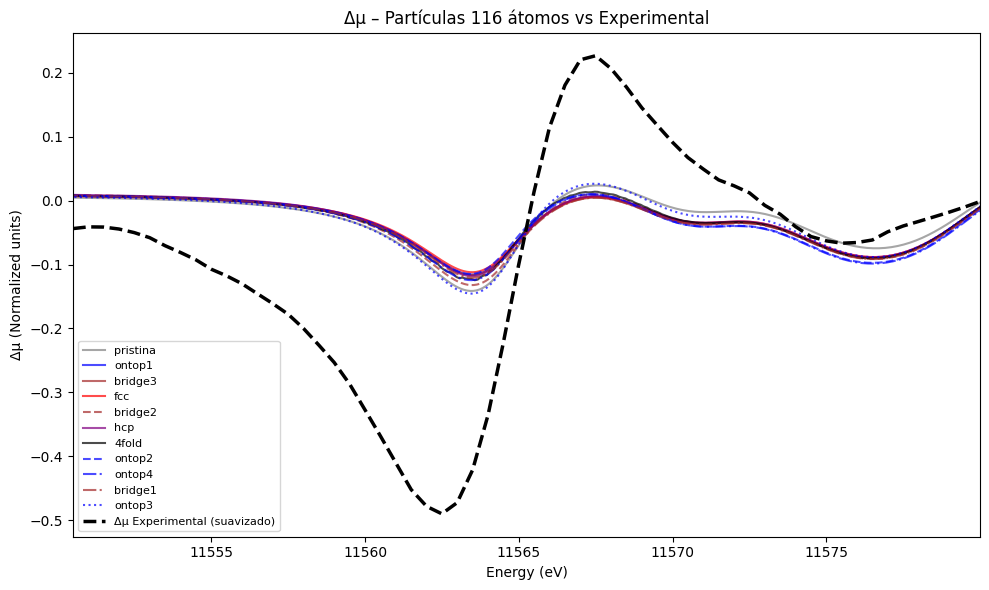


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.161458
ontop1     : RMSE = 0.171726
bridge3    : RMSE = 0.171440
fcc        : RMSE = 0.172418
bridge2    : RMSE = 0.167721
hcp        : RMSE = 0.171299
4fold      : RMSE = 0.168519
ontop2     : RMSE = 0.171786
ontop4     : RMSE = 0.169636
bridge1    : RMSE = 0.170883
ontop3     : RMSE = 0.161153

Top 3 Δμ:
1. ontop3     (RMSE = 0.161153)
2. pristina   (RMSE = 0.161458)
3. bridge2    (RMSE = 0.167721)
Arquivo: normalized/new_experimental\norm_Pt_MoS_Iso_160mV_norm.txt


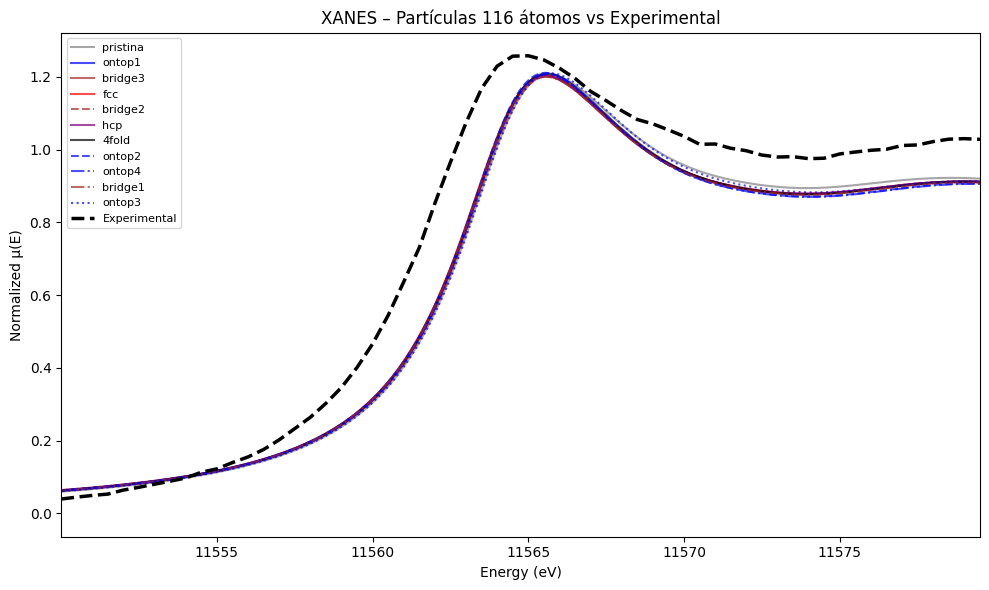


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.119871
ontop1     : RMSE = 0.118027
bridge3    : RMSE = 0.118736
fcc        : RMSE = 0.116888
bridge2    : RMSE = 0.122092
hcp        : RMSE = 0.118185
4fold      : RMSE = 0.119859
ontop2     : RMSE = 0.119688
ontop4     : RMSE = 0.122289
bridge1    : RMSE = 0.119957
ontop3     : RMSE = 0.123424

Top 3 μ(E):
1. fcc        (RMSE = 0.116888)
2. ontop1     (RMSE = 0.118027)
3. hcp        (RMSE = 0.118185)


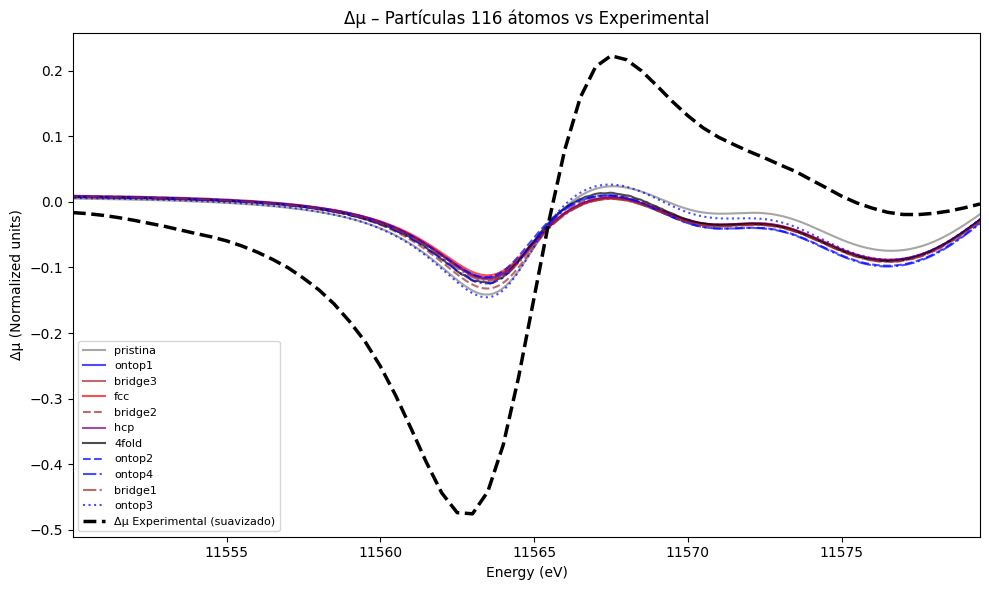


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.148306
ontop1     : RMSE = 0.160430
bridge3    : RMSE = 0.160318
fcc        : RMSE = 0.161023
bridge2    : RMSE = 0.156311
hcp        : RMSE = 0.159769
4fold      : RMSE = 0.157255
ontop2     : RMSE = 0.161296
ontop4     : RMSE = 0.159143
bridge1    : RMSE = 0.159745
ontop3     : RMSE = 0.149120

Top 3 Δμ:
1. pristina   (RMSE = 0.148306)
2. ontop3     (RMSE = 0.149120)
3. bridge2    (RMSE = 0.156311)
Arquivo: normalized/new_experimental\norm_Pt_MoS_Iso_261mV_norm.txt


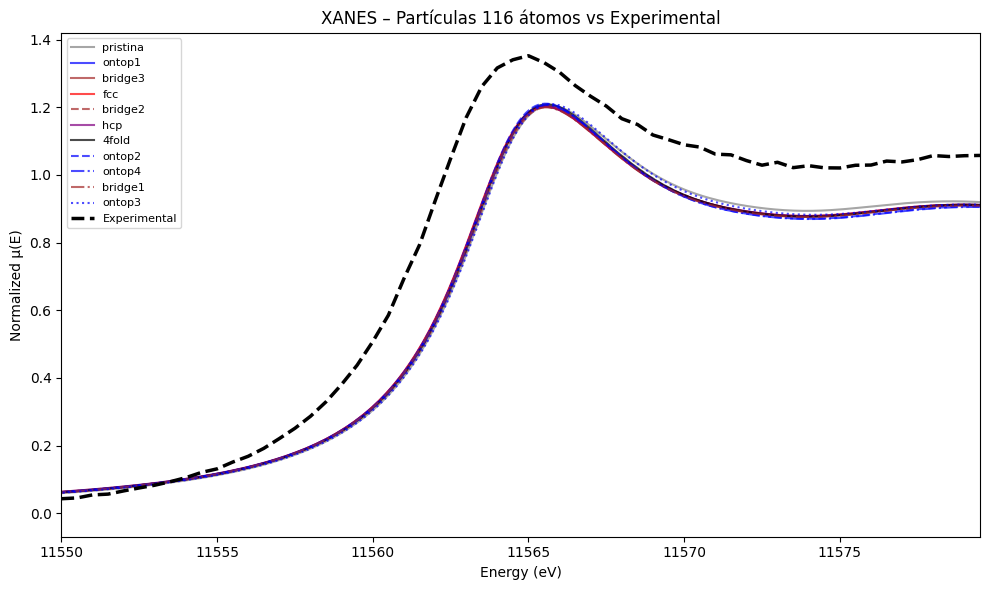


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.163572
ontop1     : RMSE = 0.162714
bridge3    : RMSE = 0.163506
fcc        : RMSE = 0.161587
bridge2    : RMSE = 0.166590
hcp        : RMSE = 0.162850
4fold      : RMSE = 0.164129
ontop2     : RMSE = 0.164092
ontop4     : RMSE = 0.166732
bridge1    : RMSE = 0.164731
ontop3     : RMSE = 0.167061

Top 3 μ(E):
1. fcc        (RMSE = 0.161587)
2. ontop1     (RMSE = 0.162714)
3. hcp        (RMSE = 0.162850)


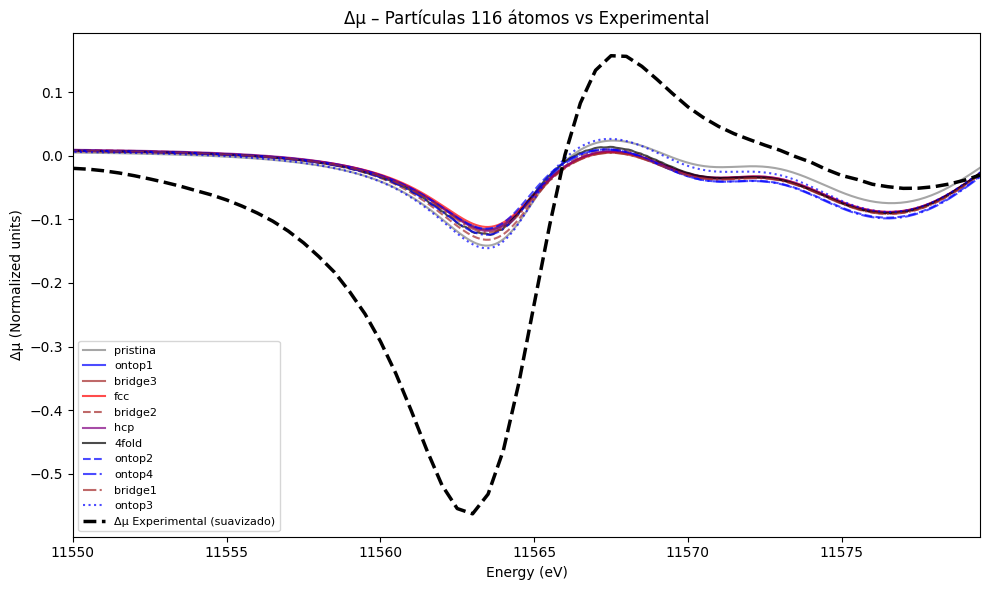


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.165229
ontop1     : RMSE = 0.175733
bridge3    : RMSE = 0.175373
fcc        : RMSE = 0.176549
bridge2    : RMSE = 0.171110
hcp        : RMSE = 0.175111
4fold      : RMSE = 0.172767
ontop2     : RMSE = 0.176366
ontop4     : RMSE = 0.173701
bridge1    : RMSE = 0.174533
ontop3     : RMSE = 0.165088

Top 3 Δμ:
1. ontop3     (RMSE = 0.165088)
2. pristina   (RMSE = 0.165229)
3. bridge2    (RMSE = 0.171110)
Arquivo: normalized/new_experimental\norm_Pt_MoS_Iso_330mV_norm.txt


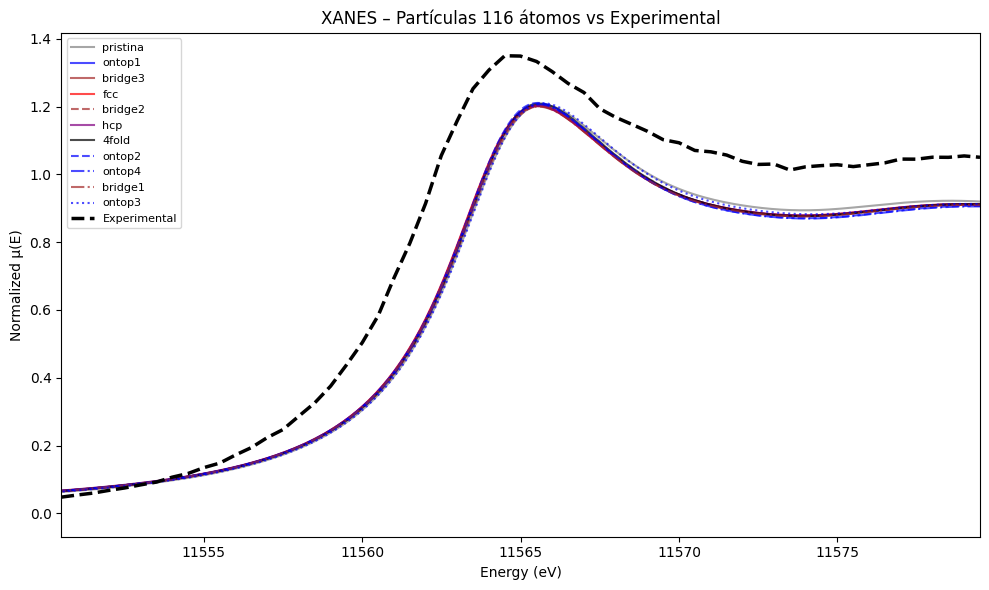


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.163449
ontop1     : RMSE = 0.162577
bridge3    : RMSE = 0.163382
fcc        : RMSE = 0.161443
bridge2    : RMSE = 0.166477
hcp        : RMSE = 0.162713
4fold      : RMSE = 0.163984
ontop2     : RMSE = 0.163948
ontop4     : RMSE = 0.166611
bridge1    : RMSE = 0.164613
ontop3     : RMSE = 0.166941

Top 3 μ(E):
1. fcc        (RMSE = 0.161443)
2. ontop1     (RMSE = 0.162577)
3. hcp        (RMSE = 0.162713)


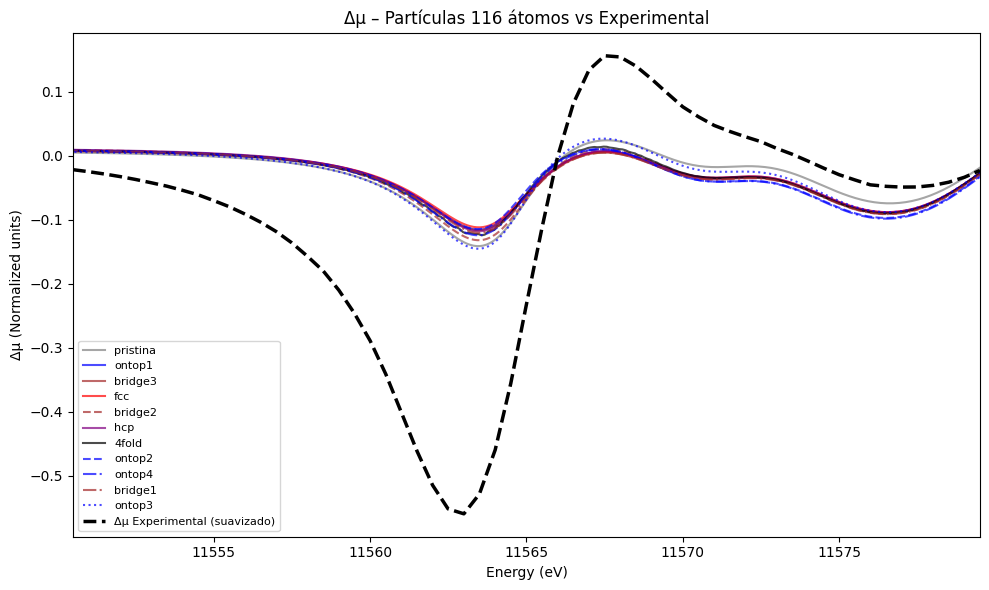


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.165578
ontop1     : RMSE = 0.176219
bridge3    : RMSE = 0.175860
fcc        : RMSE = 0.177037
bridge2    : RMSE = 0.171567
hcp        : RMSE = 0.175586
4fold      : RMSE = 0.173243
ontop2     : RMSE = 0.176889
ontop4     : RMSE = 0.174210
bridge1    : RMSE = 0.175018
ontop3     : RMSE = 0.165486

Top 3 Δμ:
1. ontop3     (RMSE = 0.165486)
2. pristina   (RMSE = 0.165578)
3. bridge2    (RMSE = 0.171567)
Arquivo: normalized/new_experimental\norm_Pt_MoS_Iso_OCP_norm.txt


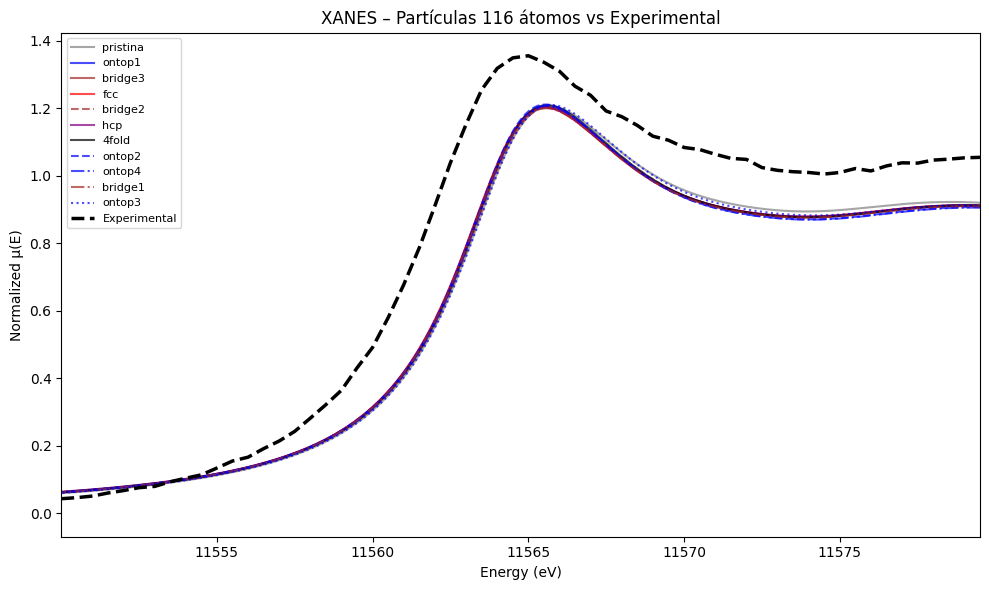


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.158387
ontop1     : RMSE = 0.157430
bridge3    : RMSE = 0.158224
fcc        : RMSE = 0.156304
bridge2    : RMSE = 0.161324
hcp        : RMSE = 0.157583
4fold      : RMSE = 0.158804
ontop2     : RMSE = 0.158718
ontop4     : RMSE = 0.161382
bridge1    : RMSE = 0.159456
ontop3     : RMSE = 0.161776

Top 3 μ(E):
1. fcc        (RMSE = 0.156304)
2. ontop1     (RMSE = 0.157430)
3. hcp        (RMSE = 0.157583)


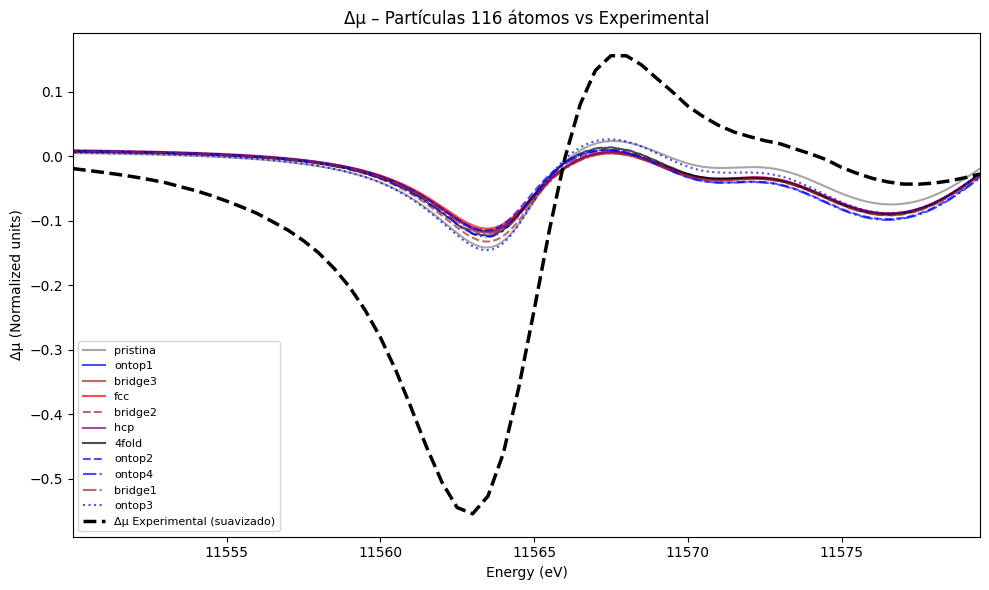


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.161997
ontop1     : RMSE = 0.172762
bridge3    : RMSE = 0.172418
fcc        : RMSE = 0.173556
bridge2    : RMSE = 0.168163
hcp        : RMSE = 0.172118
4fold      : RMSE = 0.169826
ontop2     : RMSE = 0.173528
ontop4     : RMSE = 0.170883
bridge1    : RMSE = 0.171594
ontop3     : RMSE = 0.162067

Top 3 Δμ:
1. pristina   (RMSE = 0.161997)
2. ontop3     (RMSE = 0.162067)
3. bridge2    (RMSE = 0.168163)
Arquivo: normalized/new_experimental\norm_Pt_PVP_160mV_norm.txt


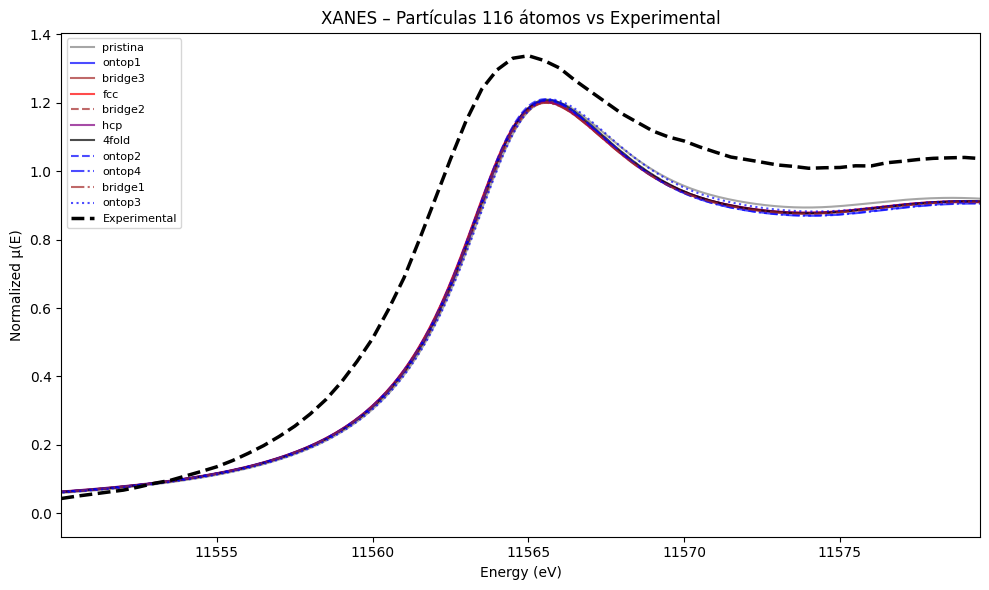


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.157218
ontop1     : RMSE = 0.156102
bridge3    : RMSE = 0.156908
fcc        : RMSE = 0.154984
bridge2    : RMSE = 0.159972
hcp        : RMSE = 0.156237
4fold      : RMSE = 0.157532
ontop2     : RMSE = 0.157402
ontop4     : RMSE = 0.160040
bridge1    : RMSE = 0.158106
ontop3     : RMSE = 0.160537

Top 3 μ(E):
1. fcc        (RMSE = 0.154984)
2. ontop1     (RMSE = 0.156102)
3. hcp        (RMSE = 0.156237)


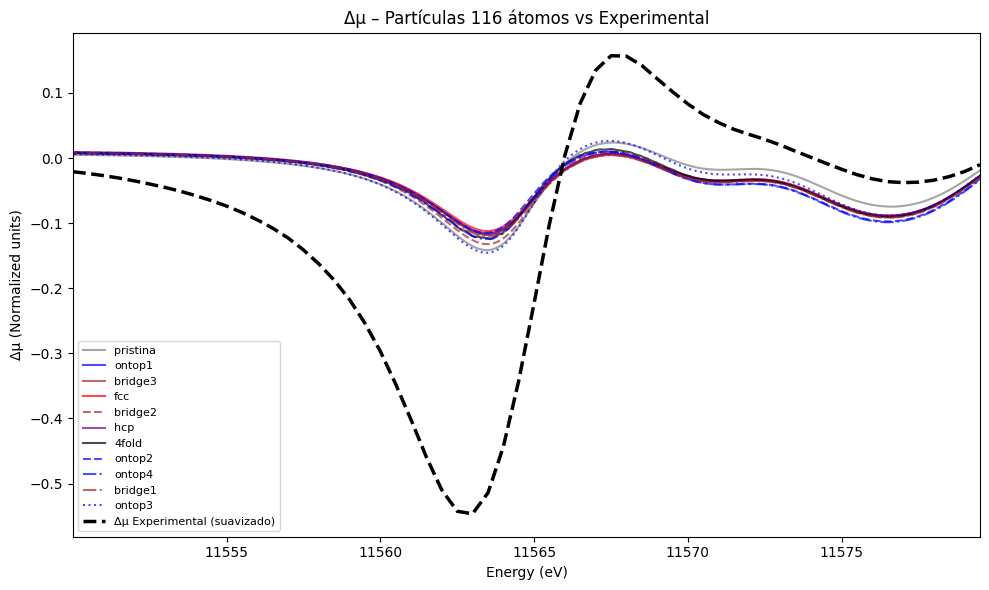


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.163576
ontop1     : RMSE = 0.174387
bridge3    : RMSE = 0.174041
fcc        : RMSE = 0.175161
bridge2    : RMSE = 0.169879
hcp        : RMSE = 0.173766
4fold      : RMSE = 0.171433
ontop2     : RMSE = 0.175146
ontop4     : RMSE = 0.172563
bridge1    : RMSE = 0.173265
ontop3     : RMSE = 0.163731

Top 3 Δμ:
1. pristina   (RMSE = 0.163576)
2. ontop3     (RMSE = 0.163731)
3. bridge2    (RMSE = 0.169879)
Arquivo: normalized/new_experimental\norm_Pt_PVP_261mV_norm.txt


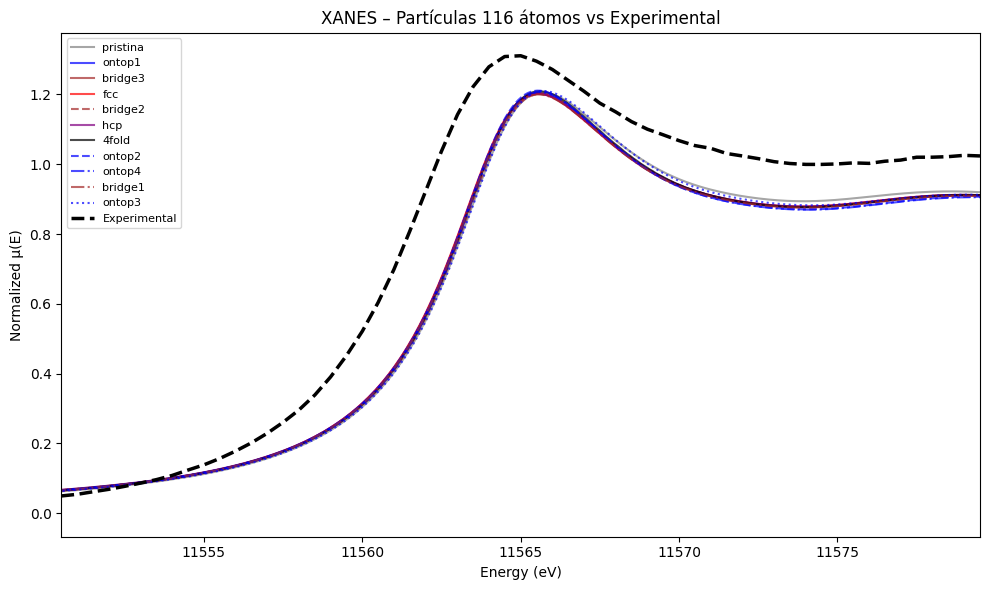


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.152801
ontop1     : RMSE = 0.150940
bridge3    : RMSE = 0.151735
fcc        : RMSE = 0.149809
bridge2    : RMSE = 0.154949
hcp        : RMSE = 0.151091
4fold      : RMSE = 0.152585
ontop2     : RMSE = 0.152256
ontop4     : RMSE = 0.154927
bridge1    : RMSE = 0.152916
ontop3     : RMSE = 0.156008

Top 3 μ(E):
1. fcc        (RMSE = 0.149809)
2. ontop1     (RMSE = 0.150940)
3. hcp        (RMSE = 0.151091)


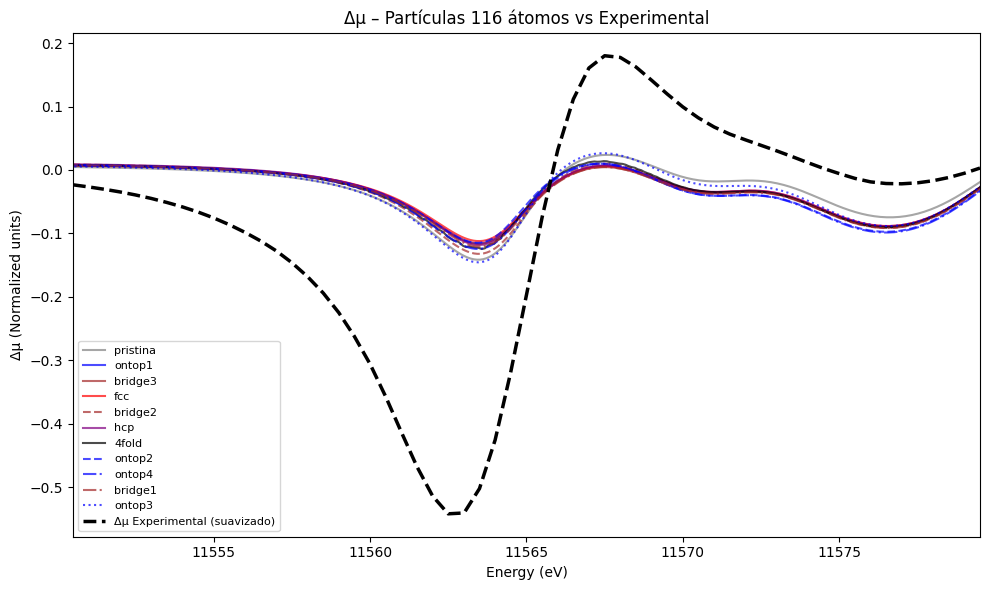


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.168121
ontop1     : RMSE = 0.179404
bridge3    : RMSE = 0.179112
fcc        : RMSE = 0.180134
bridge2    : RMSE = 0.174995
hcp        : RMSE = 0.178777
4fold      : RMSE = 0.176365
ontop2     : RMSE = 0.180198
ontop4     : RMSE = 0.177733
bridge1    : RMSE = 0.178408
ontop3     : RMSE = 0.168514

Top 3 Δμ:
1. pristina   (RMSE = 0.168121)
2. ontop3     (RMSE = 0.168514)
3. bridge2    (RMSE = 0.174995)
Arquivo: normalized/new_experimental\norm_Pt_PVP_330mV_norm.txt


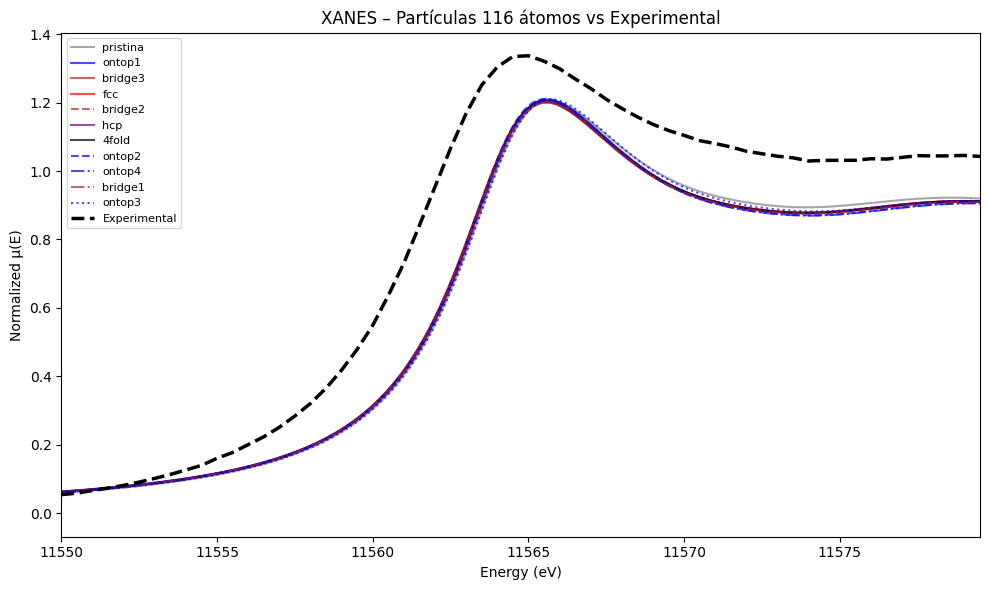


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.174702
ontop1     : RMSE = 0.173724
bridge3    : RMSE = 0.174565
fcc        : RMSE = 0.172623
bridge2    : RMSE = 0.177475
hcp        : RMSE = 0.173796
4fold      : RMSE = 0.175155
ontop2     : RMSE = 0.175108
ontop4     : RMSE = 0.177681
bridge1    : RMSE = 0.175698
ontop3     : RMSE = 0.178049

Top 3 μ(E):
1. fcc        (RMSE = 0.172623)
2. ontop1     (RMSE = 0.173724)
3. hcp        (RMSE = 0.173796)


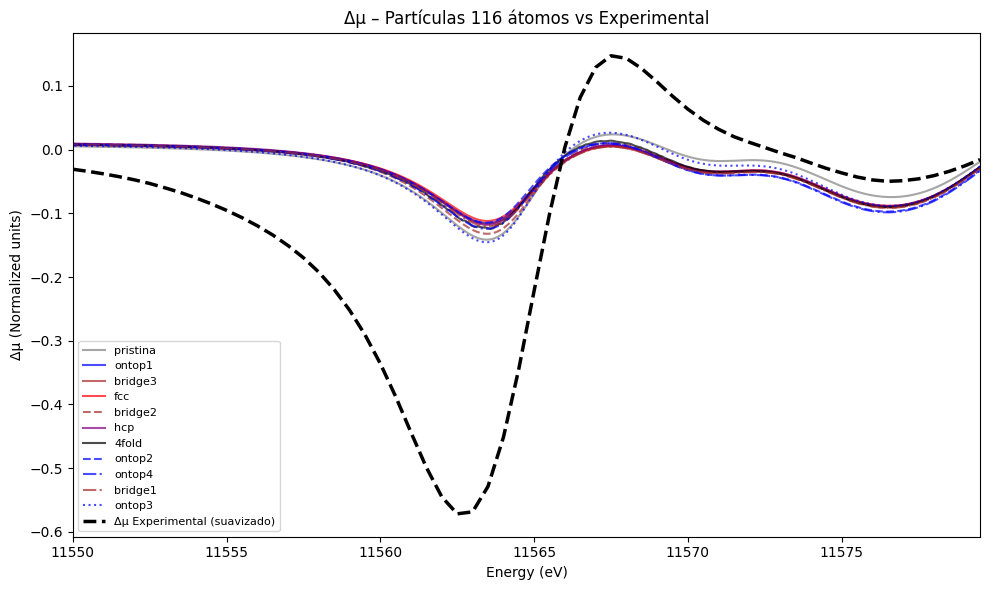


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.176316
ontop1     : RMSE = 0.186369
bridge3    : RMSE = 0.185937
fcc        : RMSE = 0.187184
bridge2    : RMSE = 0.181897
hcp        : RMSE = 0.185834
4fold      : RMSE = 0.183471
ontop2     : RMSE = 0.186880
ontop4     : RMSE = 0.184269
bridge1    : RMSE = 0.185156
ontop3     : RMSE = 0.176104

Top 3 Δμ:
1. ontop3     (RMSE = 0.176104)
2. pristina   (RMSE = 0.176316)
3. bridge2    (RMSE = 0.181897)
Arquivo: normalized/new_experimental\norm_Pt_PVP_OCP_norm.txt


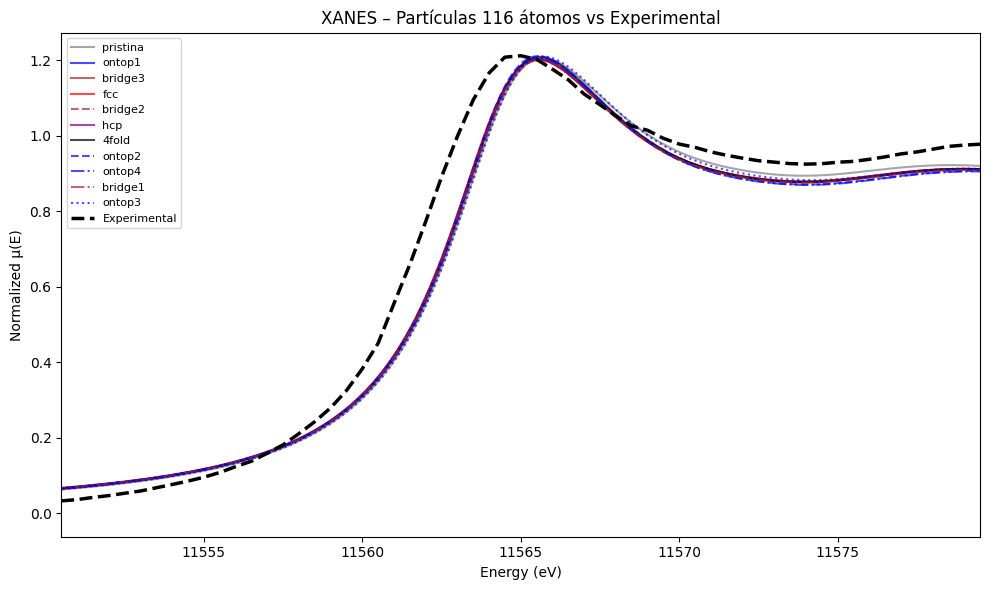


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.078037
ontop1     : RMSE = 0.073681
bridge3    : RMSE = 0.074136
fcc        : RMSE = 0.072522
bridge2    : RMSE = 0.078225
hcp        : RMSE = 0.074081
4fold      : RMSE = 0.076103
ontop2     : RMSE = 0.075198
ontop4     : RMSE = 0.077834
bridge1    : RMSE = 0.075425
ontop3     : RMSE = 0.080967

Top 3 μ(E):
1. fcc        (RMSE = 0.072522)
2. ontop1     (RMSE = 0.073681)
3. hcp        (RMSE = 0.074081)


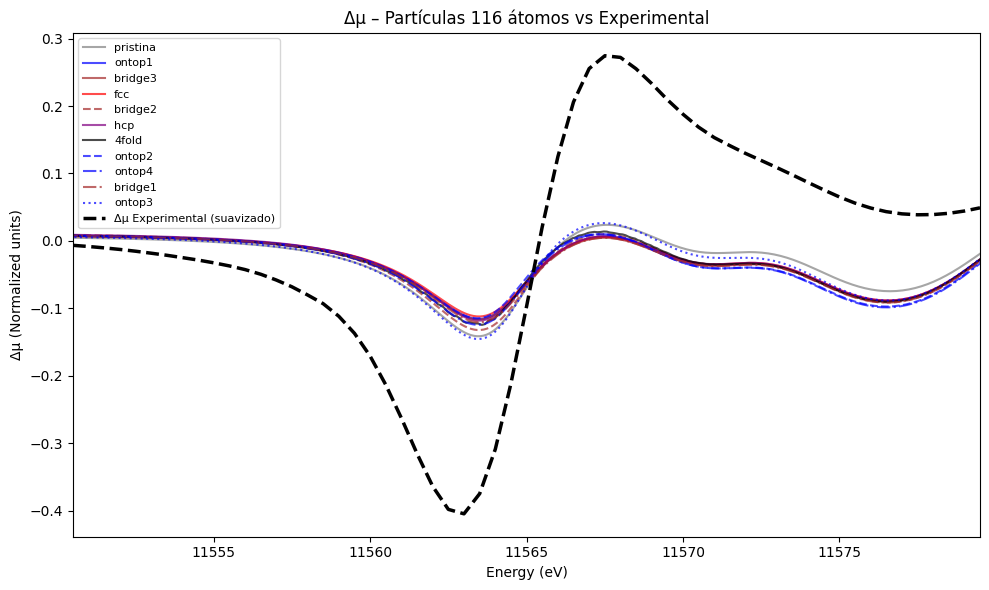


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.144839
ontop1     : RMSE = 0.158101
bridge3    : RMSE = 0.158319
fcc        : RMSE = 0.158390
bridge2    : RMSE = 0.154820
hcp        : RMSE = 0.157345
4fold      : RMSE = 0.155078
ontop2     : RMSE = 0.159542
ontop4     : RMSE = 0.158080
bridge1    : RMSE = 0.158051
ontop3     : RMSE = 0.147091

Top 3 Δμ:
1. pristina   (RMSE = 0.144839)
2. ontop3     (RMSE = 0.147091)
3. bridge2    (RMSE = 0.154820)
Arquivo: normalized/new_experimental\norm_Pt_foil_1_norm.txt


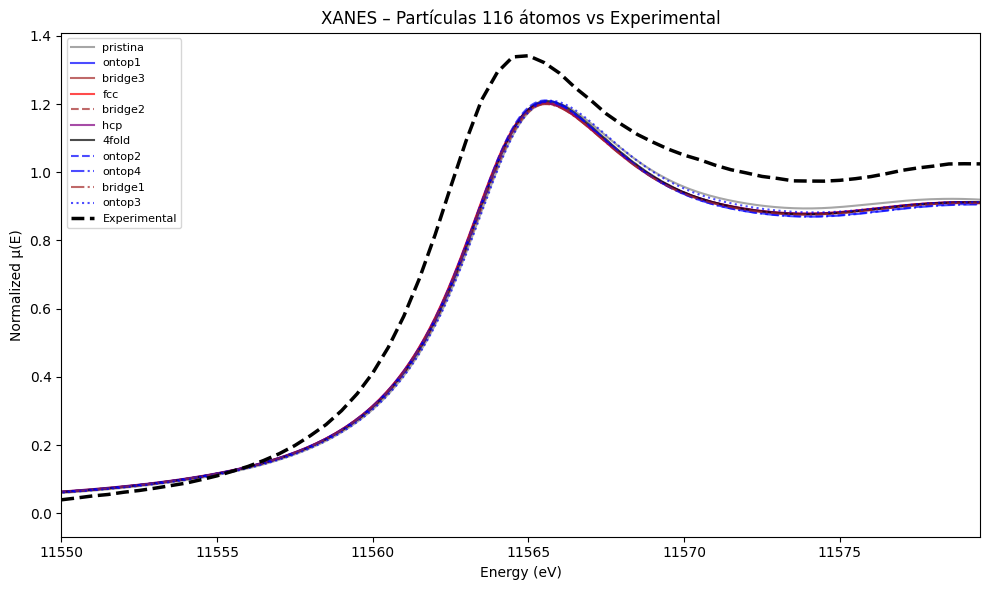


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.121684
ontop1     : RMSE = 0.120533
bridge3    : RMSE = 0.121255
fcc        : RMSE = 0.119387
bridge2    : RMSE = 0.124573
hcp        : RMSE = 0.120788
4fold      : RMSE = 0.121855
ontop2     : RMSE = 0.121677
ontop4     : RMSE = 0.124420
bridge1    : RMSE = 0.122589
ontop3     : RMSE = 0.125007

Top 3 μ(E):
1. fcc        (RMSE = 0.119387)
2. ontop1     (RMSE = 0.120533)
3. hcp        (RMSE = 0.120788)


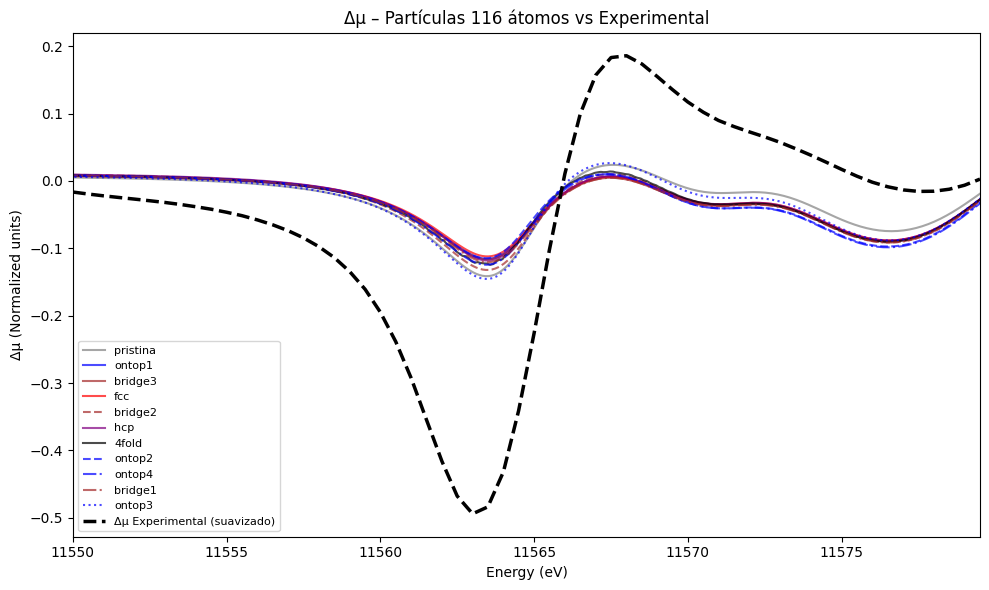


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.139584
ontop1     : RMSE = 0.151855
bridge3    : RMSE = 0.151713
fcc        : RMSE = 0.152498
bridge2    : RMSE = 0.147462
hcp        : RMSE = 0.151079
4fold      : RMSE = 0.148895
ontop2     : RMSE = 0.153149
ontop4     : RMSE = 0.150741
bridge1    : RMSE = 0.150999
ontop3     : RMSE = 0.140613

Top 3 Δμ:
1. pristina   (RMSE = 0.139584)
2. ontop3     (RMSE = 0.140613)
3. bridge2    (RMSE = 0.147462)
Arquivo: normalized/new_experimental\norm_Pt_foil_2_norm.txt


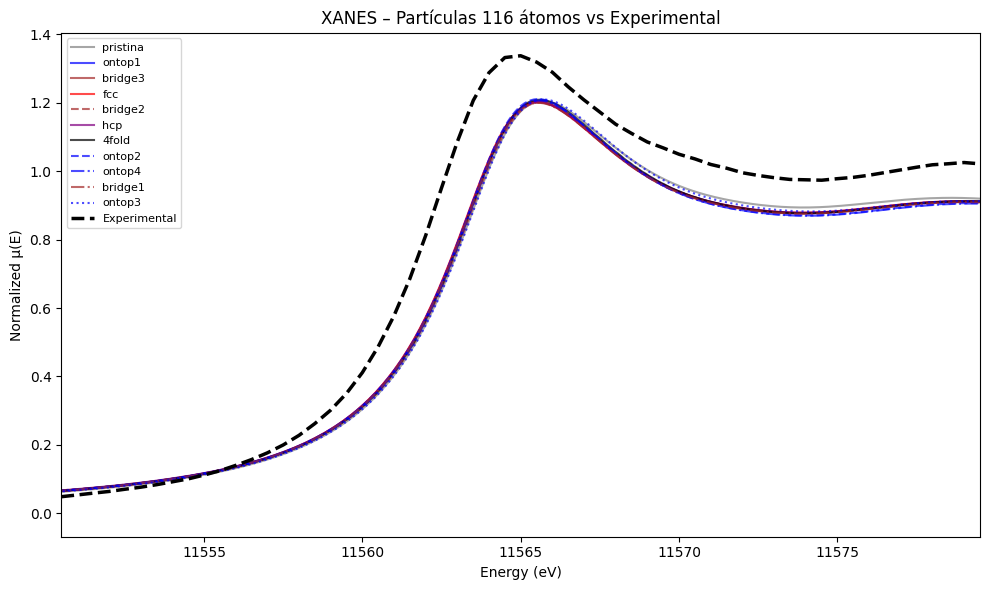


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.120898
ontop1     : RMSE = 0.119771
bridge3    : RMSE = 0.120512
fcc        : RMSE = 0.118616
bridge2    : RMSE = 0.123830
hcp        : RMSE = 0.120013
4fold      : RMSE = 0.121116
ontop2     : RMSE = 0.120956
ontop4     : RMSE = 0.123717
bridge1    : RMSE = 0.121849
ontop3     : RMSE = 0.124274

Top 3 μ(E):
1. fcc        (RMSE = 0.118616)
2. ontop1     (RMSE = 0.119771)
3. hcp        (RMSE = 0.120013)


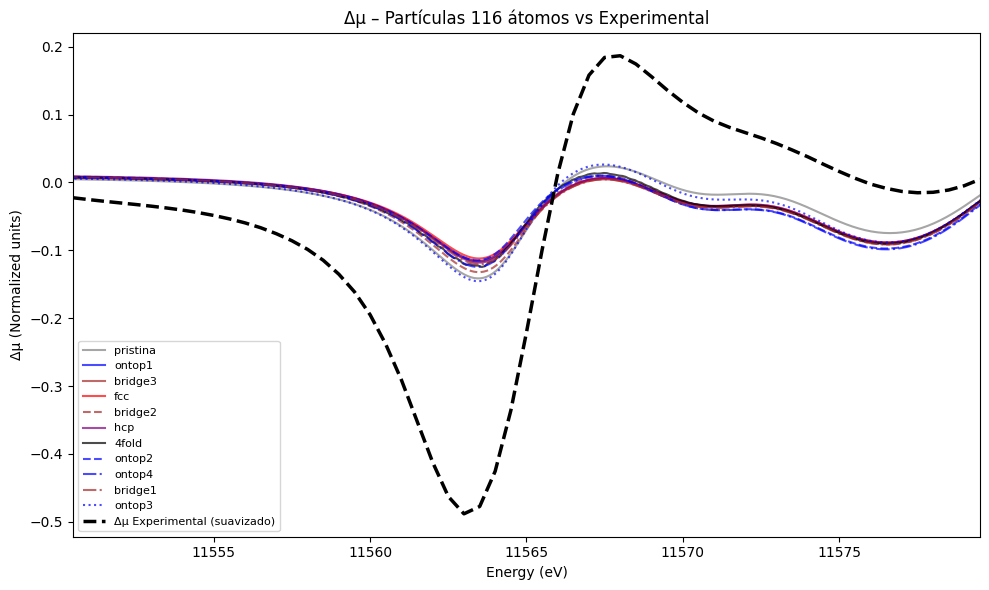


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.139680
ontop1     : RMSE = 0.152087
bridge3    : RMSE = 0.151947
fcc        : RMSE = 0.152727
bridge2    : RMSE = 0.147681
hcp        : RMSE = 0.151308
4fold      : RMSE = 0.149083
ontop2     : RMSE = 0.153387
ontop4     : RMSE = 0.150979
bridge1    : RMSE = 0.151239
ontop3     : RMSE = 0.140740

Top 3 Δμ:
1. pristina   (RMSE = 0.139680)
2. ontop3     (RMSE = 0.140740)
3. bridge2    (RMSE = 0.147681)
Arquivo: normalized/new_experimental\norm_Pt_foil_4_norm.txt


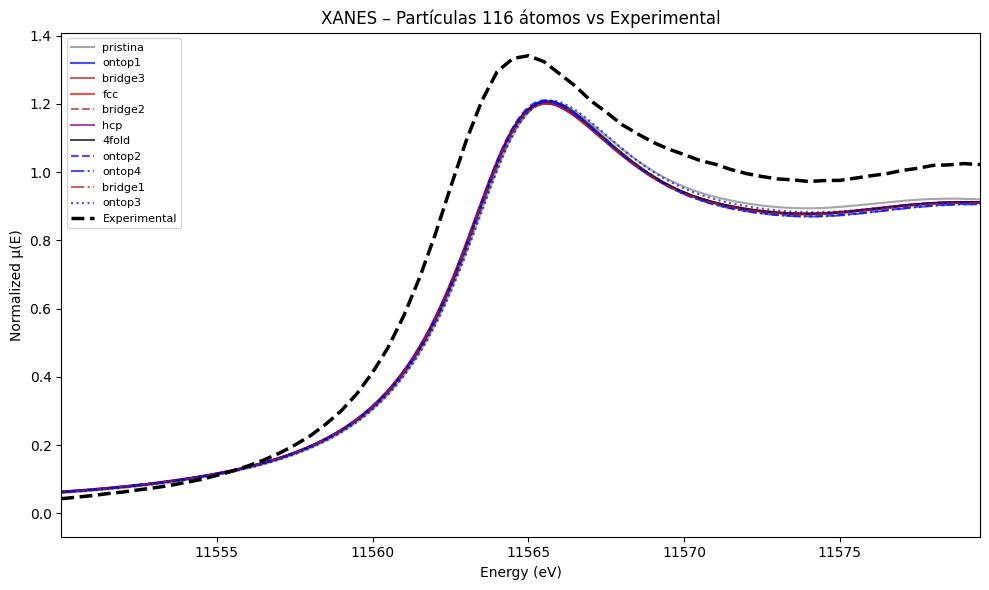


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.121221
ontop1     : RMSE = 0.120088
bridge3    : RMSE = 0.120819
fcc        : RMSE = 0.118943
bridge2    : RMSE = 0.124117
hcp        : RMSE = 0.120337
4fold      : RMSE = 0.121412
ontop2     : RMSE = 0.121231
ontop4     : RMSE = 0.123973
bridge1    : RMSE = 0.122146
ontop3     : RMSE = 0.124539

Top 3 μ(E):
1. fcc        (RMSE = 0.118943)
2. ontop1     (RMSE = 0.120088)
3. hcp        (RMSE = 0.120337)


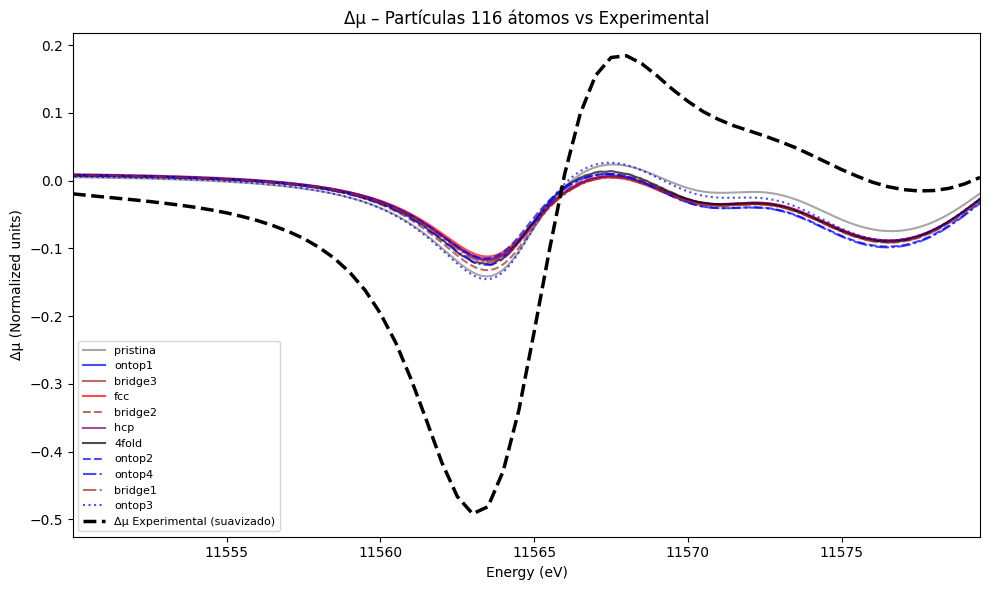


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.139273
ontop1     : RMSE = 0.151551
bridge3    : RMSE = 0.151406
fcc        : RMSE = 0.152190
bridge2    : RMSE = 0.147171
hcp        : RMSE = 0.150778
4fold      : RMSE = 0.148585
ontop2     : RMSE = 0.152849
ontop4     : RMSE = 0.150448
bridge1    : RMSE = 0.150697
ontop3     : RMSE = 0.140320

Top 3 Δμ:
1. pristina   (RMSE = 0.139273)
2. ontop3     (RMSE = 0.140320)
3. bridge2    (RMSE = 0.147171)
Arquivo: normalized/new_experimental\norm_Pt_foil_5_norm.txt


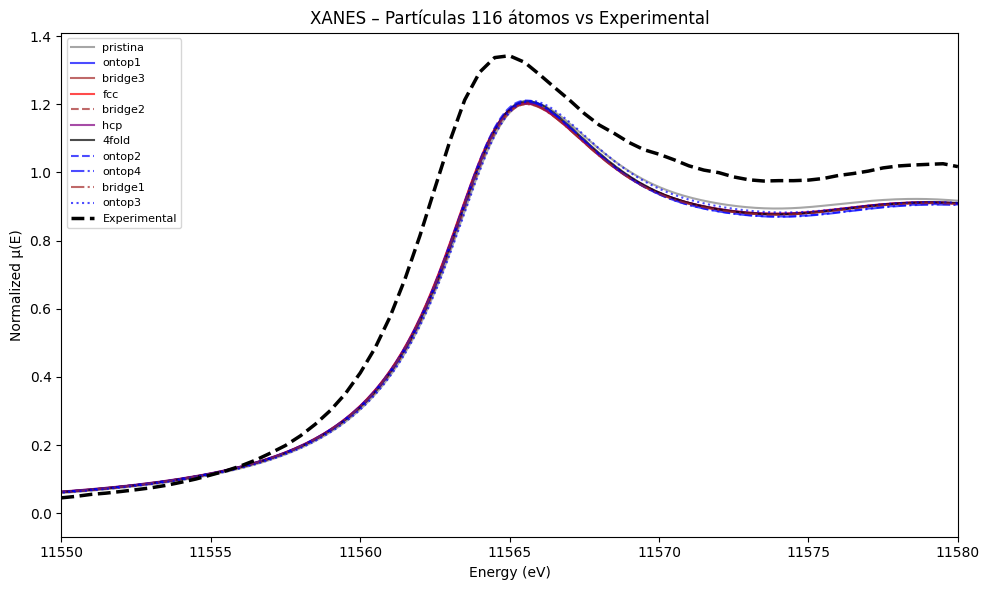


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.121055
ontop1     : RMSE = 0.120031
bridge3    : RMSE = 0.120757
fcc        : RMSE = 0.118908
bridge2    : RMSE = 0.124028
hcp        : RMSE = 0.120275
4fold      : RMSE = 0.121330
ontop2     : RMSE = 0.121218
ontop4     : RMSE = 0.123944
bridge1    : RMSE = 0.122092
ontop3     : RMSE = 0.124421

Top 3 μ(E):
1. fcc        (RMSE = 0.118908)
2. ontop1     (RMSE = 0.120031)
3. hcp        (RMSE = 0.120275)


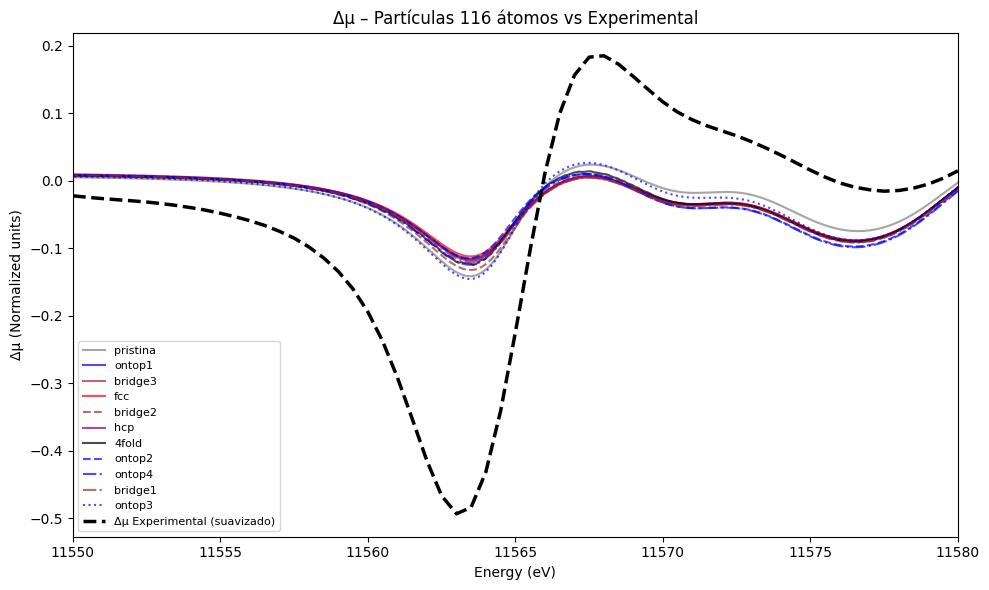


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.138248
ontop1     : RMSE = 0.150444
bridge3    : RMSE = 0.150300
fcc        : RMSE = 0.151081
bridge2    : RMSE = 0.146099
hcp        : RMSE = 0.149679
4fold      : RMSE = 0.147503
ontop2     : RMSE = 0.151737
ontop4     : RMSE = 0.149356
bridge1    : RMSE = 0.149601
ontop3     : RMSE = 0.139290

Top 3 Δμ:
1. pristina   (RMSE = 0.138248)
2. ontop3     (RMSE = 0.139290)
3. bridge2    (RMSE = 0.146099)
Arquivo: normalized/new_experimental\norm_Pt_foil_5std_norm.txt


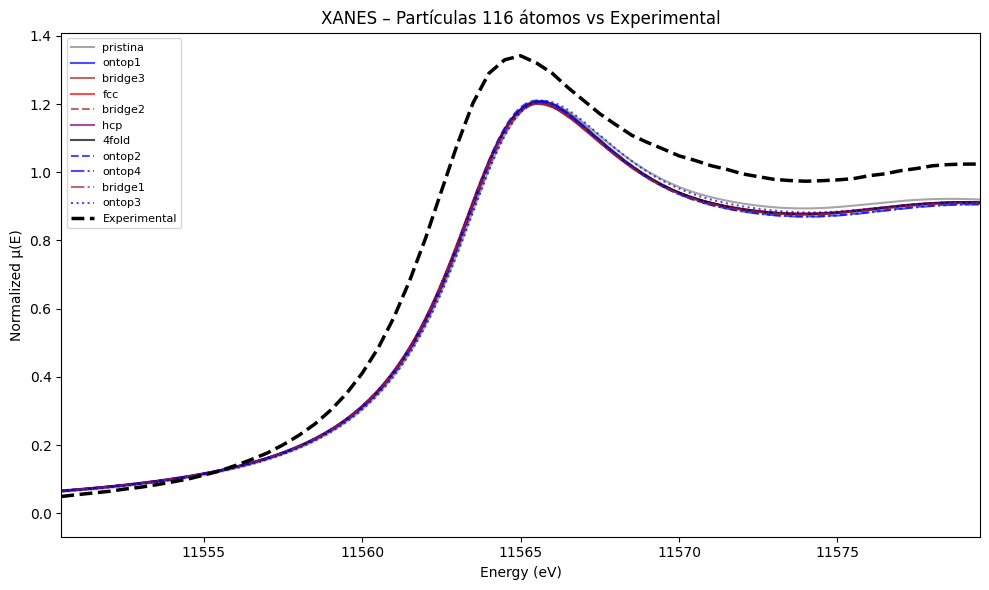


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.120095
ontop1     : RMSE = 0.119026
bridge3    : RMSE = 0.119769
fcc        : RMSE = 0.117873
bridge2    : RMSE = 0.123071
hcp        : RMSE = 0.119264
4fold      : RMSE = 0.120340
ontop2     : RMSE = 0.120209
ontop4     : RMSE = 0.122967
bridge1    : RMSE = 0.121108
ontop3     : RMSE = 0.123477

Top 3 μ(E):
1. fcc        (RMSE = 0.117873)
2. ontop1     (RMSE = 0.119026)
3. hcp        (RMSE = 0.119264)


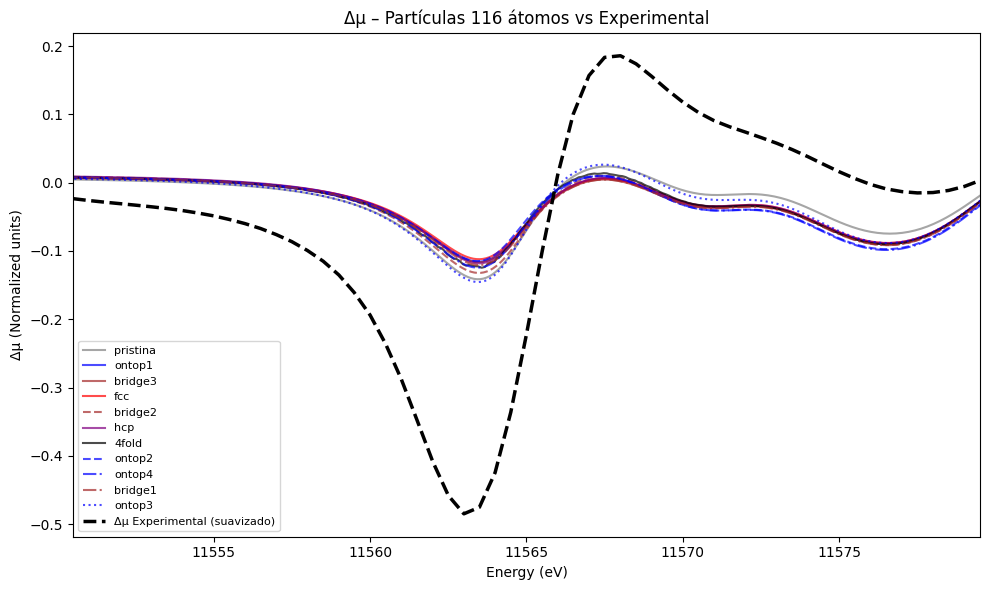


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.138824
ontop1     : RMSE = 0.151249
bridge3    : RMSE = 0.151110
fcc        : RMSE = 0.151886
bridge2    : RMSE = 0.146851
hcp        : RMSE = 0.150469
4fold      : RMSE = 0.148261
ontop2     : RMSE = 0.152565
ontop4     : RMSE = 0.150159
bridge1    : RMSE = 0.150404
ontop3     : RMSE = 0.139904

Top 3 Δμ:
1. pristina   (RMSE = 0.138824)
2. ontop3     (RMSE = 0.139904)
3. bridge2    (RMSE = 0.146851)
Arquivo: normalized/new_experimental\norm_Pt_foil_6_norm.txt


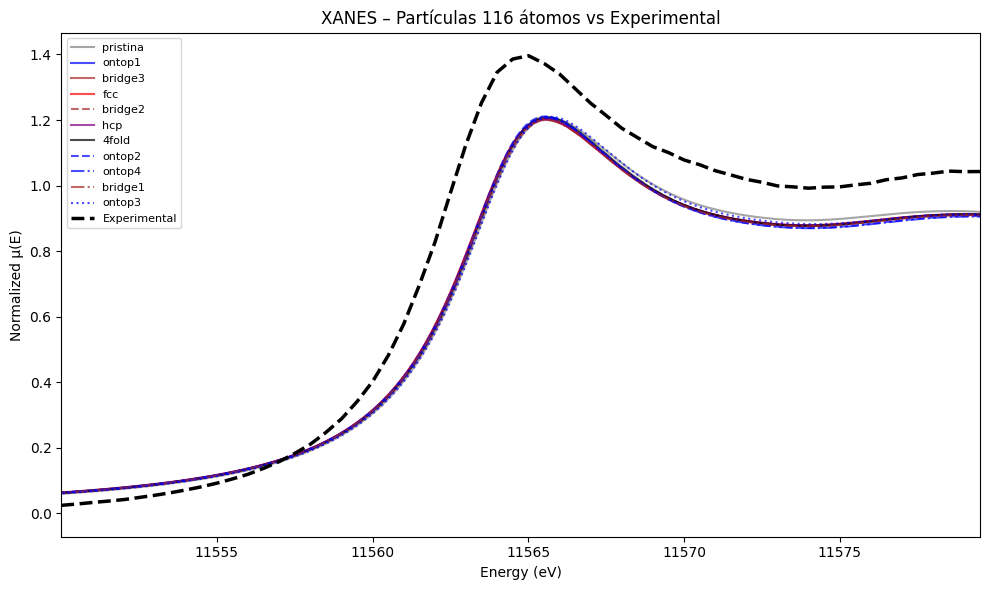


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.141372
ontop1     : RMSE = 0.141300
bridge3    : RMSE = 0.142003
fcc        : RMSE = 0.140186
bridge2    : RMSE = 0.145097
hcp        : RMSE = 0.141563
4fold      : RMSE = 0.142270
ontop2     : RMSE = 0.142318
ontop4     : RMSE = 0.144978
bridge1    : RMSE = 0.143348
ontop3     : RMSE = 0.144740

Top 3 μ(E):
1. fcc        (RMSE = 0.140186)
2. ontop1     (RMSE = 0.141300)
3. pristina   (RMSE = 0.141372)


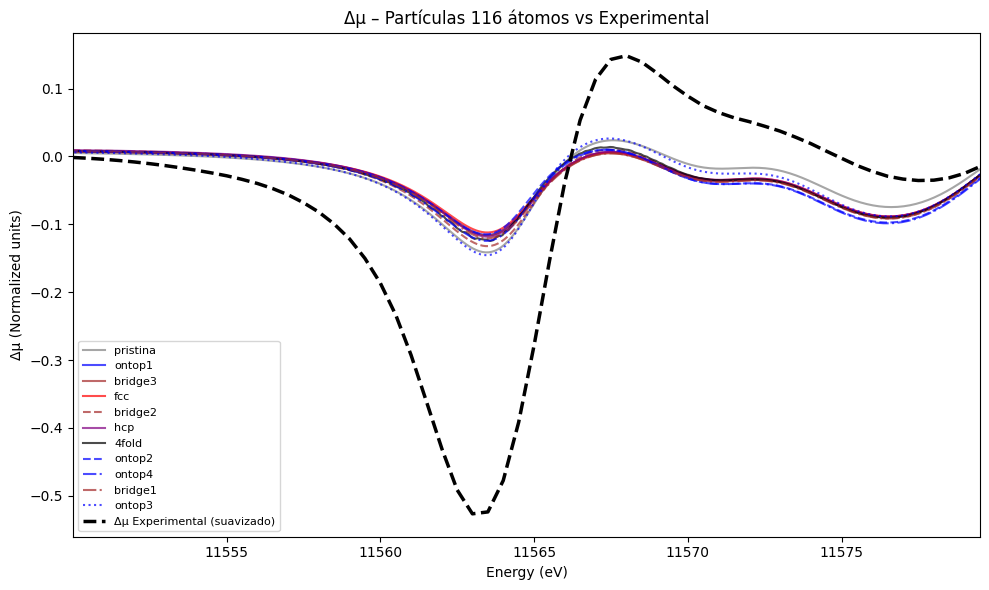


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.140631
ontop1     : RMSE = 0.151961
bridge3    : RMSE = 0.151739
fcc        : RMSE = 0.152726
bridge2    : RMSE = 0.147249
hcp        : RMSE = 0.151143
4fold      : RMSE = 0.149157
ontop2     : RMSE = 0.153212
ontop4     : RMSE = 0.150517
bridge1    : RMSE = 0.150832
ontop3     : RMSE = 0.141147

Top 3 Δμ:
1. pristina   (RMSE = 0.140631)
2. ontop3     (RMSE = 0.141147)
3. bridge2    (RMSE = 0.147249)
Arquivo: normalized/new_experimental\norm_Pt_foil_Limpa_1_norm.txt


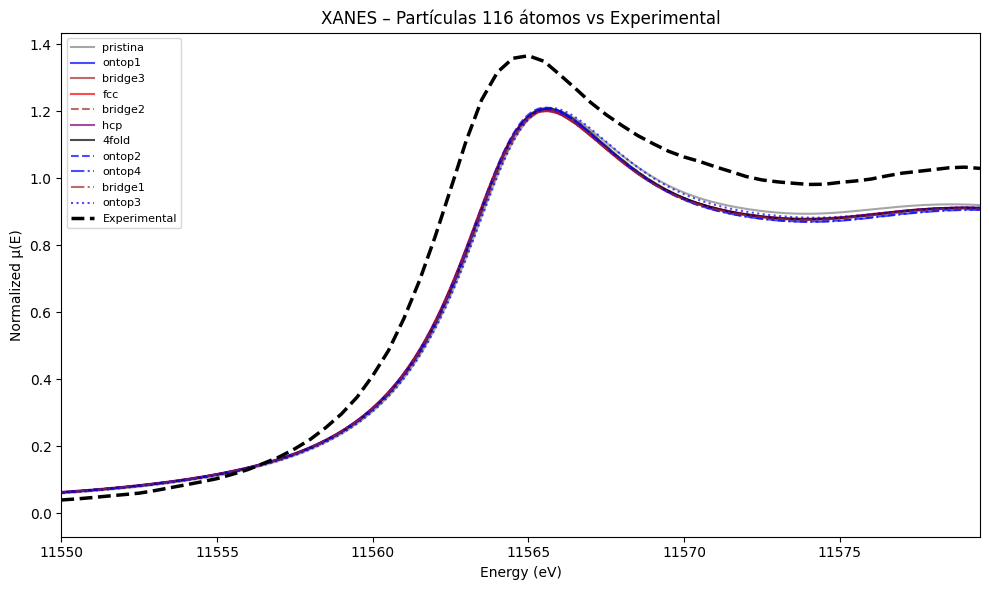


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.130682
ontop1     : RMSE = 0.129986
bridge3    : RMSE = 0.130709
fcc        : RMSE = 0.128852
bridge2    : RMSE = 0.133926
hcp        : RMSE = 0.130240
4fold      : RMSE = 0.131158
ontop2     : RMSE = 0.131071
ontop4     : RMSE = 0.133788
bridge1    : RMSE = 0.132045
ontop3     : RMSE = 0.134024

Top 3 μ(E):
1. fcc        (RMSE = 0.128852)
2. ontop1     (RMSE = 0.129986)
3. hcp        (RMSE = 0.130240)


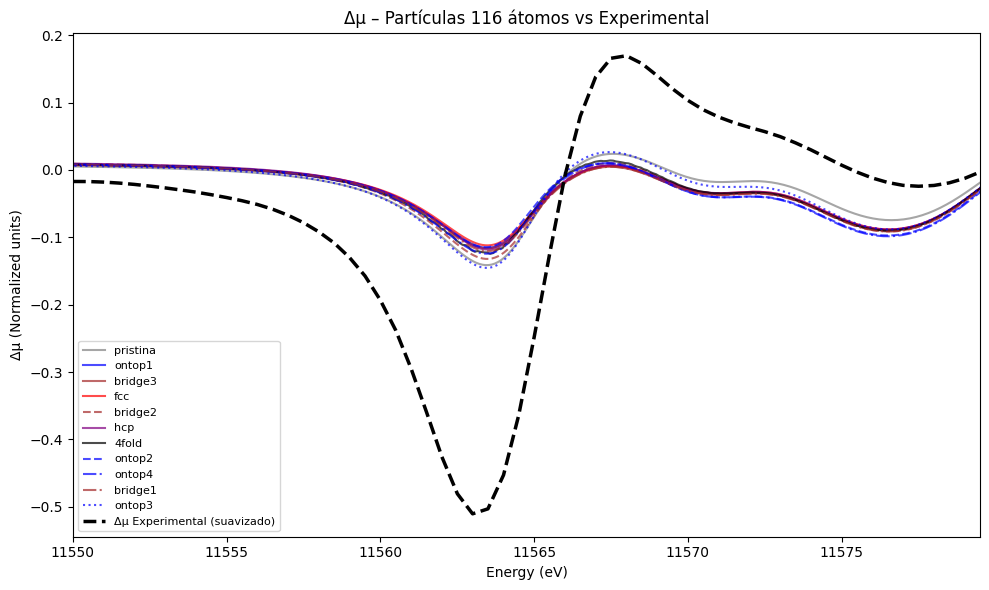


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.140285
ontop1     : RMSE = 0.152176
bridge3    : RMSE = 0.151990
fcc        : RMSE = 0.152876
bridge2    : RMSE = 0.147628
hcp        : RMSE = 0.151386
4fold      : RMSE = 0.149273
ontop2     : RMSE = 0.153444
ontop4     : RMSE = 0.150899
bridge1    : RMSE = 0.151191
ontop3     : RMSE = 0.141082

Top 3 Δμ:
1. pristina   (RMSE = 0.140285)
2. ontop3     (RMSE = 0.141082)
3. bridge2    (RMSE = 0.147628)
Arquivo: normalized/new_experimental\norm_Pt_foil_Limpa_2_norm.txt


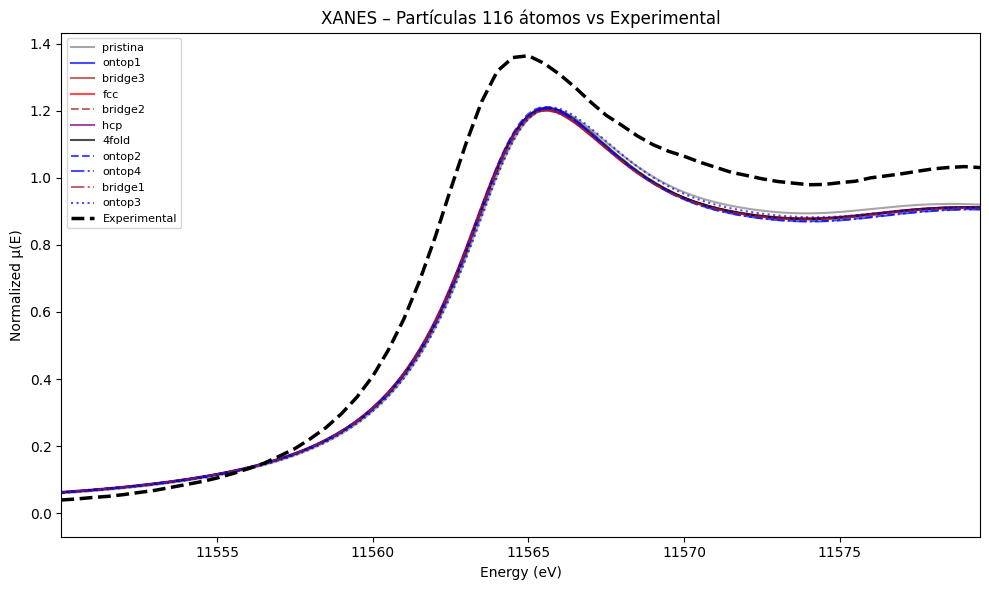


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.129218
ontop1     : RMSE = 0.128512
bridge3    : RMSE = 0.129235
fcc        : RMSE = 0.127377
bridge2    : RMSE = 0.132456
hcp        : RMSE = 0.128765
4fold      : RMSE = 0.129692
ontop2     : RMSE = 0.129607
ontop4     : RMSE = 0.132325
bridge1    : RMSE = 0.130573
ontop3     : RMSE = 0.132570

Top 3 μ(E):
1. fcc        (RMSE = 0.127377)
2. ontop1     (RMSE = 0.128512)
3. hcp        (RMSE = 0.128765)


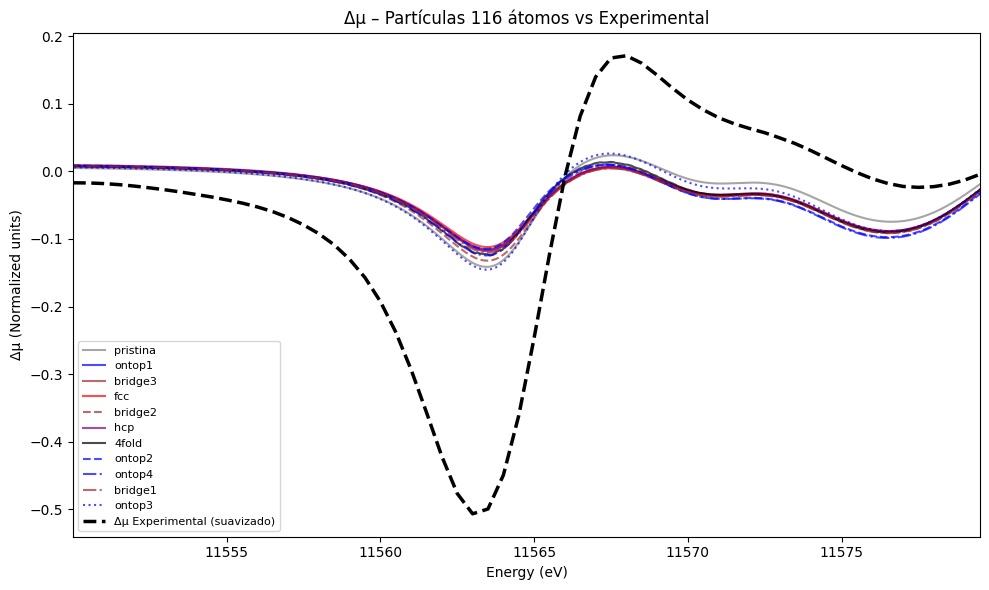


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.139648
ontop1     : RMSE = 0.151591
bridge3    : RMSE = 0.151411
fcc        : RMSE = 0.152283
bridge2    : RMSE = 0.147061
hcp        : RMSE = 0.150801
4fold      : RMSE = 0.148678
ontop2     : RMSE = 0.152867
ontop4     : RMSE = 0.150336
bridge1    : RMSE = 0.150621
ontop3     : RMSE = 0.140474

Top 3 Δμ:
1. pristina   (RMSE = 0.139648)
2. ontop3     (RMSE = 0.140474)
3. bridge2    (RMSE = 0.147061)
Arquivo: normalized/new_experimental\norm_Pt_foil_Limpa_6_norm.txt


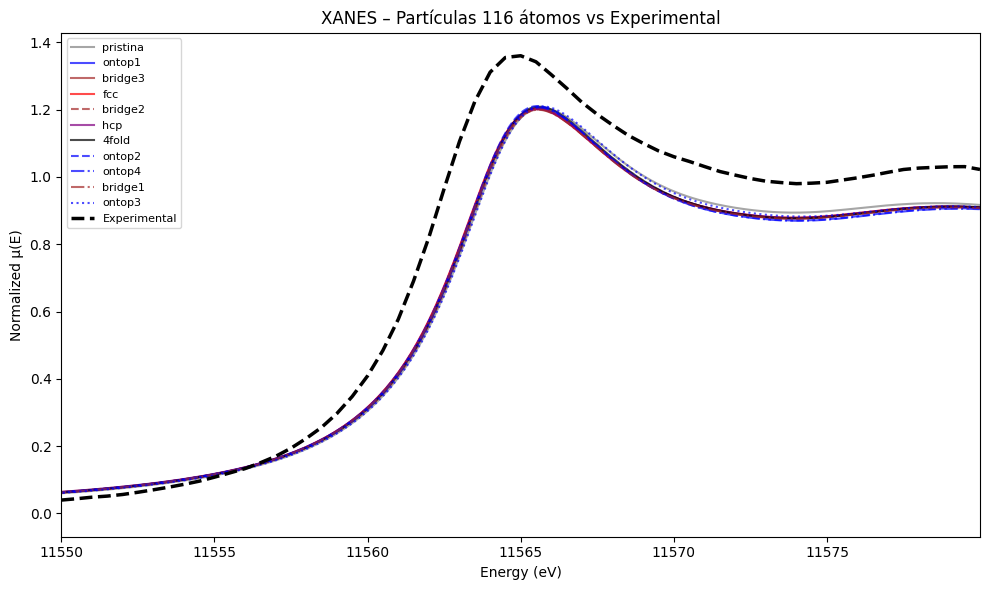


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.127915
ontop1     : RMSE = 0.127298
bridge3    : RMSE = 0.128016
fcc        : RMSE = 0.126183
bridge2    : RMSE = 0.131213
hcp        : RMSE = 0.127544
4fold      : RMSE = 0.128472
ontop2     : RMSE = 0.128448
ontop4     : RMSE = 0.131149
bridge1    : RMSE = 0.129359
ontop3     : RMSE = 0.131320

Top 3 μ(E):
1. fcc        (RMSE = 0.126183)
2. ontop1     (RMSE = 0.127298)
3. hcp        (RMSE = 0.127544)


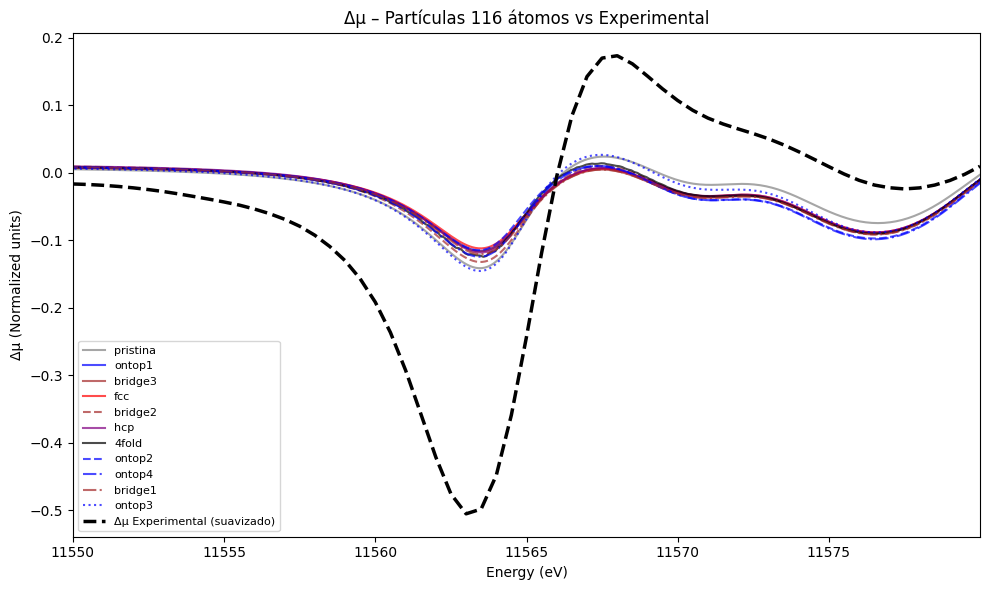


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.138252
ontop1     : RMSE = 0.150148
bridge3    : RMSE = 0.149976
fcc        : RMSE = 0.150832
bridge2    : RMSE = 0.145670
hcp        : RMSE = 0.149368
4fold      : RMSE = 0.147248
ontop2     : RMSE = 0.151417
ontop4     : RMSE = 0.148924
bridge1    : RMSE = 0.149203
ontop3     : RMSE = 0.139095

Top 3 Δμ:
1. pristina   (RMSE = 0.138252)
2. ontop3     (RMSE = 0.139095)
3. bridge2    (RMSE = 0.145670)
Arquivo: normalized/new_experimental\norm_Pt_foil_Limpa_7_norm.txt


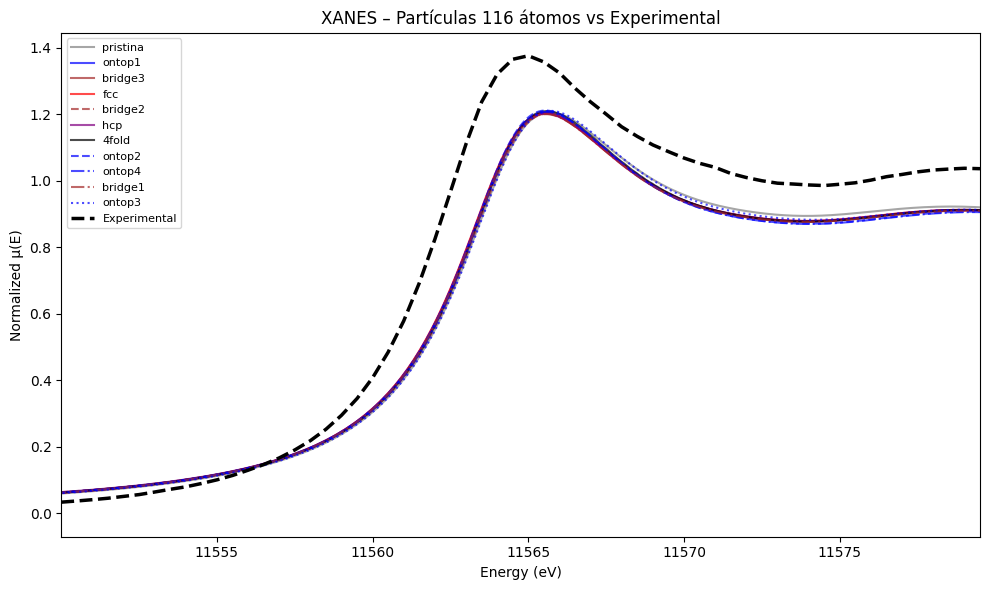


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.133248
ontop1     : RMSE = 0.132845
bridge3    : RMSE = 0.133564
fcc        : RMSE = 0.131721
bridge2    : RMSE = 0.136718
hcp        : RMSE = 0.133098
4fold      : RMSE = 0.133934
ontop2     : RMSE = 0.133915
ontop4     : RMSE = 0.136606
bridge1    : RMSE = 0.134904
ontop3     : RMSE = 0.136615

Top 3 μ(E):
1. fcc        (RMSE = 0.131721)
2. ontop1     (RMSE = 0.132845)
3. hcp        (RMSE = 0.133098)


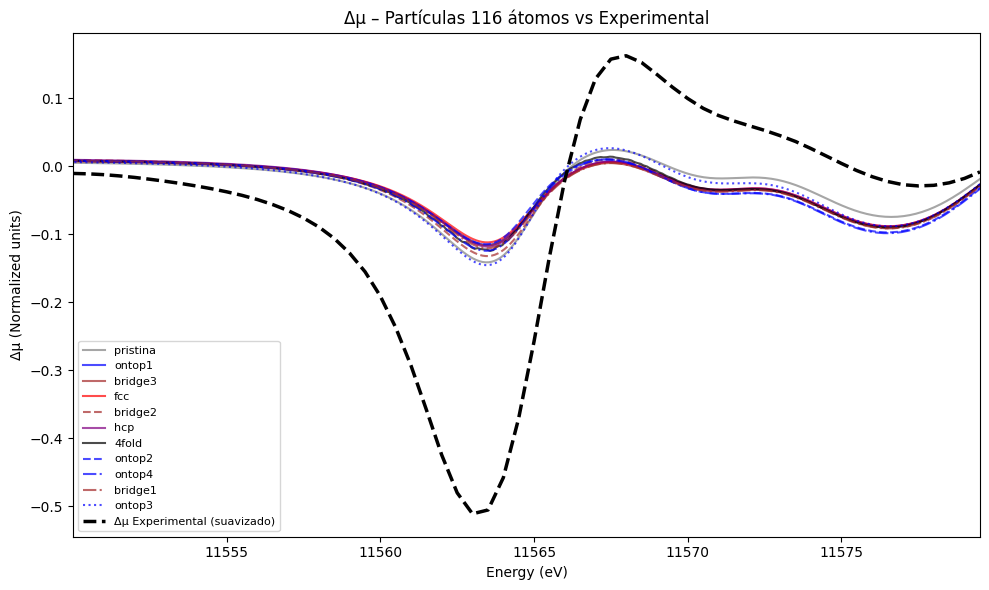


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.139240
ontop1     : RMSE = 0.150968
bridge3    : RMSE = 0.150771
fcc        : RMSE = 0.151687
bridge2    : RMSE = 0.146368
hcp        : RMSE = 0.150169
4fold      : RMSE = 0.148093
ontop2     : RMSE = 0.152241
ontop4     : RMSE = 0.149646
bridge1    : RMSE = 0.149937
ontop3     : RMSE = 0.139957

Top 3 Δμ:
1. pristina   (RMSE = 0.139240)
2. ontop3     (RMSE = 0.139957)
3. bridge2    (RMSE = 0.146368)
Arquivo: normalized/new_experimental\norm_Pt_foil_Limpa_8_norm.txt


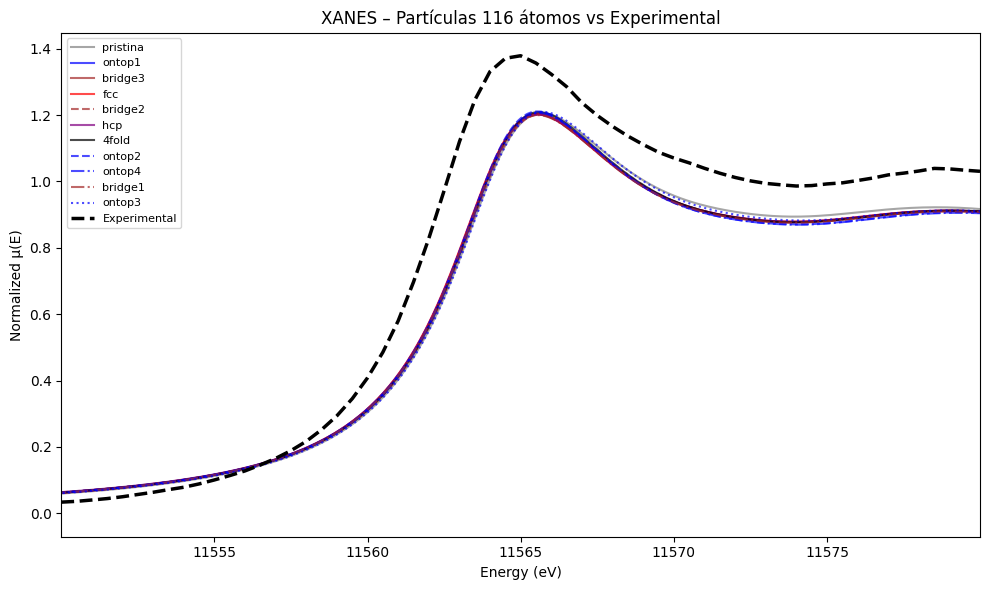


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.135543
ontop1     : RMSE = 0.135209
bridge3    : RMSE = 0.135920
fcc        : RMSE = 0.134104
bridge2    : RMSE = 0.139058
hcp        : RMSE = 0.135463
4fold      : RMSE = 0.136285
ontop2     : RMSE = 0.136299
ontop4     : RMSE = 0.138979
bridge1    : RMSE = 0.137266
ontop3     : RMSE = 0.138931

Top 3 μ(E):
1. fcc        (RMSE = 0.134104)
2. ontop1     (RMSE = 0.135209)
3. hcp        (RMSE = 0.135463)


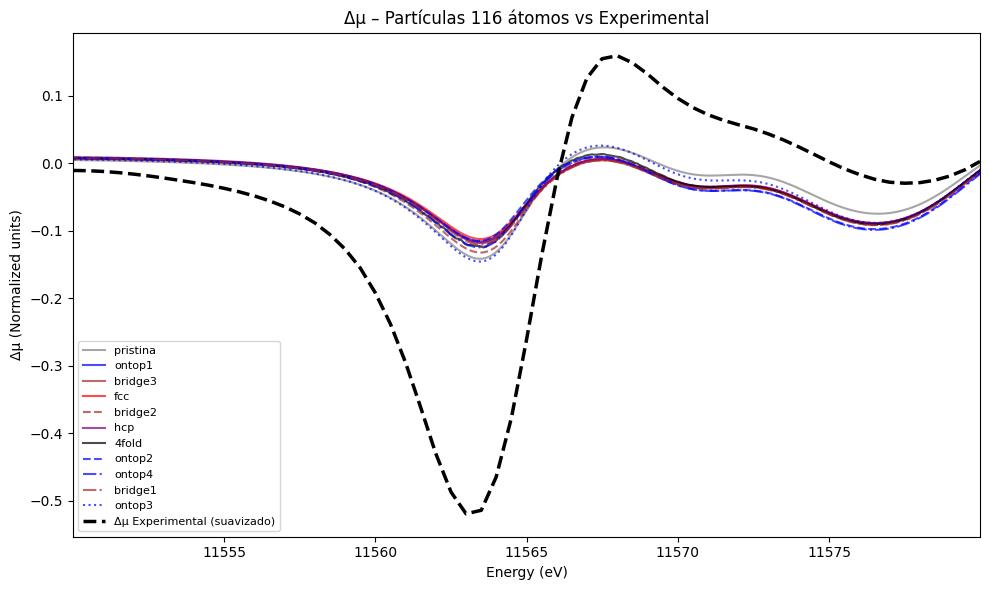


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.139685
ontop1     : RMSE = 0.151243
bridge3    : RMSE = 0.151040
fcc        : RMSE = 0.151969
bridge2    : RMSE = 0.146652
hcp        : RMSE = 0.150448
4fold      : RMSE = 0.148389
ontop2     : RMSE = 0.152495
ontop4     : RMSE = 0.149900
bridge1    : RMSE = 0.150199
ontop3     : RMSE = 0.140349

Top 3 Δμ:
1. pristina   (RMSE = 0.139685)
2. ontop3     (RMSE = 0.140349)
3. bridge2    (RMSE = 0.146652)
Arquivo: normalized/new_experimental\norm_Pt_foil_Limpa_9_norm.txt


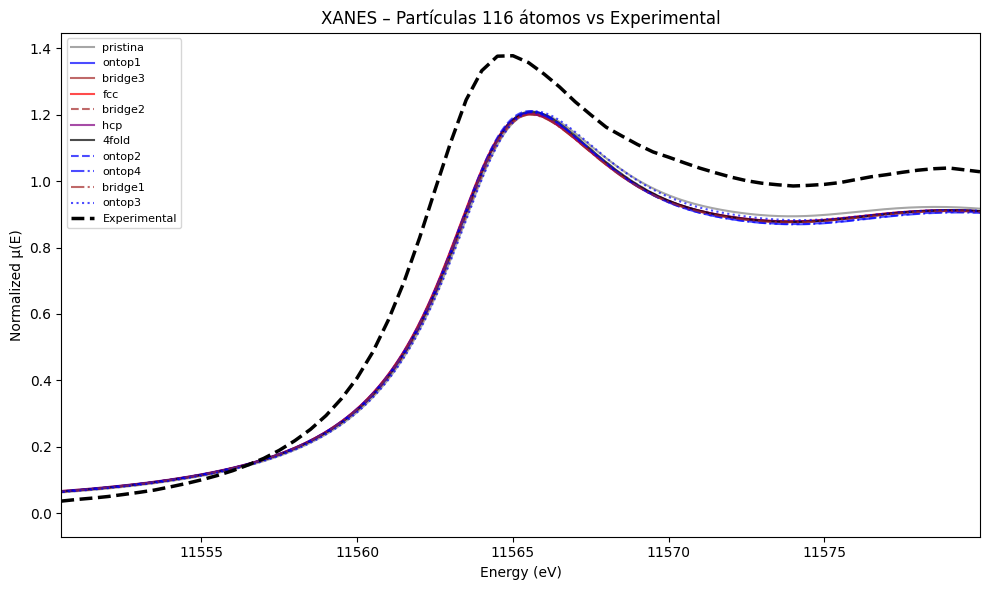


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.136476
ontop1     : RMSE = 0.136106
bridge3    : RMSE = 0.136829
fcc        : RMSE = 0.134992
bridge2    : RMSE = 0.139992
hcp        : RMSE = 0.136359
4fold      : RMSE = 0.137189
ontop2     : RMSE = 0.137207
ontop4     : RMSE = 0.139914
bridge1    : RMSE = 0.138184
ontop3     : RMSE = 0.139892

Top 3 μ(E):
1. fcc        (RMSE = 0.134992)
2. ontop1     (RMSE = 0.136106)
3. hcp        (RMSE = 0.136359)


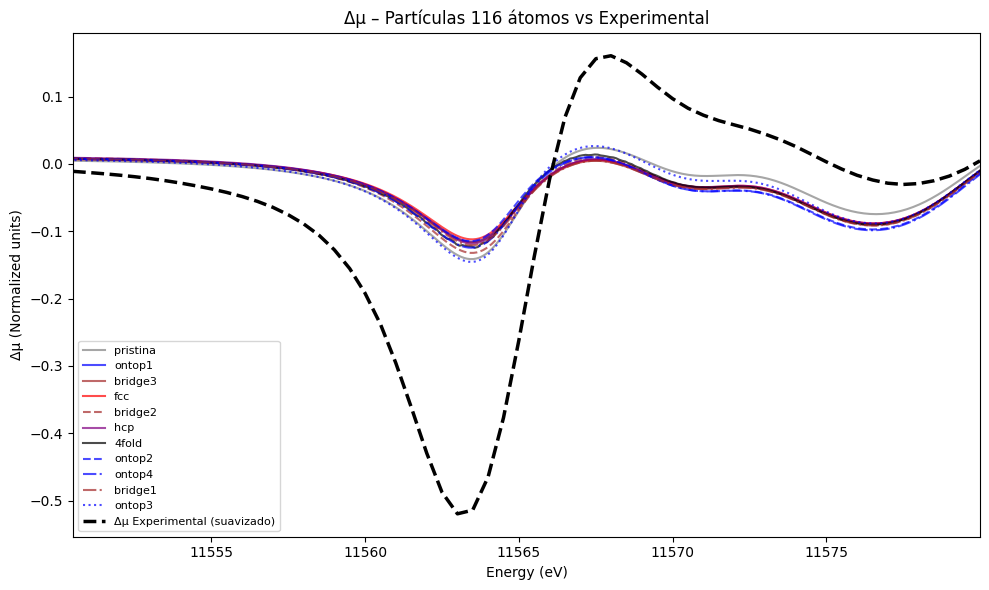


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.140948
ontop1     : RMSE = 0.152607
bridge3    : RMSE = 0.152406
fcc        : RMSE = 0.153338
bridge2    : RMSE = 0.147980
hcp        : RMSE = 0.151804
4fold      : RMSE = 0.149742
ontop2     : RMSE = 0.153871
ontop4     : RMSE = 0.151257
bridge1    : RMSE = 0.151558
ontop3     : RMSE = 0.141620

Top 3 Δμ:
1. pristina   (RMSE = 0.140948)
2. ontop3     (RMSE = 0.141620)
3. bridge2    (RMSE = 0.147980)
Arquivo: normalized/new_experimental\norm_err_sim_XANES4fold_norm.txt


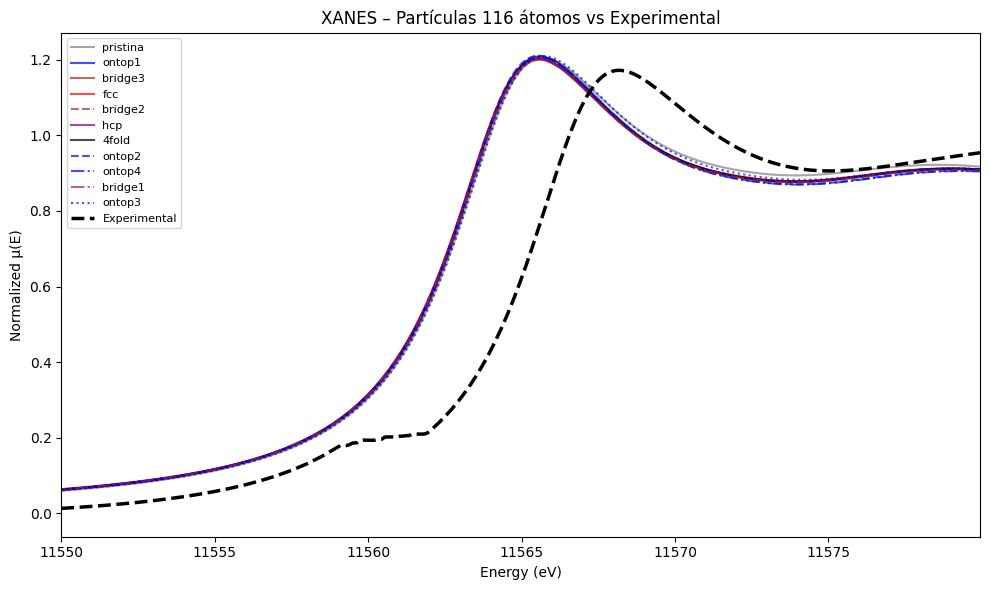


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.228716
ontop1     : RMSE = 0.238195
bridge3    : RMSE = 0.237794
fcc        : RMSE = 0.239077
bridge2    : RMSE = 0.233165
hcp        : RMSE = 0.237221
4fold      : RMSE = 0.236524
ontop2     : RMSE = 0.240126
ontop4     : RMSE = 0.236844
bridge1    : RMSE = 0.236521
ontop3     : RMSE = 0.228989

Top 3 μ(E):
1. pristina   (RMSE = 0.228716)
2. ontop3     (RMSE = 0.228989)
3. bridge2    (RMSE = 0.233165)


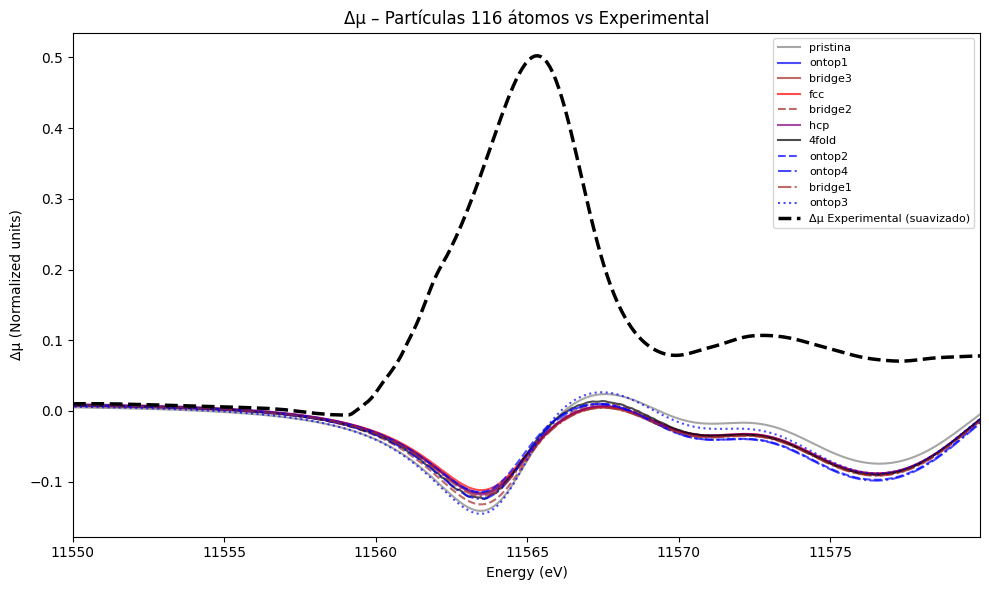


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.244853
ontop1     : RMSE = 0.244568
bridge3    : RMSE = 0.245392
fcc        : RMSE = 0.243527
bridge2    : RMSE = 0.248430
hcp        : RMSE = 0.244970
4fold      : RMSE = 0.244694
ontop2     : RMSE = 0.244486
ontop4     : RMSE = 0.247511
bridge1    : RMSE = 0.246860
ontop3     : RMSE = 0.247469

Top 3 Δμ:
1. fcc        (RMSE = 0.243527)
2. ontop2     (RMSE = 0.244486)
3. ontop1     (RMSE = 0.244568)
Arquivo: normalized/new_experimental\norm_err_sim_XANESAds14_norm.txt


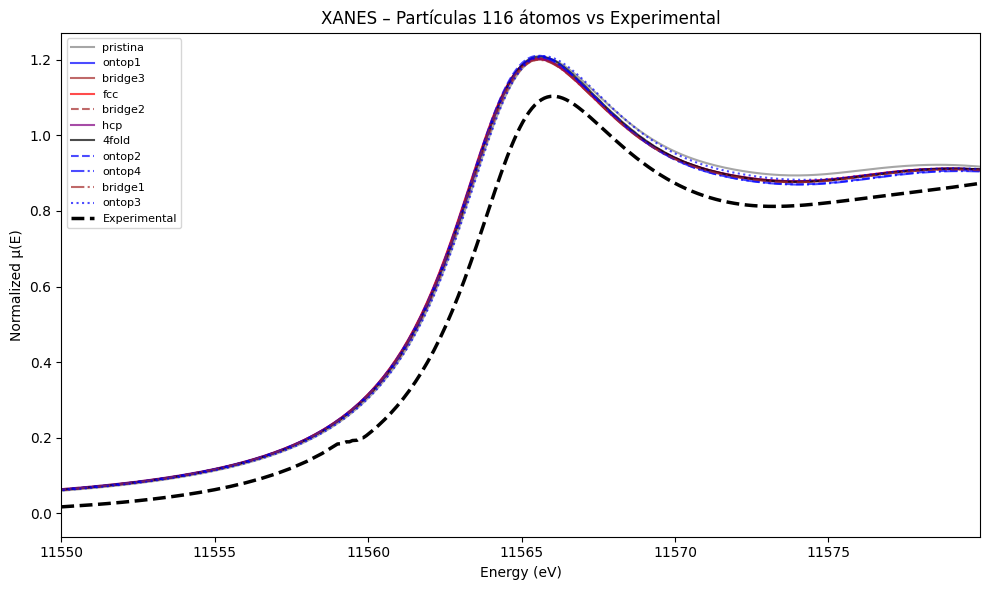


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.099577
ontop1     : RMSE = 0.100118
bridge3    : RMSE = 0.099222
fcc        : RMSE = 0.101387
bridge2    : RMSE = 0.095556
hcp        : RMSE = 0.099806
4fold      : RMSE = 0.098950
ontop2     : RMSE = 0.099552
ontop4     : RMSE = 0.096254
bridge1    : RMSE = 0.097759
ontop3     : RMSE = 0.095825

Top 3 μ(E):
1. bridge2    (RMSE = 0.095556)
2. ontop3     (RMSE = 0.095825)
3. ontop4     (RMSE = 0.096254)


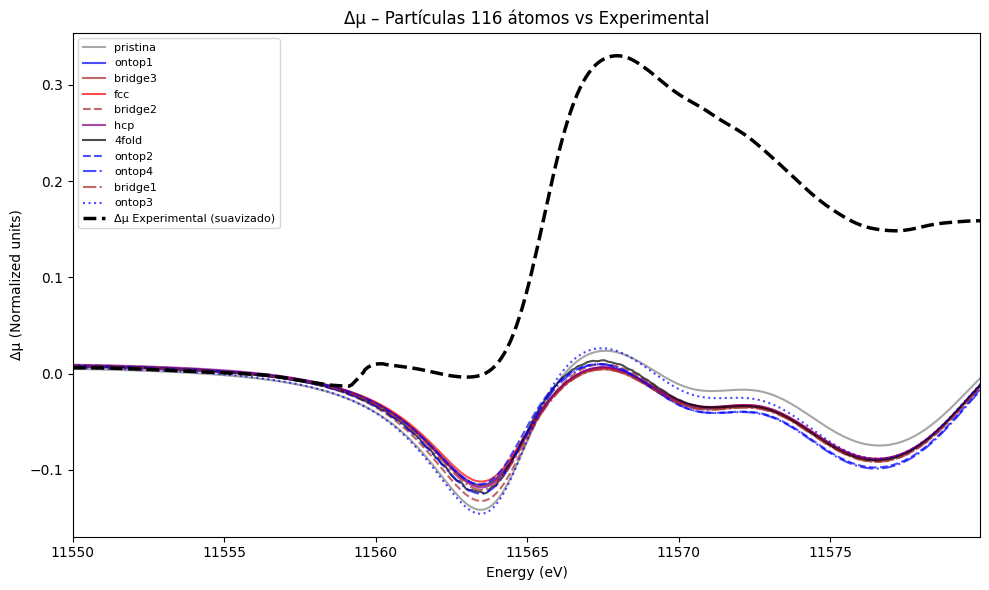


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.211244
ontop1     : RMSE = 0.220913
bridge3    : RMSE = 0.221806
fcc        : RMSE = 0.220132
bridge2    : RMSE = 0.221872
hcp        : RMSE = 0.220450
4fold      : RMSE = 0.219791
ontop2     : RMSE = 0.223157
ontop4     : RMSE = 0.224436
bridge1    : RMSE = 0.222712
ontop3     : RMSE = 0.216275

Top 3 Δμ:
1. pristina   (RMSE = 0.211244)
2. ontop3     (RMSE = 0.216275)
3. 4fold      (RMSE = 0.219791)
Arquivo: normalized/new_experimental\norm_err_sim_XANESAds25_norm.txt


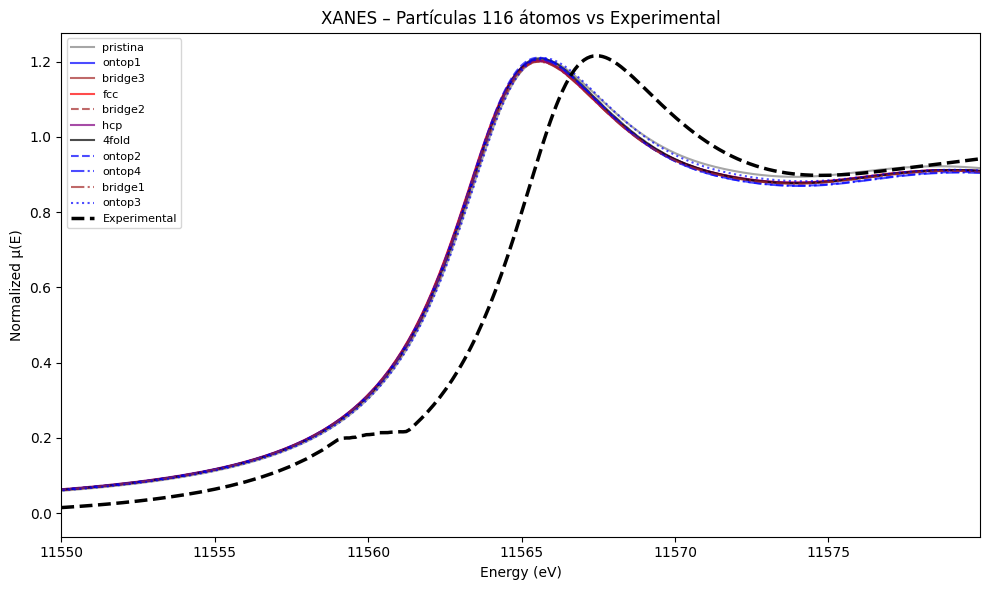


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.172631
ontop1     : RMSE = 0.183303
bridge3    : RMSE = 0.183001
fcc        : RMSE = 0.184256
bridge2    : RMSE = 0.177894
hcp        : RMSE = 0.182324
4fold      : RMSE = 0.180944
ontop2     : RMSE = 0.184766
ontop4     : RMSE = 0.181455
bridge1    : RMSE = 0.181722
ontop3     : RMSE = 0.172447

Top 3 μ(E):
1. ontop3     (RMSE = 0.172447)
2. pristina   (RMSE = 0.172631)
3. bridge2    (RMSE = 0.177894)


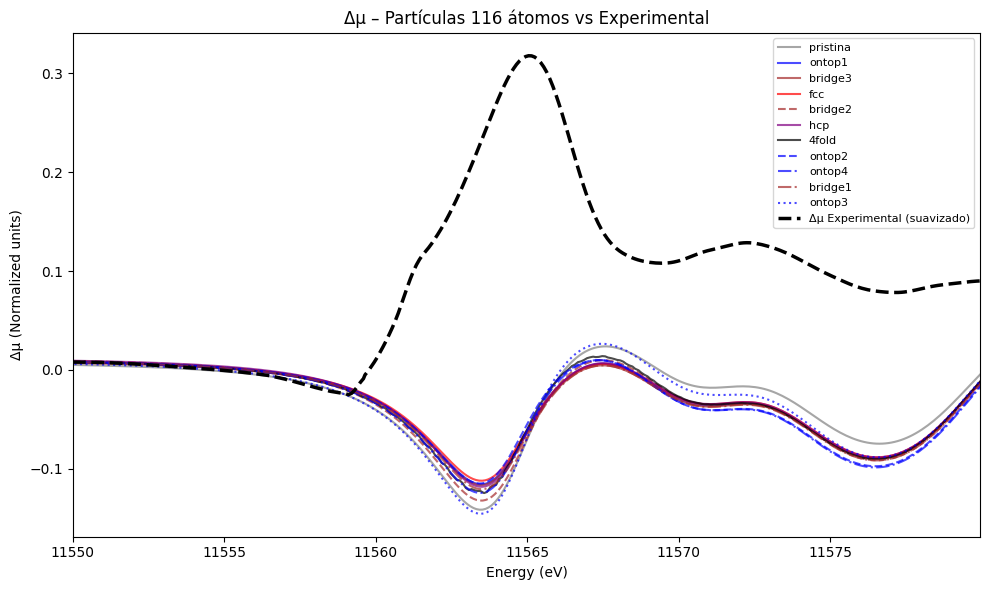


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.190662
ontop1     : RMSE = 0.191937
bridge3    : RMSE = 0.192783
fcc        : RMSE = 0.190793
bridge2    : RMSE = 0.195772
hcp        : RMSE = 0.192176
4fold      : RMSE = 0.192275
ontop2     : RMSE = 0.192834
ontop4     : RMSE = 0.195759
bridge1    : RMSE = 0.194289
ontop3     : RMSE = 0.194500

Top 3 Δμ:
1. pristina   (RMSE = 0.190662)
2. fcc        (RMSE = 0.190793)
3. ontop1     (RMSE = 0.191937)
Arquivo: normalized/new_experimental\norm_err_sim_XANESBridge1_norm.txt


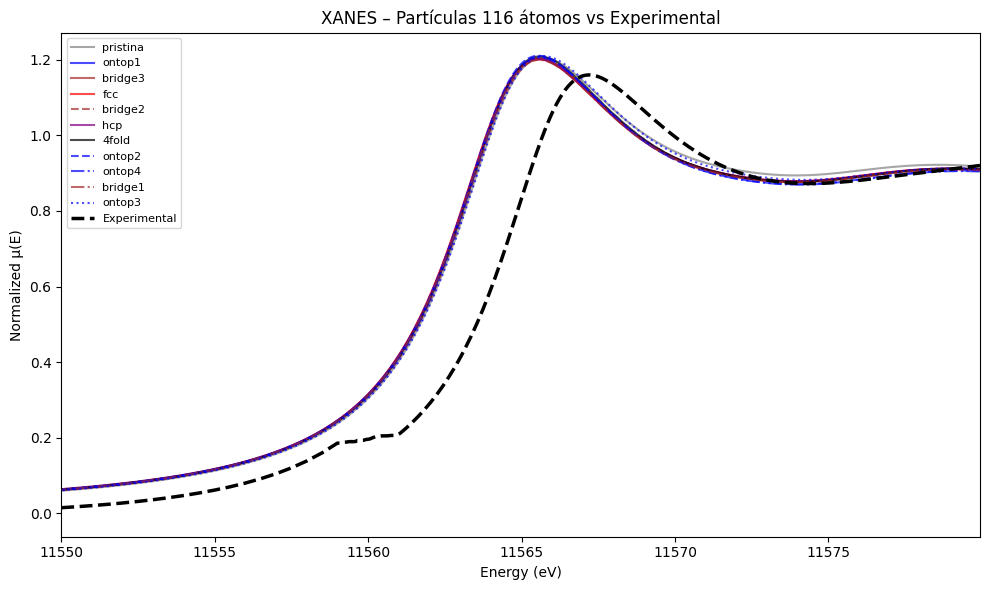


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.157593
ontop1     : RMSE = 0.166628
bridge3    : RMSE = 0.166172
fcc        : RMSE = 0.167706
bridge2    : RMSE = 0.161104
hcp        : RMSE = 0.165743
4fold      : RMSE = 0.164423
ontop2     : RMSE = 0.167740
ontop4     : RMSE = 0.164250
bridge1    : RMSE = 0.164782
ontop3     : RMSE = 0.156632

Top 3 μ(E):
1. ontop3     (RMSE = 0.156632)
2. pristina   (RMSE = 0.157593)
3. bridge2    (RMSE = 0.161104)


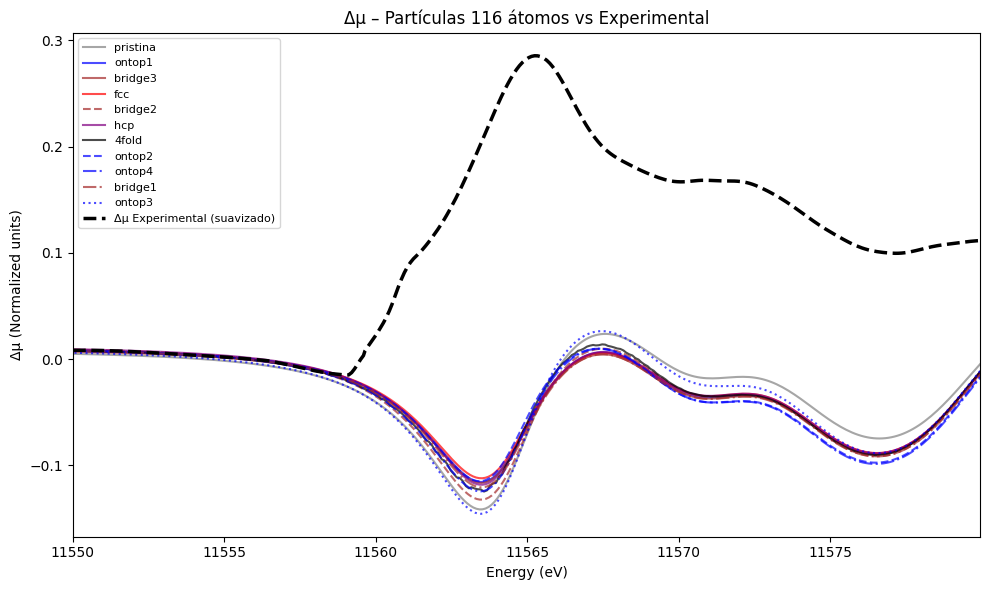


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.199626
ontop1     : RMSE = 0.202996
bridge3    : RMSE = 0.203898
fcc        : RMSE = 0.201889
bridge2    : RMSE = 0.206278
hcp        : RMSE = 0.203065
4fold      : RMSE = 0.202999
ontop2     : RMSE = 0.204253
ontop4     : RMSE = 0.206888
bridge1    : RMSE = 0.205307
ontop3     : RMSE = 0.203881

Top 3 Δμ:
1. pristina   (RMSE = 0.199626)
2. fcc        (RMSE = 0.201889)
3. ontop1     (RMSE = 0.202996)
Arquivo: normalized/new_experimental\norm_err_sim_XANESBridge2_norm.txt


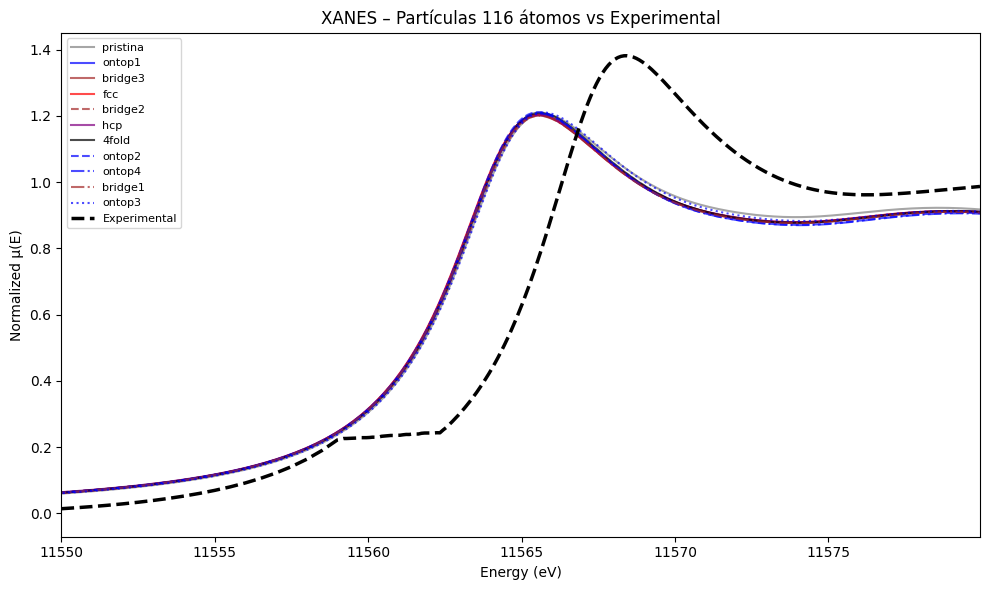


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.257551
ontop1     : RMSE = 0.269643
bridge3    : RMSE = 0.269585
fcc        : RMSE = 0.270231
bridge2    : RMSE = 0.265070
hcp        : RMSE = 0.268552
4fold      : RMSE = 0.267637
ontop2     : RMSE = 0.271966
ontop4     : RMSE = 0.269219
bridge1    : RMSE = 0.268589
ontop3     : RMSE = 0.259059

Top 3 μ(E):
1. pristina   (RMSE = 0.257551)
2. ontop3     (RMSE = 0.259059)
3. bridge2    (RMSE = 0.265070)


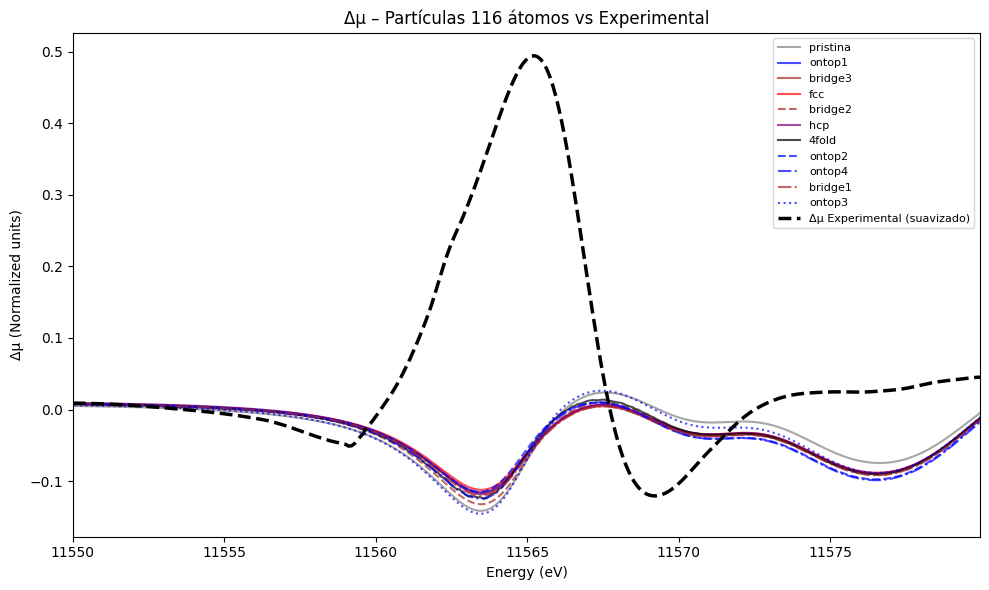


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.224337
ontop1     : RMSE = 0.219633
bridge3    : RMSE = 0.220187
fcc        : RMSE = 0.218709
bridge2    : RMSE = 0.224092
hcp        : RMSE = 0.220361
4fold      : RMSE = 0.220418
ontop2     : RMSE = 0.218778
ontop4     : RMSE = 0.221974
bridge1    : RMSE = 0.221669
ontop3     : RMSE = 0.225743

Top 3 Δμ:
1. fcc        (RMSE = 0.218709)
2. ontop2     (RMSE = 0.218778)
3. ontop1     (RMSE = 0.219633)
Arquivo: normalized/new_experimental\norm_err_sim_XANESFoil_norm.txt


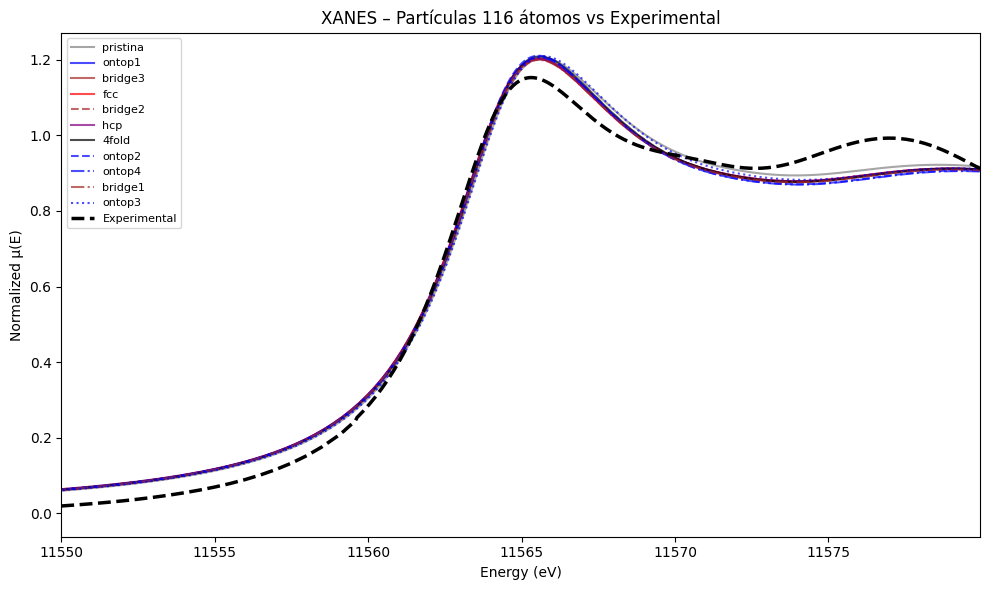


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.044748
ontop1     : RMSE = 0.047734
bridge3    : RMSE = 0.047530
fcc        : RMSE = 0.047269
bridge2    : RMSE = 0.048917
hcp        : RMSE = 0.047402
4fold      : RMSE = 0.049226
ontop2     : RMSE = 0.052008
ontop4     : RMSE = 0.052203
bridge1    : RMSE = 0.048183
ontop3     : RMSE = 0.050393

Top 3 μ(E):
1. pristina   (RMSE = 0.044748)
2. fcc        (RMSE = 0.047269)
3. hcp        (RMSE = 0.047402)


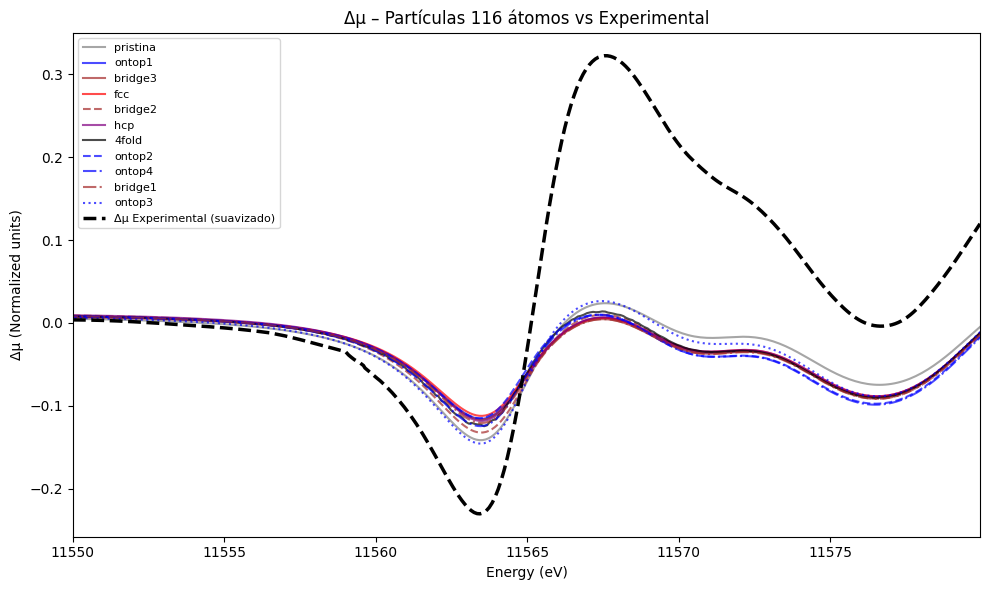


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.148120
ontop1     : RMSE = 0.161089
bridge3    : RMSE = 0.161824
fcc        : RMSE = 0.160950
bridge2    : RMSE = 0.159271
hcp        : RMSE = 0.160358
4fold      : RMSE = 0.158364
ontop2     : RMSE = 0.162502
ontop4     : RMSE = 0.162216
bridge1    : RMSE = 0.161981
ontop3     : RMSE = 0.151067

Top 3 Δμ:
1. pristina   (RMSE = 0.148120)
2. ontop3     (RMSE = 0.151067)
3. 4fold      (RMSE = 0.158364)
Arquivo: normalized/new_experimental\norm_err_sim_XANESNP_PristineCub_norm.txt


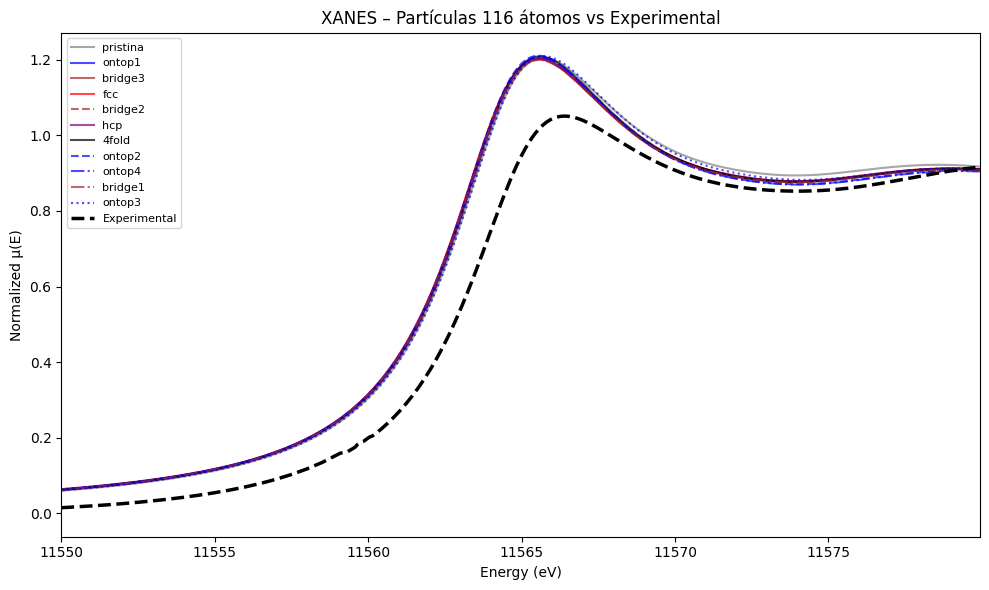


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.114977
ontop1     : RMSE = 0.119376
bridge3    : RMSE = 0.118577
fcc        : RMSE = 0.120518
bridge2    : RMSE = 0.114532
hcp        : RMSE = 0.118766
4fold      : RMSE = 0.118189
ontop2     : RMSE = 0.120267
ontop4     : RMSE = 0.116849
bridge1    : RMSE = 0.117190
ontop3     : RMSE = 0.113312

Top 3 μ(E):
1. ontop3     (RMSE = 0.113312)
2. bridge2    (RMSE = 0.114532)
3. pristina   (RMSE = 0.114977)


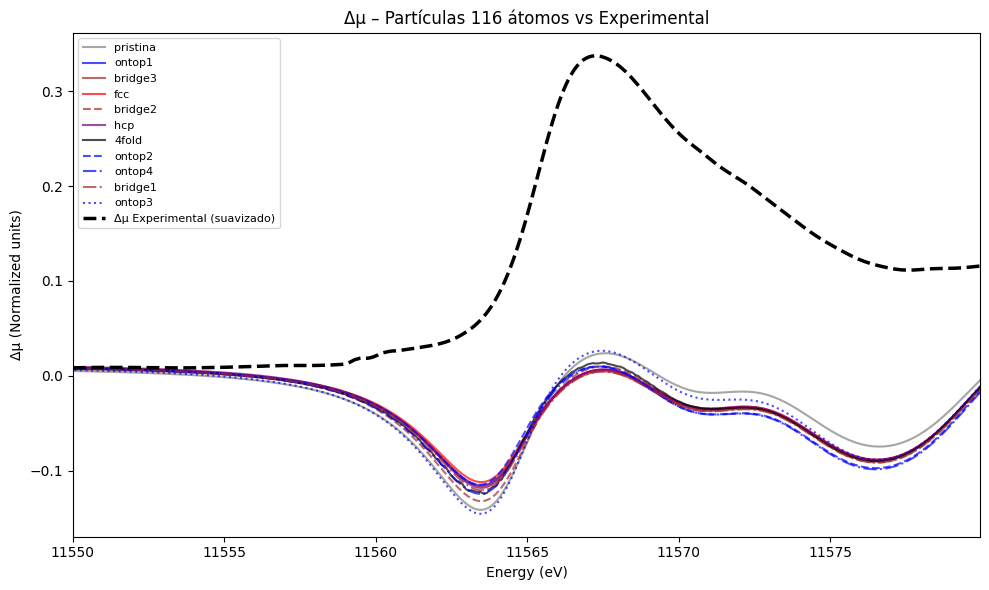


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.205046
ontop1     : RMSE = 0.212837
bridge3    : RMSE = 0.213790
fcc        : RMSE = 0.211984
bridge2    : RMSE = 0.214395
hcp        : RMSE = 0.212552
4fold      : RMSE = 0.211787
ontop2     : RMSE = 0.214405
ontop4     : RMSE = 0.216116
bridge1    : RMSE = 0.214821
ontop3     : RMSE = 0.209382

Top 3 Δμ:
1. pristina   (RMSE = 0.205046)
2. ontop3     (RMSE = 0.209382)
3. 4fold      (RMSE = 0.211787)
Arquivo: normalized/new_experimental\norm_err_sim_XANESNP_PristineOct_norm.txt


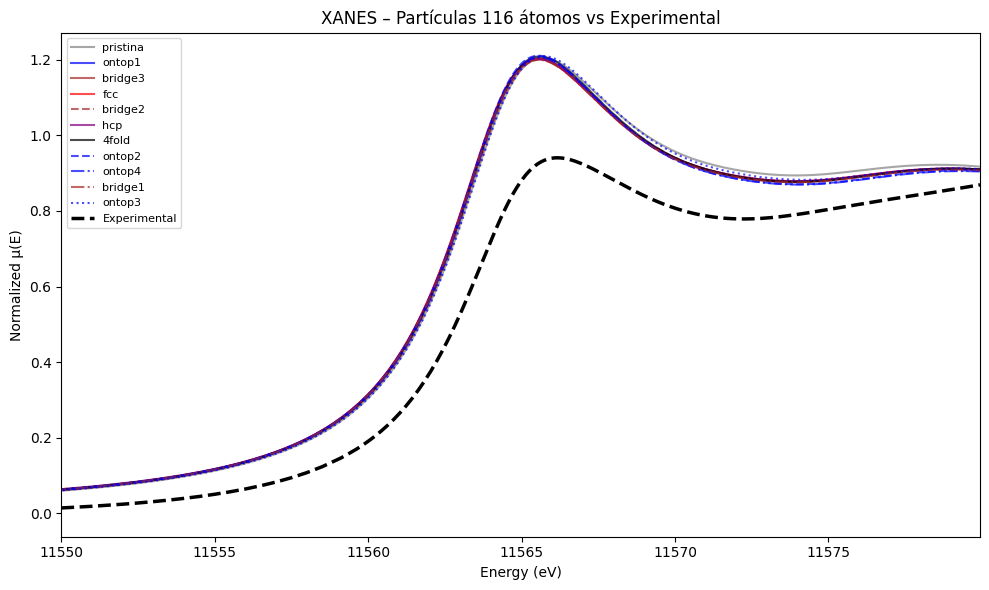


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.161950
ontop1     : RMSE = 0.160943
bridge3    : RMSE = 0.159965
fcc        : RMSE = 0.162041
bridge2    : RMSE = 0.157286
hcp        : RMSE = 0.160677
4fold      : RMSE = 0.160830
ontop2     : RMSE = 0.161079
ontop4     : RMSE = 0.158109
bridge1    : RMSE = 0.158641
ontop3     : RMSE = 0.159237

Top 3 μ(E):
1. bridge2    (RMSE = 0.157286)
2. ontop4     (RMSE = 0.158109)
3. bridge1    (RMSE = 0.158641)


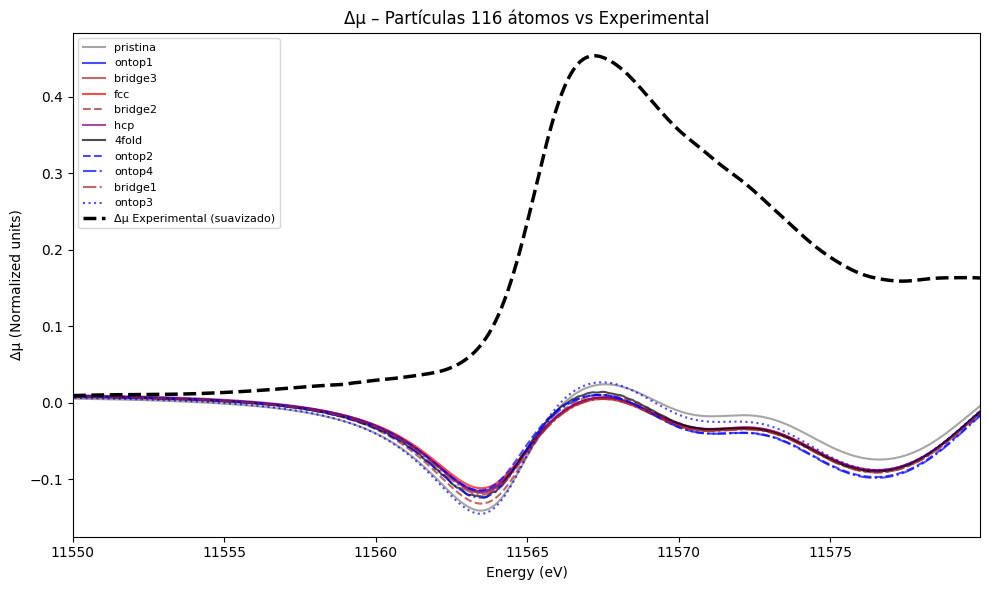


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.269634
ontop1     : RMSE = 0.278053
bridge3    : RMSE = 0.279004
fcc        : RMSE = 0.277256
bridge2    : RMSE = 0.279303
hcp        : RMSE = 0.277728
4fold      : RMSE = 0.276807
ontop2     : RMSE = 0.279559
ontop4     : RMSE = 0.281118
bridge1    : RMSE = 0.279966
ontop3     : RMSE = 0.273843

Top 3 Δμ:
1. pristina   (RMSE = 0.269634)
2. ontop3     (RMSE = 0.273843)
3. 4fold      (RMSE = 0.276807)
Arquivo: normalized/new_experimental\norm_sim_XANES4fold_err_norm.txt


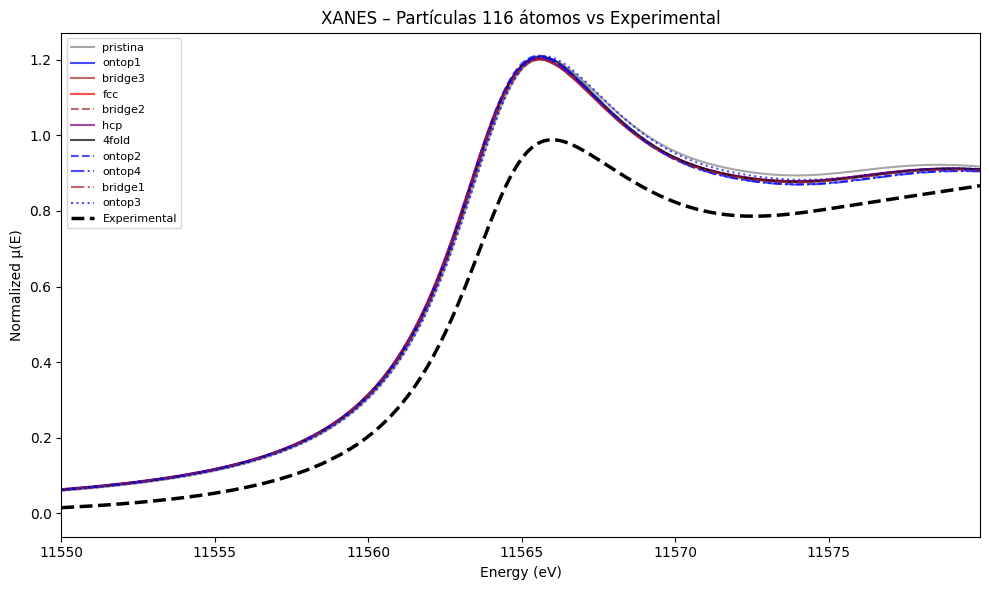


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.135042
ontop1     : RMSE = 0.134122
bridge3    : RMSE = 0.133112
fcc        : RMSE = 0.135206
bridge2    : RMSE = 0.130513
hcp        : RMSE = 0.133937
4fold      : RMSE = 0.133789
ontop2     : RMSE = 0.133993
ontop4     : RMSE = 0.131079
bridge1    : RMSE = 0.131870
ontop3     : RMSE = 0.132145

Top 3 μ(E):
1. bridge2    (RMSE = 0.130513)
2. ontop4     (RMSE = 0.131079)
3. bridge1    (RMSE = 0.131870)


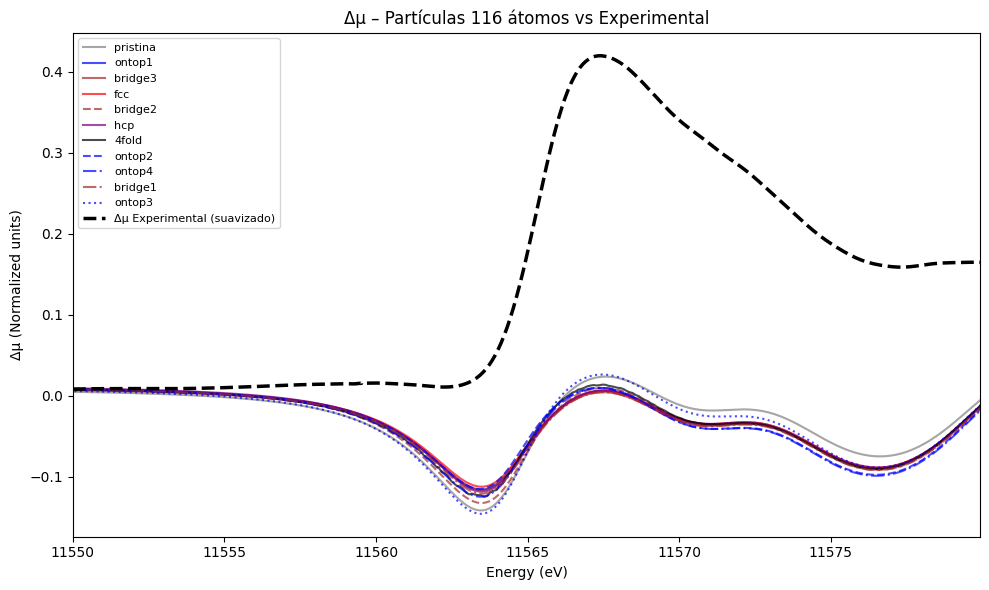


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.240601
ontop1     : RMSE = 0.249250
bridge3    : RMSE = 0.250155
fcc        : RMSE = 0.248516
bridge2    : RMSE = 0.250233
hcp        : RMSE = 0.248867
4fold      : RMSE = 0.248031
ontop2     : RMSE = 0.250922
ontop4     : RMSE = 0.252267
bridge1    : RMSE = 0.251021
ontop3     : RMSE = 0.244846

Top 3 Δμ:
1. pristina   (RMSE = 0.240601)
2. ontop3     (RMSE = 0.244846)
3. 4fold      (RMSE = 0.248031)
Arquivo: normalized/new_experimental\norm_sim_XANES4fold_norm.txt


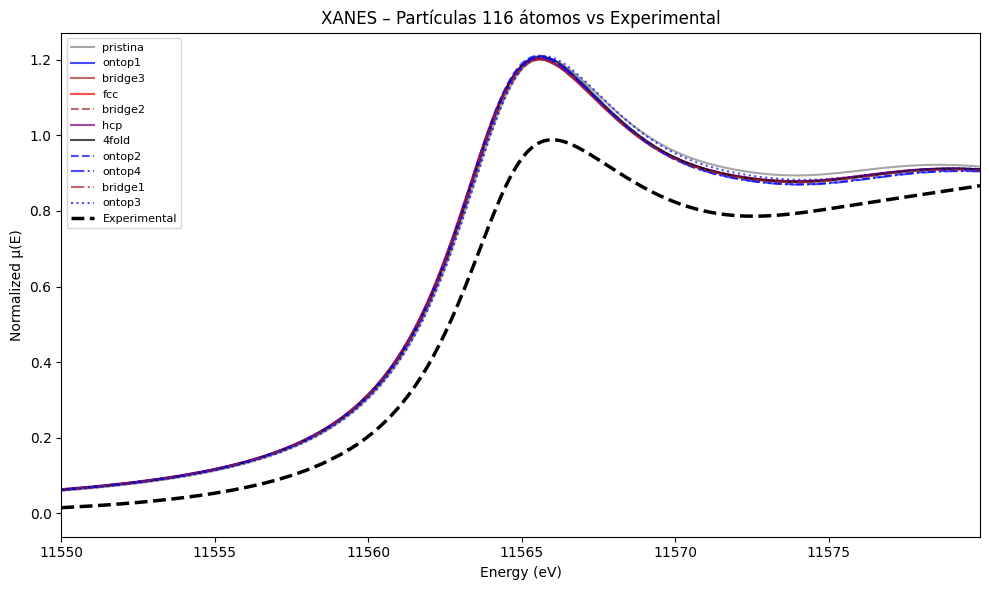


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.135042
ontop1     : RMSE = 0.134122
bridge3    : RMSE = 0.133112
fcc        : RMSE = 0.135206
bridge2    : RMSE = 0.130513
hcp        : RMSE = 0.133937
4fold      : RMSE = 0.133789
ontop2     : RMSE = 0.133993
ontop4     : RMSE = 0.131079
bridge1    : RMSE = 0.131870
ontop3     : RMSE = 0.132145

Top 3 μ(E):
1. bridge2    (RMSE = 0.130513)
2. ontop4     (RMSE = 0.131079)
3. bridge1    (RMSE = 0.131870)


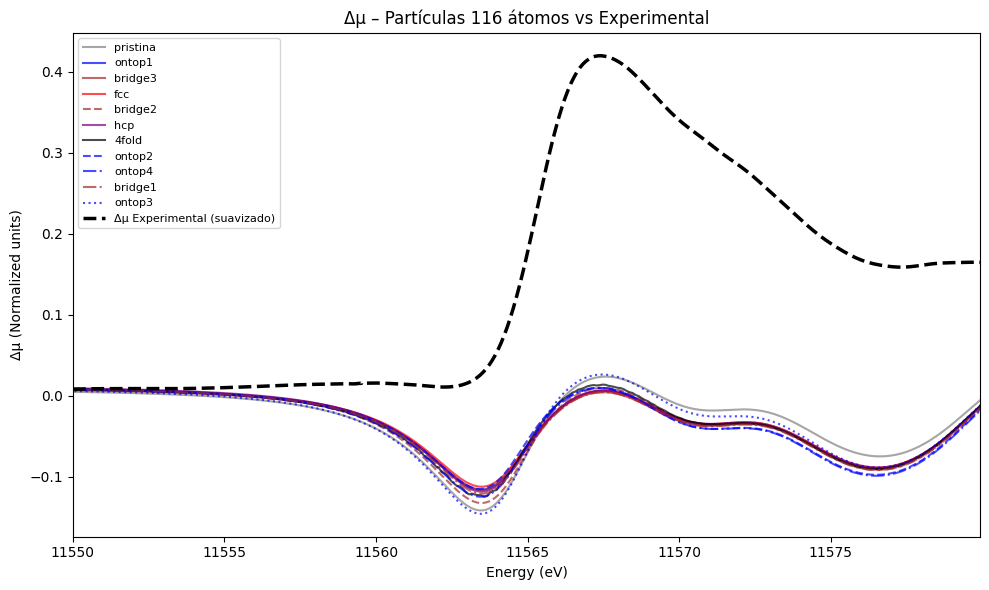


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.240601
ontop1     : RMSE = 0.249250
bridge3    : RMSE = 0.250155
fcc        : RMSE = 0.248516
bridge2    : RMSE = 0.250233
hcp        : RMSE = 0.248867
4fold      : RMSE = 0.248031
ontop2     : RMSE = 0.250922
ontop4     : RMSE = 0.252267
bridge1    : RMSE = 0.251021
ontop3     : RMSE = 0.244846

Top 3 Δμ:
1. pristina   (RMSE = 0.240601)
2. ontop3     (RMSE = 0.244846)
3. 4fold      (RMSE = 0.248031)
Arquivo: normalized/new_experimental\norm_sim_XANESAds14_err_norm.txt


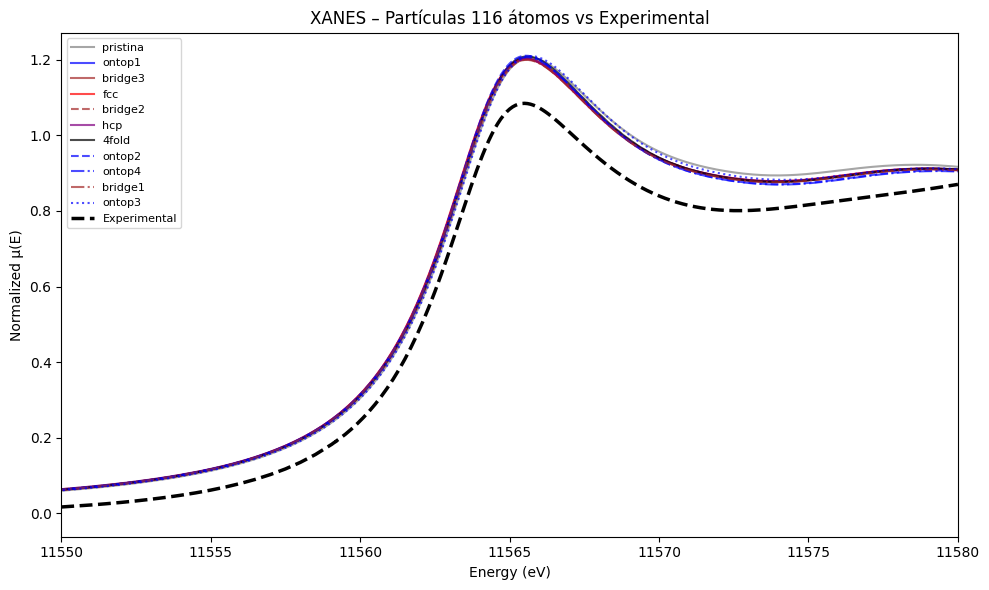


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.090672
ontop1     : RMSE = 0.085043
bridge3    : RMSE = 0.083996
fcc        : RMSE = 0.086038
bridge2    : RMSE = 0.082671
hcp        : RMSE = 0.085180
4fold      : RMSE = 0.085469
ontop2     : RMSE = 0.084132
ontop4     : RMSE = 0.081834
bridge1    : RMSE = 0.082889
ontop3     : RMSE = 0.086821

Top 3 μ(E):
1. ontop4     (RMSE = 0.081834)
2. bridge2    (RMSE = 0.082671)
3. bridge1    (RMSE = 0.082889)


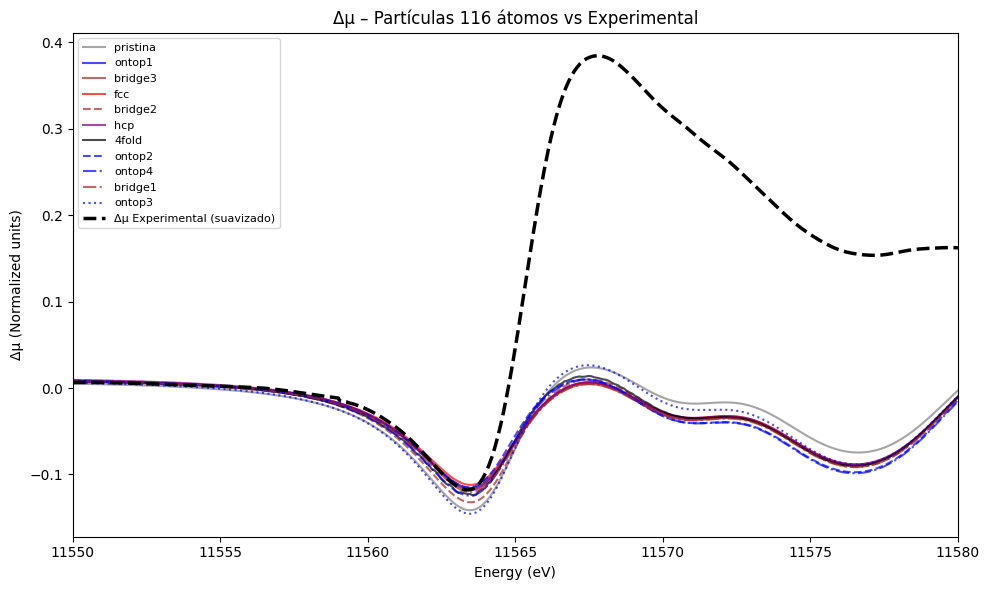


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.220417
ontop1     : RMSE = 0.231891
bridge3    : RMSE = 0.232723
fcc        : RMSE = 0.231343
bridge2    : RMSE = 0.231751
hcp        : RMSE = 0.231283
4fold      : RMSE = 0.230183
ontop2     : RMSE = 0.234073
ontop4     : RMSE = 0.234725
bridge1    : RMSE = 0.233359
ontop3     : RMSE = 0.225061

Top 3 Δμ:
1. pristina   (RMSE = 0.220417)
2. ontop3     (RMSE = 0.225061)
3. 4fold      (RMSE = 0.230183)
Arquivo: normalized/new_experimental\norm_sim_XANESAds14_norm.txt


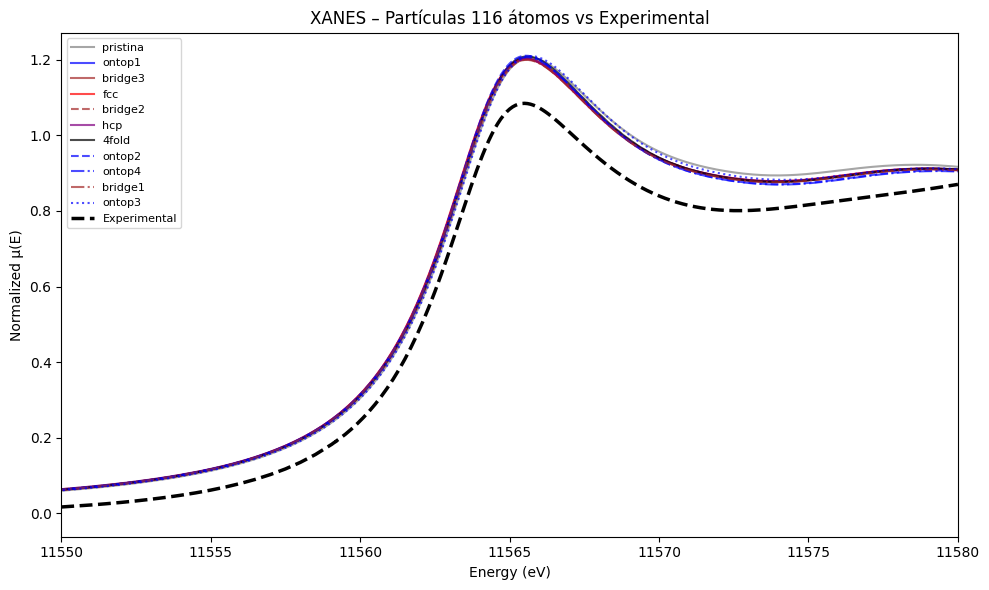


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.090672
ontop1     : RMSE = 0.085043
bridge3    : RMSE = 0.083996
fcc        : RMSE = 0.086038
bridge2    : RMSE = 0.082671
hcp        : RMSE = 0.085180
4fold      : RMSE = 0.085469
ontop2     : RMSE = 0.084132
ontop4     : RMSE = 0.081834
bridge1    : RMSE = 0.082889
ontop3     : RMSE = 0.086821

Top 3 μ(E):
1. ontop4     (RMSE = 0.081834)
2. bridge2    (RMSE = 0.082671)
3. bridge1    (RMSE = 0.082889)


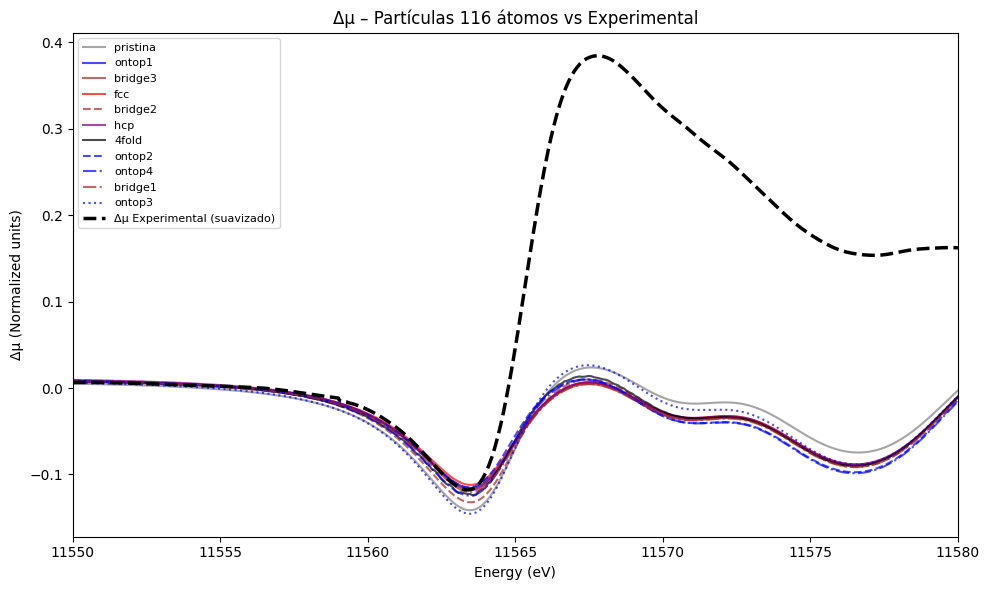


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.220417
ontop1     : RMSE = 0.231891
bridge3    : RMSE = 0.232723
fcc        : RMSE = 0.231343
bridge2    : RMSE = 0.231751
hcp        : RMSE = 0.231283
4fold      : RMSE = 0.230183
ontop2     : RMSE = 0.234073
ontop4     : RMSE = 0.234725
bridge1    : RMSE = 0.233359
ontop3     : RMSE = 0.225061

Top 3 Δμ:
1. pristina   (RMSE = 0.220417)
2. ontop3     (RMSE = 0.225061)
3. 4fold      (RMSE = 0.230183)
Arquivo: normalized/new_experimental\norm_sim_XANESAds25_err_norm.txt


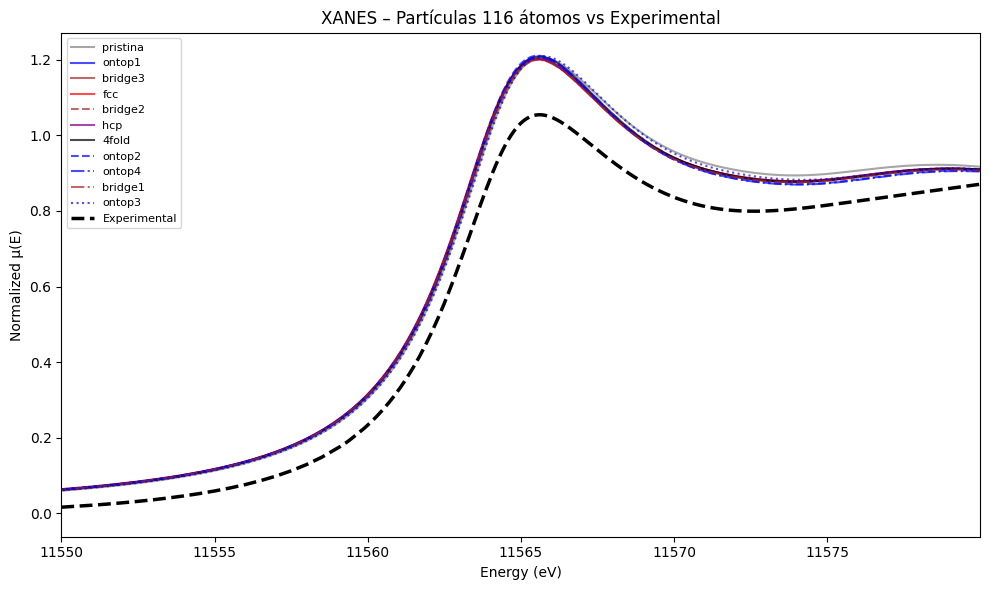


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.100236
ontop1     : RMSE = 0.096735
bridge3    : RMSE = 0.095705
fcc        : RMSE = 0.097762
bridge2    : RMSE = 0.093843
hcp        : RMSE = 0.096743
4fold      : RMSE = 0.096839
ontop2     : RMSE = 0.096197
ontop4     : RMSE = 0.093649
bridge1    : RMSE = 0.094544
ontop3     : RMSE = 0.096870

Top 3 μ(E):
1. ontop4     (RMSE = 0.093649)
2. bridge2    (RMSE = 0.093843)
3. bridge1    (RMSE = 0.094544)


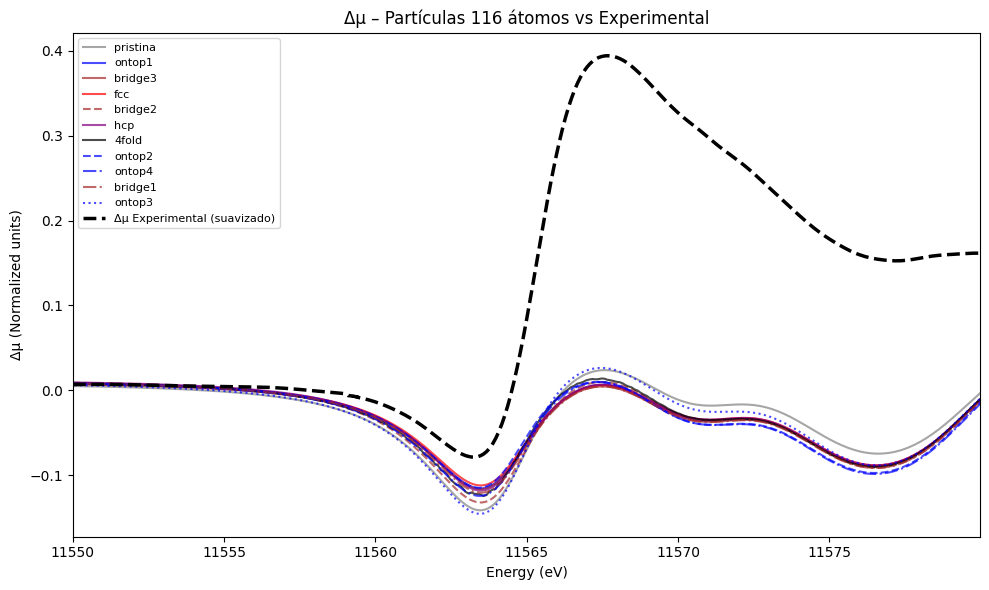


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.220148
ontop1     : RMSE = 0.230608
bridge3    : RMSE = 0.231453
fcc        : RMSE = 0.230011
bridge2    : RMSE = 0.230809
hcp        : RMSE = 0.230077
4fold      : RMSE = 0.229056
ontop2     : RMSE = 0.232590
ontop4     : RMSE = 0.233446
bridge1    : RMSE = 0.232152
ontop3     : RMSE = 0.224590

Top 3 Δμ:
1. pristina   (RMSE = 0.220148)
2. ontop3     (RMSE = 0.224590)
3. 4fold      (RMSE = 0.229056)
Arquivo: normalized/new_experimental\norm_sim_XANESAds25_norm.txt


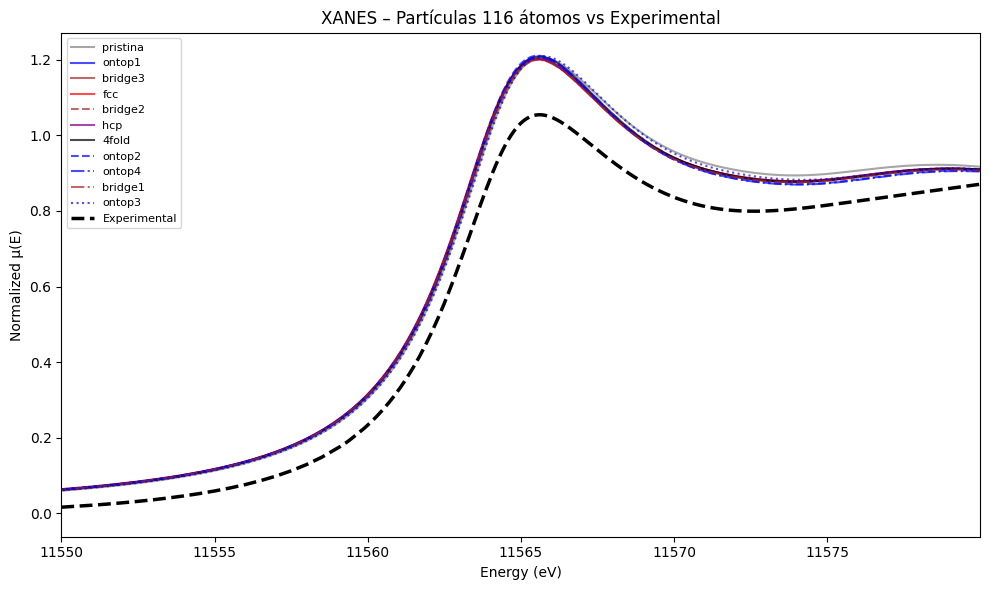


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.100236
ontop1     : RMSE = 0.096735
bridge3    : RMSE = 0.095705
fcc        : RMSE = 0.097762
bridge2    : RMSE = 0.093843
hcp        : RMSE = 0.096743
4fold      : RMSE = 0.096839
ontop2     : RMSE = 0.096197
ontop4     : RMSE = 0.093649
bridge1    : RMSE = 0.094544
ontop3     : RMSE = 0.096870

Top 3 μ(E):
1. ontop4     (RMSE = 0.093649)
2. bridge2    (RMSE = 0.093843)
3. bridge1    (RMSE = 0.094544)


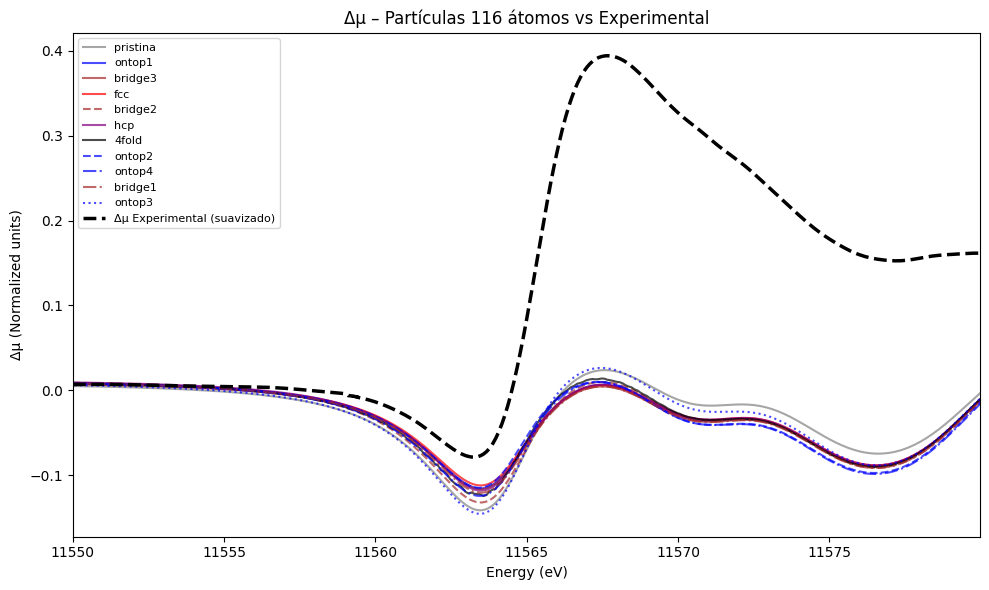


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.220148
ontop1     : RMSE = 0.230608
bridge3    : RMSE = 0.231453
fcc        : RMSE = 0.230011
bridge2    : RMSE = 0.230809
hcp        : RMSE = 0.230077
4fold      : RMSE = 0.229056
ontop2     : RMSE = 0.232590
ontop4     : RMSE = 0.233446
bridge1    : RMSE = 0.232152
ontop3     : RMSE = 0.224590

Top 3 Δμ:
1. pristina   (RMSE = 0.220148)
2. ontop3     (RMSE = 0.224590)
3. 4fold      (RMSE = 0.229056)
Arquivo: normalized/new_experimental\norm_sim_XANESBridge1_err_norm.txt


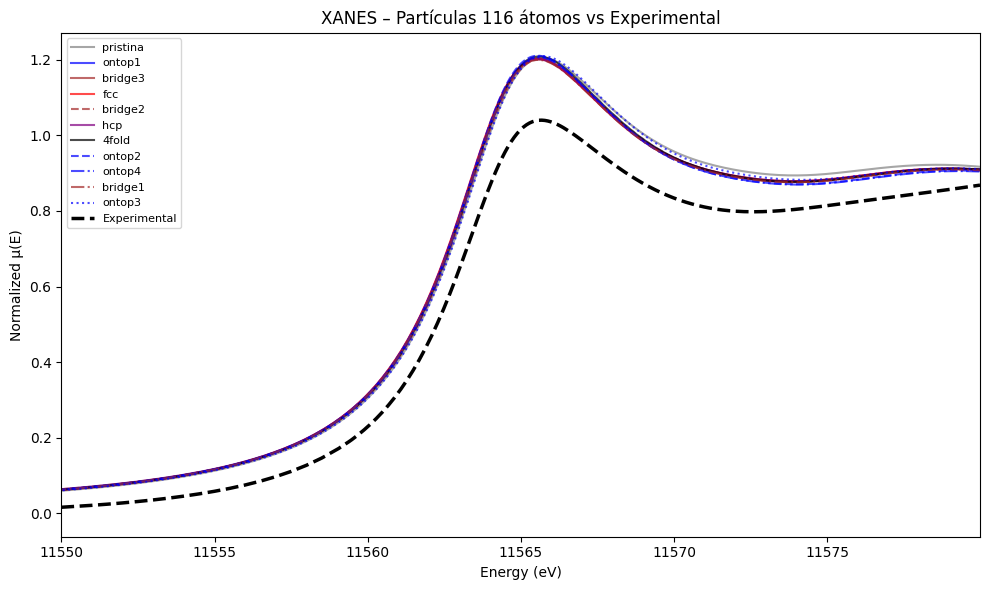


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.106105
ontop1     : RMSE = 0.102902
bridge3    : RMSE = 0.101882
fcc        : RMSE = 0.103939
bridge2    : RMSE = 0.099900
hcp        : RMSE = 0.102870
4fold      : RMSE = 0.102989
ontop2     : RMSE = 0.102463
ontop4     : RMSE = 0.099849
bridge1    : RMSE = 0.100687
ontop3     : RMSE = 0.102812

Top 3 μ(E):
1. ontop4     (RMSE = 0.099849)
2. bridge2    (RMSE = 0.099900)
3. bridge1    (RMSE = 0.100687)


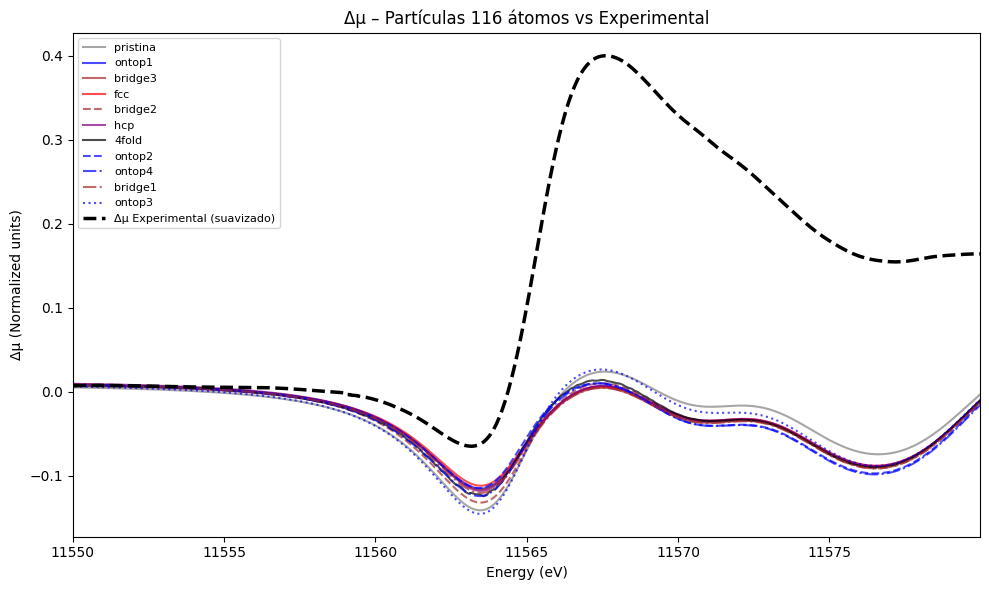


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.225134
ontop1     : RMSE = 0.235410
bridge3    : RMSE = 0.236269
fcc        : RMSE = 0.234790
bridge2    : RMSE = 0.235727
hcp        : RMSE = 0.234900
4fold      : RMSE = 0.233882
ontop2     : RMSE = 0.237345
ontop4     : RMSE = 0.238283
bridge1    : RMSE = 0.237001
ontop3     : RMSE = 0.229567

Top 3 Δμ:
1. pristina   (RMSE = 0.225134)
2. ontop3     (RMSE = 0.229567)
3. 4fold      (RMSE = 0.233882)
Arquivo: normalized/new_experimental\norm_sim_XANESBridge1_norm.txt


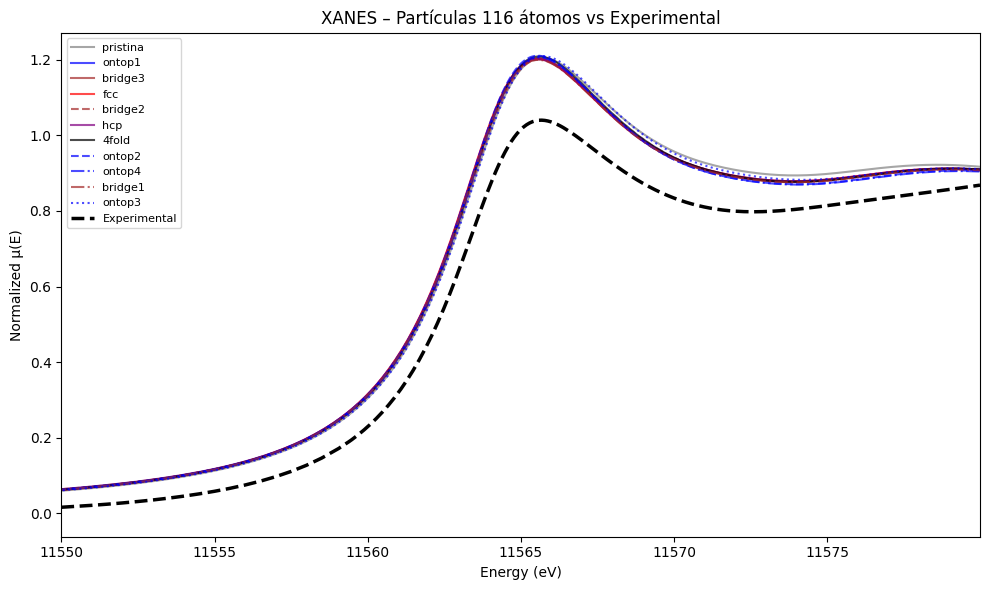


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.106105
ontop1     : RMSE = 0.102902
bridge3    : RMSE = 0.101882
fcc        : RMSE = 0.103939
bridge2    : RMSE = 0.099900
hcp        : RMSE = 0.102870
4fold      : RMSE = 0.102989
ontop2     : RMSE = 0.102463
ontop4     : RMSE = 0.099849
bridge1    : RMSE = 0.100687
ontop3     : RMSE = 0.102812

Top 3 μ(E):
1. ontop4     (RMSE = 0.099849)
2. bridge2    (RMSE = 0.099900)
3. bridge1    (RMSE = 0.100687)


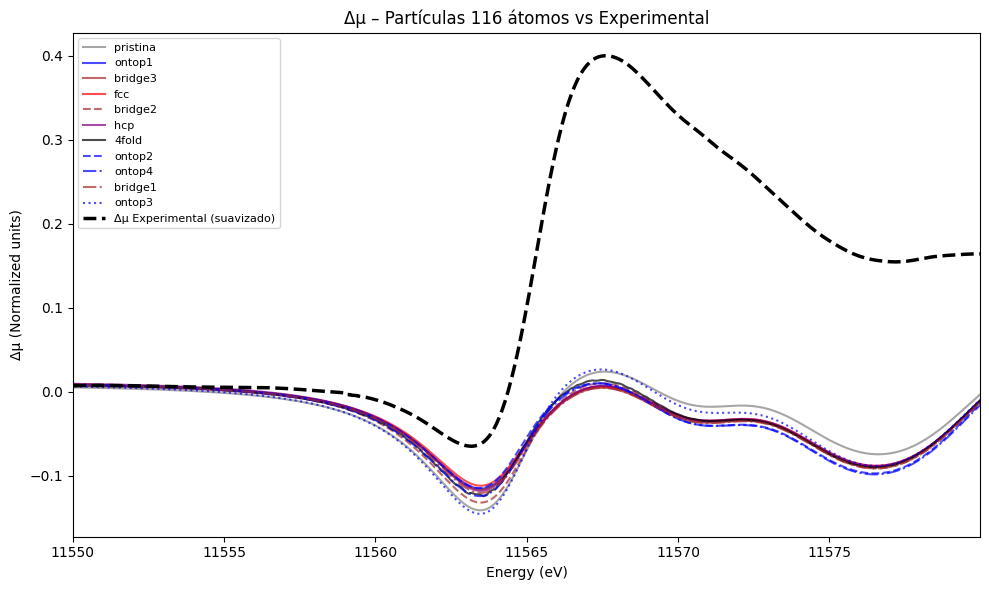


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.225134
ontop1     : RMSE = 0.235410
bridge3    : RMSE = 0.236269
fcc        : RMSE = 0.234790
bridge2    : RMSE = 0.235727
hcp        : RMSE = 0.234900
4fold      : RMSE = 0.233882
ontop2     : RMSE = 0.237345
ontop4     : RMSE = 0.238283
bridge1    : RMSE = 0.237001
ontop3     : RMSE = 0.229567

Top 3 Δμ:
1. pristina   (RMSE = 0.225134)
2. ontop3     (RMSE = 0.229567)
3. 4fold      (RMSE = 0.233882)
Arquivo: normalized/new_experimental\norm_sim_XANESBridge2_err_norm.txt


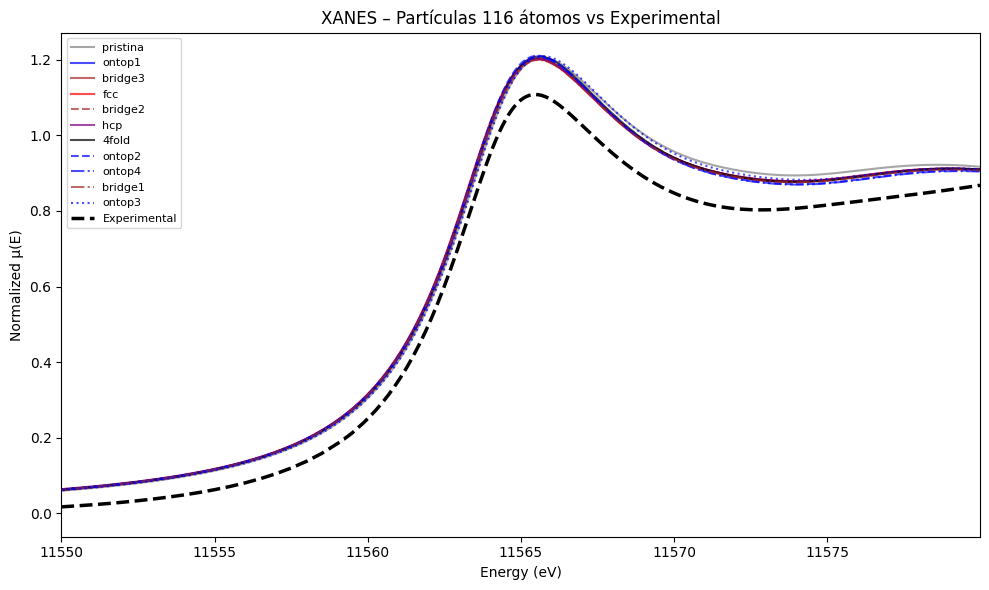


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.080786
ontop1     : RMSE = 0.075354
bridge3    : RMSE = 0.074308
fcc        : RMSE = 0.076305
bridge2    : RMSE = 0.073134
hcp        : RMSE = 0.075583
4fold      : RMSE = 0.075585
ontop2     : RMSE = 0.074167
ontop4     : RMSE = 0.072017
bridge1    : RMSE = 0.073307
ontop3     : RMSE = 0.076866

Top 3 μ(E):
1. ontop4     (RMSE = 0.072017)
2. bridge2    (RMSE = 0.073134)
3. bridge1    (RMSE = 0.073307)


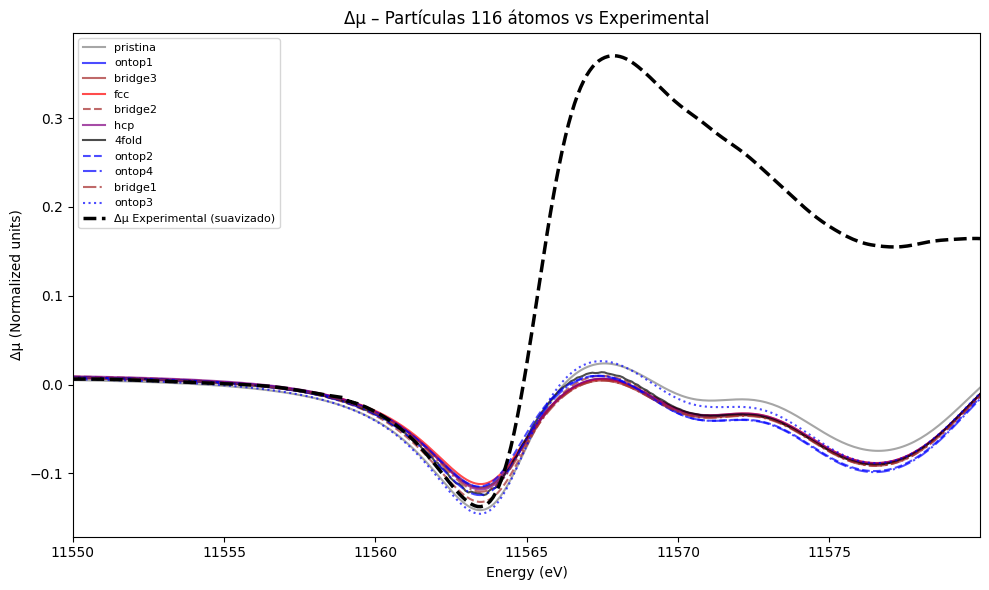


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.204813
ontop1     : RMSE = 0.216070
bridge3    : RMSE = 0.216839
fcc        : RMSE = 0.215574
bridge2    : RMSE = 0.215783
hcp        : RMSE = 0.215454
4fold      : RMSE = 0.214419
ontop2     : RMSE = 0.218270
ontop4     : RMSE = 0.218779
bridge1    : RMSE = 0.217408
ontop3     : RMSE = 0.209336

Top 3 Δμ:
1. pristina   (RMSE = 0.204813)
2. ontop3     (RMSE = 0.209336)
3. 4fold      (RMSE = 0.214419)
Arquivo: normalized/new_experimental\norm_sim_XANESBridge2_norm.txt


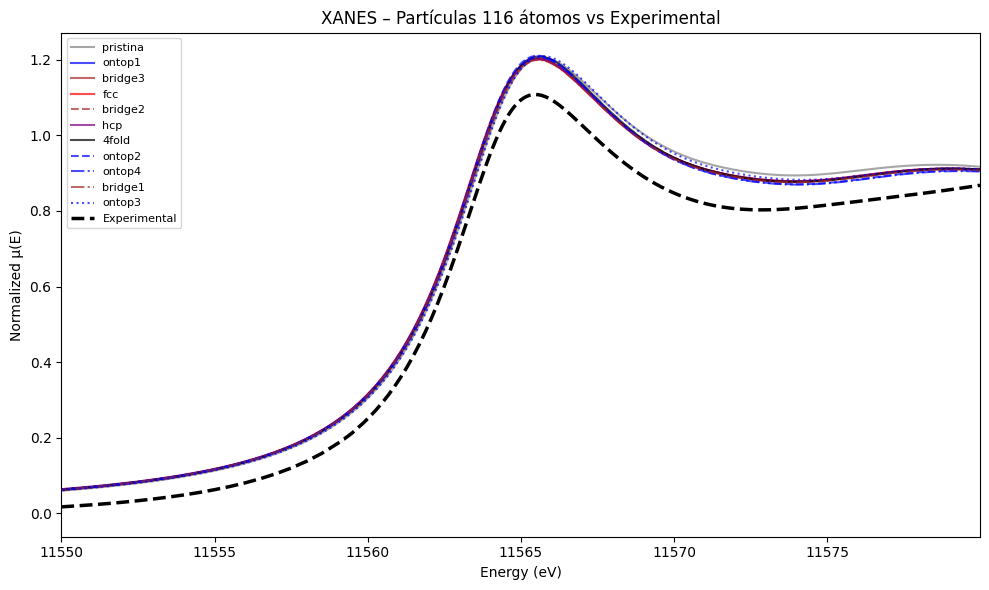


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.080786
ontop1     : RMSE = 0.075354
bridge3    : RMSE = 0.074308
fcc        : RMSE = 0.076305
bridge2    : RMSE = 0.073134
hcp        : RMSE = 0.075583
4fold      : RMSE = 0.075585
ontop2     : RMSE = 0.074167
ontop4     : RMSE = 0.072017
bridge1    : RMSE = 0.073307
ontop3     : RMSE = 0.076866

Top 3 μ(E):
1. ontop4     (RMSE = 0.072017)
2. bridge2    (RMSE = 0.073134)
3. bridge1    (RMSE = 0.073307)


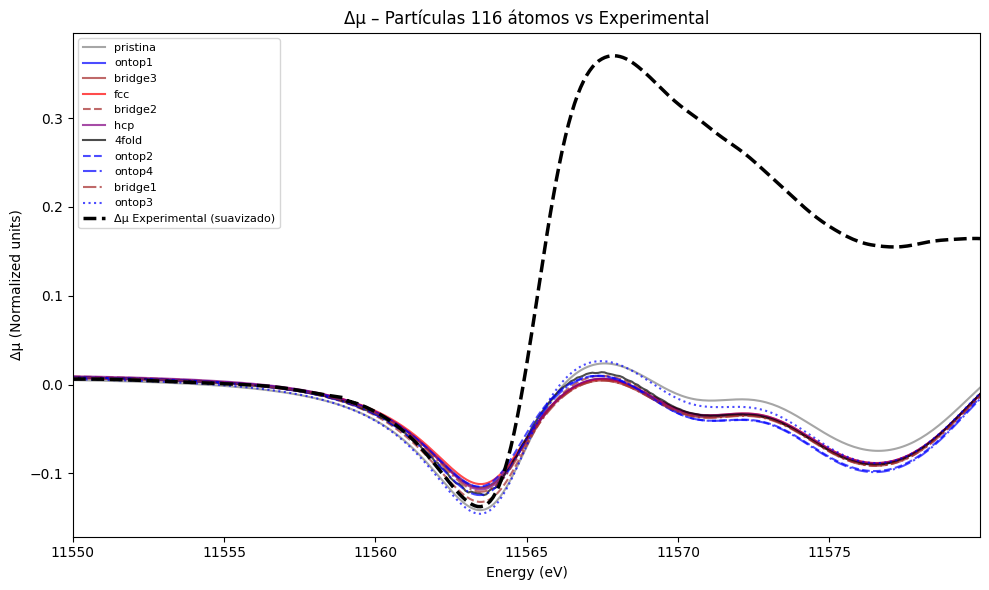


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.204813
ontop1     : RMSE = 0.216070
bridge3    : RMSE = 0.216839
fcc        : RMSE = 0.215574
bridge2    : RMSE = 0.215783
hcp        : RMSE = 0.215454
4fold      : RMSE = 0.214419
ontop2     : RMSE = 0.218270
ontop4     : RMSE = 0.218779
bridge1    : RMSE = 0.217408
ontop3     : RMSE = 0.209336

Top 3 Δμ:
1. pristina   (RMSE = 0.204813)
2. ontop3     (RMSE = 0.209336)
3. 4fold      (RMSE = 0.214419)
Arquivo: normalized/new_experimental\norm_sim_XANESFoil_norm.txt


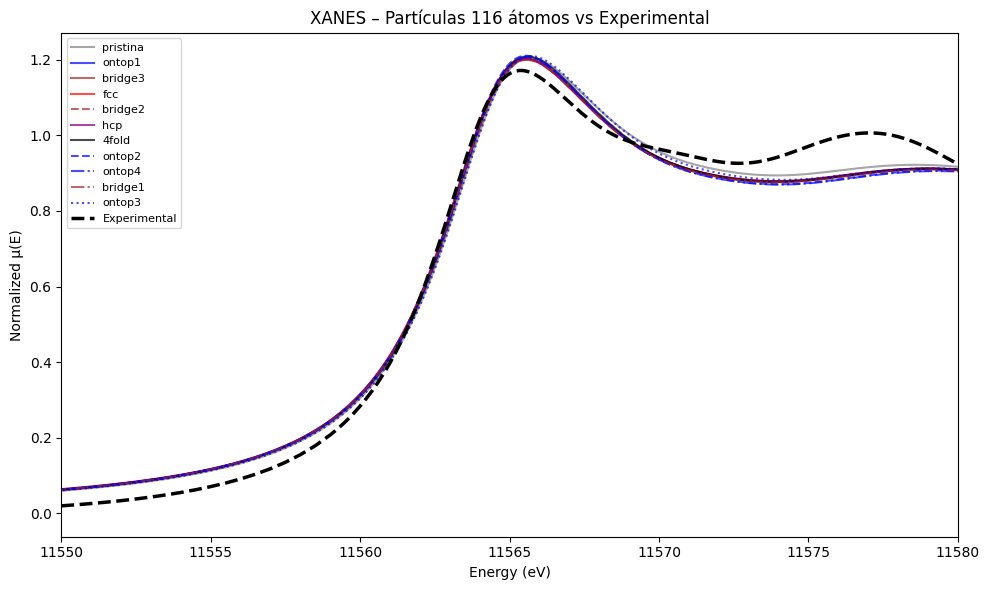


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.045873
ontop1     : RMSE = 0.051531
bridge3    : RMSE = 0.051561
fcc        : RMSE = 0.050971
bridge2    : RMSE = 0.052662
hcp        : RMSE = 0.051108
4fold      : RMSE = 0.052448
ontop2     : RMSE = 0.055867
ontop4     : RMSE = 0.056276
bridge1    : RMSE = 0.052357
ontop3     : RMSE = 0.052438

Top 3 μ(E):
1. pristina   (RMSE = 0.045873)
2. fcc        (RMSE = 0.050971)
3. hcp        (RMSE = 0.051108)


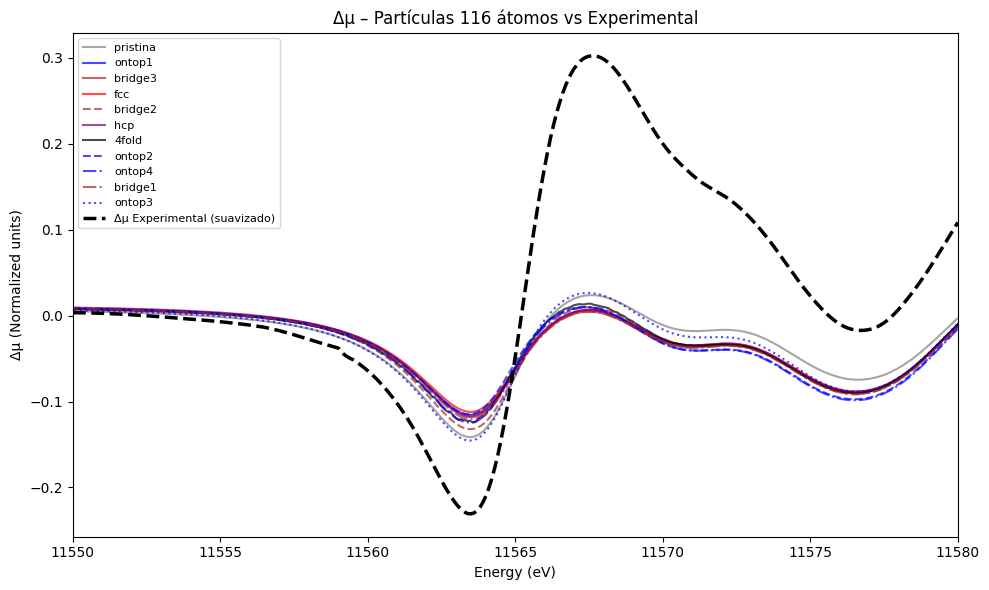


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.136599
ontop1     : RMSE = 0.149657
bridge3    : RMSE = 0.150375
fcc        : RMSE = 0.149551
bridge2    : RMSE = 0.147695
hcp        : RMSE = 0.148910
4fold      : RMSE = 0.146882
ontop2     : RMSE = 0.151055
ontop4     : RMSE = 0.150671
bridge1    : RMSE = 0.150482
ontop3     : RMSE = 0.139415

Top 3 Δμ:
1. pristina   (RMSE = 0.136599)
2. ontop3     (RMSE = 0.139415)
3. 4fold      (RMSE = 0.146882)
Arquivo: normalized/new_experimental\norm_sim_XANESNP_PristineCub_norm.txt


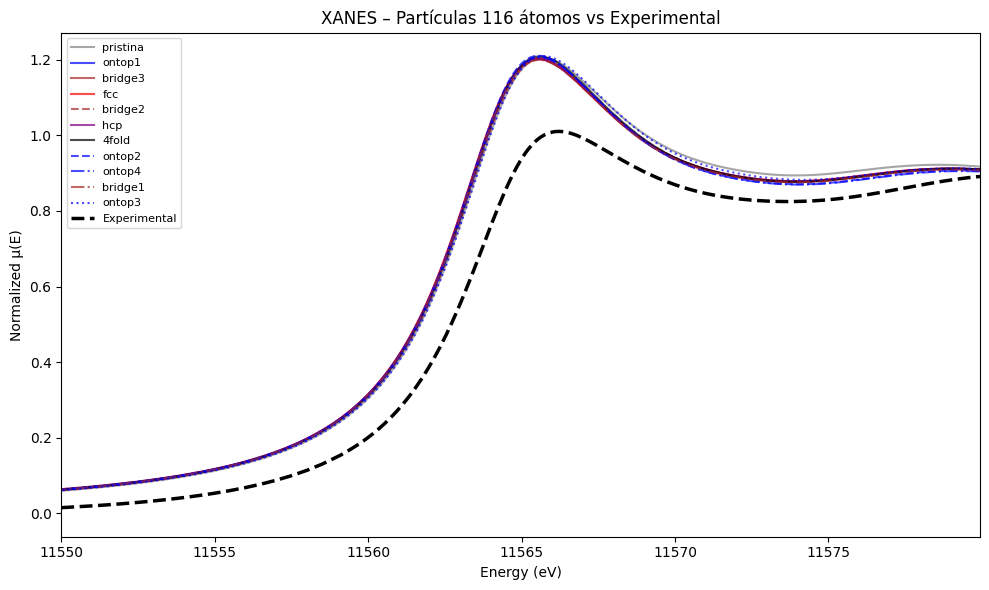


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.124799
ontop1     : RMSE = 0.126105
bridge3    : RMSE = 0.125185
fcc        : RMSE = 0.127236
bridge2    : RMSE = 0.121864
hcp        : RMSE = 0.125691
4fold      : RMSE = 0.125494
ontop2     : RMSE = 0.126544
ontop4     : RMSE = 0.123326
bridge1    : RMSE = 0.123813
ontop3     : RMSE = 0.122439

Top 3 μ(E):
1. bridge2    (RMSE = 0.121864)
2. ontop3     (RMSE = 0.122439)
3. ontop4     (RMSE = 0.123326)


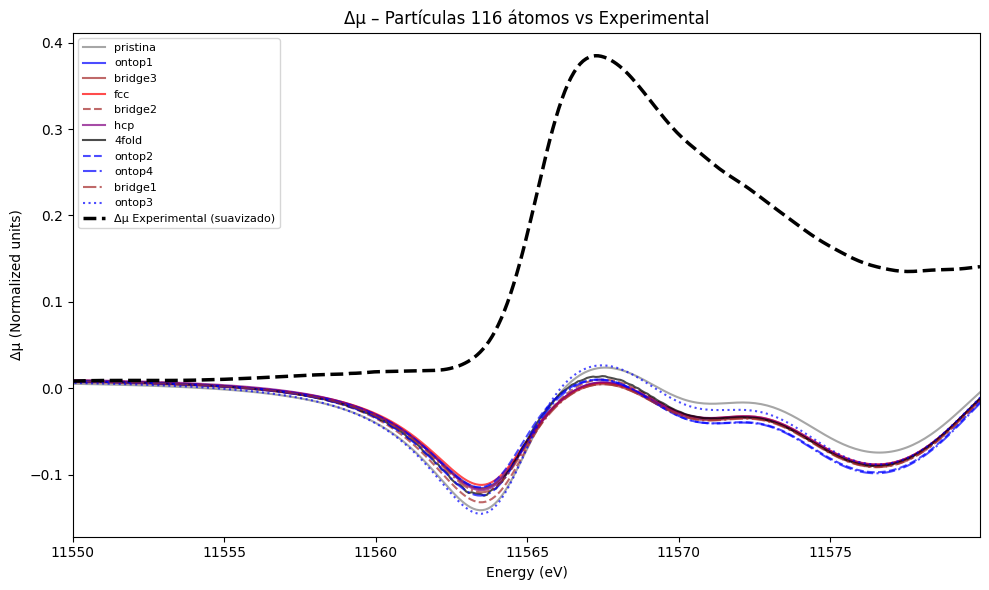


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.227124
ontop1     : RMSE = 0.235616
bridge3    : RMSE = 0.236557
fcc        : RMSE = 0.234822
bridge2    : RMSE = 0.236853
hcp        : RMSE = 0.235276
4fold      : RMSE = 0.234402
ontop2     : RMSE = 0.237232
ontop4     : RMSE = 0.238763
bridge1    : RMSE = 0.237517
ontop3     : RMSE = 0.231459

Top 3 Δμ:
1. pristina   (RMSE = 0.227124)
2. ontop3     (RMSE = 0.231459)
3. 4fold      (RMSE = 0.234402)
Arquivo: normalized/new_experimental\norm_sim_XANESNP_PristineOct_norm.txt


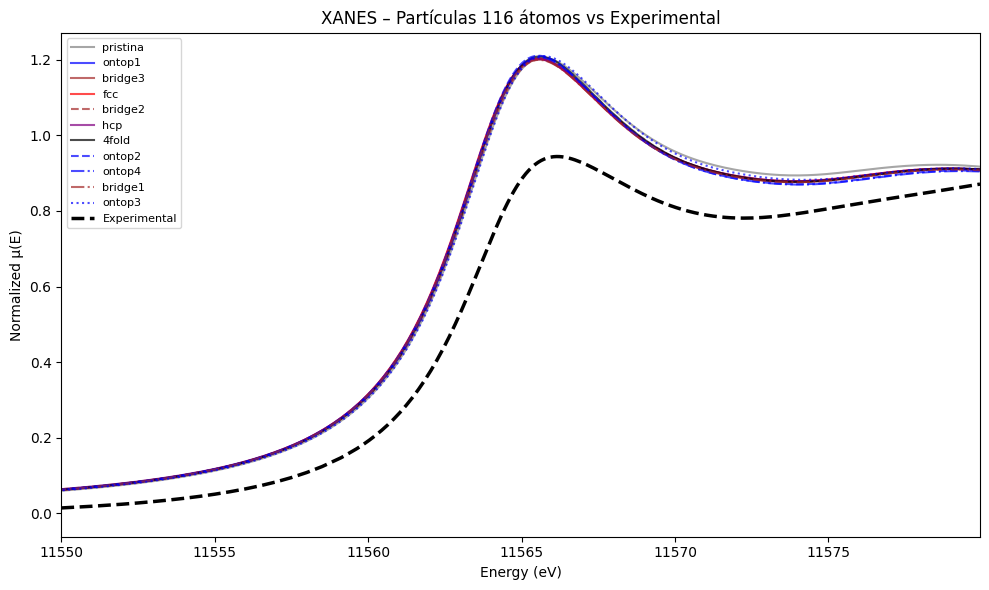


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.159892
ontop1     : RMSE = 0.158964
bridge3    : RMSE = 0.157987
fcc        : RMSE = 0.160062
bridge2    : RMSE = 0.155290
hcp        : RMSE = 0.158693
4fold      : RMSE = 0.158838
ontop2     : RMSE = 0.159119
ontop4     : RMSE = 0.156141
bridge1    : RMSE = 0.156662
ontop3     : RMSE = 0.157203

Top 3 μ(E):
1. bridge2    (RMSE = 0.155290)
2. ontop4     (RMSE = 0.156141)
3. bridge1    (RMSE = 0.156662)


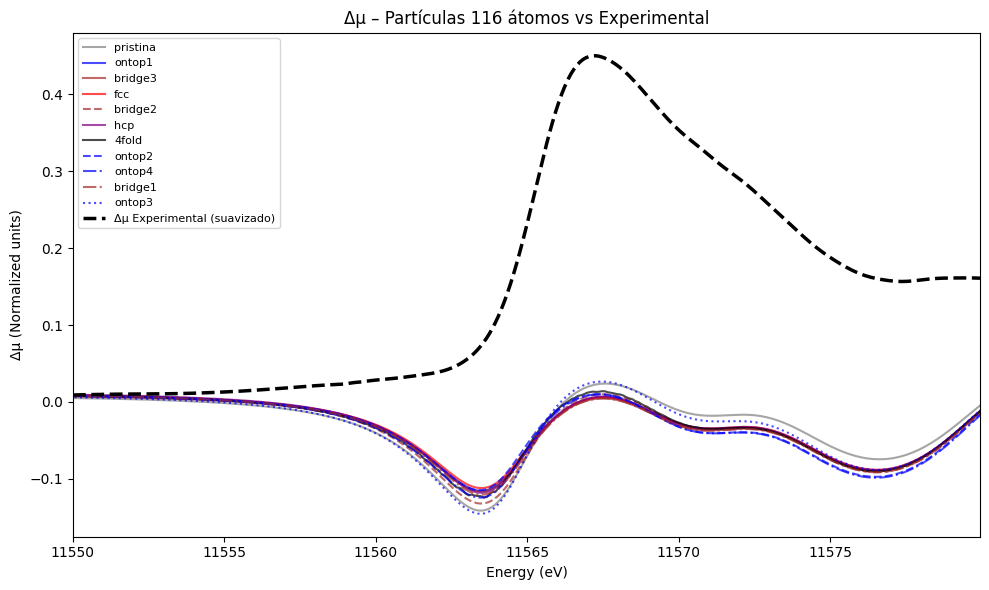


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.267456
ontop1     : RMSE = 0.275889
bridge3    : RMSE = 0.276840
fcc        : RMSE = 0.275093
bridge2    : RMSE = 0.277132
hcp        : RMSE = 0.275562
4fold      : RMSE = 0.274640
ontop2     : RMSE = 0.277397
ontop4     : RMSE = 0.278951
bridge1    : RMSE = 0.277800
ontop3     : RMSE = 0.271664

Top 3 Δμ:
1. pristina   (RMSE = 0.267456)
2. ontop3     (RMSE = 0.271664)
3. 4fold      (RMSE = 0.274640)
Arquivo: normalized/new_experimental\norm_sim_XANESNeutral_err_norm.txt


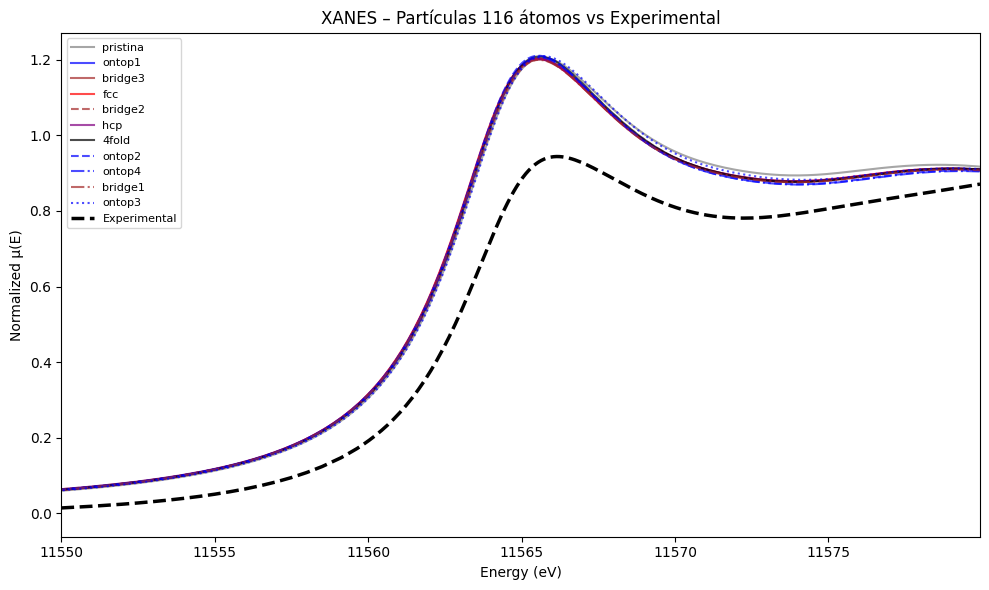


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.159892
ontop1     : RMSE = 0.158964
bridge3    : RMSE = 0.157987
fcc        : RMSE = 0.160062
bridge2    : RMSE = 0.155290
hcp        : RMSE = 0.158693
4fold      : RMSE = 0.158838
ontop2     : RMSE = 0.159119
ontop4     : RMSE = 0.156141
bridge1    : RMSE = 0.156662
ontop3     : RMSE = 0.157203

Top 3 μ(E):
1. bridge2    (RMSE = 0.155290)
2. ontop4     (RMSE = 0.156141)
3. bridge1    (RMSE = 0.156662)


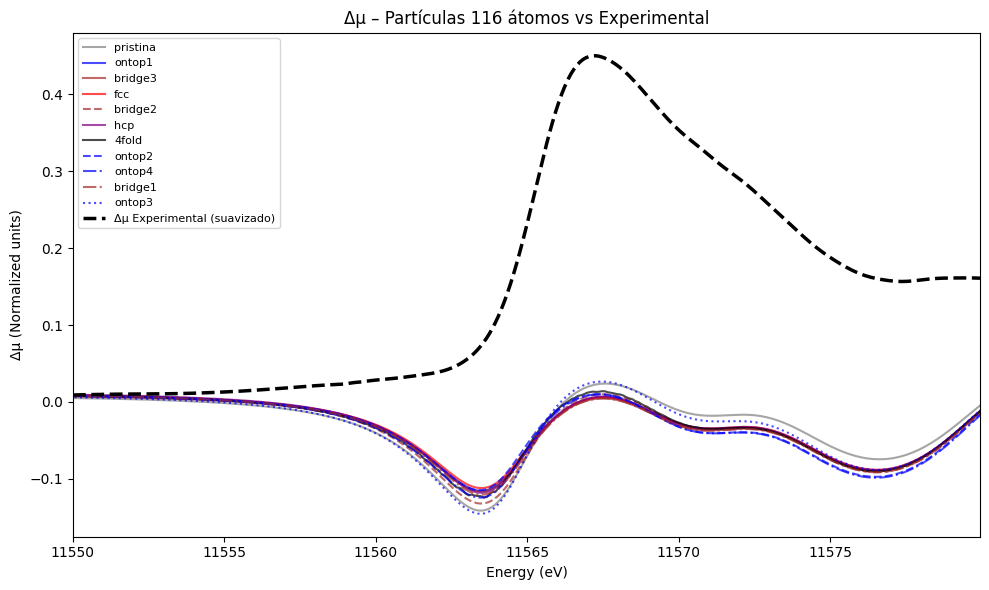


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.267456
ontop1     : RMSE = 0.275889
bridge3    : RMSE = 0.276840
fcc        : RMSE = 0.275093
bridge2    : RMSE = 0.277132
hcp        : RMSE = 0.275562
4fold      : RMSE = 0.274640
ontop2     : RMSE = 0.277397
ontop4     : RMSE = 0.278951
bridge1    : RMSE = 0.277800
ontop3     : RMSE = 0.271664

Top 3 Δμ:
1. pristina   (RMSE = 0.267456)
2. ontop3     (RMSE = 0.271664)
3. 4fold      (RMSE = 0.274640)


In [6]:
new_exp_files = sorted(glob.glob(os.path.join('normalized/new_experimental/', "*.txt")))

for new_exp_file in new_exp_files:
    EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"
    print('==================================================================================================')
    print(f'Arquivo: {new_exp_file}')
    print('==================================================================================================')
    new_experimental_116(new_exp_file, EXP_BULK, energy_min=11550, energy_max=11580, smooth=True, window_length=11, polyorder=3)

### Melhores

Arquivo: normalized/new_experimental/interp_Pt_MoS_Iso_330mV_norm.txt


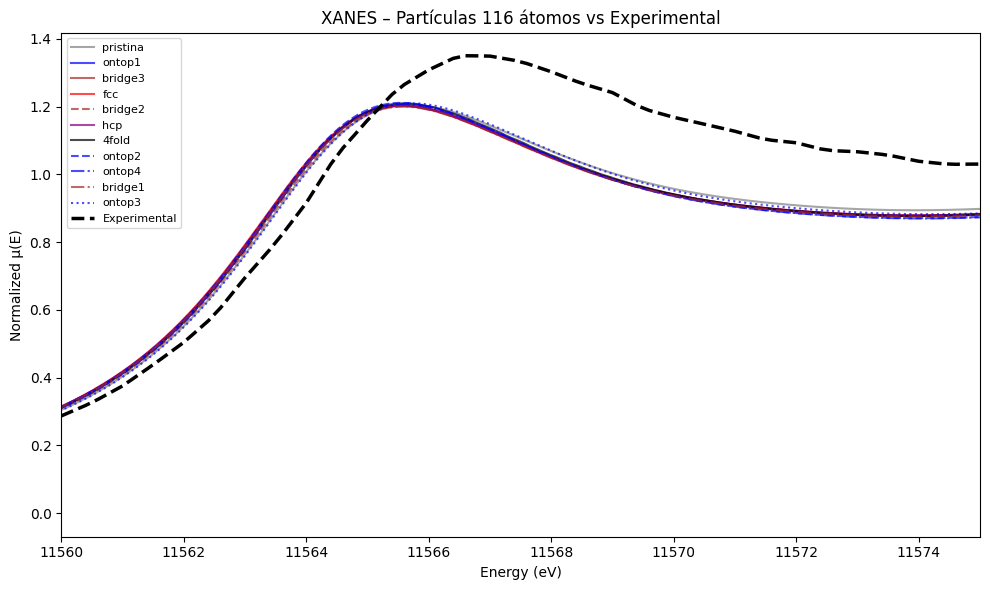


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.152918
ontop1     : RMSE = 0.168172
bridge3    : RMSE = 0.169013
fcc        : RMSE = 0.168035
bridge2    : RMSE = 0.165490
hcp        : RMSE = 0.167195
4fold      : RMSE = 0.165086
ontop2     : RMSE = 0.169770
ontop4     : RMSE = 0.168981
bridge1    : RMSE = 0.168856
ontop3     : RMSE = 0.155805

Top 3 μ(E):
1. pristina   (RMSE = 0.152918)
2. ontop3     (RMSE = 0.155805)
3. 4fold      (RMSE = 0.165086)


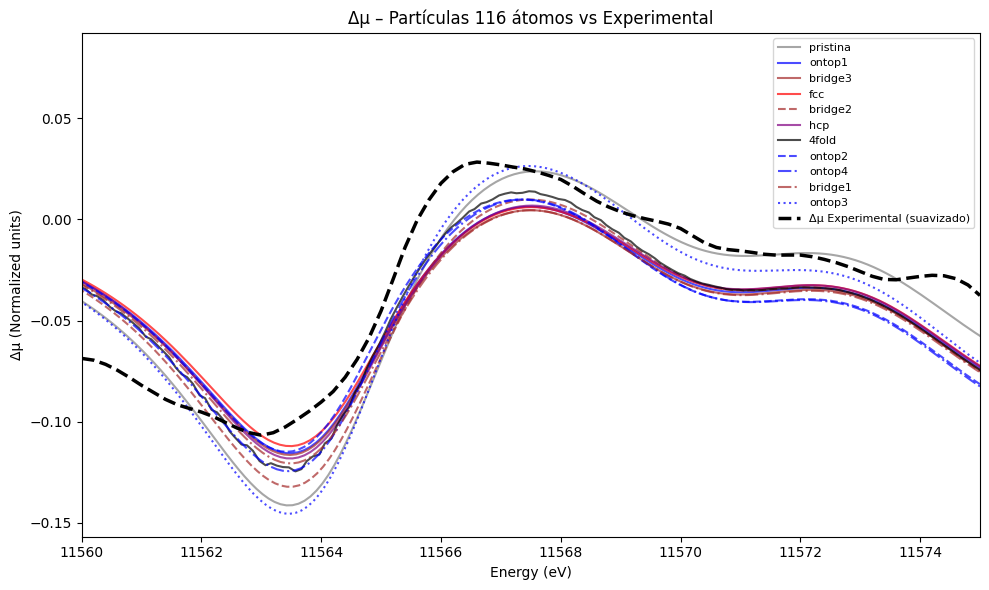


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.018413
ontop1     : RMSE = 0.022570
bridge3    : RMSE = 0.023250
fcc        : RMSE = 0.022292
bridge2    : RMSE = 0.022940
hcp        : RMSE = 0.022292
4fold      : RMSE = 0.020478
ontop2     : RMSE = 0.023263
ontop4     : RMSE = 0.023946
bridge1    : RMSE = 0.023840
ontop3     : RMSE = 0.020312

Top 3 Δμ:
1. pristina   (RMSE = 0.018413)
2. ontop3     (RMSE = 0.020312)
3. 4fold      (RMSE = 0.020478)
Arquivo: normalized/new_experimental/interp_Pt_PVP_330mV_norm.txt


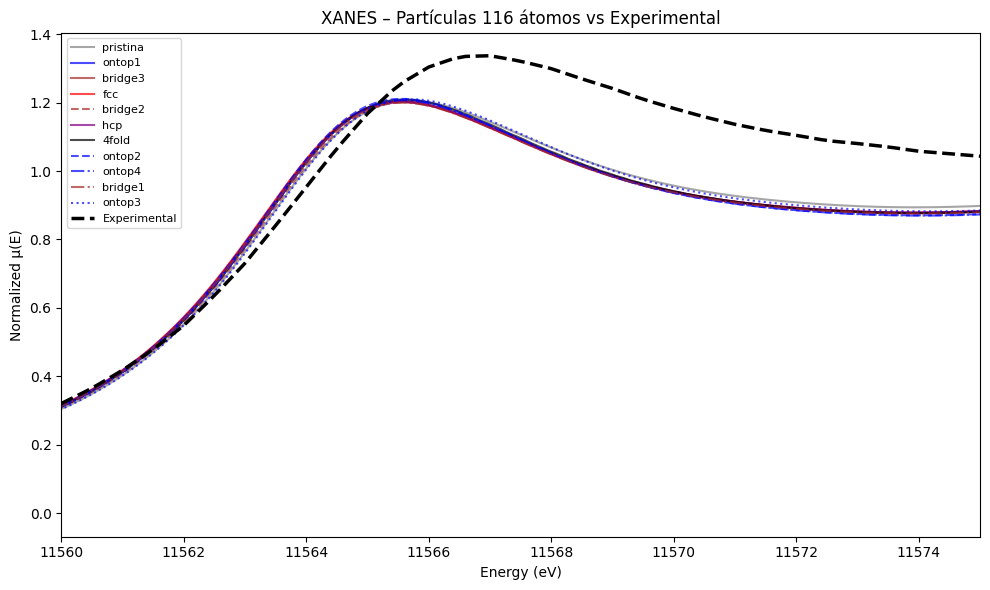


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.155349
ontop1     : RMSE = 0.169479
bridge3    : RMSE = 0.170405
fcc        : RMSE = 0.169126
bridge2    : RMSE = 0.167666
hcp        : RMSE = 0.168576
4fold      : RMSE = 0.166902
ontop2     : RMSE = 0.171281
ontop4     : RMSE = 0.170983
bridge1    : RMSE = 0.170446
ontop3     : RMSE = 0.158735

Top 3 μ(E):
1. pristina   (RMSE = 0.155349)
2. ontop3     (RMSE = 0.158735)
3. 4fold      (RMSE = 0.166902)


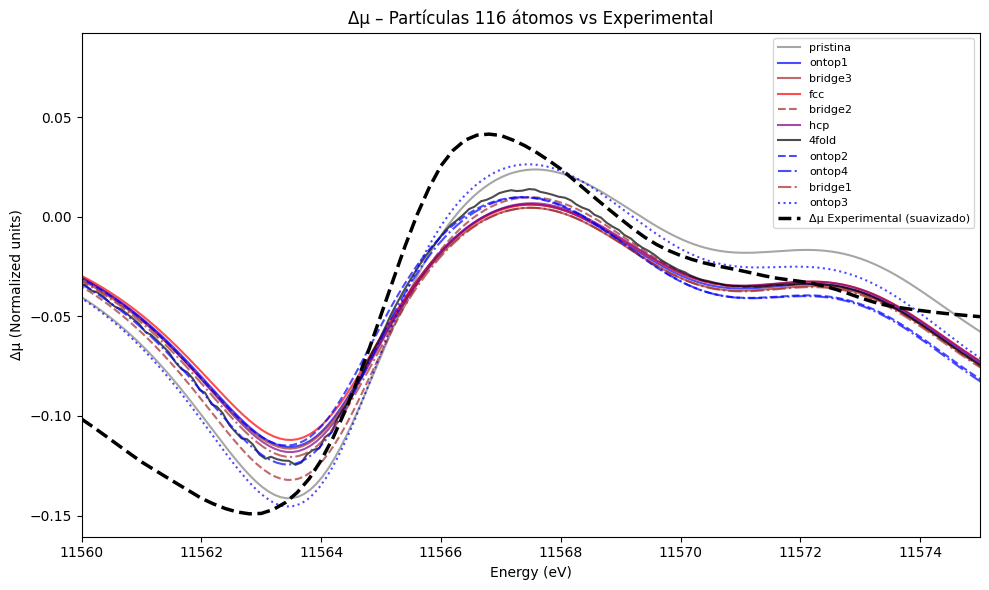


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.026549
ontop1     : RMSE = 0.034385
bridge3    : RMSE = 0.034386
fcc        : RMSE = 0.035267
bridge2    : RMSE = 0.030255
hcp        : RMSE = 0.033876
4fold      : RMSE = 0.030510
ontop2     : RMSE = 0.033764
ontop4     : RMSE = 0.031729
bridge1    : RMSE = 0.033808
ontop3     : RMSE = 0.024607

Top 3 Δμ:
1. ontop3     (RMSE = 0.024607)
2. pristina   (RMSE = 0.026549)
3. bridge2    (RMSE = 0.030255)


In [20]:
EXP_PARTICLEs = ["normalized/new_experimental/interp_Pt_MoS_Iso_330mV_norm.txt",
                 'normalized/new_experimental/interp_Pt_PVP_330mV_norm.txt'
                ]

EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"
for EXP_PARTICLE in EXP_PARTICLEs:
    print('==================================================================================================')
    print(f'Arquivo: {EXP_PARTICLE}')
    print('==================================================================================================')
    new_experimental_116(EXP_PARTICLE, EXP_BULK, energy_min=11560, energy_max=11575, smooth=True, window_length=11, polyorder=3)

## Alinhamento pós plot

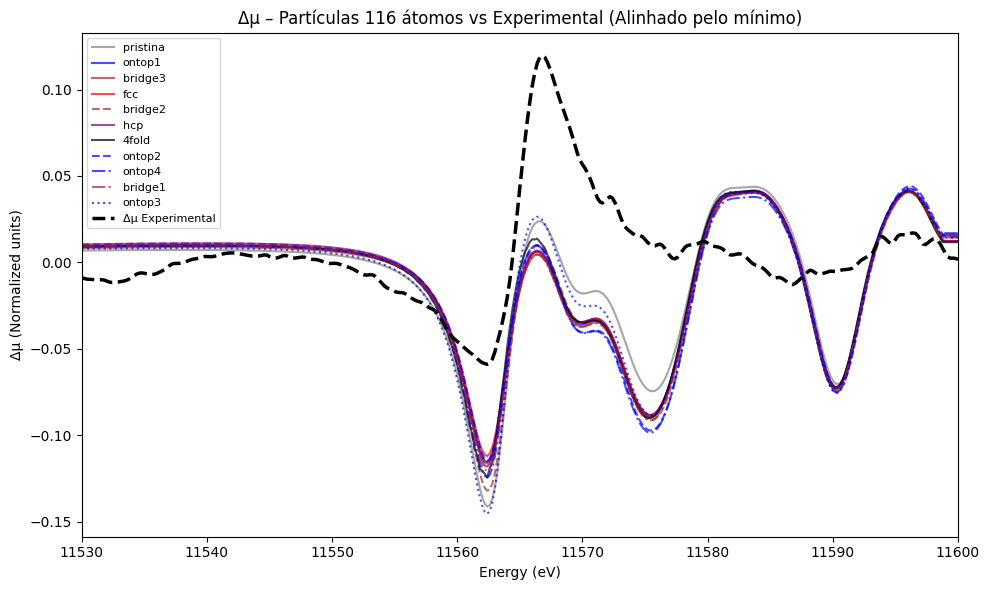


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.041403
ontop1     : RMSE = 0.045955
bridge3    : RMSE = 0.046247
fcc        : RMSE = 0.045466
bridge2    : RMSE = 0.046793
hcp        : RMSE = 0.045804
4fold      : RMSE = 0.045533
ontop2     : RMSE = 0.047273
ontop4     : RMSE = 0.047903
bridge1    : RMSE = 0.046861
ontop3     : RMSE = 0.044248

Top 3 Δμ:
1. pristina   (RMSE = 0.041403)
2. ontop3     (RMSE = 0.044248)
3. fcc        (RMSE = 0.045466)


In [8]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

#  CONFIG 
# Corte do eixo x
x_min = 11530
x_max = 11600

# Caminhos
THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário de sites
site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

# Cores e estilos
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}
linestyles = ['-', '--', '-.', ':']

#  LEITURA DE DADOS 
# Experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

# Calcula Δμ experimental
exp_x = exp_particle[:, 0]
exp_y_particle = exp_particle[:, 1]
exp_y_bulk = exp_bulk[:, 1]
delta_exp_full = exp_y_bulk - exp_y_particle

# Aplica corte do eixo x
mask_exp = (exp_x >= x_min) & (exp_x <= x_max)
exp_x = exp_x[mask_exp]
delta_exp = delta_exp_full[mask_exp]

# Bulk teórico
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]

# Arquivos teóricos
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

#  FUNÇÃO DE ALINHAMENTO PELO PONTO DE MÍNIMO 
def align_min(x, y, ref_x, ref_y):
    """
    Desloca eixo x de y para alinhar o ponto de mínimo com o ponto de mínimo da referência.
    """
    min_idx = np.argmin(y)
    min_x = x[min_idx]
    ref_min_idx = np.argmin(ref_y)
    ref_min_x = ref_x[ref_min_idx]
    shift = ref_min_x - min_x
    return x + shift

#  PLOT Δμ 
plt.figure(figsize=(10, 6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Calcula Δμ teórico
    bulk_interp = np.interp(x, bulk_x, bulk_y)
    delta_mu = y - bulk_interp

    # Aplica corte
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    delta_cut = delta_mu[mask]

    # Alinha pelo ponto de mínimo do experimental
    x_aligned = align_min(x_cut, delta_cut, exp_x, delta_exp)

    # Interpola para o eixo experimental
    delta_interp = np.interp(exp_x, x_aligned, delta_cut)

    # Calcula RMSE
    rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))

    # Label e cores
    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_delta[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, delta_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

# Δμ experimental
plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 116 átomos vs Experimental (Alinhado pelo mínimo)")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

#  EXIBE RMSE 
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
print("\nTop 3 Δμ:")
for i, (label, rmse) in enumerate(top3_delta, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


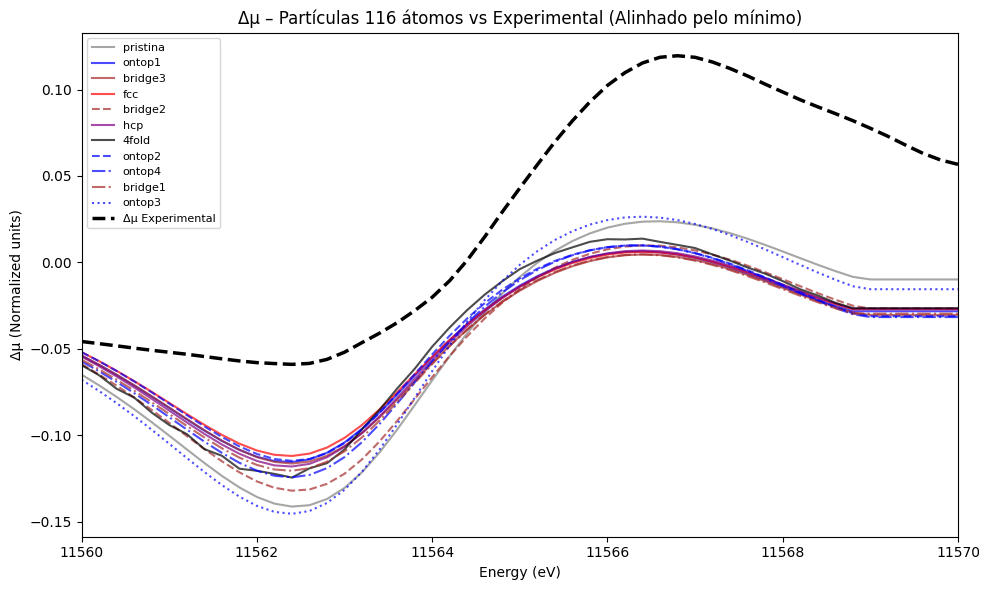


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.073274
ontop1     : RMSE = 0.078290
bridge3    : RMSE = 0.079656
fcc        : RMSE = 0.077454
bridge2    : RMSE = 0.079987
hcp        : RMSE = 0.078179
4fold      : RMSE = 0.076342
ontop2     : RMSE = 0.077185
ontop4     : RMSE = 0.079280
bridge1    : RMSE = 0.080401
ontop3     : RMSE = 0.074402

Top 3 Δμ:
1. pristina   (RMSE = 0.073274)
2. ontop3     (RMSE = 0.074402)
3. 4fold      (RMSE = 0.076342)


In [9]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

#  CONFIG 
# Corte do eixo x
x_min = 11560
x_max = 11570

# Caminhos
THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário de sites
site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

# Cores e estilos
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}
linestyles = ['-', '--', '-.', ':']

#  LEITURA DE DADOS 
# Experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

# Calcula Δμ experimental
exp_x = exp_particle[:, 0]
exp_y_particle = exp_particle[:, 1]
exp_y_bulk = exp_bulk[:, 1]
delta_exp_full = exp_y_bulk - exp_y_particle

# Aplica corte do eixo x
mask_exp = (exp_x >= x_min) & (exp_x <= x_max)
exp_x = exp_x[mask_exp]
delta_exp = delta_exp_full[mask_exp]

# Bulk teórico
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]

# Arquivos teóricos
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

#  FUNÇÃO DE ALINHAMENTO PELO PONTO DE MÍNIMO 
def align_min(x, y, ref_x, ref_y):
    """
    Desloca eixo x de y para alinhar o ponto de mínimo com o ponto de mínimo da referência.
    """
    min_idx = np.argmin(y)
    min_x = x[min_idx]
    ref_min_idx = np.argmin(ref_y)
    ref_min_x = ref_x[ref_min_idx]
    shift = ref_min_x - min_x
    return x + shift

#  PLOT Δμ 
plt.figure(figsize=(10, 6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Calcula Δμ teórico
    bulk_interp = np.interp(x, bulk_x, bulk_y)
    delta_mu = y - bulk_interp

    # Aplica corte
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    delta_cut = delta_mu[mask]

    # Alinha pelo ponto de mínimo do experimental
    x_aligned = align_min(x_cut, delta_cut, exp_x, delta_exp)

    # Interpola para o eixo experimental
    delta_interp = np.interp(exp_x, x_aligned, delta_cut)

    # Calcula RMSE
    rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))

    # Label e cores
    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_delta[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, delta_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

# Δμ experimental
plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 116 átomos vs Experimental (Alinhado pelo mínimo)")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

#  EXIBE RMSE 
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
print("\nTop 3 Δμ:")
for i, (label, rmse) in enumerate(top3_delta, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


### Combinação linear deste caso:

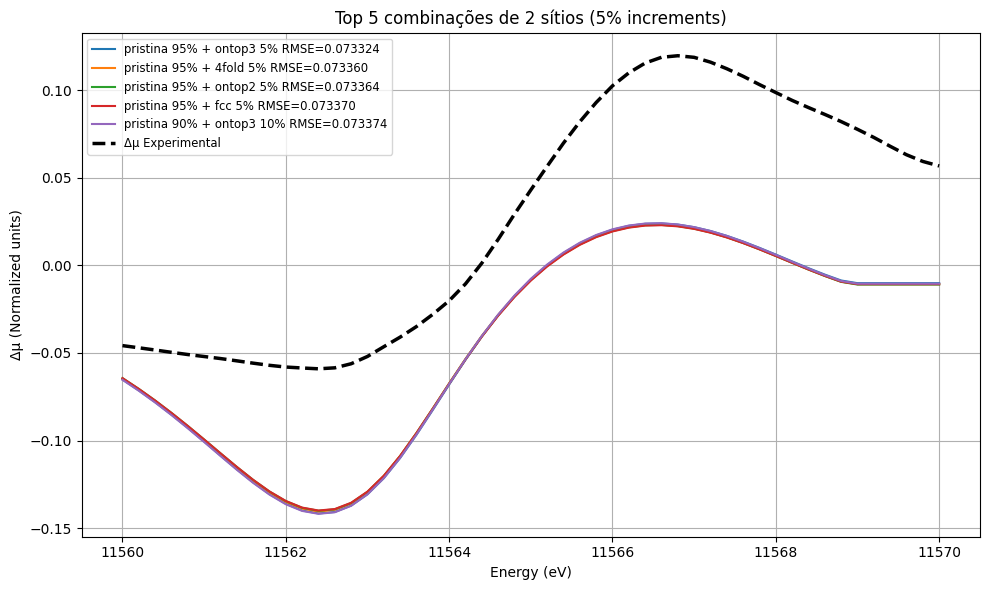

Top 5 combinações de 2 sítios:
1. pristina 95% + ontop3 5% | RMSE=0.073324
2. pristina 95% + 4fold 5% | RMSE=0.073360
3. pristina 95% + ontop2 5% | RMSE=0.073364
4. pristina 95% + fcc 5% | RMSE=0.073370
5. pristina 90% + ontop3 10% | RMSE=0.073374


In [10]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

# ----------------- CONFIG -----------------
x_min = 11560
x_max = 11570

THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}
linestyles = ['-', '--', '-.', ':']

# ----------------- FUNÇÕES -----------------
def align_min(x, y, ref_x, ref_y):
    min_idx = np.argmin(y)
    min_x = x[min_idx]
    ref_min_idx = np.argmin(ref_y)
    ref_min_x = ref_x[ref_min_idx]
    shift = ref_min_x - min_x
    return x + shift

def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

# ----------------- LEITURA DE DADOS -----------------
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

exp_x_full = exp_particle[:, 0]
exp_y_particle = exp_particle[:, 1]
exp_y_bulk = exp_bulk[:, 1]
delta_exp_full = exp_y_bulk - exp_y_particle

mask_exp = (exp_x_full >= x_min) & (exp_x_full <= x_max)
exp_x = exp_x_full[mask_exp]
delta_exp = delta_exp_full[mask_exp]

bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]

# Arquivos dos sítios (excluindo bulk)
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

# Calcula Δμ de cada sítio
site_deltas = {}
site_labels = {}
for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:,0]
    y = data[:,4]
    bulk_interp = np.interp(x, bulk_x, bulk_y)
    delta_mu = y - bulk_interp
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    delta_cut = delta_mu[mask]
    x_aligned = align_min(x_cut, delta_cut, exp_x, delta_exp)
    delta_interp = np.interp(exp_x, x_aligned, delta_cut)
    site_deltas[f] = delta_interp
    site_code = os.path.basename(f).split("_")[1]
    site_labels[f] = site_labels_116.get(site_code, site_code)

# ----------------- COMBINAÇÕES -----------------
best_combos = []

for f1, f2 in combinations(site_deltas.keys(), 2):
    delta1 = site_deltas[f1]
    delta2 = site_deltas[f2]
    weights = np.linspace(0.05, 0.95, 19)
    for w1 in weights:
        w2 = 1 - w1
        combo_delta = w1*delta1 + w2*delta2
        score = rmse(delta_exp, combo_delta)
        best_combos.append({
            'files': (os.path.basename(f1), os.path.basename(f2)),
            'weights': (w1, w2),
            'rmse': score,
            'delta': combo_delta
        })

best_combos = sorted(best_combos, key=lambda x: x['rmse'])[:5]  # top 5

# ----------------- PLOT -----------------
plt.figure(figsize=(10,6))
for combo in best_combos:
    f1, f2 = combo['files']
    w1, w2 = combo['weights']
    label = f"{site_labels_116.get(f1.split('_')[1], f1)} {w1*100:.0f}% + {site_labels_116.get(f2.split('_')[1], f2)} {w2*100:.0f}% RMSE={combo['rmse']:.6f}"
    plt.plot(exp_x, combo['delta'], label=label)

plt.plot(exp_x, delta_exp, 'k--', linewidth=2.5, label="Δμ Experimental")
plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Top 5 combinações de 2 sítios (5% increments)")
plt.legend(fontsize='small', ncol=1)
plt.grid(True)
plt.tight_layout()
plt.show()

# ----------------- PRINT RESULTADOS -----------------
print("Top 5 combinações de 2 sítios:")
for i, combo in enumerate(best_combos, 1):
    f1, f2 = combo['files']
    w1, w2 = combo['weights']
    print(f"{i}. {site_labels_116.get(f1.split('_')[1], f1)} {w1*100:.0f}% + {site_labels_116.get(f2.split('_')[1], f2)} {w2*100:.0f}% | RMSE={combo['rmse']:.6f}")


## Alinhamentos

### E0

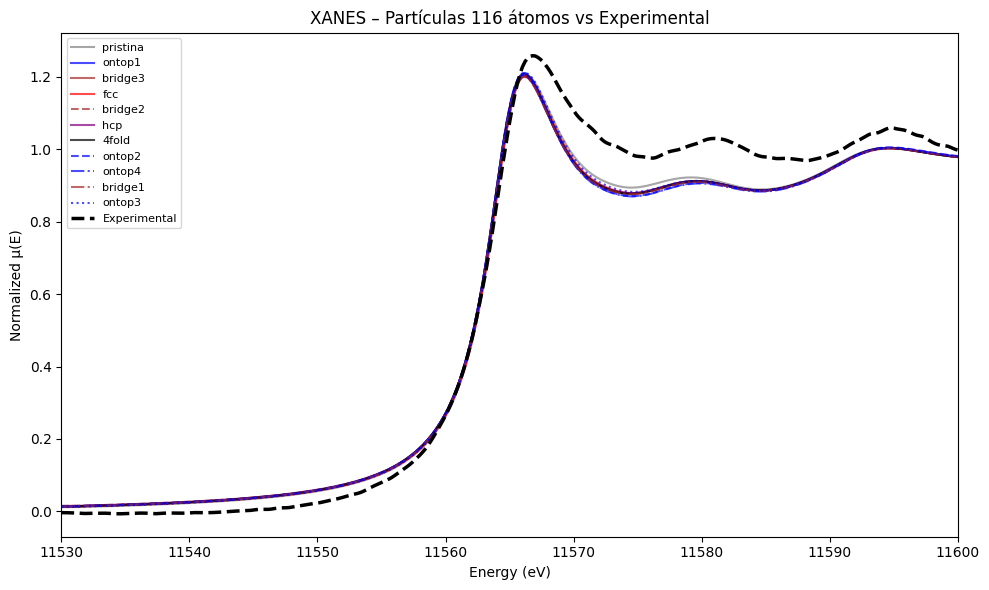


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.060402
ontop1     : RMSE = 0.067164
bridge3    : RMSE = 0.066953
fcc        : RMSE = 0.065765
bridge2    : RMSE = 0.067422
hcp        : RMSE = 0.067078
4fold      : RMSE = 0.066948
ontop2     : RMSE = 0.068603
ontop4     : RMSE = 0.069678
bridge1    : RMSE = 0.068044
ontop3     : RMSE = 0.064110

Top 3 μ(E):
1. pristina   (RMSE=0.060402)
2. ontop3     (RMSE=0.064110)
3. fcc        (RMSE=0.065765)


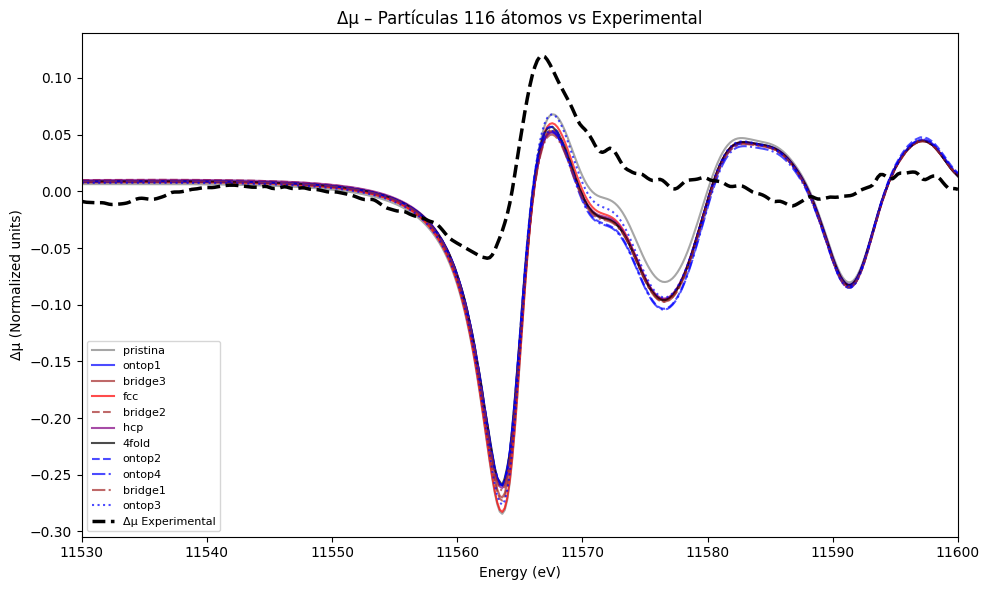


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.060901
ontop1     : RMSE = 0.059962
bridge3    : RMSE = 0.061679
fcc        : RMSE = 0.063116
bridge2    : RMSE = 0.062270
hcp        : RMSE = 0.060187
4fold      : RMSE = 0.059318
ontop2     : RMSE = 0.060676
ontop4     : RMSE = 0.061004
bridge1    : RMSE = 0.061236
ontop3     : RMSE = 0.061182

Top 3 Δμ:
1. 4fold      (RMSE=0.059318)
2. ontop1     (RMSE=0.059962)
3. hcp        (RMSE=0.060187)


In [11]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Corte
x_min = 11530
x_max = 11600

# Caminhos
THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário de labels
site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

# Cores e estilos
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}
linestyles = ['-', '--', '-.', ':']

# find E0 da Cruzeiro do Sul
def find_E0(energies, absorption):
    # derivadas
    dydx = np.diff(absorption) / np.diff(energies)
    x_new = energies[:-1]
    dydx2 = np.diff(dydx) / np.diff(x_new)
    range_search_E0_end = int(len(energies) / 2)
    deriv_max = -np.inf
    point_max = 0
    for point in range(range_search_E0_end):
        if dydx[point] > deriv_max and dydx2[point] > 0:
            deriv_max = dydx[point]
            point_max = point
    return energies[point_max], absorption[point_max], point_max

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

mask_exp = (exp_particle[:,0] >= x_min) & (exp_particle[:,0] <= x_max)
exp_x = exp_particle[mask_exp, 0]
exp_y_particle = exp_particle[mask_exp, 1]
exp_y_bulk = exp_bulk[mask_exp, 1]
delta_exp = exp_y_bulk - exp_y_particle

# Encontra E0 experimental
E0_exp, _, _ = find_E0(exp_x, exp_y_particle)

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]

# Lê arquivos teóricos
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

# Alinhar pelo E0
def align_E0(x, y, E0_ref, energies_original):
    E0_curve, _, _ = find_E0(x, y)
    shift = E0_ref - E0_curve
    x_shifted = x + shift
    # preserva o eixo original
    x_final = np.interp(energies_original, x_shifted, x_shifted, left=np.nan, right=np.nan)
    return x_shifted

# Figura 1: Curvas
plt.figure(figsize=(10,6))
rmse_mu = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:,0]
    y = data[:,4]

    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]
    if len(x_cut)==0: continue

    x_aligned = align_E0(x_cut, y_cut, E0_exp, exp_x)

    y_interp = np.interp(exp_x, x_aligned, y_cut)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle)**2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_mu[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label,0)
    linestyle = linestyles[variant_count[base_label]%len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, y_interp, label=label, color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")
plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE e Top3 μ(E)
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_mu = sorted(rmse_mu.items(), key=lambda x:x[1])[:3]
print("\nTop 3 μ(E):")
for i,(label,rmse) in enumerate(top3_mu,1):
    print(f"{i}. {label:10s} (RMSE={rmse:.6f})")

# Figura 2; delta mu
plt.figure(figsize=(10,6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:,0]
    y = data[:,4]

    mask = (x>=x_min) & (x<=x_max)
    x_cut = x[mask]
    y_cut = y[mask]
    if len(x_cut)==0: continue

    x_aligned = align_E0(x_cut, y_cut, E0_exp, exp_x)

    bulk_interp = np.interp(x_aligned, bulk_x, bulk_y)
    delta_mu = y_cut - bulk_interp

    delta_interp = np.interp(exp_x, x_aligned, delta_mu)
    rmse = np.sqrt(np.mean((delta_interp - delta_exp)**2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_delta[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label,0)
    linestyle = linestyles[variant_count[base_label]%len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, delta_interp, label=label, color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")
plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE e Top3 Δμ
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x:x[1])[:3]
print("\nTop 3 Δμ:")
for i,(label,rmse) in enumerate(top3_delta,1):
    print(f"{i}. {label:10s} (RMSE={rmse:.6f})")


### Primeiro pico

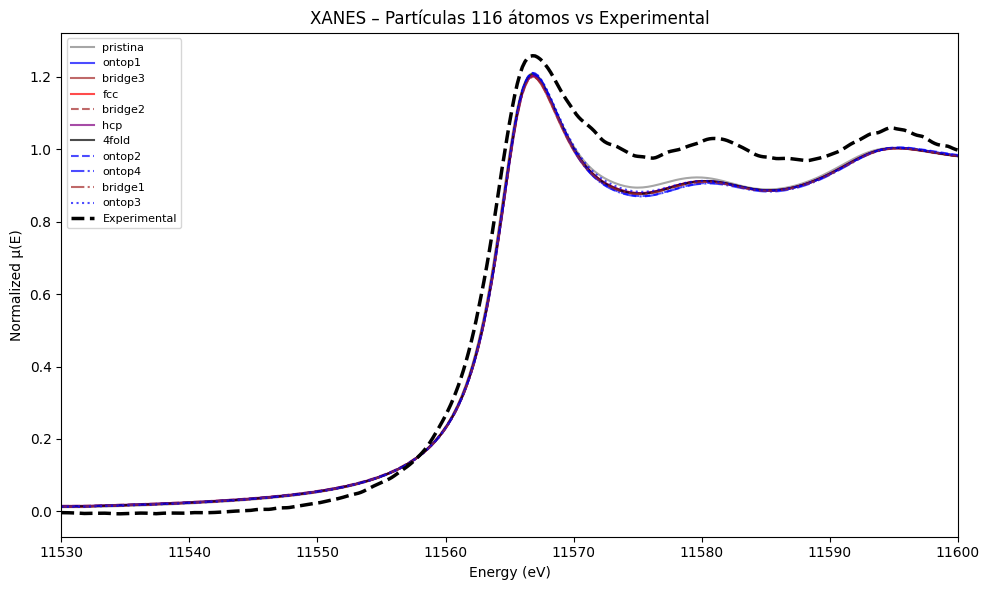


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.061332
ontop1     : RMSE = 0.067744
bridge3    : RMSE = 0.067314
fcc        : RMSE = 0.067459
bridge2    : RMSE = 0.067979
hcp        : RMSE = 0.067882
4fold      : RMSE = 0.067215
ontop2     : RMSE = 0.069099
ontop4     : RMSE = 0.070055
bridge1    : RMSE = 0.069124
ontop3     : RMSE = 0.065463

Top 3 μ(E):
1. pristina   (RMSE = 0.061332)
2. ontop3     (RMSE = 0.065463)
3. 4fold      (RMSE = 0.067215)


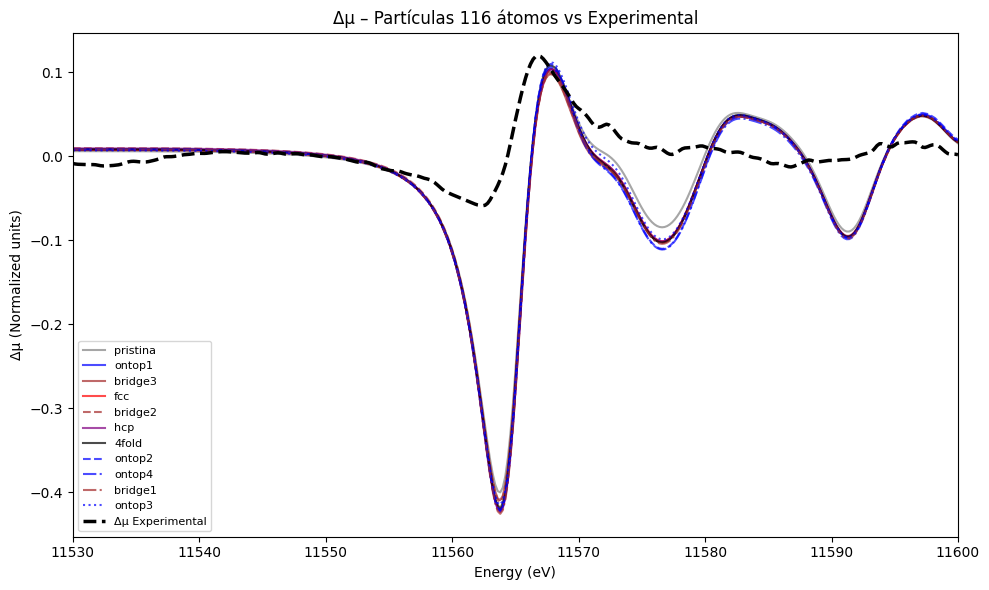


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.082822
ontop1     : RMSE = 0.088882
bridge3    : RMSE = 0.086480
fcc        : RMSE = 0.088564
bridge2    : RMSE = 0.086988
hcp        : RMSE = 0.089150
4fold      : RMSE = 0.088063
ontop2     : RMSE = 0.089513
ontop4     : RMSE = 0.089549
bridge1    : RMSE = 0.090058
ontop3     : RMSE = 0.087023

Top 3 Δμ:
1. pristina   (RMSE = 0.082822)
2. bridge3    (RMSE = 0.086480)
3. bridge2    (RMSE = 0.086988)


In [12]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Corte
x_min = 11530
x_max = 11600

# Caminhos
THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário
site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

# Lista de cores personalizável (mesma cor para tipos iguais)
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}

# Lista de estilos de linha para variantes
linestyles = ['-', '--', '-.', ':']

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

# Aplica corte no eixo x
mask_exp = (exp_particle[:,0] >= x_min) & (exp_particle[:,0] <= x_max)
exp_x = exp_particle[mask_exp, 0]
exp_y_particle = exp_particle[mask_exp, 1]
exp_y_bulk = exp_bulk[mask_exp, 1]
delta_exp = exp_y_bulk - exp_y_particle  # Δμ experimental

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]  # coluna Final_normalized

# Lê o que simulei
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

#  ALINHAR CURVAS PELO PICO 
def align_peak(x, y, ref_x, ref_y):
    """Desloca x para alinhar pico máximo com pico da referência"""
    max_idx = np.argmax(y)
    max_x = x[max_idx]
    ref_max_idx = np.argmax(ref_y)
    ref_max_x = ref_x[ref_max_idx]
    shift = ref_max_x - max_x
    return x + shift  # apenas desloca eixo x

# Figura 1: plots μ(E)
plt.figure(figsize=(10, 6))
rmse_mu = {}  # Armazena RMSE das curvas μ(E)
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Aplica corte no eixo x
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]

    # Alinha pelo pico experimental
    x_aligned = align_peak(x_cut, y_cut, exp_x, exp_y_particle)
    
    # Interpola para eixo experimental
    y_interp = np.interp(exp_x, x_aligned, y_cut)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_mu[label] = rmse

    # Define cor e estilo de linha
    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, y_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_mu = sorted(rmse_mu.items(), key=lambda x: x[1])[:3]
print("\nTop 3 μ(E):")
for i, (label, rmse) in enumerate(top3_mu, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")

# Figura 2: Δμ
plt.figure(figsize=(10, 6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Aplica corte
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]

    # Alinha pelo pico experimental
    x_aligned = align_peak(x_cut, y_cut, exp_x, exp_y_particle)

    # Interpola bulk_y
    bulk_interp = np.interp(x_aligned, bulk_x, bulk_y)
    delta_mu = y_cut - bulk_interp

    # Interpola Δμ para eixo experimental
    delta_interp = np.interp(exp_x, x_aligned, delta_mu)
    rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_delta[label] = rmse

    # Define cor e estilo
    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, delta_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
print("\nTop 3 Δμ:")
for i, (label, rmse) in enumerate(top3_delta, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


## Alinhamento apenas teórico

### E0

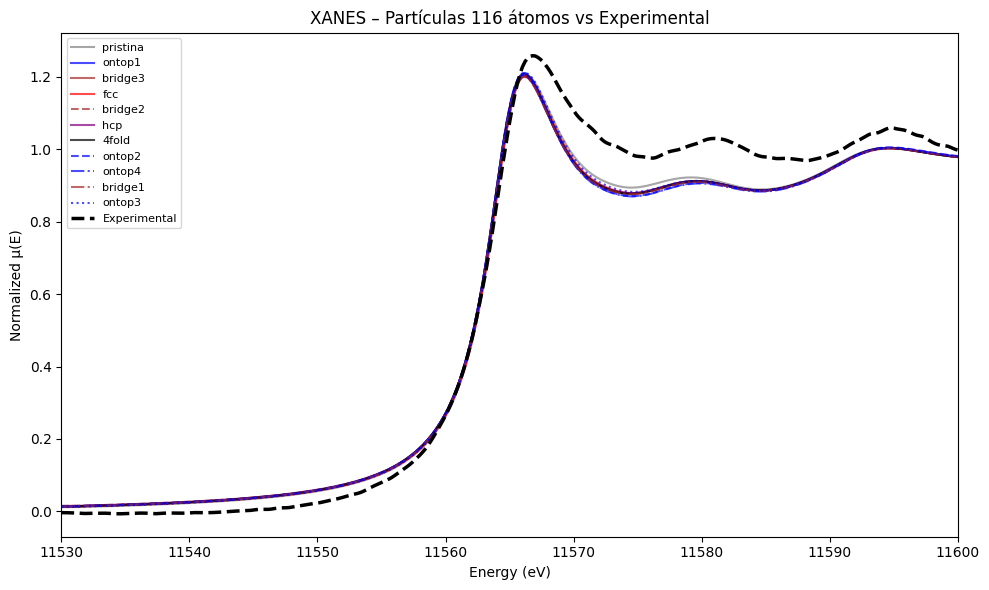


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.060402
ontop1     : RMSE = 0.067164
bridge3    : RMSE = 0.066953
fcc        : RMSE = 0.065765
bridge2    : RMSE = 0.067422
hcp        : RMSE = 0.067078
4fold      : RMSE = 0.066948
ontop2     : RMSE = 0.068603
ontop4     : RMSE = 0.069678
bridge1    : RMSE = 0.068044
ontop3     : RMSE = 0.064110

Top 3 μ(E):
1. pristina   (RMSE=0.060402)
2. ontop3     (RMSE=0.064110)
3. fcc        (RMSE=0.065765)


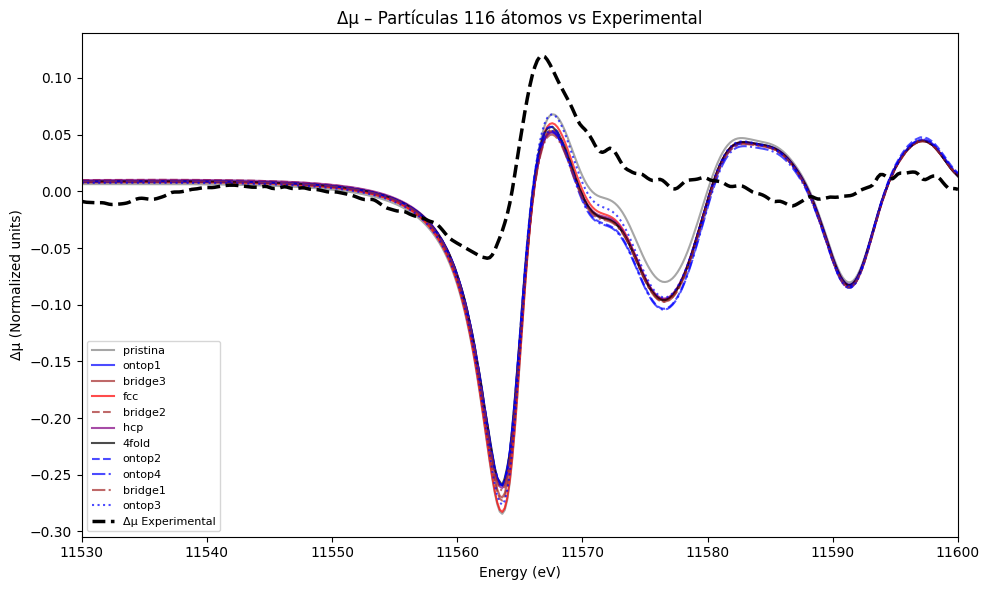


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.060901
ontop1     : RMSE = 0.059962
bridge3    : RMSE = 0.061679
fcc        : RMSE = 0.063116
bridge2    : RMSE = 0.062270
hcp        : RMSE = 0.060187
4fold      : RMSE = 0.059318
ontop2     : RMSE = 0.060676
ontop4     : RMSE = 0.061004
bridge1    : RMSE = 0.061236
ontop3     : RMSE = 0.061182

Top 3 Δμ:
1. 4fold      (RMSE=0.059318)
2. ontop1     (RMSE=0.059962)
3. hcp        (RMSE=0.060187)


In [13]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Corte
x_min = 11530
x_max = 11600

# Caminhos
THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário de labels
site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

# Cores e estilos
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}
linestyles = ['-', '--', '-.', ':']

# Função para encontrar E0
def find_E0(energies, absorption):
    dydx = np.diff(absorption) / np.diff(energies)
    x_new = energies[:-1]
    dydx2 = np.diff(dydx) / np.diff(x_new)
    range_search_E0_end = int(len(energies) / 2)
    deriv_max = -np.inf
    point_max = 0
    for point in range(range_search_E0_end):
        if dydx[point] > deriv_max and dydx2[point] > 0:
            deriv_max = dydx[point]
            point_max = point
    return energies[point_max], absorption[point_max], point_max

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)
mask_exp = (exp_particle[:,0] >= x_min) & (exp_particle[:,0] <= x_max)
exp_x = exp_particle[mask_exp, 0]
exp_y_particle = exp_particle[mask_exp, 1]
exp_y_bulk = exp_bulk[mask_exp, 1]
delta_exp = exp_y_bulk - exp_y_particle

# Encontra E0 experimental
E0_exp, _, _ = find_E0(exp_x, exp_y_particle)

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]

# Lê arquivos teóricos
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

# Função de alinhamento pelo E0
def align_E0(x, y, E0_ref):
    E0_curve, _, _ = find_E0(x, y)
    shift = E0_ref - E0_curve
    x_shifted = x + shift
    return x_shifted

# Figura 1: Curvas μ(E)
plt.figure(figsize=(10,6))
rmse_mu = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:,0]
    y = data[:,4]
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]
    if len(x_cut)==0: 
        continue
    
    # Alinha apenas a curva teórica
    x_aligned = align_E0(x_cut, y_cut, E0_exp)
    
    y_interp = np.interp(exp_x, x_aligned, y_cut)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle)**2))
    
    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_mu[label] = rmse
    
    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label,0)
    linestyle = linestyles[variant_count[base_label]%len(linestyles)]
    variant_count[base_label] += 1
    
    plt.plot(exp_x, y_interp, label=label, color=color, linestyle=linestyle, alpha=0.7)

# Plota experimental sem alteração
plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")
plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE e Top3 μ(E)
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")

top3_mu = sorted(rmse_mu.items(), key=lambda x:x[1])[:3]
print("\nTop 3 μ(E):")
for i,(label,rmse) in enumerate(top3_mu,1):
    print(f"{i}. {label:10s} (RMSE={rmse:.6f})")

# Figura 2: Δμ
plt.figure(figsize=(10,6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:,0]
    y = data[:,4]
    mask = (x>=x_min) & (x<=x_max)
    x_cut = x[mask]
    y_cut = y[mask]
    if len(x_cut)==0:
        continue

    # Alinha apenas teorias
    x_aligned = align_E0(x_cut, y_cut, E0_exp)
    bulk_interp = np.interp(x_aligned, bulk_x, bulk_y)
    delta_mu = y_cut - bulk_interp
    delta_interp = np.interp(exp_x, x_aligned, delta_mu)
    
    rmse = np.sqrt(np.mean((delta_interp - delta_exp)**2))
    
    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_delta[label] = rmse
    
    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label,0)
    linestyle = linestyles[variant_count[base_label]%len(linestyles)]
    variant_count[base_label] += 1
    
    plt.plot(exp_x, delta_interp, label=label, color=color, linestyle=linestyle, alpha=0.7)

# Plota experimental Δμ sem alteração
plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")
plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE e Top3 Δμ
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")

top3_delta = sorted(rmse_delta.items(), key=lambda x:x[1])[:3]
print("\nTop 3 Δμ:")
for i,(label,rmse) in enumerate(top3_delta,1):
    print(f"{i}. {label:10s} (RMSE={rmse:.6f})")


### Primeiro pico

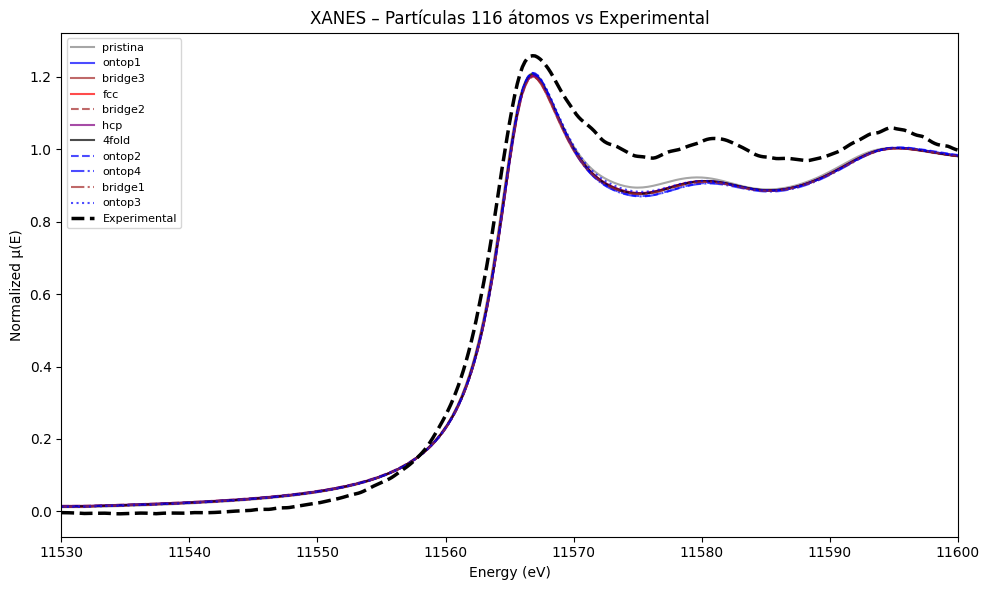


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.061332
ontop1     : RMSE = 0.067744
bridge3    : RMSE = 0.067314
fcc        : RMSE = 0.067459
bridge2    : RMSE = 0.067979
hcp        : RMSE = 0.067882
4fold      : RMSE = 0.067215
ontop2     : RMSE = 0.069099
ontop4     : RMSE = 0.070055
bridge1    : RMSE = 0.069124
ontop3     : RMSE = 0.065463

Top 3 μ(E):
1. pristina   (RMSE = 0.061332)
2. ontop3     (RMSE = 0.065463)
3. 4fold      (RMSE = 0.067215)


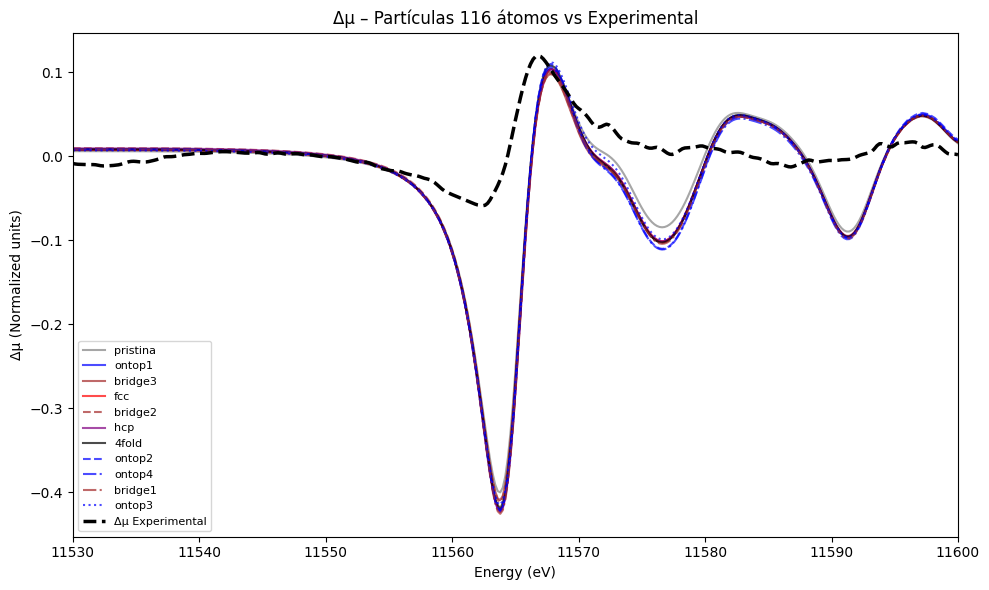


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.082822
ontop1     : RMSE = 0.088882
bridge3    : RMSE = 0.086480
fcc        : RMSE = 0.088564
bridge2    : RMSE = 0.086988
hcp        : RMSE = 0.089150
4fold      : RMSE = 0.088063
ontop2     : RMSE = 0.089513
ontop4     : RMSE = 0.089549
bridge1    : RMSE = 0.090058
ontop3     : RMSE = 0.087023

Top 3 Δμ:
1. pristina   (RMSE = 0.082822)
2. bridge3    (RMSE = 0.086480)
3. bridge2    (RMSE = 0.086988)


In [14]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Corte
x_min = 11530
x_max = 11600

# Caminhos
THEORY_DIR = "normalized/116"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário de sites
site_labels_116 = {
    '00': 'pristina',
    '01': 'ontop1',
    '02': 'bridge3',
    '03': 'fcc',
    '04': 'bridge2',
    '05': 'hcp',
    '06': '4fold',
    '07': 'ontop2',
    '08': 'ontop4',
    '09': 'bridge1',
    '10': 'ontop3',
}

# Lista de cores personalizável
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}

# Lista de estilos de linha
linestyles = ['-', '--', '-.', ':']

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

# Aplica corte no eixo x
mask_exp = (exp_particle[:,0] >= x_min) & (exp_particle[:,0] <= x_max)
exp_x = exp_particle[mask_exp, 0]
exp_y_particle = exp_particle[mask_exp, 1]
exp_y_bulk = exp_bulk[mask_exp, 1]
delta_exp = exp_y_bulk - exp_y_particle  # Δμ experimental

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]  # coluna Final_normalized

# Lê os arquivos teóricos
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

#  FUNÇÃO DE ALINHAMENTO 
def align_peak(x, y, ref_x, ref_y):
    """Desloca x para alinhar pico máximo com pico da referência"""
    max_idx = np.argmax(y)
    max_x = x[max_idx]
    ref_max_idx = np.argmax(ref_y)
    ref_max_x = ref_x[ref_max_idx]
    shift = ref_max_x - max_x
    return x + shift  # apenas desloca eixo x

#  FIGURA 1: μ(E) 
plt.figure(figsize=(10, 6))
rmse_mu = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]

    # Alinha apenas as curvas teóricas ao pico da partícula experimental
    x_aligned = align_peak(x_cut, y_cut, exp_x, exp_y_particle)
    
    # Interpola para eixo experimental
    y_interp = np.interp(exp_x, x_aligned, y_cut)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_mu[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, y_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

# Curva experimental NÃO é alinhada
plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE μ(E)
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_mu = sorted(rmse_mu.items(), key=lambda x: x[1])[:3]
print("\nTop 3 μ(E):")
for i, (label, rmse) in enumerate(top3_mu, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")

#  FIGURA 2: Δμ 
plt.figure(figsize=(10, 6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]

    # Alinha apenas as curvas teóricas
    x_aligned = align_peak(x_cut, y_cut, exp_x, exp_y_particle)

    # Calcula Δμ em relação ao bulk teórico
    bulk_interp = np.interp(x_aligned, bulk_x, bulk_y)
    delta_mu = y_cut - bulk_interp

    # Interpola Δμ para eixo experimental
    delta_interp = np.interp(exp_x, x_aligned, delta_mu)
    rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_116.get(site_code, site_code)
    rmse_delta[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, delta_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

# Δμ experimental NÃO é alinhada
plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 116 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE Δμ
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
print("\nTop 3 Δμ:")
for i, (label, rmse) in enumerate(top3_delta, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


# 55

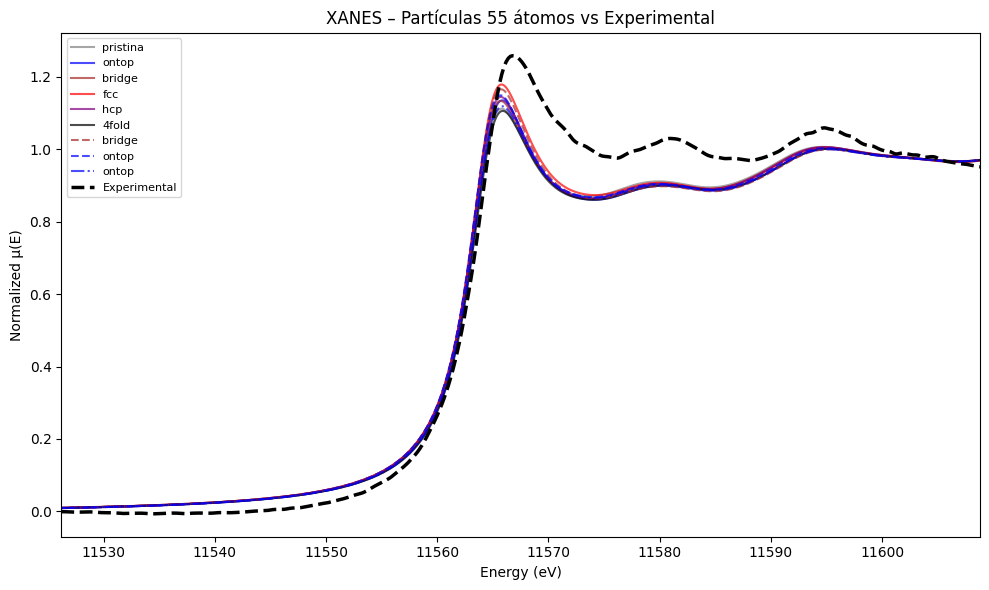


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.073382
ontop      : RMSE = 0.075047
bridge     : RMSE = 0.074654
fcc        : RMSE = 0.069686
hcp        : RMSE = 0.074557
4fold      : RMSE = 0.076811

Top 3 μ(E):
1. fcc        (RMSE = 0.069686)
2. pristina   (RMSE = 0.073382)
3. hcp        (RMSE = 0.074557)


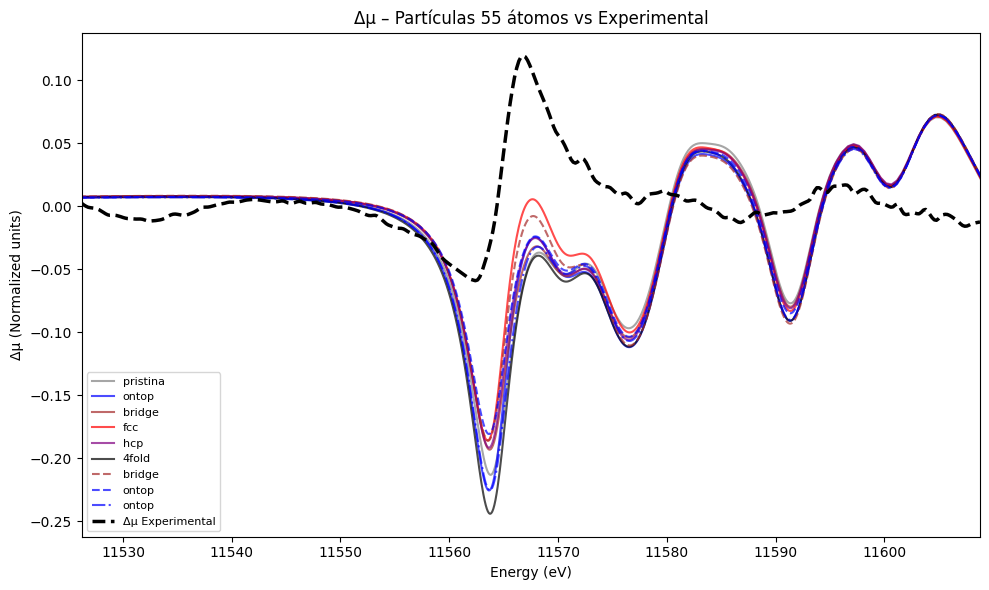


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.065540
ontop      : RMSE = 0.067025
bridge     : RMSE = 0.059409
fcc        : RMSE = 0.055594
hcp        : RMSE = 0.061870
4fold      : RMSE = 0.071045

Top 3 Δμ:
1. fcc        (RMSE = 0.055594)
2. bridge     (RMSE = 0.059409)
3. hcp        (RMSE = 0.061870)


In [15]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Caminhos
THEORY_DIR = "normalized/55"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário
site_labels_55 = {
    '00': 'pristina',
    '01': 'ontop',
    '02': 'bridge',
    '03': 'fcc',
    '04': 'hcp',
    '05': '4fold',
    '06': 'bridge',
    '07': 'ontop',
    '08': 'ontop',
}

# Lista de cores personalizável (mesma cor para tipos iguais)
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}

# Lista de estilos de linha para variantes
linestyles = ['-', '--', '-.', ':']

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

exp_x = exp_particle[:, 0]
exp_y_particle = exp_particle[:, 1]
exp_y_bulk = exp_bulk[:, 1]
delta_exp = exp_y_bulk - exp_y_particle  # Δμ experimental

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]  # coluna Final_normalized

# Lê o que simulei
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

# Figura 1: plots μ(E)
plt.figure(figsize=(10, 6))
rmse_mu = {}  # Armazena RMSE das curvas μ(E)

# Contador de variantes para estilo de linha
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Interpola para o eixo experimental
    y_interp = np.interp(exp_x, x, y)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_55.get(site_code, site_code)
    rmse_mu[label] = rmse

    # Define cor e estilo de linha
    base_label = ''.join([c for c in label if not c.isdigit()])  # Remove números para agrupar variantes
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(x, y, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 55 átomos vs Experimental")
plt.xlim(min(exp_x), max(exp_x))
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_mu = sorted(rmse_mu.items(), key=lambda x: x[1])[:3]
print("\nTop 3 μ(E):")
for i, (label, rmse) in enumerate(top3_mu, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")

# Figura 2: Δμ
plt.figure(figsize=(10, 6))
rmse_delta = {}  # Armazena RMSE das curvas Δμ
variant_count = {}  # Reinicia contador para estilos

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Interpola bulk_y
    bulk_interp = np.interp(x, bulk_x, bulk_y)
    delta_mu = y - bulk_interp
    delta_interp = np.interp(exp_x, x, delta_mu)
    rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_55.get(site_code, site_code)
    rmse_delta[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(x, delta_mu, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 55 átomos vs Experimental")
plt.xlim(min(exp_x), max(exp_x))
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
print("\nTop 3 Δμ:")
for i, (label, rmse) in enumerate(top3_delta, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


## Alinhamento

### E0

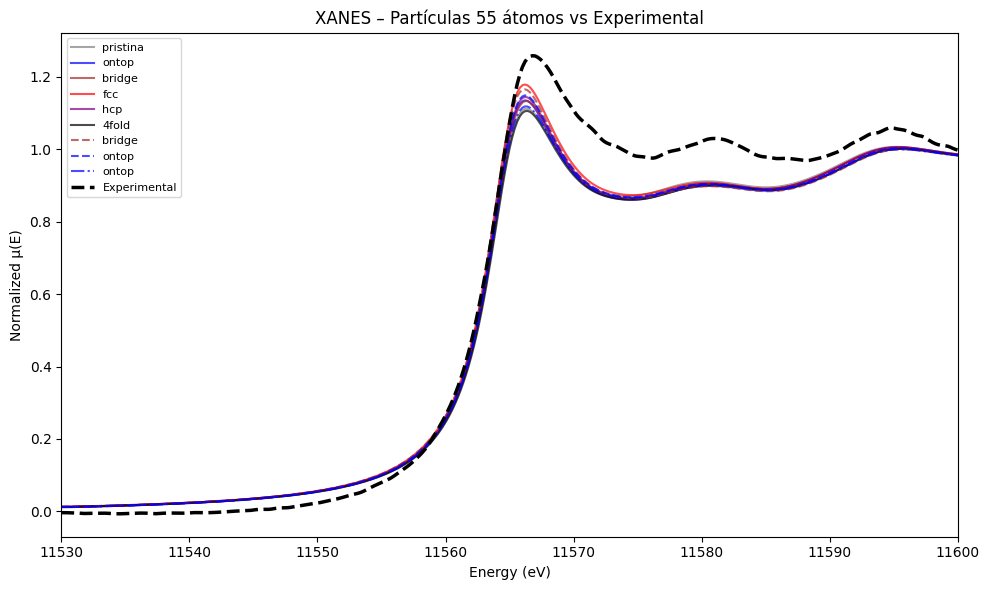


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.075112
ontop      : RMSE = 0.077907
bridge     : RMSE = 0.074995
fcc        : RMSE = 0.069210
hcp        : RMSE = 0.074702
4fold      : RMSE = 0.080952

Top 3 μ(E):
1. fcc        (RMSE=0.069210)
2. hcp        (RMSE=0.074702)
3. bridge     (RMSE=0.074995)


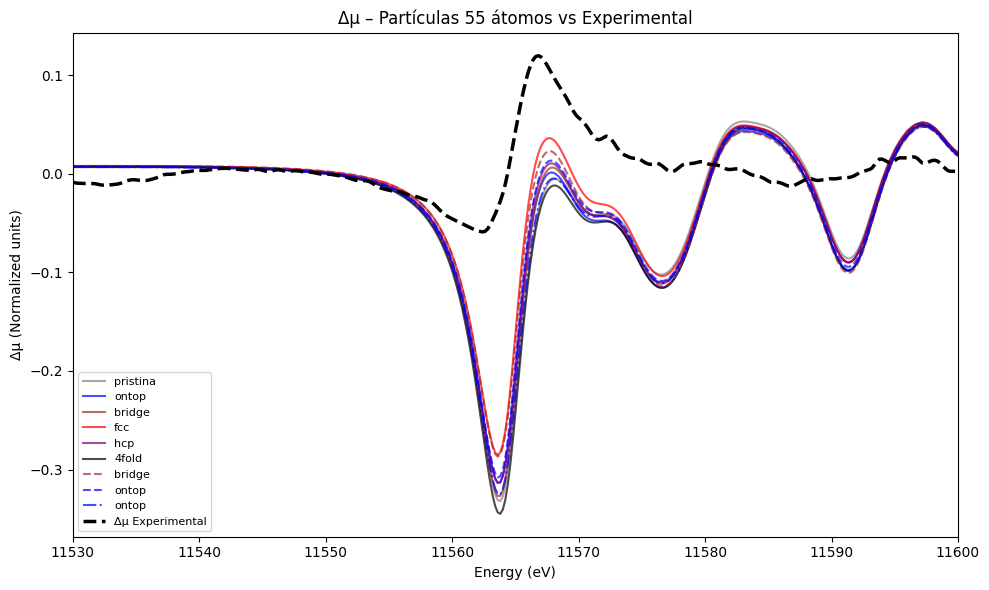


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.081696
ontop      : RMSE = 0.081257
bridge     : RMSE = 0.071335
fcc        : RMSE = 0.067744
hcp        : RMSE = 0.076752
4fold      : RMSE = 0.086291

Top 3 Δμ:
1. fcc        (RMSE=0.067744)
2. bridge     (RMSE=0.071335)
3. hcp        (RMSE=0.076752)


In [16]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Corte
x_min = 11530
x_max = 11600

# Caminhos
THEORY_DIR = "normalized/55"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário de labels
site_labels_55 = {
    '00': 'pristina',
    '01': 'ontop',
    '02': 'bridge',
    '03': 'fcc',
    '04': 'hcp',
    '05': '4fold',
    '06': 'bridge',
    '07': 'ontop',
    '08': 'ontop',
}

# Cores e estilos
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}
linestyles = ['-', '--', '-.', ':']

# find E0 da Cruzeiro do Sul
def find_E0(energies, absorption):
    # derivadas
    dydx = np.diff(absorption) / np.diff(energies)
    x_new = energies[:-1]
    dydx2 = np.diff(dydx) / np.diff(x_new)
    range_search_E0_end = int(len(energies) / 2)
    deriv_max = -np.inf
    point_max = 0
    for point in range(range_search_E0_end):
        if dydx[point] > deriv_max and dydx2[point] > 0:
            deriv_max = dydx[point]
            point_max = point
    return energies[point_max], absorption[point_max], point_max

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

mask_exp = (exp_particle[:,0] >= x_min) & (exp_particle[:,0] <= x_max)
exp_x = exp_particle[mask_exp, 0]
exp_y_particle = exp_particle[mask_exp, 1]
exp_y_bulk = exp_bulk[mask_exp, 1]
delta_exp = exp_y_bulk - exp_y_particle

# Encontra E0 experimental
E0_exp, _, _ = find_E0(exp_x, exp_y_particle)

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]

# Lê arquivos teóricos
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

# Alinhar pelo E0
def align_E0(x, y, E0_ref, energies_original):
    E0_curve, _, _ = find_E0(x, y)
    shift = E0_ref - E0_curve
    x_shifted = x + shift
    # preserva o eixo original
    x_final = np.interp(energies_original, x_shifted, x_shifted, left=np.nan, right=np.nan)
    return x_shifted

# Figura 1: Curvas
plt.figure(figsize=(10,6))
rmse_mu = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:,0]
    y = data[:,4]

    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]
    if len(x_cut)==0: continue

    x_aligned = align_E0(x_cut, y_cut, E0_exp, exp_x)

    y_interp = np.interp(exp_x, x_aligned, y_cut)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle)**2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_55.get(site_code, site_code)
    rmse_mu[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label,0)
    linestyle = linestyles[variant_count[base_label]%len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, y_interp, label=label, color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")
plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 55 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE e Top3 μ(E)
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_mu = sorted(rmse_mu.items(), key=lambda x:x[1])[:3]
print("\nTop 3 μ(E):")
for i,(label,rmse) in enumerate(top3_mu,1):
    print(f"{i}. {label:10s} (RMSE={rmse:.6f})")

# Figura 2; delta mu
plt.figure(figsize=(10,6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:,0]
    y = data[:,4]

    mask = (x>=x_min) & (x<=x_max)
    x_cut = x[mask]
    y_cut = y[mask]
    if len(x_cut)==0: continue

    x_aligned = align_E0(x_cut, y_cut, E0_exp, exp_x)

    bulk_interp = np.interp(x_aligned, bulk_x, bulk_y)
    delta_mu = y_cut - bulk_interp

    delta_interp = np.interp(exp_x, x_aligned, delta_mu)
    rmse = np.sqrt(np.mean((delta_interp - delta_exp)**2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_55.get(site_code, site_code)
    rmse_delta[label] = rmse

    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label,0)
    linestyle = linestyles[variant_count[base_label]%len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, delta_interp, label=label, color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")
plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 55 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# RMSE e Top3 Δμ
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x:x[1])[:3]
print("\nTop 3 Δμ:")
for i,(label,rmse) in enumerate(top3_delta,1):
    print(f"{i}. {label:10s} (RMSE={rmse:.6f})")


### Primeiro pico

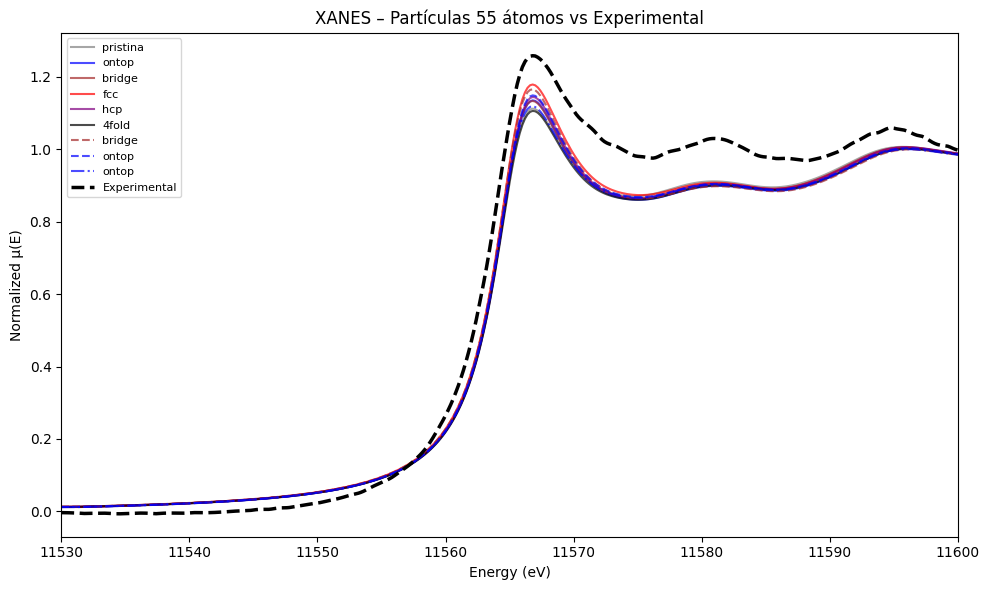


=== RMSE das curvas μ(E) ===
pristina   : RMSE = 0.079137
ontop      : RMSE = 0.081335
bridge     : RMSE = 0.076869
fcc        : RMSE = 0.071157
hcp        : RMSE = 0.078777
4fold      : RMSE = 0.085437

Top 3 μ(E):
1. fcc        (RMSE = 0.071157)
2. bridge     (RMSE = 0.076869)
3. hcp        (RMSE = 0.078777)


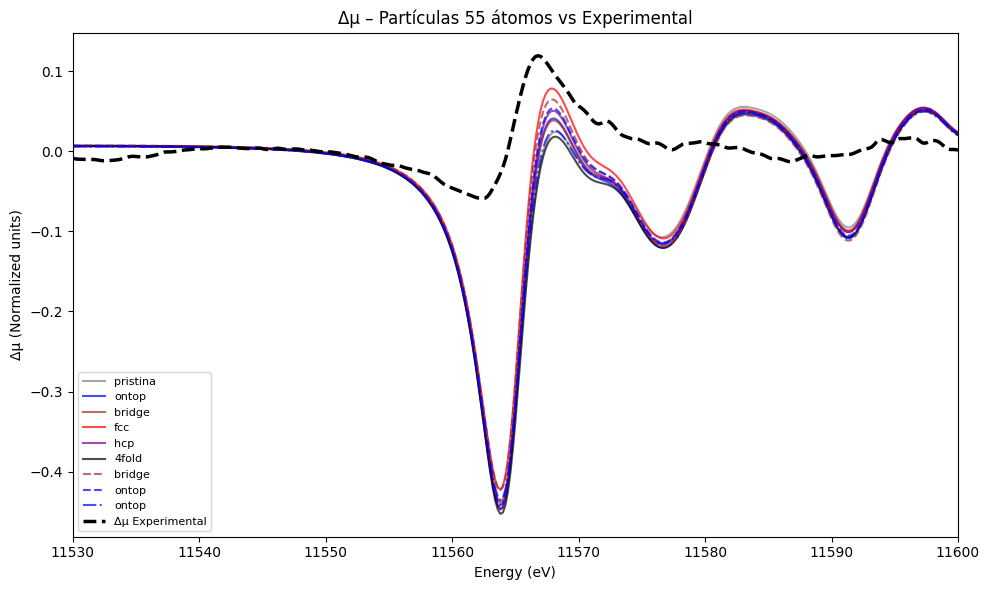


=== RMSE das curvas Δμ ===
pristina   : RMSE = 0.099966
ontop      : RMSE = 0.099331
bridge     : RMSE = 0.093939
fcc        : RMSE = 0.091494
hcp        : RMSE = 0.099450
4fold      : RMSE = 0.104257

Top 3 Δμ:
1. fcc        (RMSE = 0.091494)
2. bridge     (RMSE = 0.093939)
3. ontop      (RMSE = 0.099331)


In [17]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# Corte
x_min = 11530
x_max = 11600

# Caminhos
THEORY_DIR = "normalized/55"
BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"
EXP_PARTICLE = "normalized/experimental/XANES_Pt_MoS2(160))_Exp_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

# Dicionário
site_labels_55 = {
    '00': 'pristina',
    '01': 'ontop',
    '02': 'bridge',
    '03': 'fcc',
    '04': 'hcp',
    '05': '4fold',
    '06': 'bridge',
    '07': 'ontop',
    '08': 'ontop',
}

# Lista de cores personalizável (mesma cor para tipos iguais)
color_dict = {
    'pristina': 'gray',
    'ontop': 'b',
    'bridge': 'brown',
    'fcc': 'r',
    'hcp': 'purple',
    '4fold': 'pink',
}

# Lista de estilos de linha para variantes
linestyles = ['-', '--', '-.', ':']

# Lê experimental
exp_particle = np.loadtxt(EXP_PARTICLE)
exp_bulk = np.loadtxt(EXP_BULK)

# Aplica corte no eixo x
mask_exp = (exp_particle[:,0] >= x_min) & (exp_particle[:,0] <= x_max)
exp_x = exp_particle[mask_exp, 0]
exp_y_particle = exp_particle[mask_exp, 1]
exp_y_bulk = exp_bulk[mask_exp, 1]
delta_exp = exp_y_bulk - exp_y_particle  # Δμ experimental

# Lê Pt_bulk
bulk_data = np.loadtxt(BULK_FILE, comments="#")
bulk_x = bulk_data[:, 0]
bulk_y = bulk_data[:, 4]  # coluna Final_normalized

# Lê o que simulei
theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))

#  ALINHAR CURVAS PELO PICO 
def align_peak(x, y, ref_x, ref_y):
    """Desloca x para alinhar pico máximo com pico da referência"""
    max_idx = np.argmax(y)
    max_x = x[max_idx]
    ref_max_idx = np.argmax(ref_y)
    ref_max_x = ref_x[ref_max_idx]
    shift = ref_max_x - max_x
    return x + shift  # apenas desloca eixo x

# Figura 1: plots μ(E)
plt.figure(figsize=(10, 6))
rmse_mu = {}  # Armazena RMSE das curvas μ(E)
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Aplica corte no eixo x
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]

    # Alinha pelo pico experimental
    x_aligned = align_peak(x_cut, y_cut, exp_x, exp_y_particle)
    
    # Interpola para eixo experimental
    y_interp = np.interp(exp_x, x_aligned, y_cut)
    rmse = np.sqrt(np.mean((y_interp - exp_y_particle) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_55.get(site_code, site_code)
    rmse_mu[label] = rmse

    # Define cor e estilo de linha
    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, y_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, exp_y_particle, color='black', linestyle='--', linewidth=2.5, label="Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Normalized μ(E)")
plt.title("XANES – Partículas 55 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas μ(E) ===")
for label, rmse in rmse_mu.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_mu = sorted(rmse_mu.items(), key=lambda x: x[1])[:3]
print("\nTop 3 μ(E):")
for i, (label, rmse) in enumerate(top3_mu, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")

# Figura 2: Δμ
plt.figure(figsize=(10, 6))
rmse_delta = {}
variant_count = {}

for f in theory_files:
    data = np.loadtxt(f, comments="#")
    x = data[:, 0]
    y = data[:, 4]

    # Aplica corte
    mask = (x >= x_min) & (x <= x_max)
    x_cut = x[mask]
    y_cut = y[mask]

    # Alinha pelo pico experimental
    x_aligned = align_peak(x_cut, y_cut, exp_x, exp_y_particle)

    # Interpola bulk_y
    bulk_interp = np.interp(x_aligned, bulk_x, bulk_y)
    delta_mu = y_cut - bulk_interp

    # Interpola Δμ para eixo experimental
    delta_interp = np.interp(exp_x, x_aligned, delta_mu)
    rmse = np.sqrt(np.mean((delta_interp - delta_exp) ** 2))

    site_code = os.path.basename(f).split("_")[1]
    label = site_labels_55.get(site_code, site_code)
    rmse_delta[label] = rmse

    # Define cor e estilo
    base_label = ''.join([c for c in label if not c.isdigit()])
    color = color_dict.get(base_label, 'black')
    variant_count.setdefault(base_label, 0)
    linestyle = linestyles[variant_count[base_label] % len(linestyles)]
    variant_count[base_label] += 1

    plt.plot(exp_x, delta_interp, label=f"{label}", color=color, linestyle=linestyle, alpha=0.7)

plt.plot(exp_x, delta_exp, color='black', linestyle='--', linewidth=2.5, label="Δμ Experimental")

plt.xlabel("Energy (eV)")
plt.ylabel("Δμ (Normalized units)")
plt.title("Δμ – Partículas 55 átomos vs Experimental")
plt.xlim(x_min, x_max)
plt.legend(fontsize=8, loc="best")
plt.tight_layout()
plt.show()

# Exibe RMSE e Top 3
print("\n=== RMSE das curvas Δμ ===")
for label, rmse in rmse_delta.items():
    print(f"{label:10s} : RMSE = {rmse:.6f}")
top3_delta = sorted(rmse_delta.items(), key=lambda x: x[1])[:3]
print("\nTop 3 Δμ:")
for i, (label, rmse) in enumerate(top3_delta, 1):
    print(f"{i}. {label:10s} (RMSE = {rmse:.6f})")


# Plots úteis

In [32]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter


def new_experimental_116_top(EXP_PARTICLE, EXP_BULK, energy_min=None, energy_max=None,
                             smooth=True, window_length=11, polyorder=3):
    """
    Compara espectros teóricos (116 átomos) com dados experimentais (Δμ),
    e plota os dois melhores (menores RMSE).

    Parâmetros:
      EXP_PARTICLE: caminho do espectro experimental da partícula
      EXP_BULK: caminho do espectro experimental do bulk
      energy_min, energy_max: limites de energia para corte
      smooth: ativa/desativa suavização experimental (Δμ)
      window_length, polyorder: parâmetros do filtro Savitzky–Golay
    """

    THEORY_DIR = "normalized/116"
    BULK_FILE = "normalized/Pt_bulk/Pt_bulk_Gm2_conv_norm.txt"

    site_labels_116 = {
        '00': 'pristina',
        '01': 'ontop1',
        '02': 'bridge3',
        '03': 'fcc',
        '04': 'bridge2',
        '05': 'hcp',
        '06': '4fold',
        '07': 'ontop2',
        '08': 'ontop4',
        '09': 'bridge1',
        '10': 'ontop3',
    }

    color_dict = {
        'pristina': 'gray',
        'ontop': 'b',
        'bridge': 'brown',
        'fcc': 'r',
        'hcp': 'purple',
        '4fold': 'pink',
    }

    def get_final_norm_col(file_path):
        """Procura pela coluna 'Final_normalized' ou retorna a última coluna."""
        num_cols = None
        try:
            with open(file_path, 'r', encoding='utf-8', errors='ignore') as f:
                for line in f:
                    if not line.strip().startswith("#") and line.strip():
                        num_cols = len(line.strip().split())
                        break
        except Exception:
            num_cols = None

        found_idx = None
        with open(file_path, 'r', encoding='utf-8', errors='ignore') as f:
            for line in f:
                if "Final_normalized" in line:
                    headers = line.strip().replace("#", "").split()
                    try:
                        found_idx = headers.index("Final_normalized")
                        break
                    except ValueError:
                        continue

        if found_idx is not None and (num_cols is None or found_idx < num_cols):
            return found_idx
        return (num_cols - 1) if num_cols else 4

    # === Leitura experimental ===
    exp_particle = np.loadtxt(EXP_PARTICLE)
    exp_bulk = np.loadtxt(EXP_BULK)
    exp_x = exp_particle[:, 0]
    exp_y_particle = exp_particle[:, 1]
    exp_y_bulk_interp = np.interp(exp_x, exp_bulk[:, 0], exp_bulk[:, 1])
    delta_exp = exp_y_bulk_interp - exp_y_particle

    # === Corte de energia experimental ===
    if energy_min is not None or energy_max is not None:
        mask = np.ones_like(exp_x, dtype=bool)
        if energy_min is not None:
            mask &= exp_x >= energy_min
        if energy_max is not None:
            mask &= exp_x <= energy_max
        exp_x = exp_x[mask]
        delta_exp = delta_exp[mask]

    # === Suavização ===
    if smooth and len(delta_exp) > 5:
        if window_length >= len(delta_exp):
            window_length = len(delta_exp) - 1 if len(delta_exp) % 2 == 0 else len(delta_exp)
        delta_exp_smooth = savgol_filter(delta_exp, window_length, polyorder)
    else:
        delta_exp_smooth = delta_exp

    # === Bulk teórico ===
    bulk_data = np.loadtxt(BULK_FILE, comments="#")
    bulk_x = bulk_data[:, 0]
    bulk_col = get_final_norm_col(BULK_FILE)
    bulk_y = bulk_data[:, bulk_col]

    # === RMSE para cada sítio ===
    theory_files = sorted(glob.glob(os.path.join(THEORY_DIR, "*.txt")))
    rmse_delta = {}

    for f in theory_files:
        data = np.loadtxt(f, comments="#")
        x = data[:, 0]
        col = get_final_norm_col(f)
        y = data[:, col]

        bulk_interp = np.interp(x, bulk_x, bulk_y)
        delta_mu = y - bulk_interp

        # interpola no eixo experimental (cortado)
        delta_interp = np.interp(exp_x, x, delta_mu)
        rmse = np.sqrt(np.mean((delta_interp - delta_exp_smooth) ** 2))

        site_code = os.path.basename(f).split("_")[1]
        label = site_labels_116.get(site_code, site_code)
        rmse_delta[label] = (rmse, f)

    # === Seleciona top 2 ===
    sorted_rmse = sorted(rmse_delta.items(), key=lambda x: x[1][0])
    top2 = sorted_rmse[:2]

    print("\nTop 2 melhores Δμ:")
    for i, (label, (rmse, path)) in enumerate(top2, 1):
        print(f"{i}º: {label}  (RMSE = {rmse:.6f})  -> {path}")

    # === Plot ===
    plt.figure(figsize=(10, 6))

    for i, (label, (rmse, path)) in enumerate(top2, 1):
        data = np.loadtxt(path, comments="#")
        x = data[:, 0]
        col = get_final_norm_col(path)
        y = data[:, col]
        bulk_interp = np.interp(x, bulk_x, bulk_y)
        delta_mu = y - bulk_interp

        # aplica o mesmo corte de energia
        if energy_min is not None or energy_max is not None:
            mask_theory = np.ones_like(x, dtype=bool)
            if energy_min is not None:
                mask_theory &= x >= energy_min
            if energy_max is not None:
                mask_theory &= x <= energy_max
            x = x[mask_theory]
            delta_mu = delta_mu[mask_theory]

        base_label = ''.join([c for c in label if not c.isdigit()])
        color = color_dict.get(base_label, f"C{i}")
        plt.plot(x, delta_mu, lw=2, label=f"{i}º {label} (RMSE={rmse:.4f})", color=color)

    # Δμ experimental
    plt.plot(exp_x, delta_exp_smooth, color='black', linestyle='--', lw=2.5,
             label="Δμ experimental (smoothed)" if smooth else "Δμ experimental")

    plt.xlim(energy_min, energy_max)
    plt.xlabel("Energy (eV)")
    plt.ylabel("Δμ (Normalized units)")
    plt.title("Δμ – Top 2 melhores ajustes (116 átomos)")
    plt.legend(fontsize=9, loc="best")
    plt.tight_layout()
    plt.show()



Top 2 melhores Δμ:
1º: pristina  (RMSE = 0.022551)  -> normalized/116\116_00_norm.txt
2º: ontop3  (RMSE = 0.027586)  -> normalized/116\116_10_norm.txt


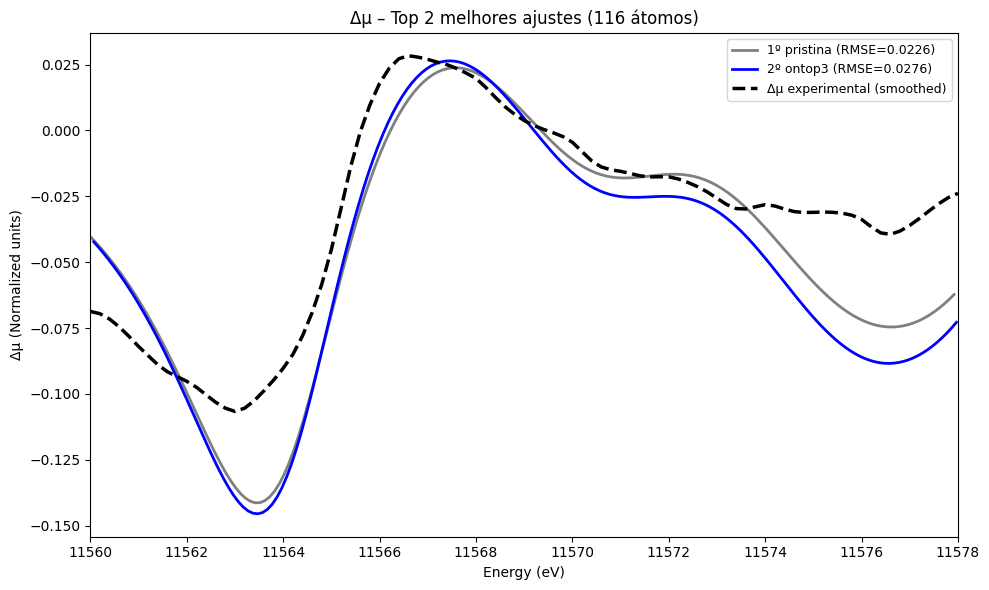

In [33]:
EXP_PARTICLE = "normalized/new_experimental/interp_Pt_MoS_Iso_330mV_norm.txt"
EXP_BULK = "normalized/experimental/XANES_Pt_Foil(MoS2)_Exp_norm.txt"

new_experimental_116_top(EXP_PARTICLE, EXP_BULK, energy_min=11560, energy_max=11578
                    , smooth=True, window_length=11, polyorder=3)